In [1]:
import os
import librosa
# import pydub
from pydub import AudioSegment
import numpy as np
import copy
import random
from scipy import signal as scipy_signal
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import datetime

from torch.utils.tensorboard import SummaryWriter

import threading
import time

from tqdm.notebook import tqdm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay

In [2]:
dataset_dir = '/home/torooc/dataHDD2/speech_commands_v0.01/'

run_name = 'runs/hey_liku_4_layer_rnn_hidden_fc_bi_dir_512' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# run_name = 'runs/debug_' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)


In [3]:
# testing_list_path = dataset_dir + 'testing_list.txt'
# validation_list_path = dataset_dir + 'validation_list.txt'

testing_list_path = dataset_dir + 'testing_list_liku.txt'
validation_list_path = dataset_dir + 'validation_list_liku.txt'


In [4]:
with open(testing_list_path) as f:
    testing_list = f.readlines()
    testing_list = [file.strip() for file in testing_list]
    
with open(validation_list_path) as f:
    validation_list = f.readlines()
    validation_list = [file.strip() for file in validation_list]

In [5]:
command_dirs = os.listdir(dataset_dir)

command_dirs = [direc for direc in command_dirs if os.path.isdir(os.path.join(dataset_dir, direc))]

command_dirs.sort()

command_dirs.remove('_background_noise_')

In [6]:
print(command_dirs)

['_hey_liku', 'bed', 'bird', 'cat', 'dog', 'down', 'eight', 'five', 'four', 'go', 'happy', 'house', 'left', 'marvin', 'nine', 'no', 'off', 'on', 'one', 'right', 'seven', 'sheila', 'six', 'stop', 'three', 'tree', 'two', 'up', 'wow', 'yes', 'zero']


In [7]:
key2label_dict = dict()
label2key_list = list()

key2label_dict[' '] = 0
label2key_list.append(' ')

for i, command in enumerate(command_dirs):
    key2label_dict[command] = i + 1
    label2key_list.append(command)

In [8]:
key2label_dict

{' ': 0,
 '_hey_liku': 1,
 'bed': 2,
 'bird': 3,
 'cat': 4,
 'dog': 5,
 'down': 6,
 'eight': 7,
 'five': 8,
 'four': 9,
 'go': 10,
 'happy': 11,
 'house': 12,
 'left': 13,
 'marvin': 14,
 'nine': 15,
 'no': 16,
 'off': 17,
 'on': 18,
 'one': 19,
 'right': 20,
 'seven': 21,
 'sheila': 22,
 'six': 23,
 'stop': 24,
 'three': 25,
 'tree': 26,
 'two': 27,
 'up': 28,
 'wow': 29,
 'yes': 30,
 'zero': 31}

In [9]:
total_wav_file_list = list()

for command_dir in command_dirs:
    wav_list = os.listdir(os.path.join(dataset_dir, command_dir))
    
    wav_list_with_prefix = [os.path.join(command_dir, file_name) for file_name in wav_list]
    
    total_wav_file_list += wav_list_with_prefix

In [10]:
training_list = list(set(total_wav_file_list) - set(testing_list) - set(validation_list))
training_list.sort()


In [11]:
'''
validation_list
testing_list
training_list
'''

'\nvalidation_list\ntesting_list\ntraining_list\n'

In [12]:
audio_metadata = list()

for wav_file_name in tqdm(total_wav_file_list):
    audio = AudioSegment.from_wav(dataset_dir + wav_file_name)
    fs = audio.frame_rate
    length_in_samples = audio.frame_count()
    
#   normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15
    
#   print("Max: {}, Min: {}".format(max(normalized_audio_array), min(normalized_audio_array)))
    
    audio_metadata.append([fs, length_in_samples])

In [13]:
SR = 16000

class DatasetLoader():
    
    def __init__(self, batch_size, dataset_dir, wav_file_name_list, key2label, label2key, is_train):
        self.batch_size = batch_size
        self.dataset_dir = dataset_dir
        self.wav_file_name_list = copy.deepcopy(wav_file_name_list)
        self.sr = SR
        self.nsc_in_ms = 40
#         self.nov_in_ms = self.nsc_in_ms / 2
        self.nov_in_ms = 0
        self.nsc_in_sample = int(self.nsc_in_ms / 1000 * self.sr)
        self.nov_in_sample = int(self.nov_in_ms / 1000 * self.sr)
        
        self.key2label = key2label
        self.label2key = label2key
        
        self.spectrogram_list = list()
        self.label_list = list()
        
        self.lock = threading.RLock()
        
        self.num_thread = 4
        
        self.loading_counter = 0
        
        self.dataset_number = len(self.wav_file_name_list)
        
        self.is_train = is_train
        
    def shuffle_dataset_order(self):
        random.shuffle(self.wav_file_name_list)
        
    def load_dataset(self):
        
        self.shuffle_dataset_order()
        self.spectrogram_list = list()
        self.label_list = list()
        self.loading_counter = 0
        
        step = int(np.floor(self.dataset_number / self.num_thread))
        
        for i in range(self.num_thread):
            
            wav_file_name_list_thread = self.wav_file_name_list[i*step:(i+1)*step]
            
            if i + 1 == self.num_thread:
                wav_file_name_list_thread = self.wav_file_name_list[i*step:]
            
            thread = threading.Thread(target=self.load_spectrogram, args=(wav_file_name_list_thread,))
            thread.start()
        
    def batch_generator(self):
        
        self.load_dataset()
        x = 0
        
        while self.loading_counter < self.dataset_number or len(self.spectrogram_list) > self.batch_size:
            
            if len(self.spectrogram_list) >= self.batch_size:

                spectrogram_list = self.spectrogram_list[:self.batch_size]
                label_list = self.label_list[:self.batch_size]

                with self.lock:
                    self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                    self.label_list = self.label_list[self.batch_size:]
#                     print('[GPU Count: {}]'.format(x))
#                     x += 1

                spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
                max_time_step = max(spectrogram_time_step_list)
                freq_size = spectrogram_list[0].shape[0]
                batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

                for j, specgram in enumerate(spectrogram_list):
                    batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

                batch_label = np.asarray(label_list)

                yield batch, batch_label
            
            else:
                time.sleep(0.05)
        
        
        if len(self.spectrogram_list) > 0:

            spectrogram_list = self.spectrogram_list
            label_list = self.label_list

            with self.lock:
                self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                self.label_list = self.label_list[self.batch_size:]
#                 print('[GPU Count: {}]'.format(x))
#                 x += 1

            spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
            max_time_step = max(spectrogram_time_step_list)
            freq_size = spectrogram_list[0].shape[0]
            batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

            for j, specgram in enumerate(spectrogram_list):
                batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

            batch_label = np.asarray(label_list)

            yield batch, batch_label
        
        return 0
    

    def load_spectrogram(self, wav_file_name_list_part):

        for i, wav_file_name in enumerate(wav_file_name_list_part):

            audio = AudioSegment.from_wav(self.dataset_dir + wav_file_name)

            normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15

            f, t, Zxx = scipy_signal.stft(normalized_audio_array, fs=self.sr, 
                                          nperseg=self.nsc_in_sample,
                                          noverlap=self.nov_in_sample)

            Sxx = np.abs(Zxx)

            normalized_spectrogram = (20 * np.log10(np.maximum(Sxx, 1e-8)) + 160) / 160
            
            ###
            if self.is_train:
                normalized_spectrogram += (np.random.random(normalized_spectrogram.shape) - 0.5)/10
                normalized_spectrogram = np.clip(normalized_spectrogram, 0, None)

            ###
            
            keyword = wav_file_name.split('/')[0]
            label = self.key2label[keyword]
            
            with self.lock:
                self.spectrogram_list.append(normalized_spectrogram)
                self.label_list.append(label)
                self.loading_counter += 1
#                 print('[Dataset Count: {}] [Specgram Length: {}]'.format(self.loading_counter, len(self.spectrogram_list)))
            

In [14]:
len(training_list)

52067

In [15]:
dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

# dataset_loader_testing = DatasetLoader(64, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(64, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(512, dataset_dir, training_list, key2label_dict, label2key_list)
# dataset_loader_testing = DatasetLoader(512, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(512, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
# dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
# dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

In [16]:
# batch_generator = dataset_loader_training.batch_generator()

In [17]:
# class basic_model(nn.Module):
#     def __init__(self, D_in, H, num_layers, num_labels):
#         super(basic_model, self).__init__()
#         self.fc = torch.nn.Linear(D_in, H)
#         self.relu = torch.nn.ReLU()
#         self.dropout = nn.Dropout(p=0.2)

#         self.gru_layers = nn.ModuleList([nn.GRU(H, int(H / 2), bidirectional=True, batch_first=True) for i in range(num_layers)])

#         self.fc_pred = nn.Linear(H, num_labels)
#         self.log_softmax = nn.LogSoftmax(dim=2)
        
#     def forward(self, input_tensor):
#         # (B, T, F)
#         output_tensor = self.fc(input_tensor)
#         output_tensor = self.relu(output_tensor)
#         output_tensor = self.dropout(output_tensor)
#         # (B, T, H)
#         for layer in self.gru_layers:
#             output_tensor, _ = layer(output_tensor)
            
#         output_tensor = self.fc_pred(output_tensor)

#         output_tensor = self.log_softmax(output_tensor)
        
#         return output_tensor

class basic_conv_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_conv_model, self).__init__()
        self.conv2d_1 = nn.Conv2d(1, 16, (13, 2))
        self.conv2d_2 = nn.Conv2d(16, 32, (13, 2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(4800, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)
        tensor = self.conv2d_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor = self.conv2d_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_crnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_crnn_model, self).__init__()
#         self.conv2d = nn.Conv2d(1, 128, (13, 2))
        self.conv2d_1 = nn.Conv2d(1, 64, (7, 2))
        self.conv2d_2 = nn.Conv2d(64, 64, (7, 2))
#         self.gru_1 = nn.GRU(16 * 103, 256, 1)
#         self.gru_1 = nn.GRU(128 * 103, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 33, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 99, 256, 1, bidirectional=True)
        self.gru_1 = nn.GRU(19776, 256, 1, bidirectional=True)
        self.gru_2 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_3 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_4 = nn.GRU(512, 256, 1, bidirectional=True)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 2 * 12, 31)
#         self.fc = nn.Linear(256 * 10, 31) # 5632
        self.fc = nn.Linear(256 * 48, 31) # 12288
#         self.fc = nn.Linear(256 * 22, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)  # (B, 1, F, T)
        tensor = self.conv2d_1(input_tensor) # (B, 16, F, T)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))

        tensor = self.conv2d_2(tensor) # (B, 16, F, T)
# #         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
        
        tensor = tensor.view(tensor.shape[0], -1, tensor.shape[3])
        # (B, 16 * F, T)
        
#         print('[After Reshape]: {}'.format(tensor.shape))
        
        tensor.transpose_(0, 2) # (T, F, B)
        tensor.transpose_(1, 2) # (T, B, F)

        tensor, _ = self.gru_1(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))

        tensor, _ = self.gru_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_4(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)

        tensor.transpose_(0, 1) # (B, T, F)
    
#         print('[After Reshape]: {}'.format(tensor.shape))
    
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_rnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_rnn_model, self).__init__()
#         self.gru_1 = nn.GRU(321, 128, 1, bidirectional=True)
#         self.gru_2 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_3 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_4 = nn.GRU(256, 128, 1, bidirectional=True)
        
        self.gru_1 = nn.GRU(321, 256, 1, bidirectional=True)
        self.gru_2 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_3 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_4 = nn.GRU(512, 256, 1, bidirectional=True)

#         self.gru_1 = nn.GRU(321, 256, 1, bidirectional=False)
#         self.gru_2 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_3 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_4 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_5 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_6 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_7 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_8 = nn.GRU(256, 256, 1, bidirectional=False)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 26, 31)
#         self.fc = nn.Linear(256, 31)
#         self.fc = nn.Linear(256, 32)
        self.fc = nn.Linear(512, 32)
        
    def forward(self, input_tensor):
#       input_tensor.unsqueeze_(1)
        # (B, F, T)
        input_tensor.transpose_(0, 2) # (T, F, B)
        input_tensor.transpose_(1, 2) # (T, B, F)
        tensor, _ = self.gru_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_2(tensor)

#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hidden = self.gru_4(tensor) # Hidden (2[Direction], B, H)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        '''
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True)
        
#         tensor = F.relu(hidden)
#         tensor = F.dropout(tensor, 0.1, training=True)
        
#         print(hidden.shape)
        
        tensor, _ = self.gru_5(tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_6(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_7(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hidden = self.gru_8(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        '''

        tensor = F.relu(hidden)
        tensor = F.dropout(tensor, 0.1, training=True)
        
        tensor.transpose_(0, 1) # (B, T, F)
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor

    
# model = basic_model(321, 512, 3, 31).float().to(device)
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
# dictation_loss = nn.CTCLoss().to(device)

# model = basic_crnn_model().float().to(device)  
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
        

In [18]:
class hello_edge_fc_model(nn.Module):
    def __init__(self):
        super(hello_edge_fc_model, self).__init__()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(8346, 31)
        
    def forward(self, input_tensor):
        tensor = self.flatten(input_tensor)
        tensor = self.fc(tensor)
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
# model = basic_crnn_model().float().to(device)  
model = basic_rnn_model().float().to(device)  
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [19]:
# batch_generator = dataset_loader_training.batch_generator()
# next(batch_generator)[0].shape

23:14:00.574097
#000 [Train: 3.436] [Test: 3.414] [Valid: 3.410]
#000 [Train: 0.039] [Test: 0.054] [Valid: 0.056]


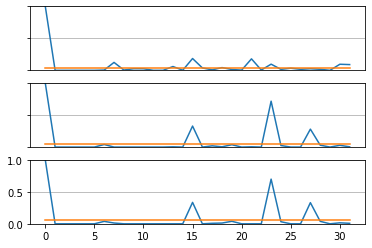

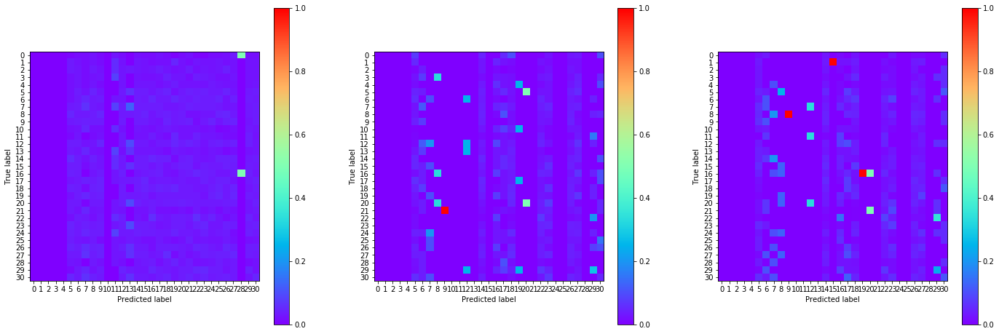

23:14:29.645364
#001 [Train: 3.279] [Test: 3.123] [Valid: 3.081]
#001 [Train: 0.089] [Test: 0.104] [Valid: 0.117]


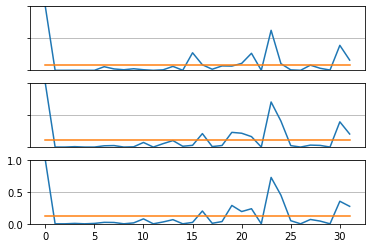

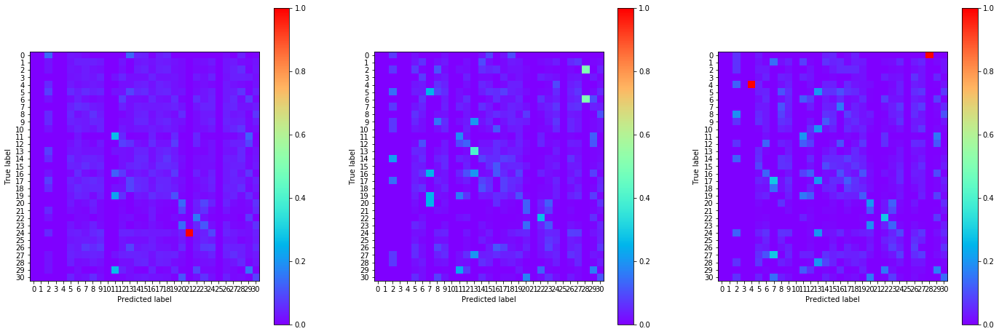

23:14:58.561618
#002 [Train: 3.024] [Test: 2.885] [Valid: 2.857]
#002 [Train: 0.123] [Test: 0.134] [Valid: 0.146]


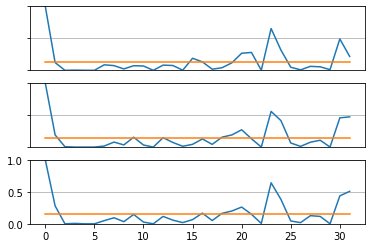

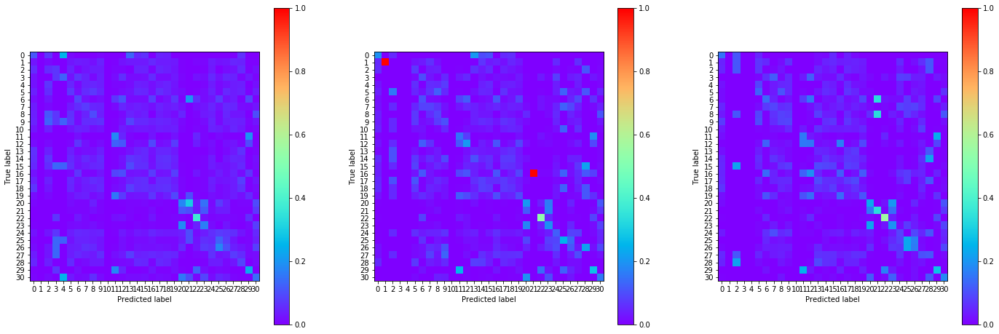

23:15:34.520912
#003 [Train: 2.807] [Test: 2.711] [Valid: 2.702]
#003 [Train: 0.154] [Test: 0.174] [Valid: 0.182]


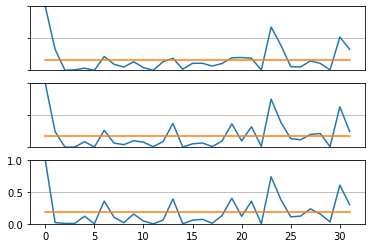

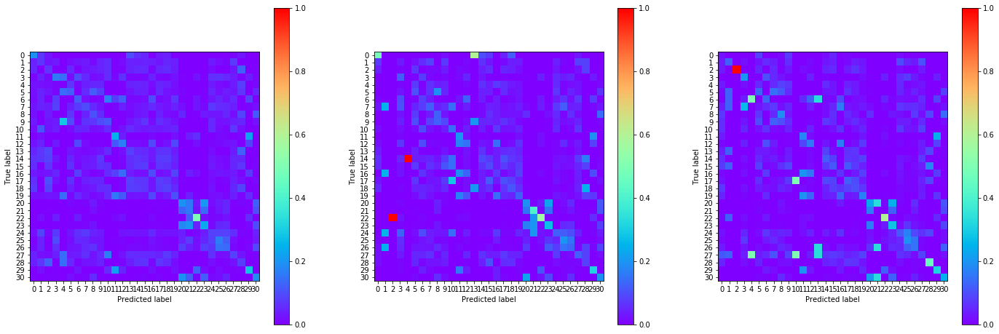

23:16:12.700595
#004 [Train: 2.637] [Test: 2.560] [Valid: 2.552]
#004 [Train: 0.196] [Test: 0.224] [Valid: 0.220]


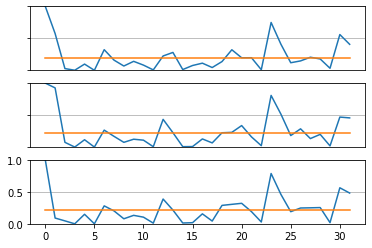

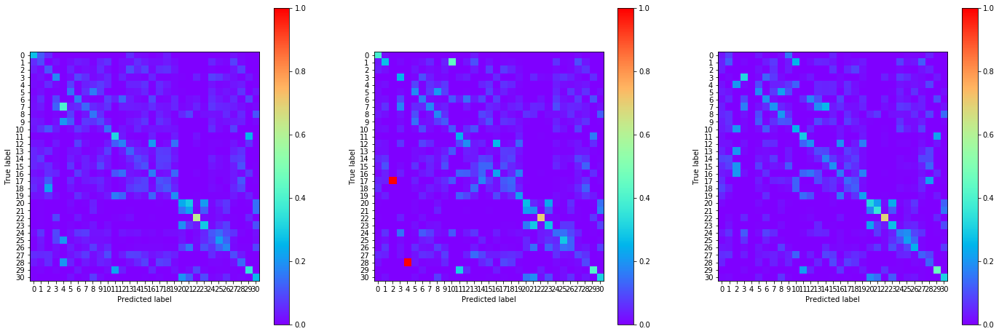

23:16:50.070694
#005 [Train: 2.469] [Test: 2.399] [Valid: 2.408]
#005 [Train: 0.239] [Test: 0.268] [Valid: 0.251]


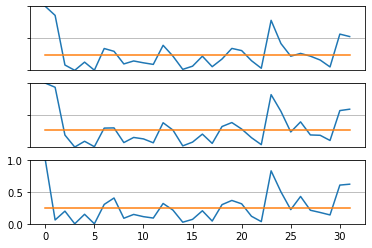

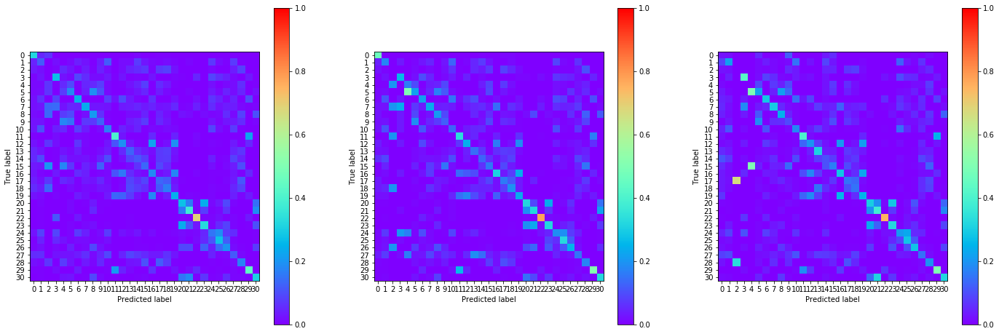

23:17:28.665703
#006 [Train: 2.322] [Test: 2.260] [Valid: 2.276]
#006 [Train: 0.275] [Test: 0.290] [Valid: 0.284]


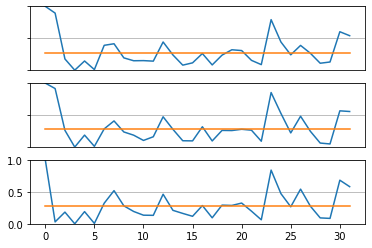

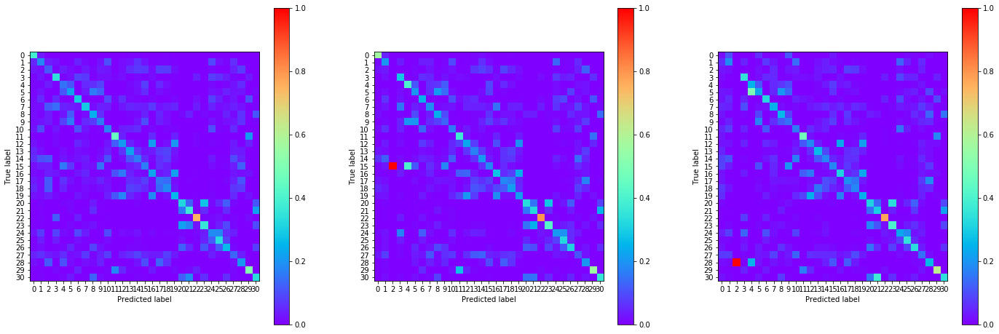

23:18:09.234958
#007 [Train: 2.184] [Test: 2.184] [Valid: 2.217]
#007 [Train: 0.317] [Test: 0.311] [Valid: 0.306]


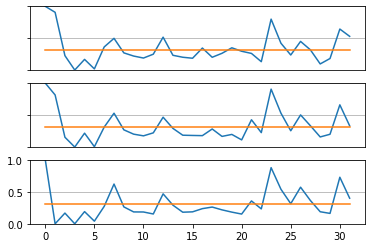

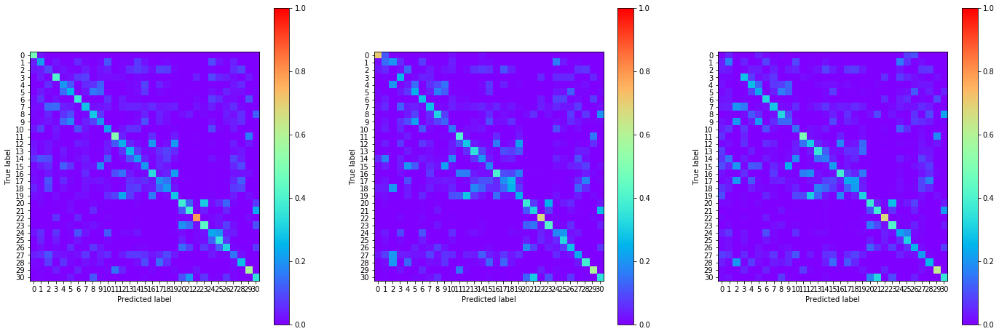

23:18:50.040953
#008 [Train: 2.054] [Test: 1.992] [Valid: 2.030]
#008 [Train: 0.361] [Test: 0.388] [Valid: 0.374]


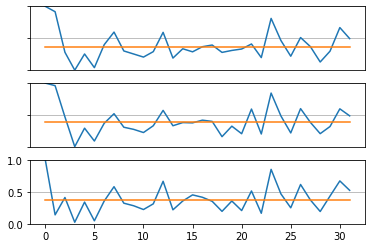

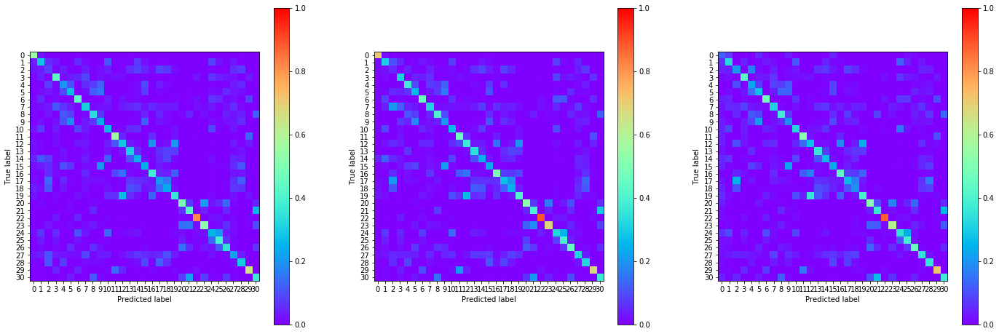

23:19:30.775724
#009 [Train: 1.896] [Test: 1.861] [Valid: 1.878]
#009 [Train: 0.417] [Test: 0.444] [Valid: 0.435]


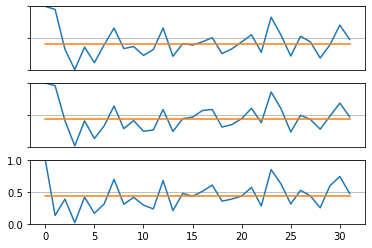

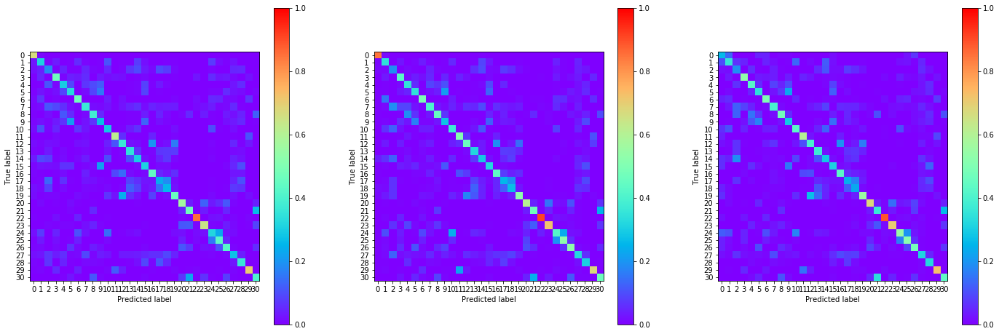

23:20:11.763325
#010 [Train: 1.748] [Test: 1.695] [Valid: 1.733]
#010 [Train: 0.471] [Test: 0.484] [Valid: 0.477]


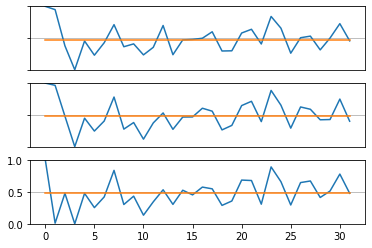

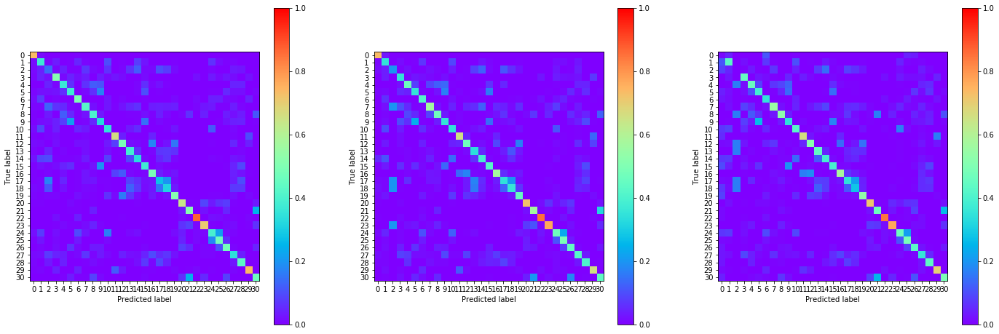

23:20:52.677715
#011 [Train: 1.595] [Test: 1.565] [Valid: 1.581]
#011 [Train: 0.519] [Test: 0.540] [Valid: 0.533]


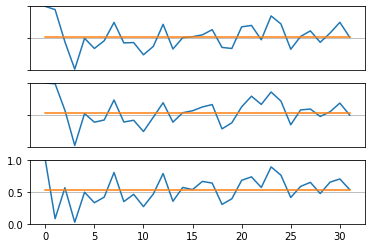

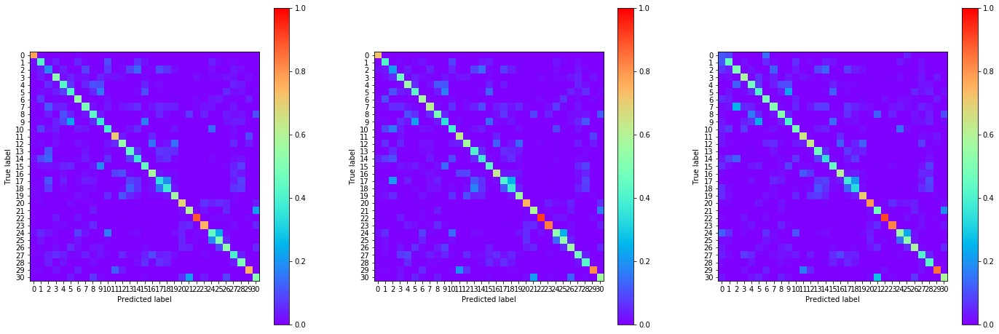

23:21:33.792090
#012 [Train: 1.459] [Test: 1.470] [Valid: 1.470]
#012 [Train: 0.561] [Test: 0.577] [Valid: 0.573]


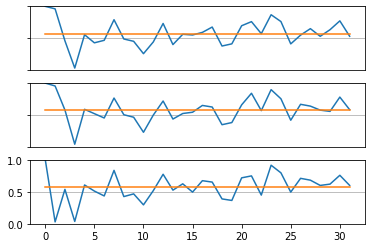

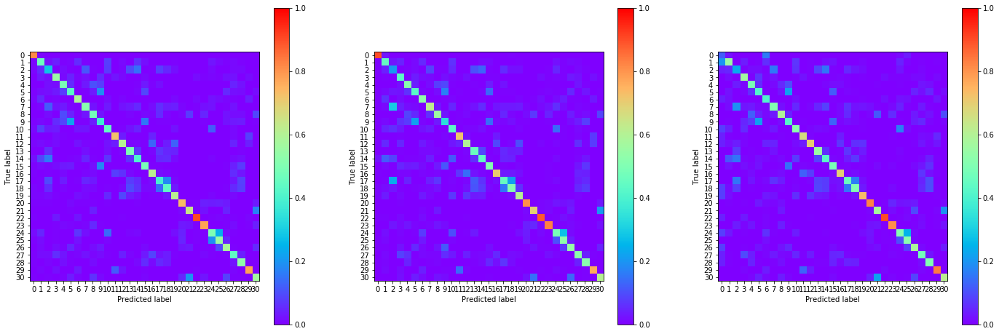

23:22:14.869287
#013 [Train: 1.350] [Test: 1.402] [Valid: 1.427]
#013 [Train: 0.596] [Test: 0.584] [Valid: 0.580]


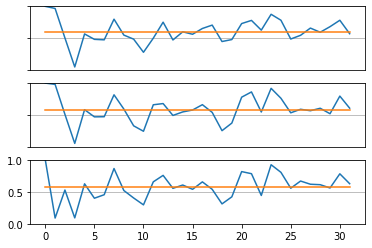

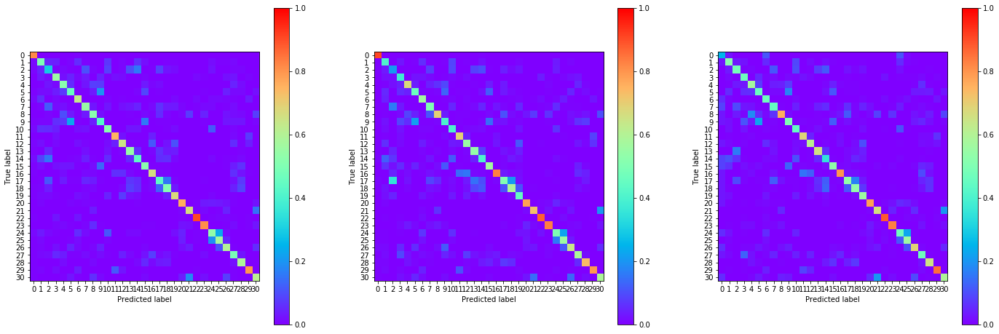

23:22:56.454504
#014 [Train: 1.239] [Test: 1.271] [Valid: 1.301]
#014 [Train: 0.630] [Test: 0.626] [Valid: 0.615]


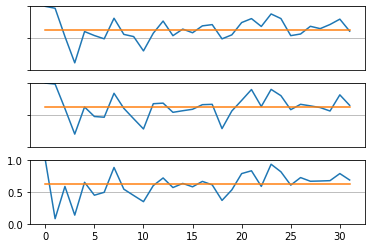

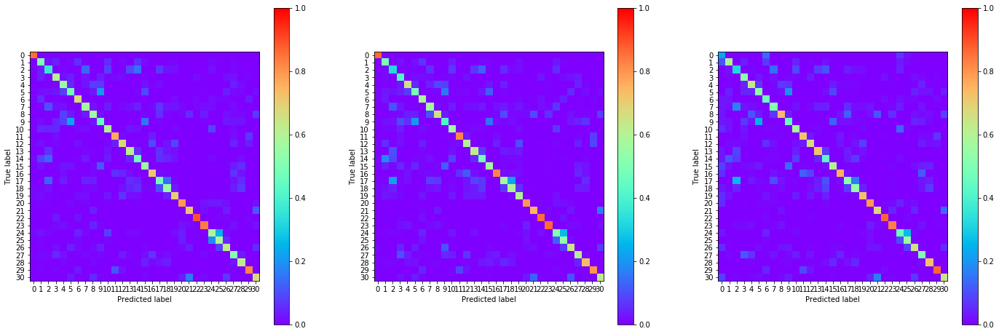

23:23:37.929862
#015 [Train: 1.145] [Test: 1.135] [Valid: 1.188]
#015 [Train: 0.660] [Test: 0.659] [Valid: 0.654]


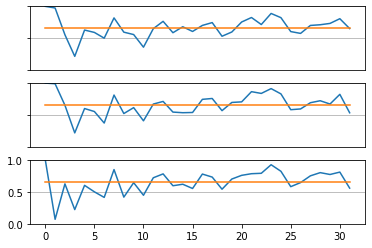

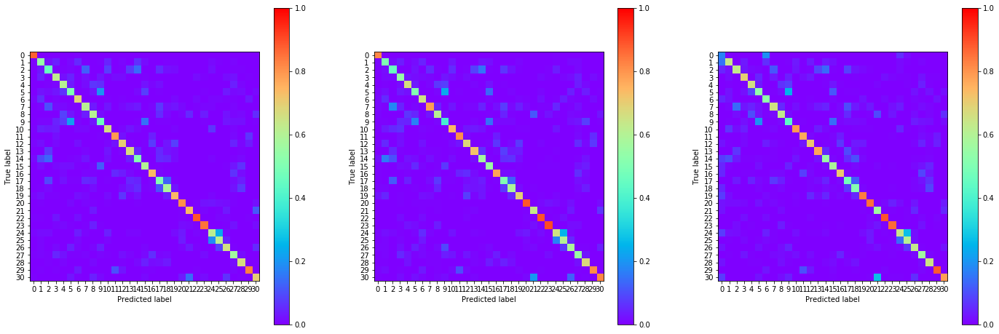

23:24:18.829986
#016 [Train: 1.062] [Test: 1.061] [Valid: 1.077]
#016 [Train: 0.686] [Test: 0.687] [Valid: 0.682]


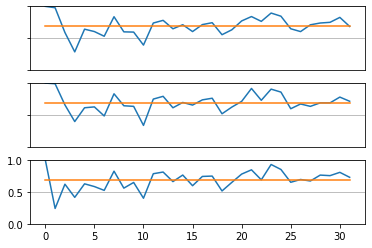

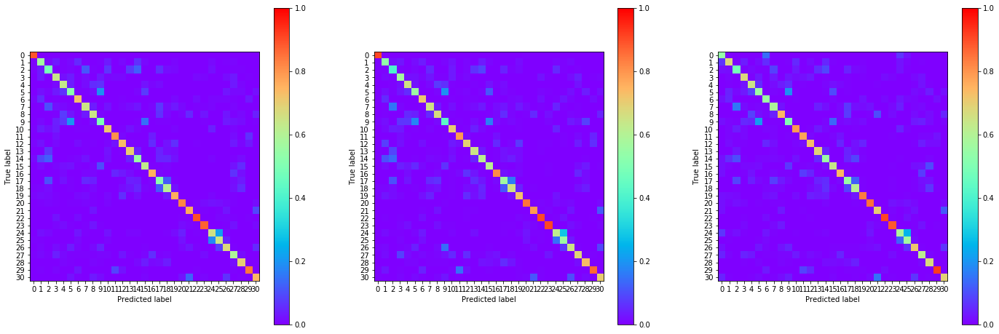

23:25:00.430285
#017 [Train: 0.988] [Test: 1.042] [Valid: 1.060]
#017 [Train: 0.707] [Test: 0.697] [Valid: 0.690]


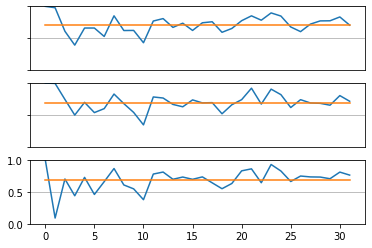

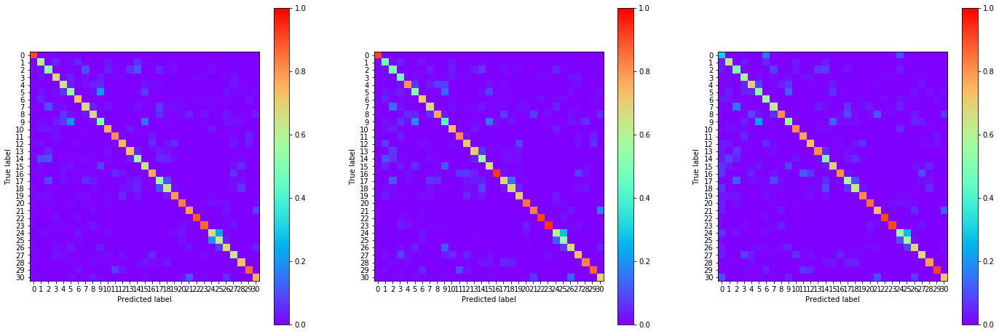

23:25:41.762498
#018 [Train: 0.925] [Test: 0.984] [Valid: 1.004]
#018 [Train: 0.727] [Test: 0.713] [Valid: 0.714]


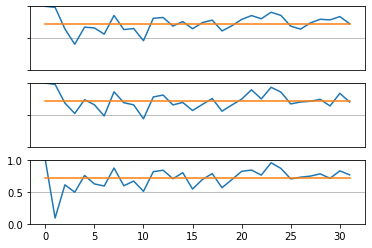

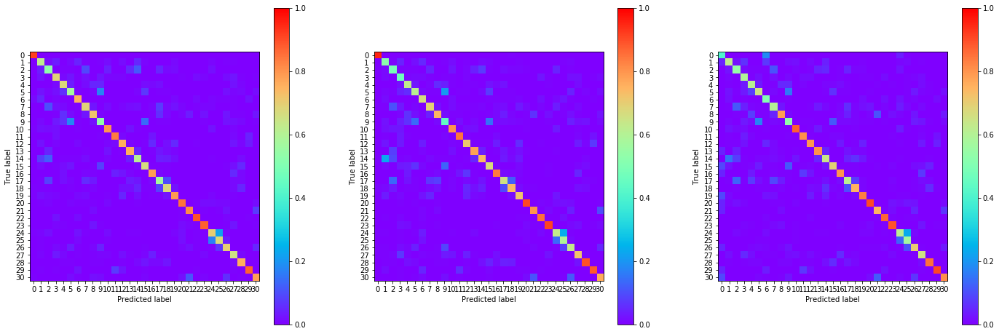

23:26:23.475476
#019 [Train: 0.878] [Test: 0.941] [Valid: 0.961]
#019 [Train: 0.740] [Test: 0.724] [Valid: 0.721]


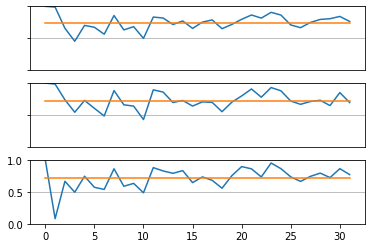

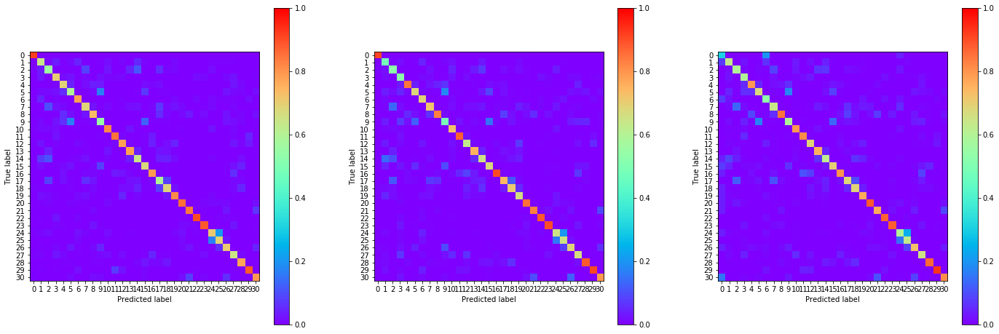

23:27:04.854439
#020 [Train: 0.826] [Test: 0.860] [Valid: 0.887]
#020 [Train: 0.755] [Test: 0.746] [Valid: 0.740]


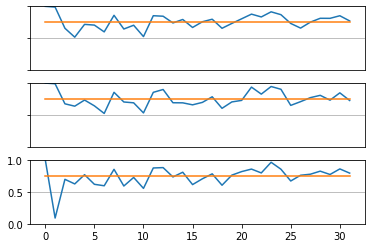

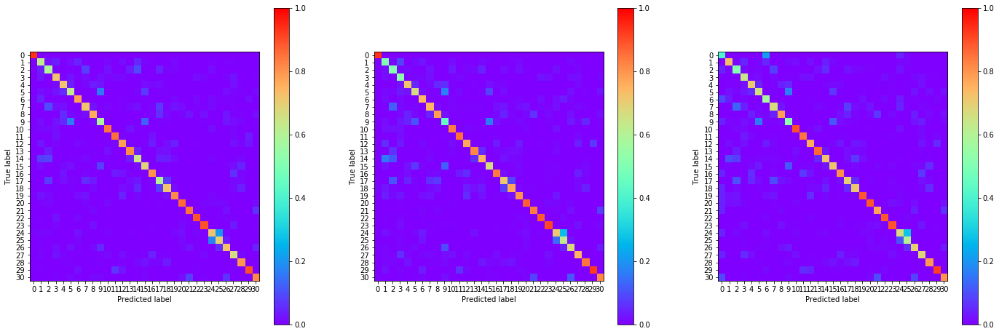

23:27:47.001141
#021 [Train: 0.777] [Test: 0.812] [Valid: 0.837]
#021 [Train: 0.771] [Test: 0.761] [Valid: 0.755]


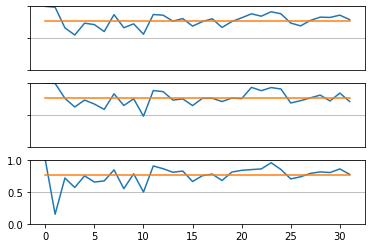

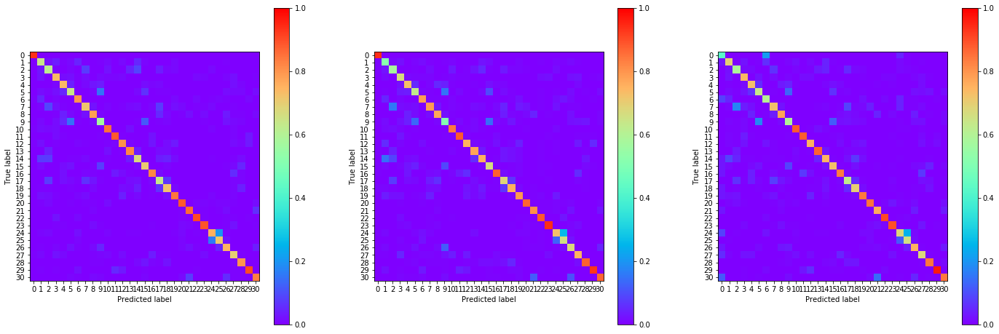

23:28:29.354713
#022 [Train: 0.743] [Test: 0.784] [Valid: 0.805]
#022 [Train: 0.781] [Test: 0.771] [Valid: 0.762]


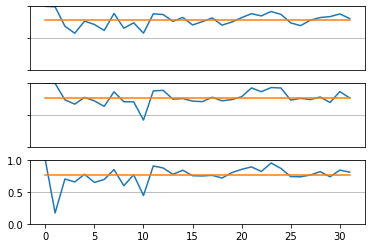

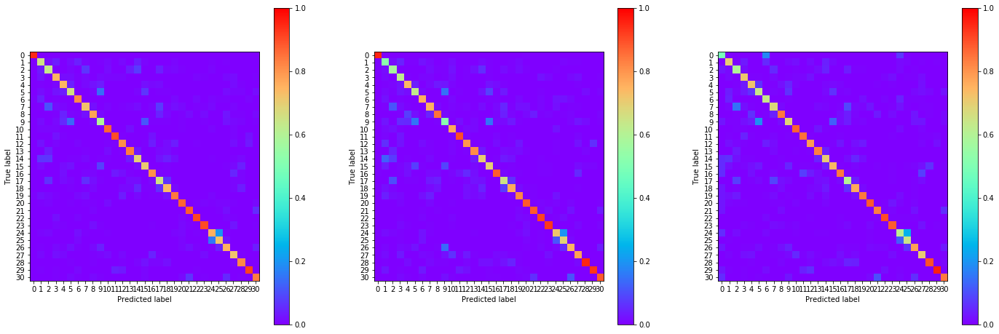

23:29:10.749591
#023 [Train: 0.709] [Test: 0.749] [Valid: 0.784]
#023 [Train: 0.791] [Test: 0.780] [Valid: 0.776]


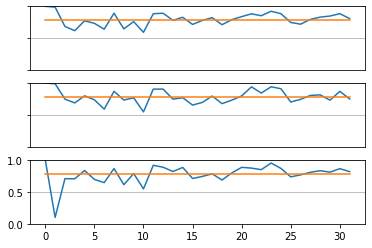

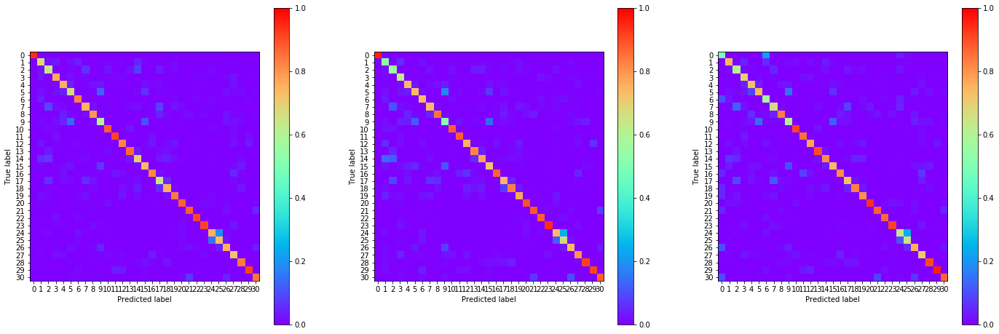

23:29:53.048898
#024 [Train: 0.688] [Test: 0.701] [Valid: 0.726]
#024 [Train: 0.795] [Test: 0.795] [Valid: 0.787]


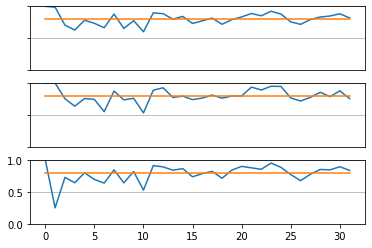

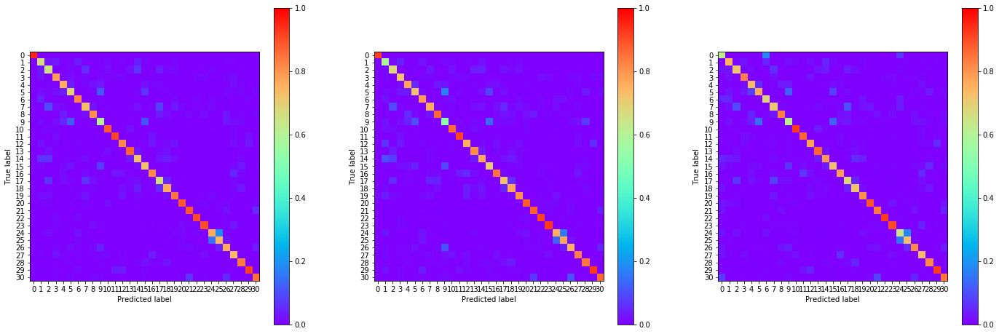

23:30:35.205510
#025 [Train: 0.648] [Test: 0.691] [Valid: 0.732]
#025 [Train: 0.808] [Test: 0.800] [Valid: 0.789]


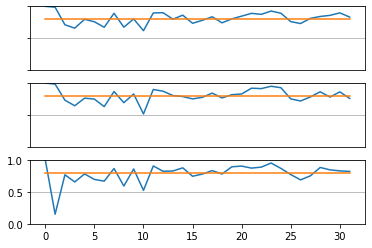

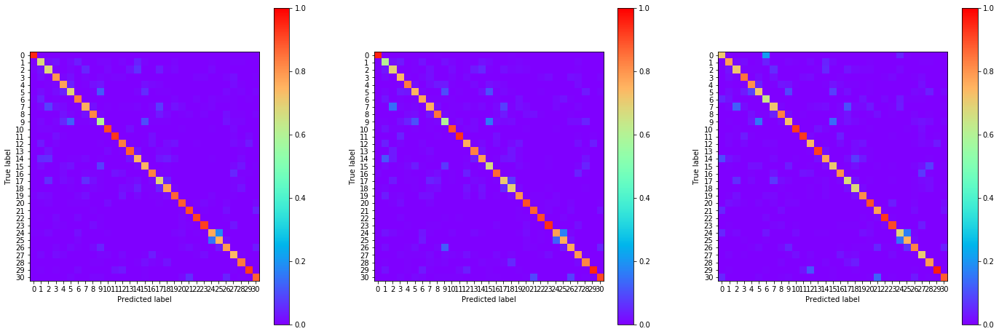

23:31:17.411533
#026 [Train: 0.617] [Test: 0.680] [Valid: 0.714]
#026 [Train: 0.819] [Test: 0.799] [Valid: 0.794]


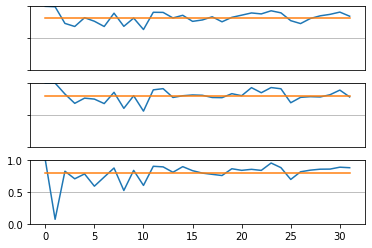

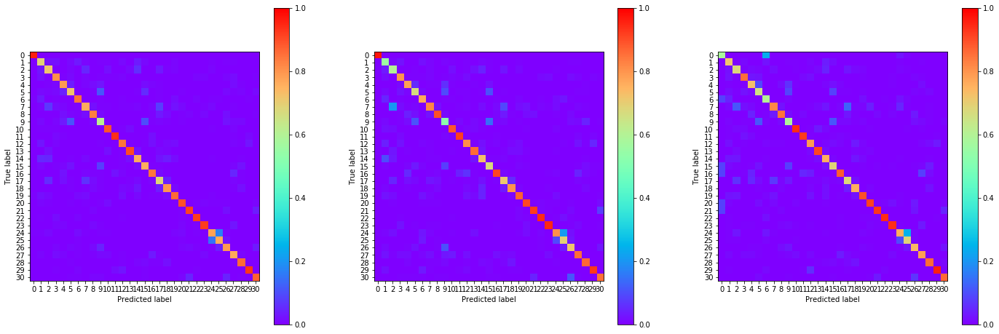

23:31:59.445297
#027 [Train: 0.597] [Test: 0.625] [Valid: 0.678]
#027 [Train: 0.823] [Test: 0.818] [Valid: 0.804]


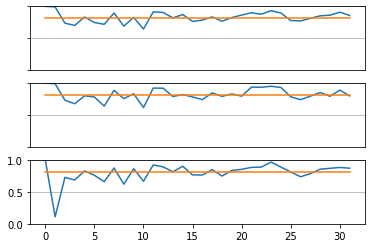

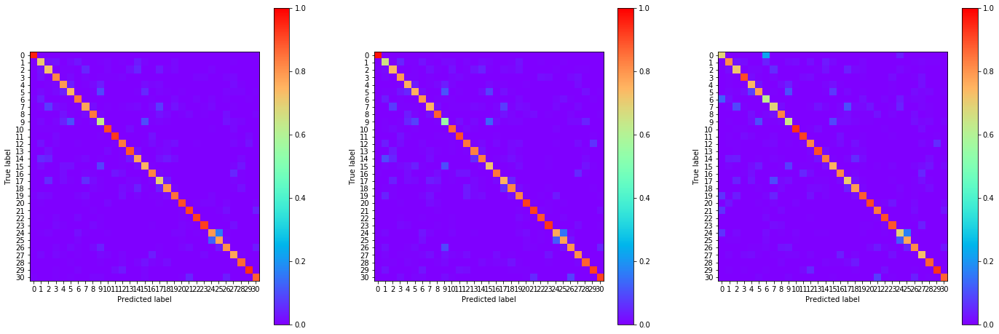

23:32:41.996330
#028 [Train: 0.574] [Test: 0.638] [Valid: 0.638]
#028 [Train: 0.831] [Test: 0.812] [Valid: 0.810]


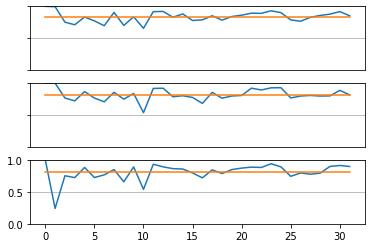

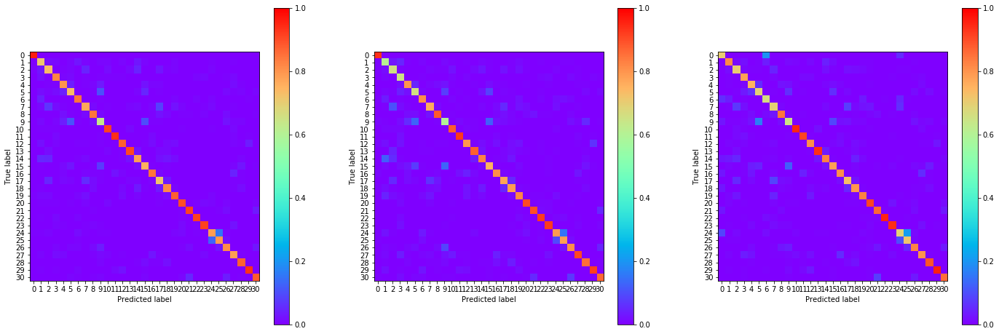

23:33:24.035148
#029 [Train: 0.550] [Test: 0.642] [Valid: 0.693]
#029 [Train: 0.838] [Test: 0.815] [Valid: 0.804]


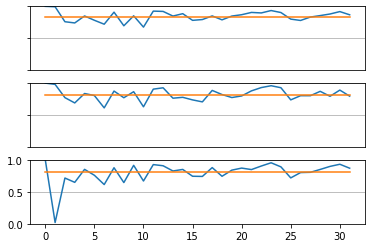

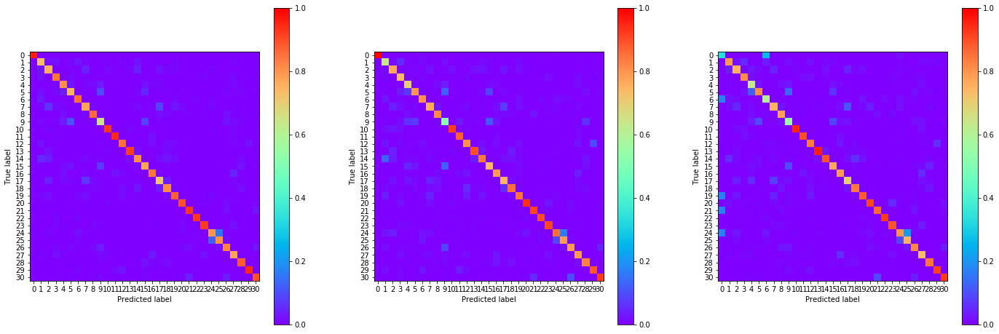

23:34:06.426776
#030 [Train: 0.530] [Test: 0.589] [Valid: 0.634]
#030 [Train: 0.844] [Test: 0.822] [Valid: 0.817]


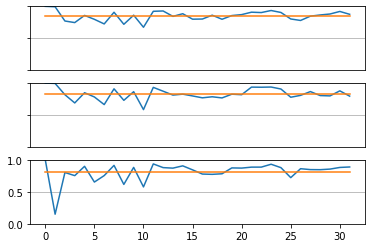

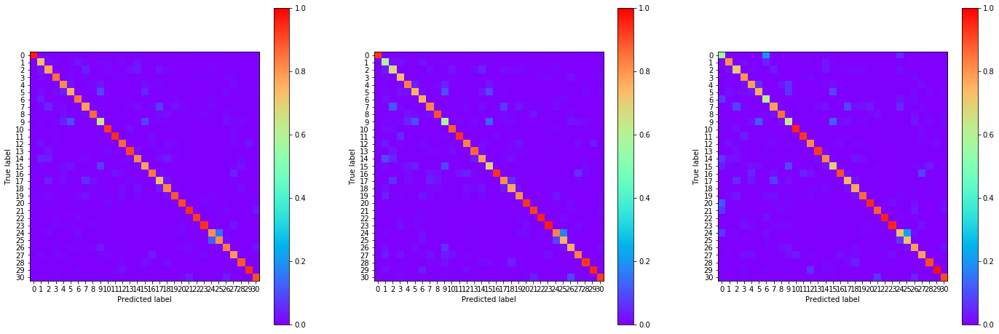

23:34:48.635357
#031 [Train: 0.509] [Test: 0.586] [Valid: 0.610]
#031 [Train: 0.851] [Test: 0.826] [Valid: 0.825]


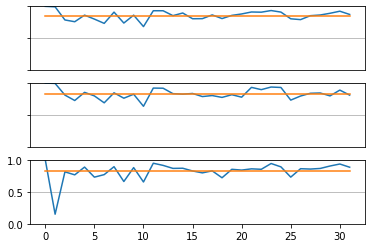

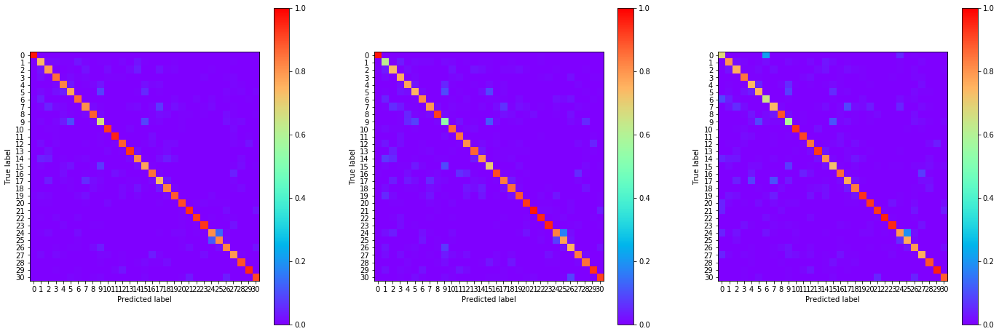

23:35:30.019399
#032 [Train: 0.496] [Test: 0.547] [Valid: 0.584]
#032 [Train: 0.855] [Test: 0.836] [Valid: 0.826]


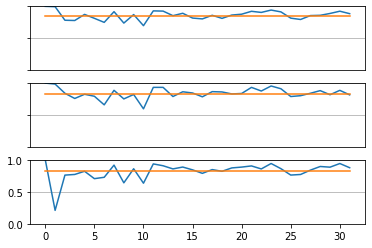

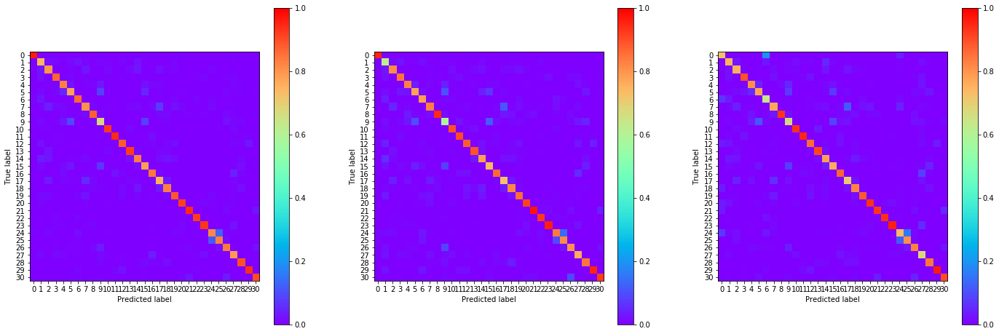

23:36:11.177147
#033 [Train: 0.480] [Test: 0.542] [Valid: 0.574]
#033 [Train: 0.858] [Test: 0.841] [Valid: 0.834]


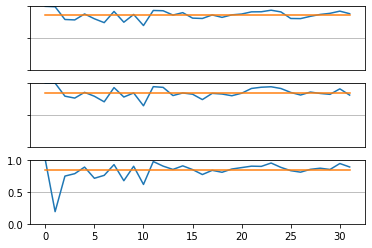

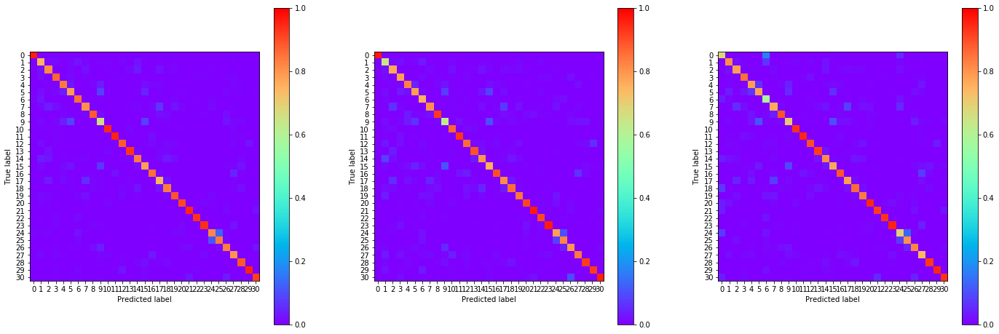

23:36:51.924622
#034 [Train: 0.471] [Test: 0.560] [Valid: 0.604]
#034 [Train: 0.861] [Test: 0.836] [Valid: 0.830]


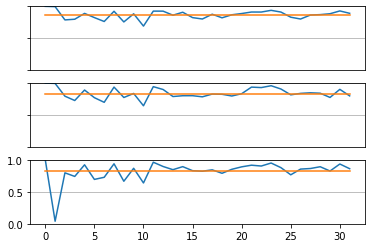

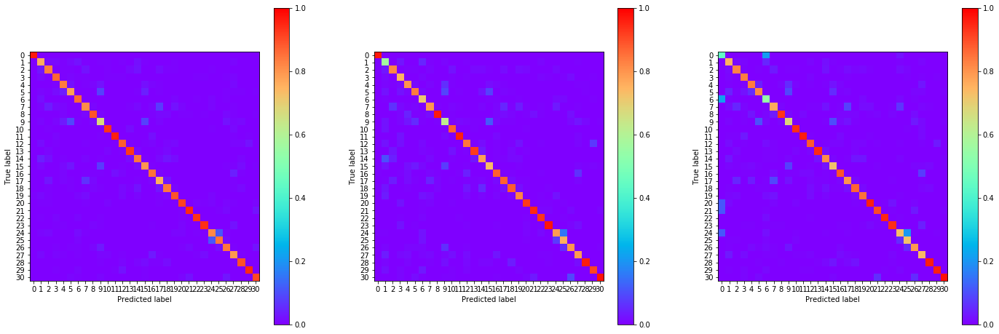

23:37:32.985320
#035 [Train: 0.456] [Test: 0.523] [Valid: 0.564]
#035 [Train: 0.864] [Test: 0.848] [Valid: 0.836]


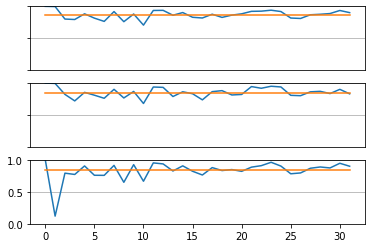

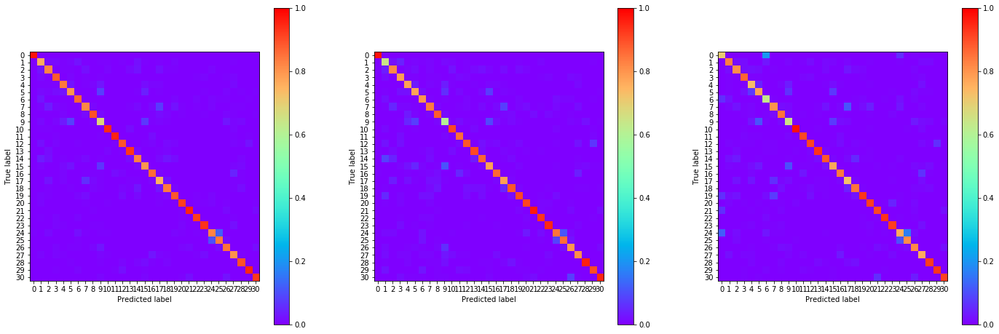

23:38:14.197108
#036 [Train: 0.438] [Test: 0.498] [Valid: 0.542]
#036 [Train: 0.871] [Test: 0.854] [Valid: 0.840]


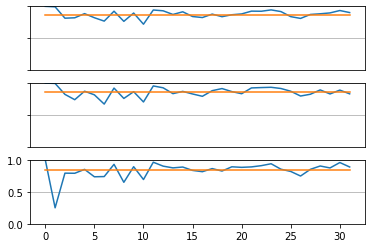

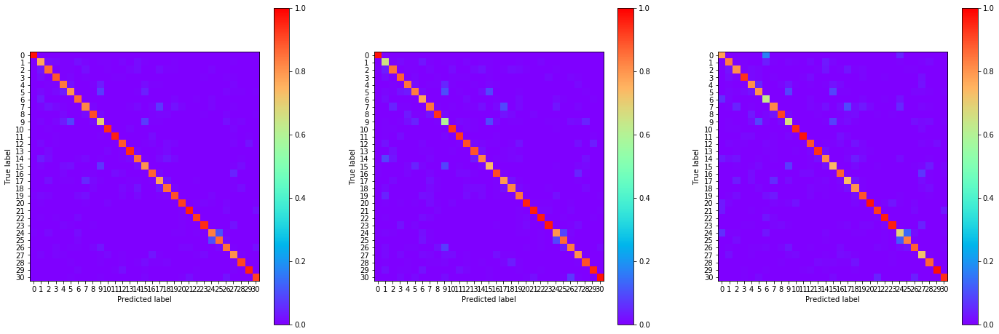

23:38:55.246187
#037 [Train: 0.421] [Test: 0.472] [Valid: 0.536]
#037 [Train: 0.875] [Test: 0.852] [Valid: 0.846]


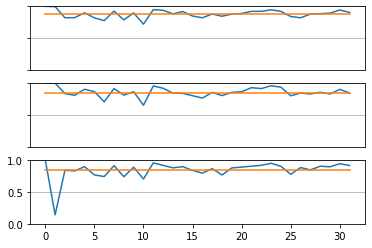

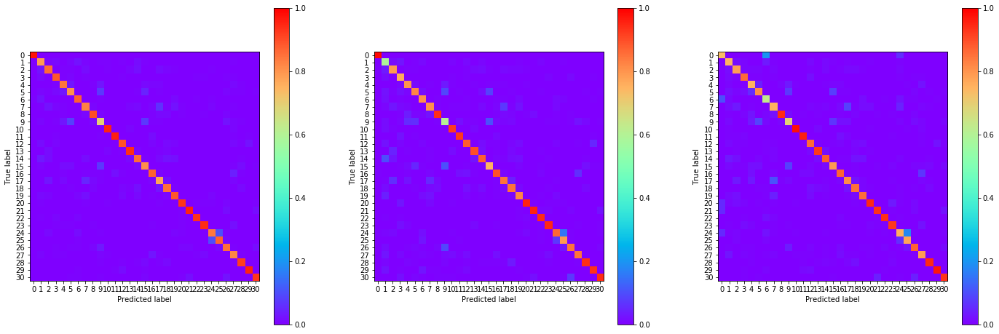

23:39:36.719963
#038 [Train: 0.412] [Test: 0.463] [Valid: 0.500]
#038 [Train: 0.878] [Test: 0.864] [Valid: 0.850]


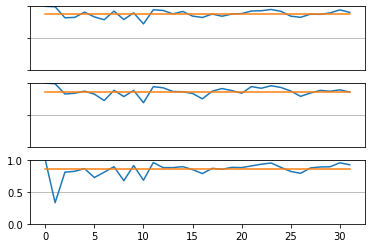

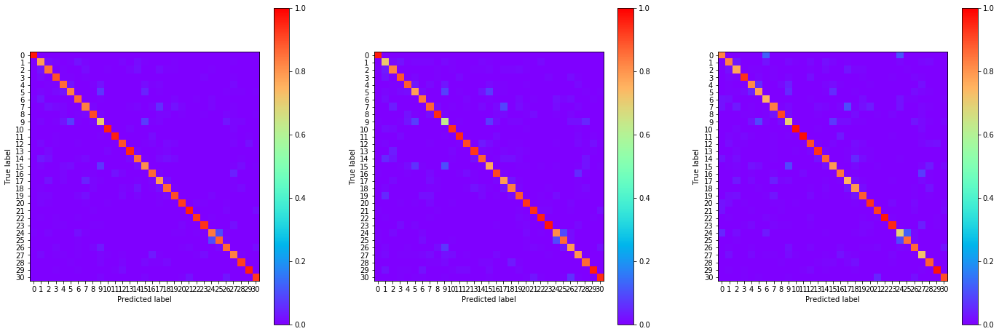

23:40:17.615449
#039 [Train: 0.400] [Test: 0.471] [Valid: 0.486]
#039 [Train: 0.882] [Test: 0.862] [Valid: 0.851]


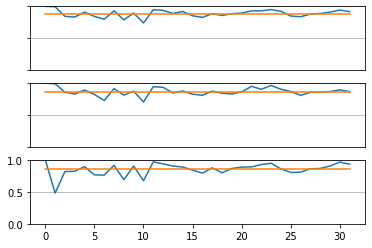

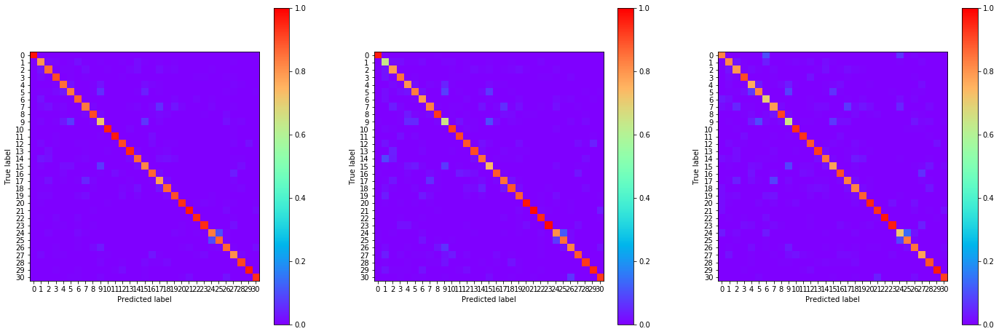

23:40:58.839769
#040 [Train: 0.401] [Test: 0.482] [Valid: 0.510]
#040 [Train: 0.880] [Test: 0.860] [Valid: 0.852]


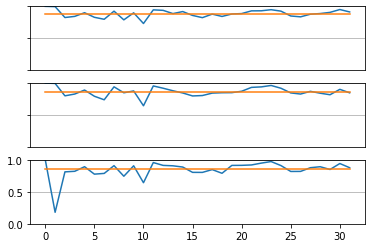

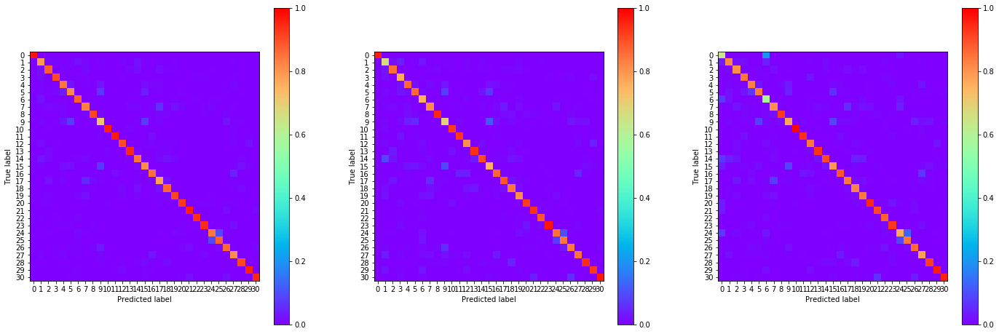

23:41:39.985906
#041 [Train: 0.384] [Test: 0.464] [Valid: 0.470]
#041 [Train: 0.886] [Test: 0.864] [Valid: 0.860]


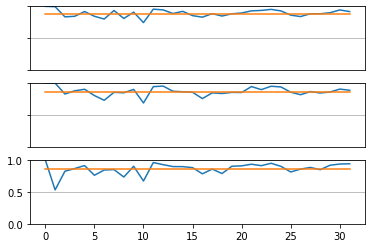

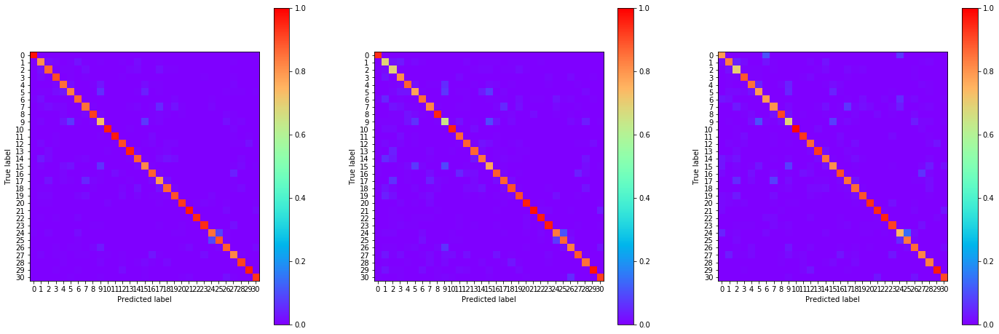

23:42:21.311841
#042 [Train: 0.372] [Test: 0.437] [Valid: 0.454]
#042 [Train: 0.890] [Test: 0.870] [Valid: 0.861]


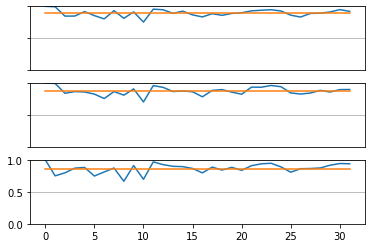

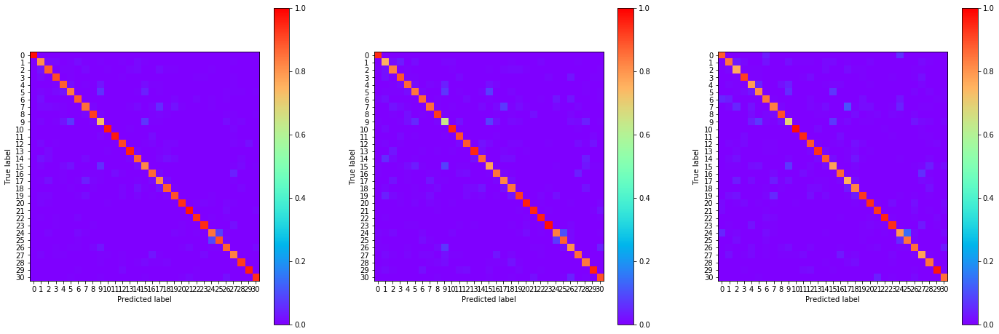

23:43:02.490807
#043 [Train: 0.362] [Test: 0.443] [Valid: 0.459]
#043 [Train: 0.893] [Test: 0.870] [Valid: 0.864]


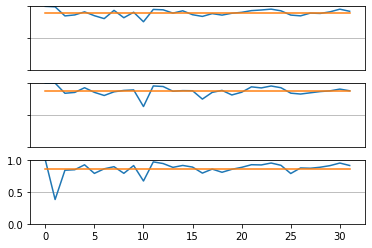

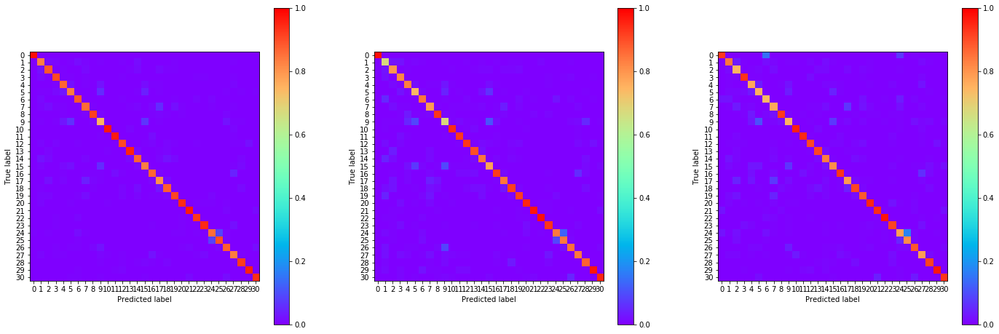

23:43:43.625996
#044 [Train: 0.350] [Test: 0.438] [Valid: 0.448]
#044 [Train: 0.898] [Test: 0.874] [Valid: 0.864]


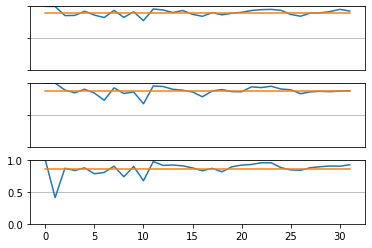

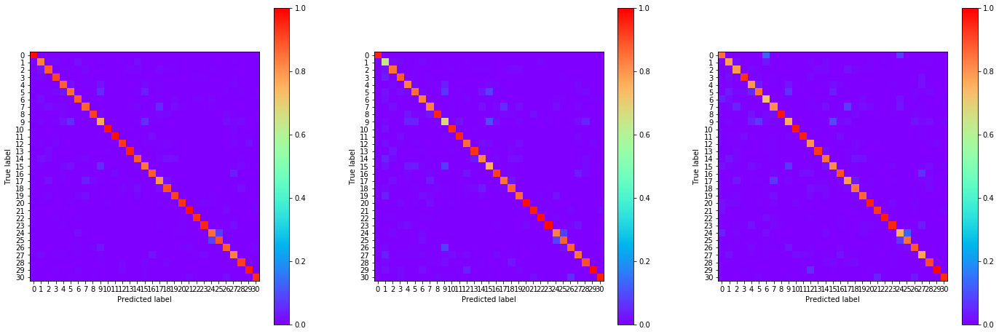

23:44:24.926610
#045 [Train: 0.347] [Test: 0.412] [Valid: 0.434]
#045 [Train: 0.898] [Test: 0.876] [Valid: 0.868]


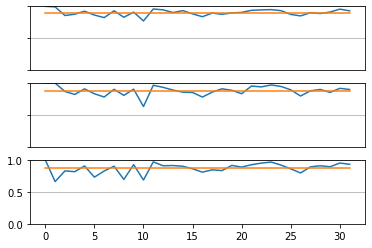

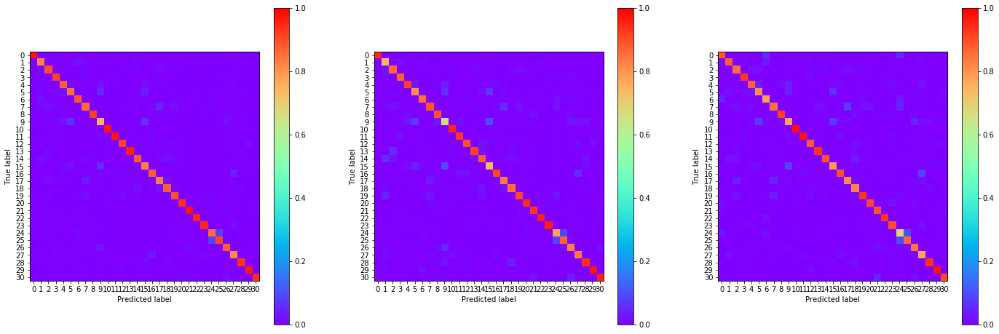

23:45:06.348638
#046 [Train: 0.344] [Test: 0.428] [Valid: 0.438]
#046 [Train: 0.899] [Test: 0.876] [Valid: 0.869]


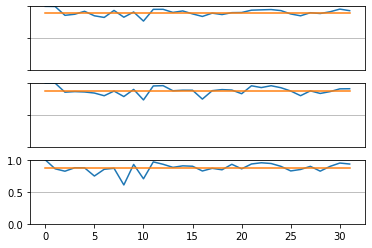

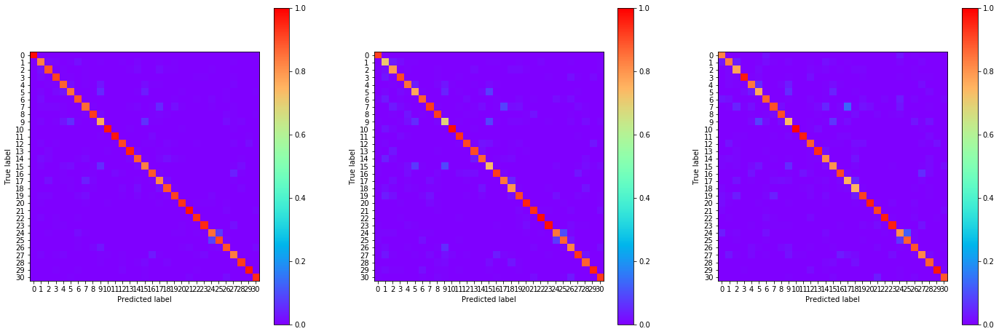

23:45:47.526607
#047 [Train: 0.333] [Test: 0.406] [Valid: 0.445]
#047 [Train: 0.901] [Test: 0.881] [Valid: 0.867]


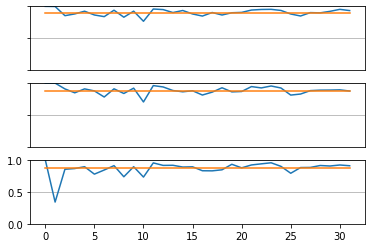

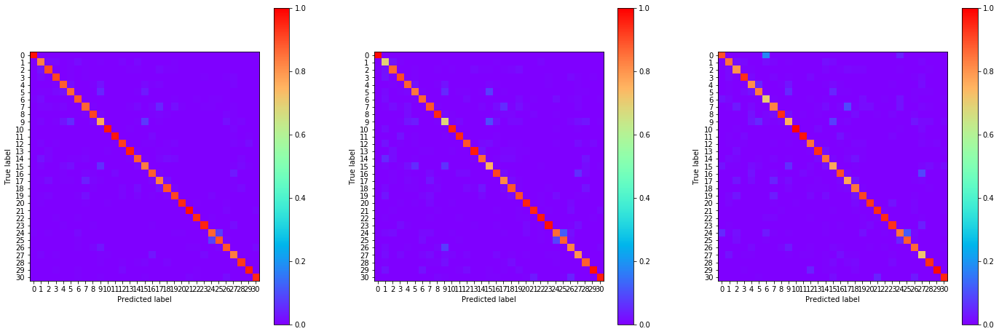

23:46:29.160806
#048 [Train: 0.323] [Test: 0.411] [Valid: 0.425]
#048 [Train: 0.905] [Test: 0.879] [Valid: 0.874]


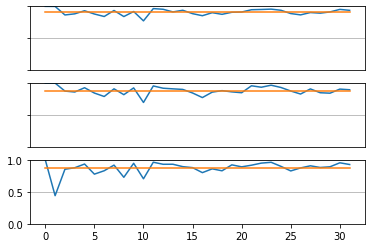

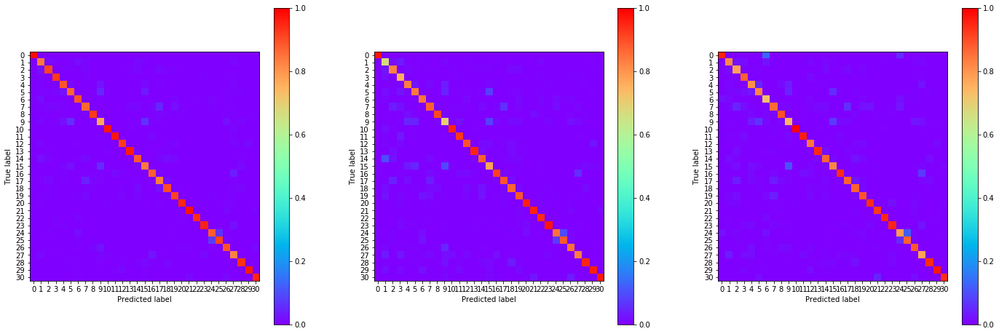

23:47:10.002218
#049 [Train: 0.319] [Test: 0.414] [Valid: 0.455]
#049 [Train: 0.905] [Test: 0.878] [Valid: 0.871]


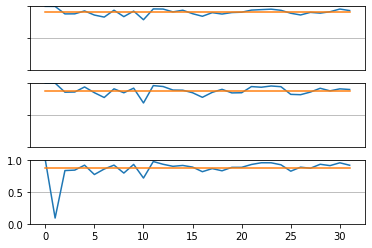

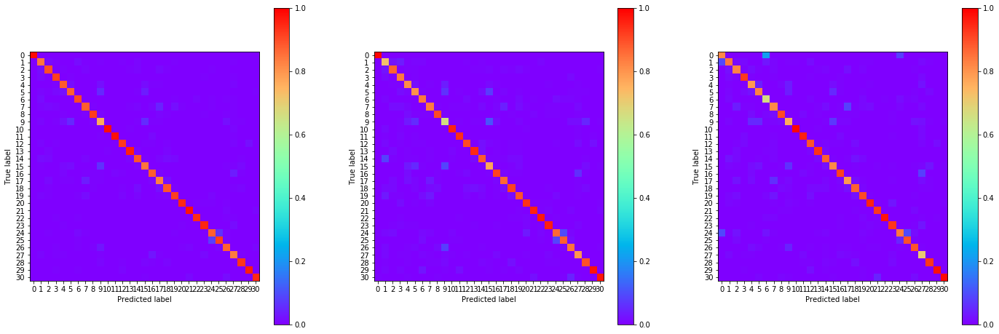

23:47:51.618745
#050 [Train: 0.314] [Test: 0.420] [Valid: 0.416]
#050 [Train: 0.906] [Test: 0.877] [Valid: 0.874]


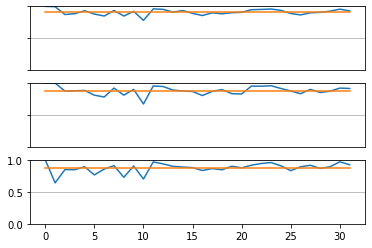

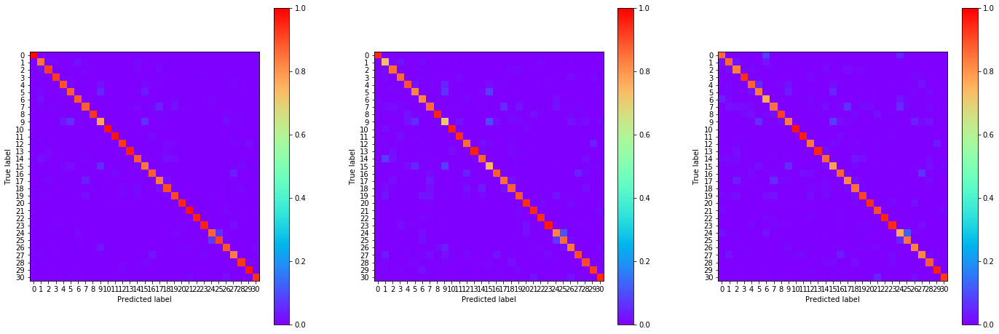

23:48:32.696504
#051 [Train: 0.302] [Test: 0.383] [Valid: 0.426]
#051 [Train: 0.911] [Test: 0.887] [Valid: 0.872]


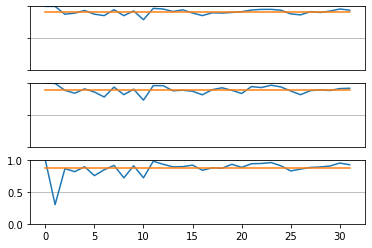

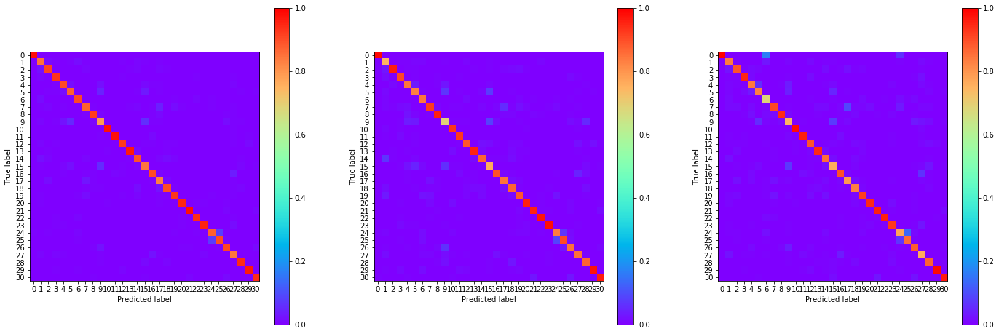

23:49:14.058855
#052 [Train: 0.298] [Test: 0.386] [Valid: 0.423]
#052 [Train: 0.911] [Test: 0.883] [Valid: 0.877]


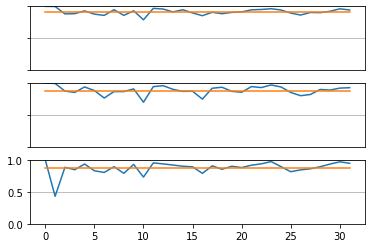

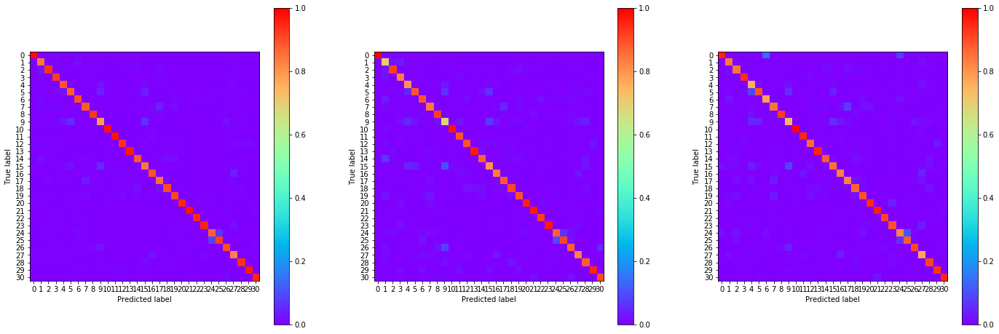

23:49:55.075106
#053 [Train: 0.294] [Test: 0.381] [Valid: 0.440]
#053 [Train: 0.913] [Test: 0.888] [Valid: 0.872]


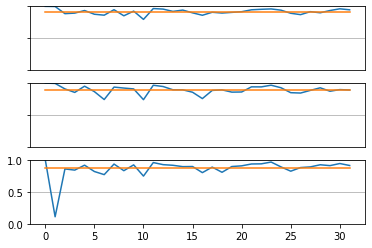

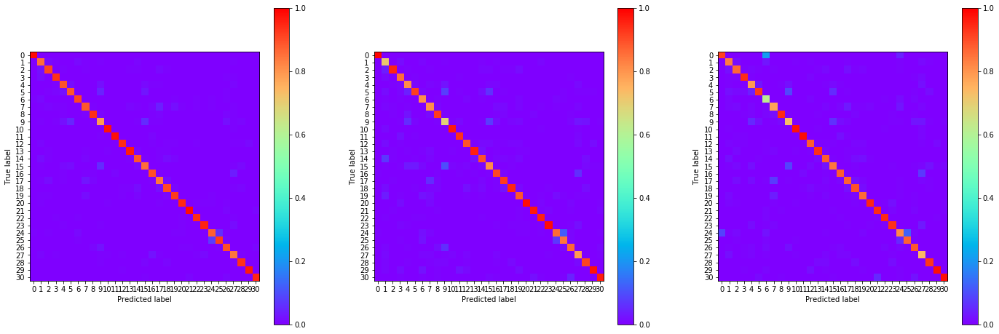

23:50:36.448854
#054 [Train: 0.285] [Test: 0.382] [Valid: 0.407]
#054 [Train: 0.916] [Test: 0.892] [Valid: 0.876]


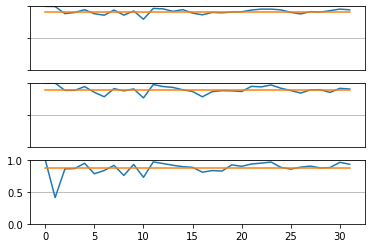

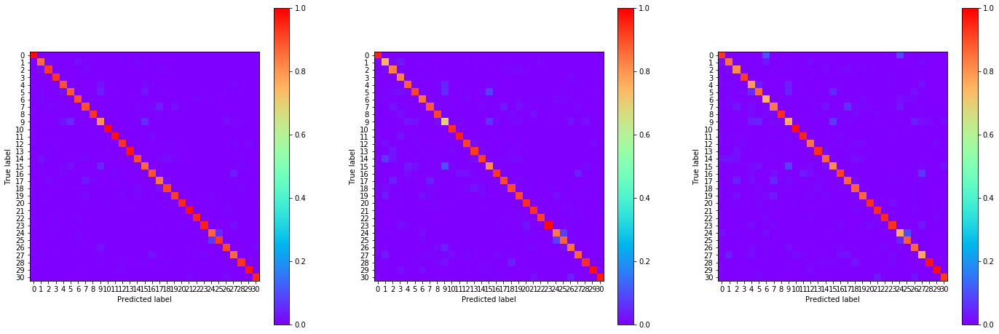

23:51:17.518920
#055 [Train: 0.280] [Test: 0.380] [Valid: 0.407]
#055 [Train: 0.917] [Test: 0.890] [Valid: 0.880]


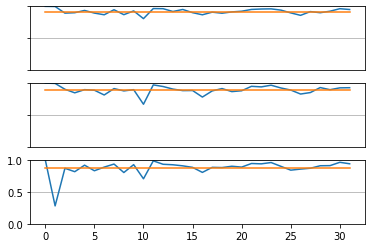

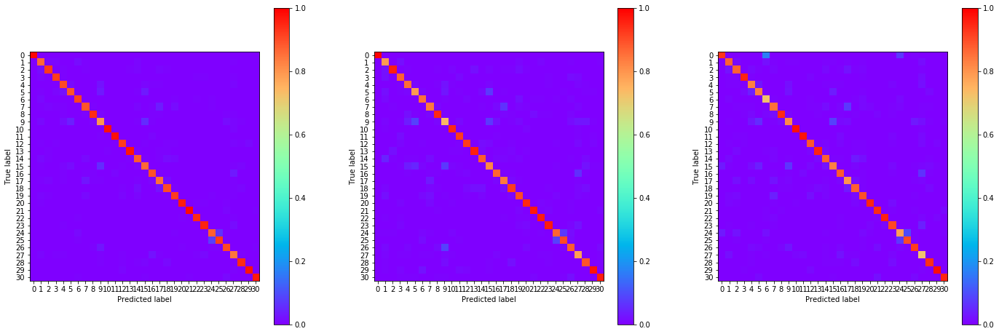

23:51:58.594427
#056 [Train: 0.275] [Test: 0.381] [Valid: 0.391]
#056 [Train: 0.920] [Test: 0.889] [Valid: 0.885]


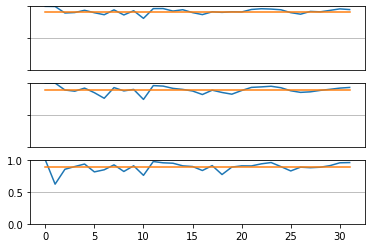

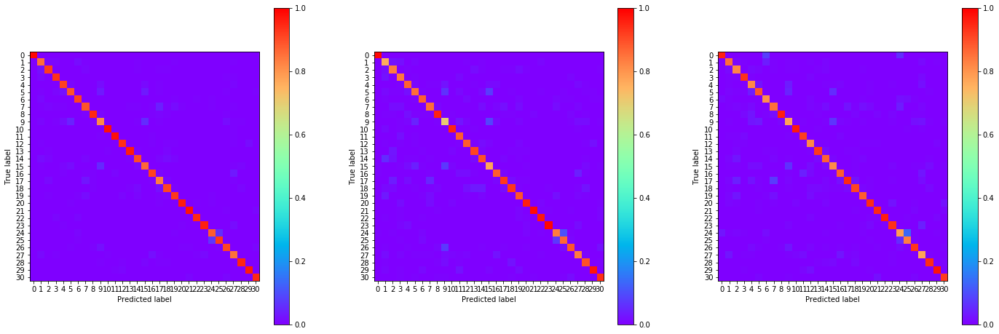

23:52:39.906643
#057 [Train: 0.269] [Test: 0.358] [Valid: 0.394]
#057 [Train: 0.920] [Test: 0.898] [Valid: 0.883]


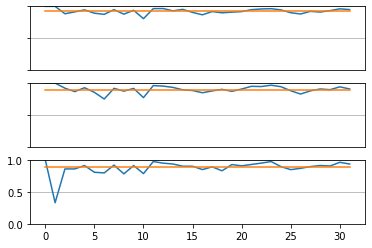

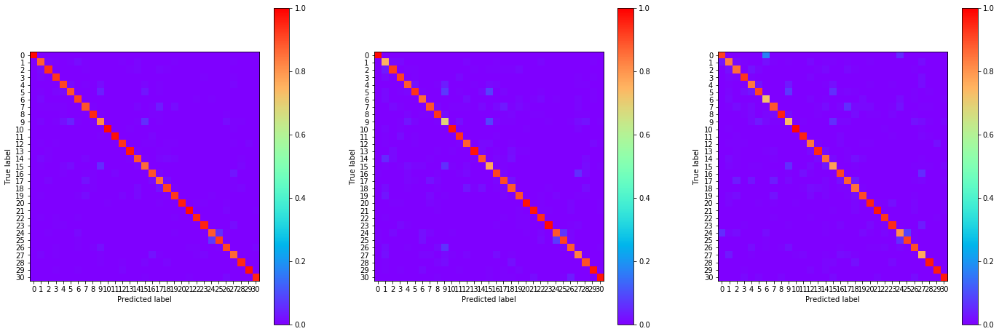

23:53:21.105209
#058 [Train: 0.265] [Test: 0.382] [Valid: 0.386]
#058 [Train: 0.921] [Test: 0.892] [Valid: 0.883]


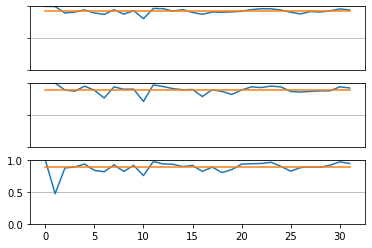

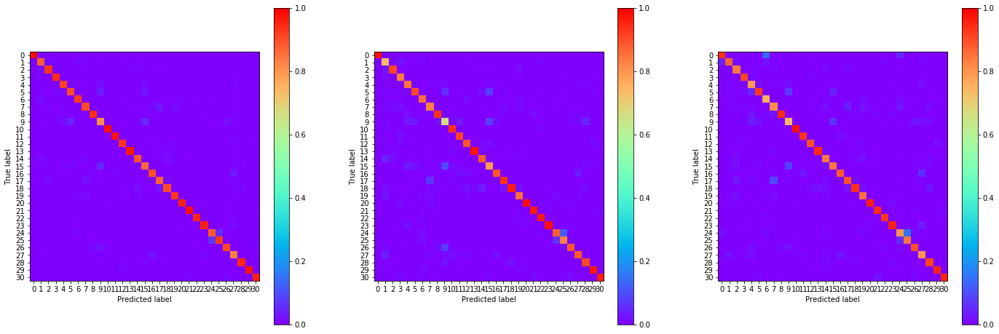

23:54:02.418243
#059 [Train: 0.261] [Test: 0.367] [Valid: 0.434]
#059 [Train: 0.923] [Test: 0.893] [Valid: 0.872]


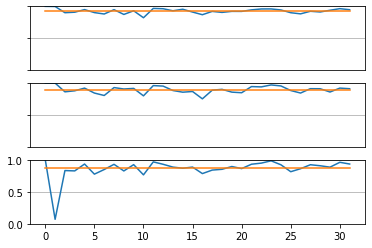

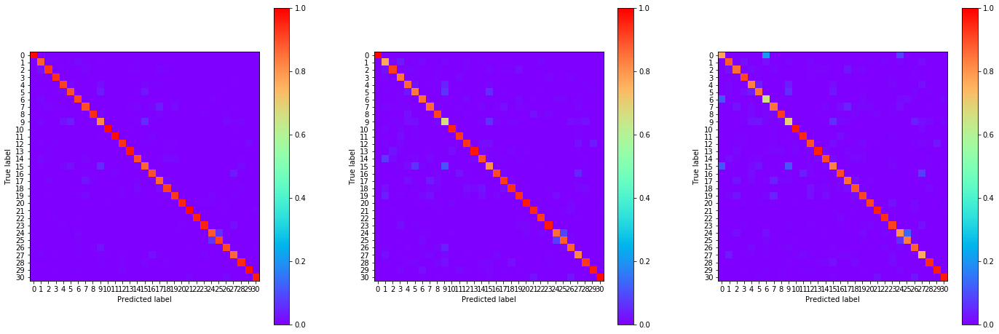

23:54:43.827129
#060 [Train: 0.259] [Test: 0.343] [Valid: 0.376]
#060 [Train: 0.924] [Test: 0.901] [Valid: 0.886]


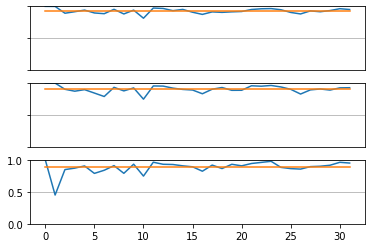

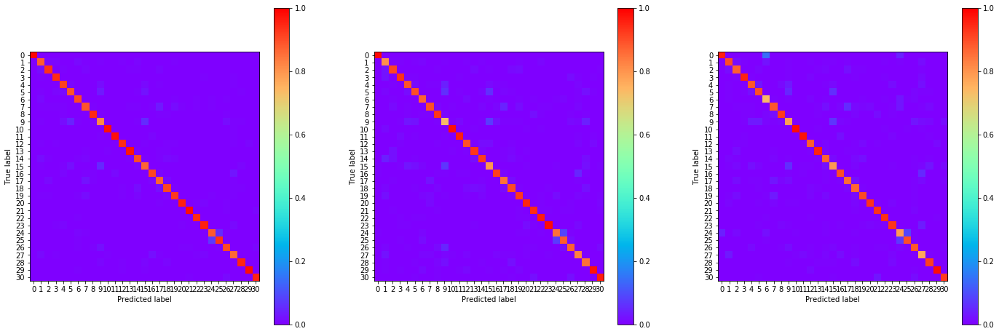

23:55:25.024550
#061 [Train: 0.250] [Test: 0.339] [Valid: 0.396]
#061 [Train: 0.925] [Test: 0.896] [Valid: 0.884]


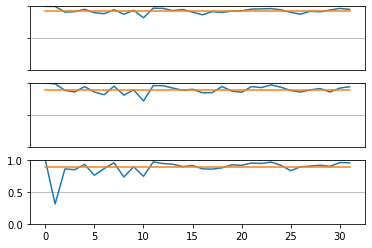

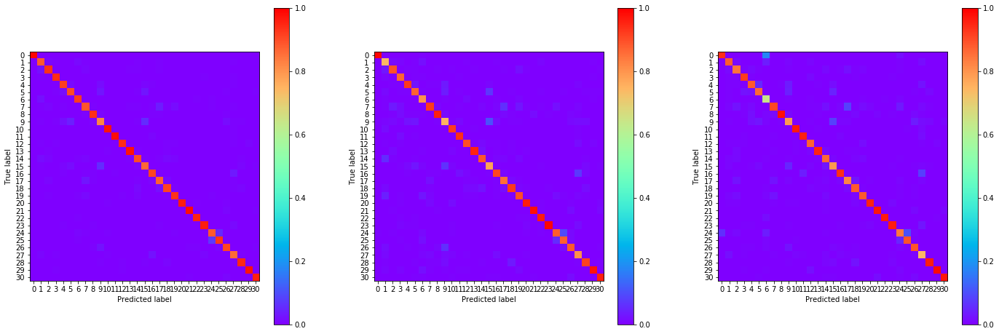

23:56:06.237448
#062 [Train: 0.249] [Test: 0.331] [Valid: 0.382]
#062 [Train: 0.927] [Test: 0.901] [Valid: 0.887]


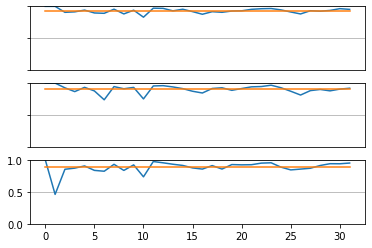

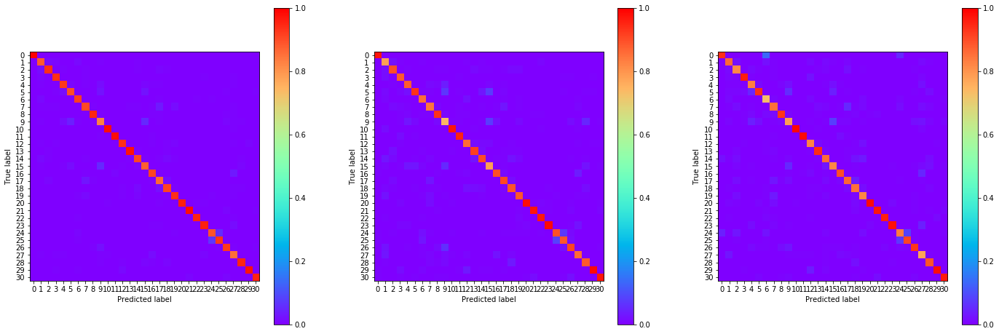

23:56:47.202074
#063 [Train: 0.244] [Test: 0.345] [Valid: 0.387]
#063 [Train: 0.927] [Test: 0.901] [Valid: 0.884]


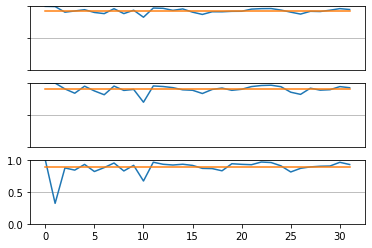

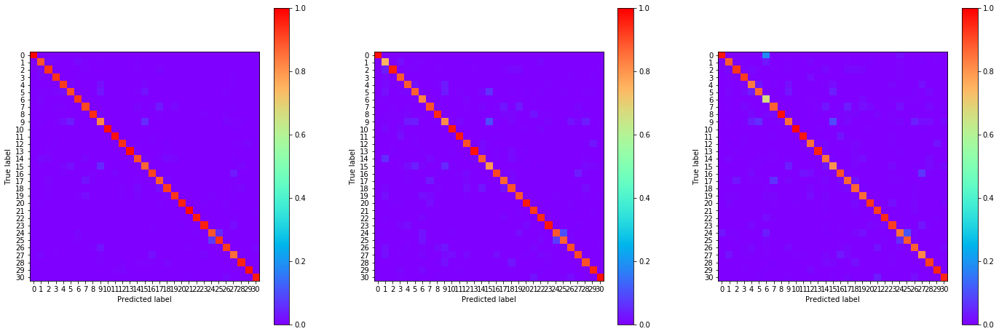

23:57:28.438847
#064 [Train: 0.239] [Test: 0.340] [Valid: 0.370]
#064 [Train: 0.929] [Test: 0.902] [Valid: 0.892]


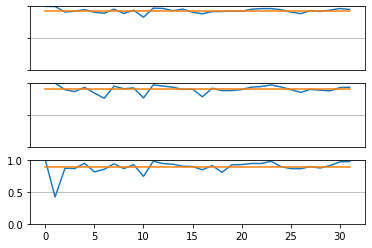

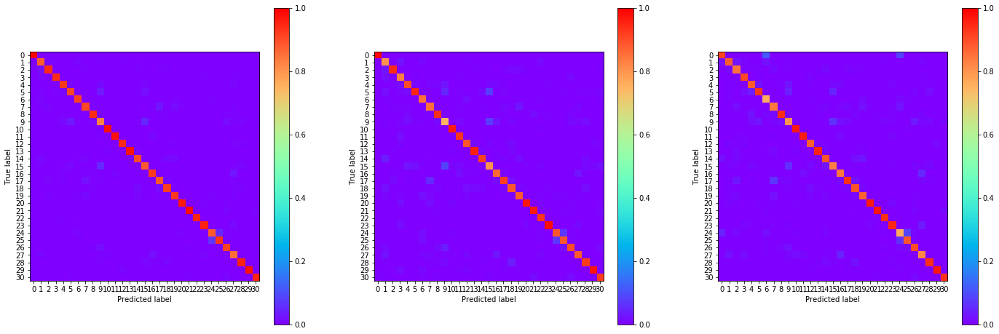

23:58:09.719408
#065 [Train: 0.241] [Test: 0.348] [Valid: 0.354]
#065 [Train: 0.929] [Test: 0.903] [Valid: 0.893]


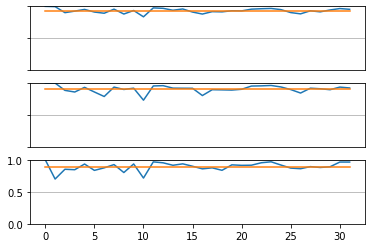

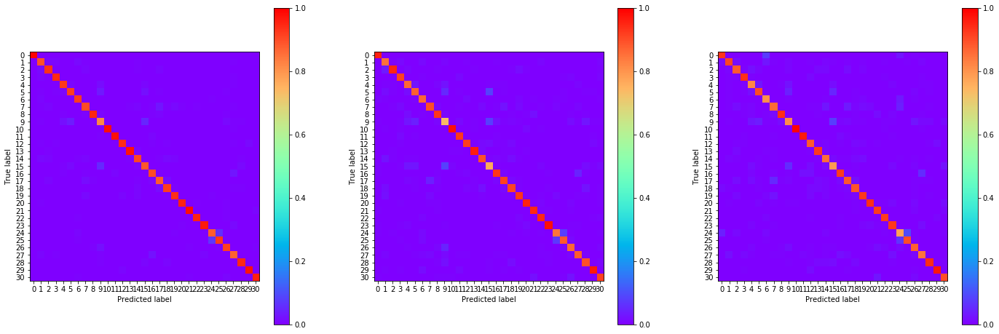

23:58:50.790802
#066 [Train: 0.231] [Test: 0.365] [Valid: 0.389]
#066 [Train: 0.931] [Test: 0.894] [Valid: 0.884]


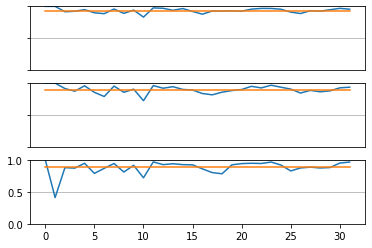

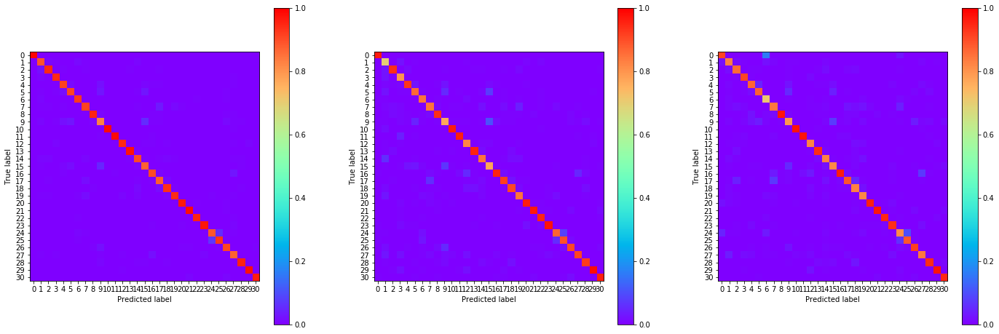

23:59:32.064406
#067 [Train: 0.235] [Test: 0.341] [Valid: 0.351]
#067 [Train: 0.930] [Test: 0.903] [Valid: 0.895]


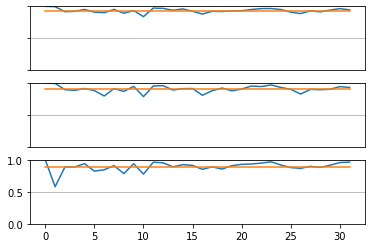

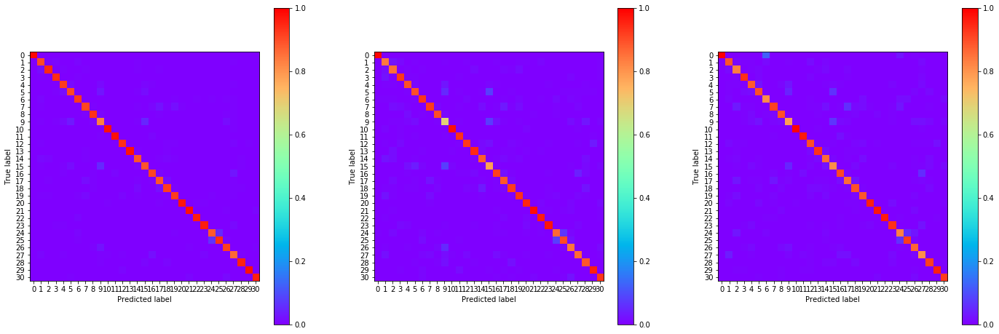

00:00:13.422568
#068 [Train: 0.222] [Test: 0.314] [Valid: 0.347]
#068 [Train: 0.934] [Test: 0.905] [Valid: 0.896]


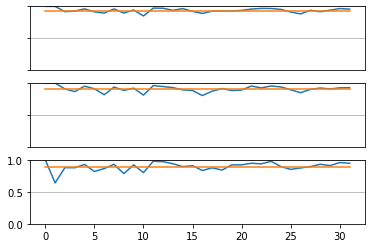

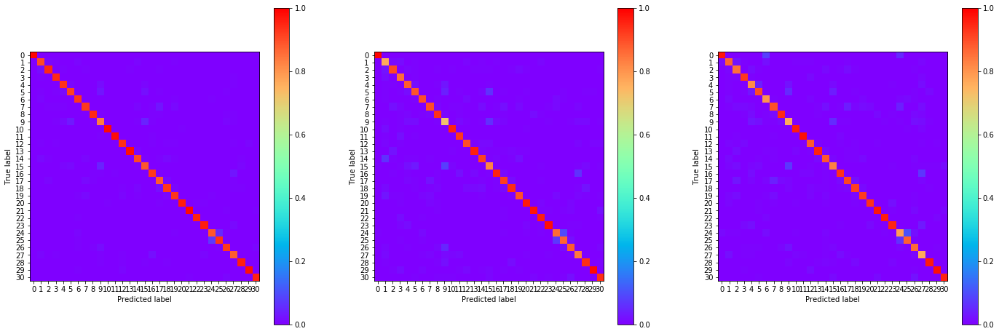

00:00:54.717426
#069 [Train: 0.222] [Test: 0.349] [Valid: 0.361]
#069 [Train: 0.934] [Test: 0.900] [Valid: 0.894]


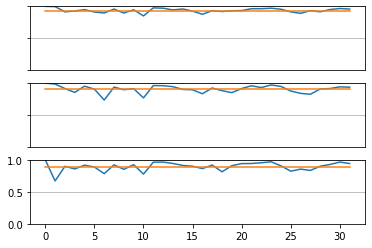

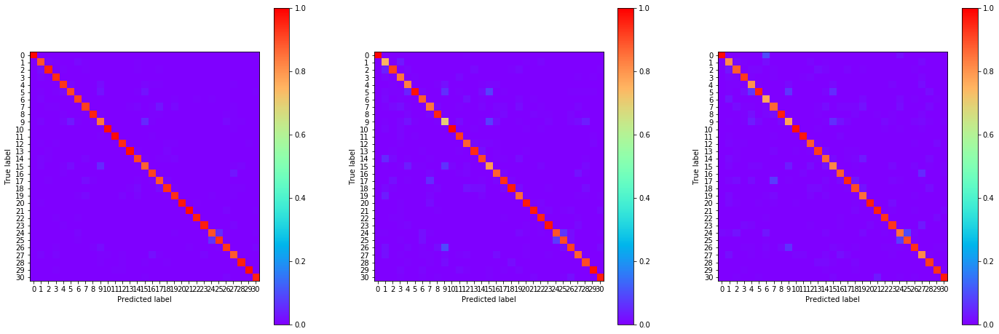

00:01:36.286583
#070 [Train: 0.215] [Test: 0.304] [Valid: 0.347]
#070 [Train: 0.937] [Test: 0.905] [Valid: 0.894]


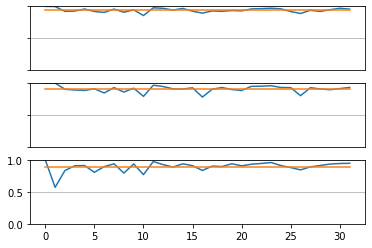

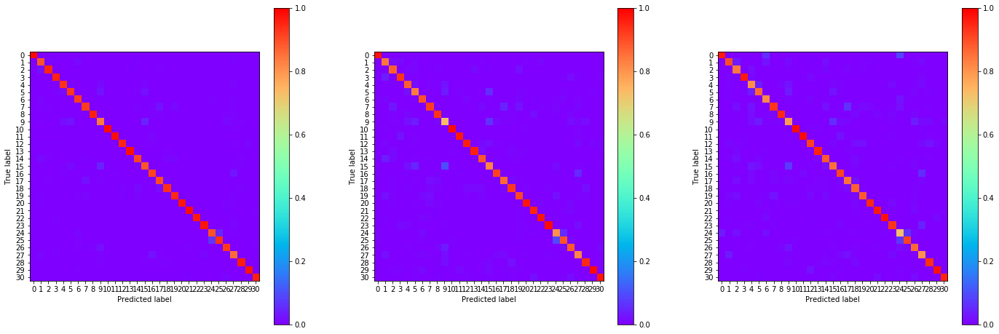

00:02:18.803641
#071 [Train: 0.215] [Test: 0.329] [Valid: 0.341]
#071 [Train: 0.936] [Test: 0.905] [Valid: 0.899]


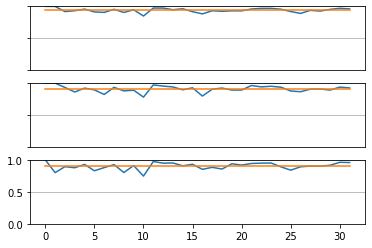

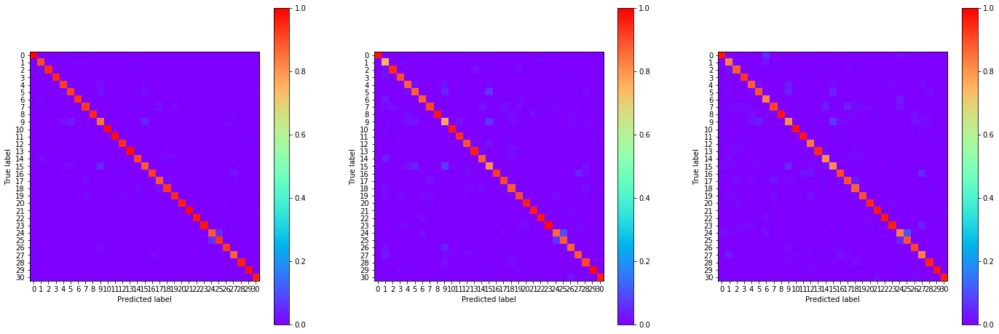

00:03:00.301038
#072 [Train: 0.210] [Test: 0.328] [Valid: 0.348]
#072 [Train: 0.937] [Test: 0.902] [Valid: 0.895]


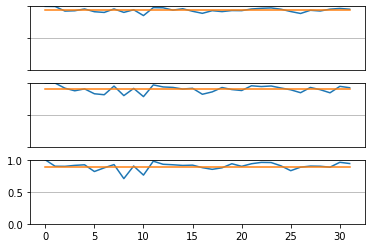

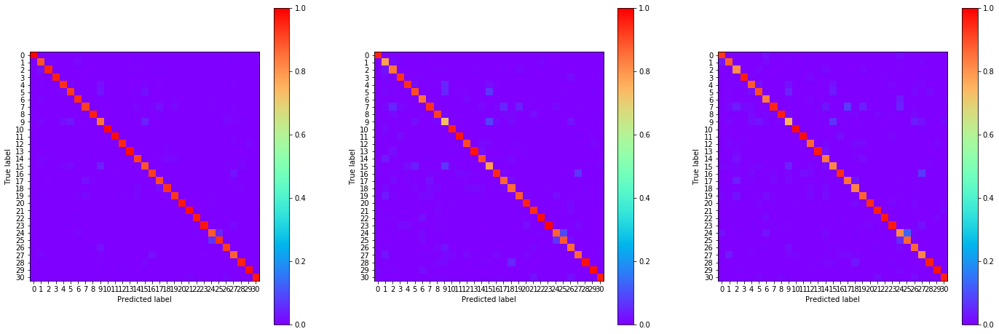

00:03:41.872110
#073 [Train: 0.205] [Test: 0.319] [Valid: 0.345]
#073 [Train: 0.938] [Test: 0.909] [Valid: 0.895]


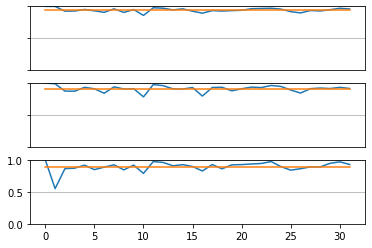

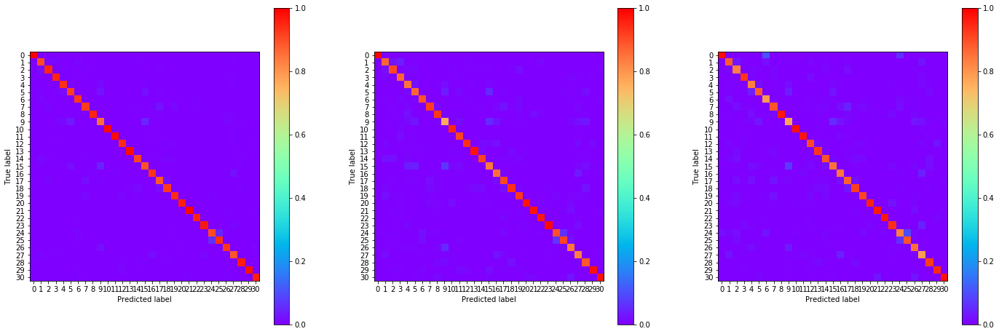

00:04:23.394710
#074 [Train: 0.203] [Test: 0.305] [Valid: 0.337]
#074 [Train: 0.940] [Test: 0.909] [Valid: 0.898]


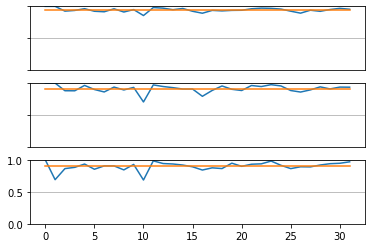

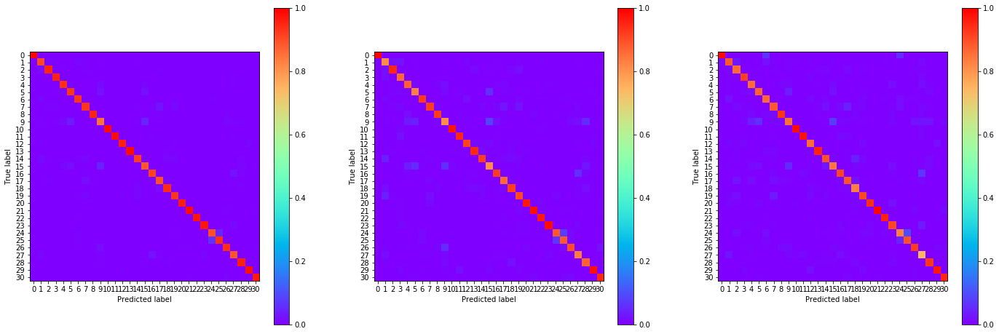

00:05:05.105379
#075 [Train: 0.195] [Test: 0.327] [Valid: 0.335]
#075 [Train: 0.943] [Test: 0.906] [Valid: 0.900]


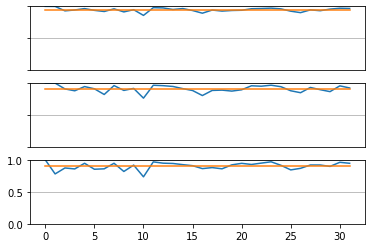

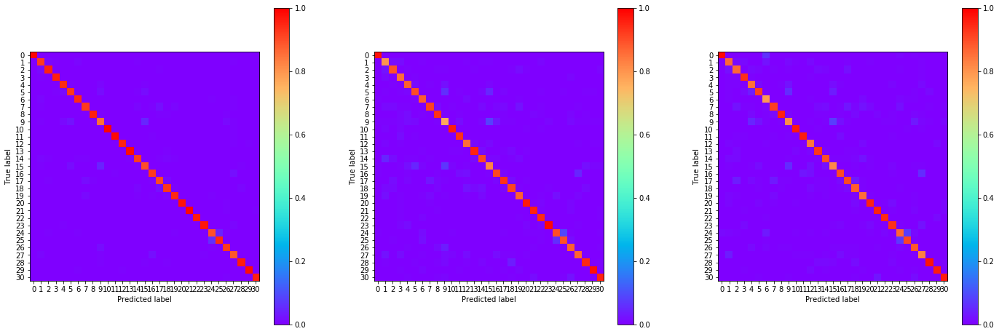

00:05:46.351928
#076 [Train: 0.198] [Test: 0.320] [Valid: 0.346]
#076 [Train: 0.941] [Test: 0.908] [Valid: 0.896]


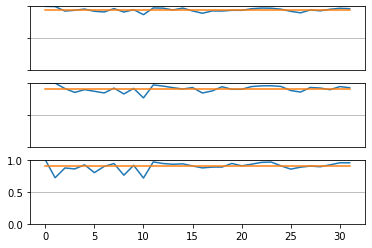

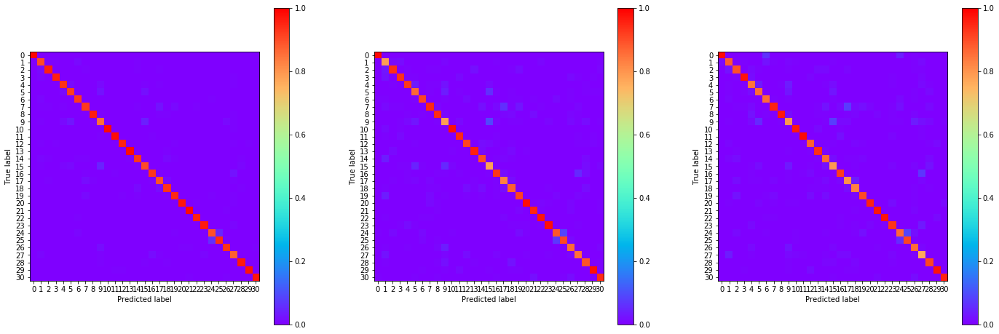

00:06:28.068898
#077 [Train: 0.196] [Test: 0.347] [Valid: 0.371]
#077 [Train: 0.941] [Test: 0.906] [Valid: 0.890]


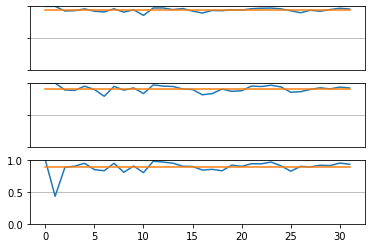

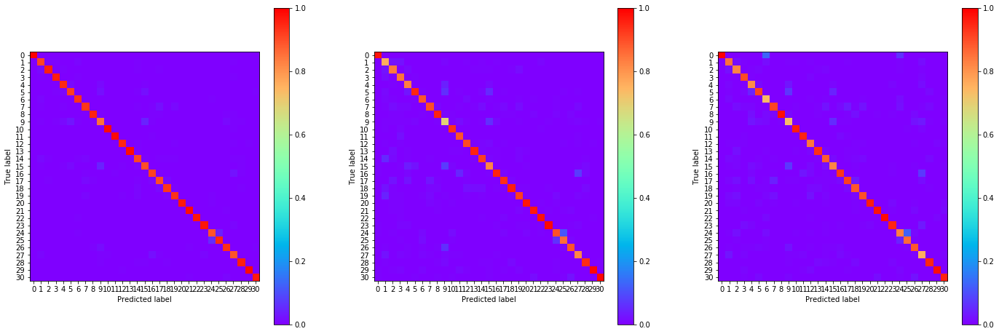

00:07:09.464027
#078 [Train: 0.189] [Test: 0.336] [Valid: 0.341]
#078 [Train: 0.944] [Test: 0.906] [Valid: 0.898]


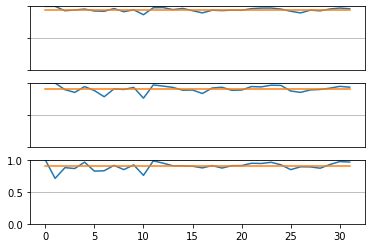

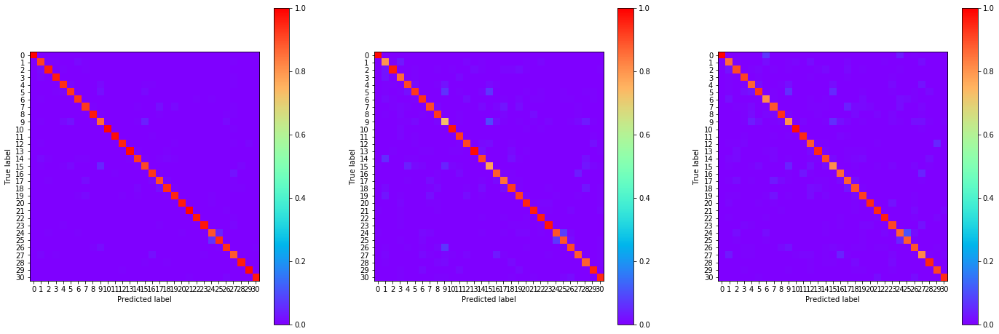

00:07:50.578900
#079 [Train: 0.189] [Test: 0.313] [Valid: 0.326]
#079 [Train: 0.943] [Test: 0.909] [Valid: 0.905]


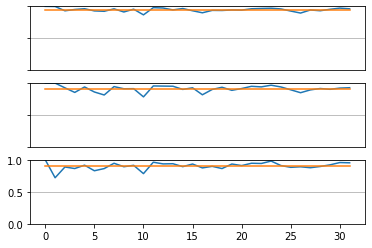

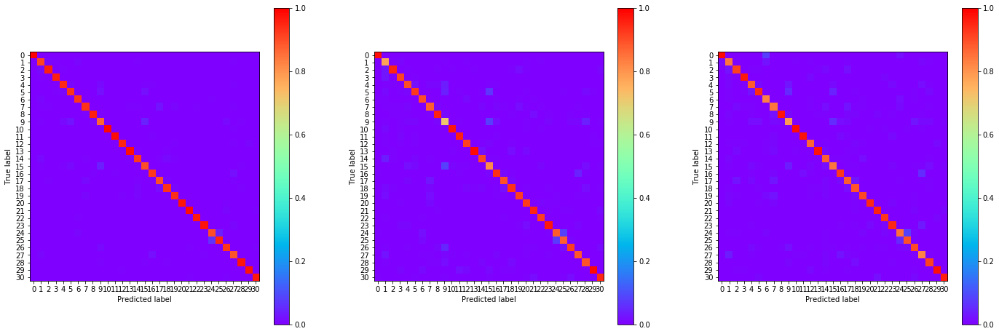

00:08:32.433961
#080 [Train: 0.186] [Test: 0.320] [Valid: 0.318]
#080 [Train: 0.945] [Test: 0.908] [Valid: 0.908]


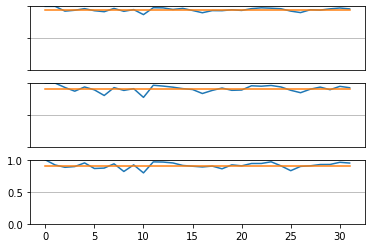

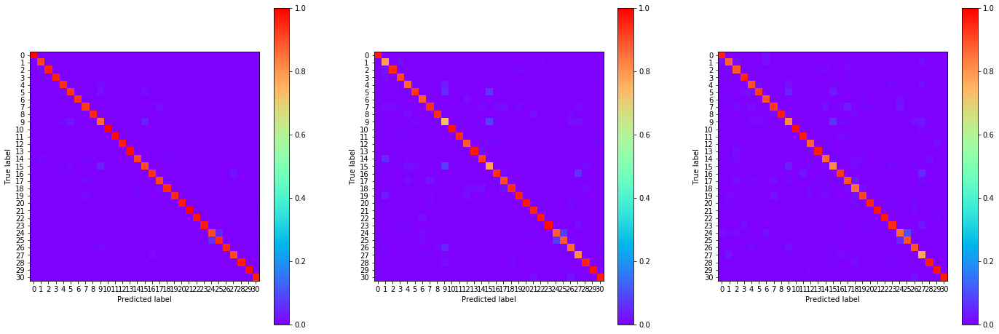

00:09:13.735463
#081 [Train: 0.182] [Test: 0.304] [Valid: 0.346]
#081 [Train: 0.946] [Test: 0.913] [Valid: 0.896]


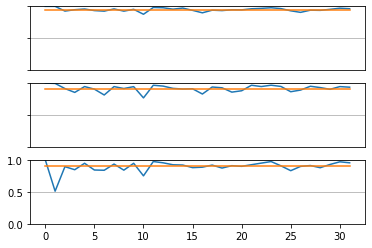

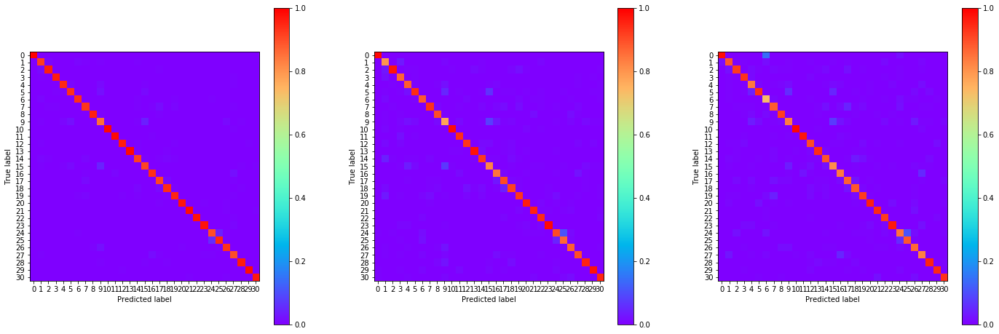

00:09:55.049712
#082 [Train: 0.186] [Test: 0.327] [Valid: 0.338]
#082 [Train: 0.945] [Test: 0.908] [Valid: 0.900]


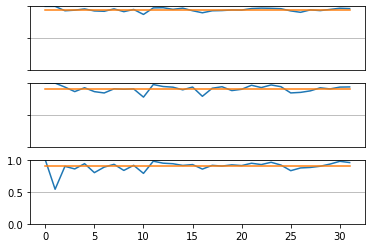

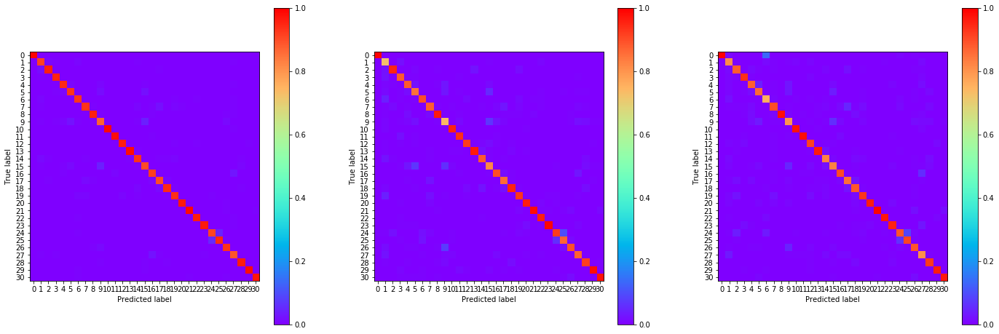

00:10:37.005062
#083 [Train: 0.181] [Test: 0.307] [Valid: 0.331]
#083 [Train: 0.946] [Test: 0.909] [Valid: 0.901]


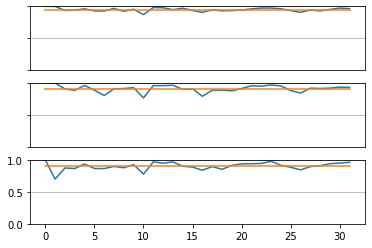

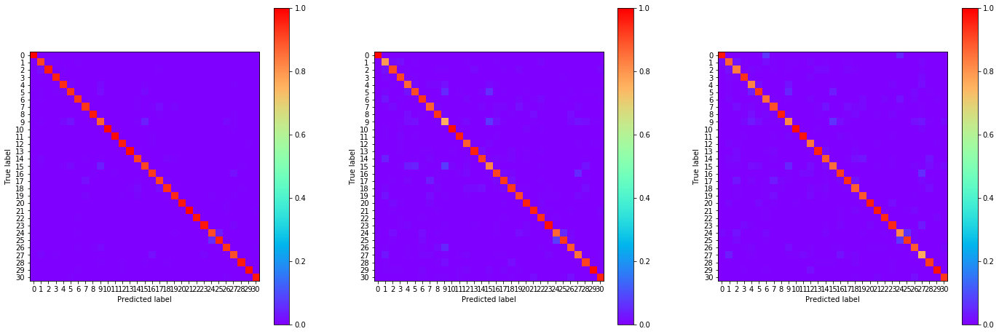

00:11:18.585947
#084 [Train: 0.172] [Test: 0.307] [Valid: 0.330]
#084 [Train: 0.948] [Test: 0.913] [Valid: 0.902]


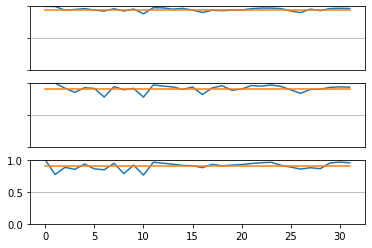

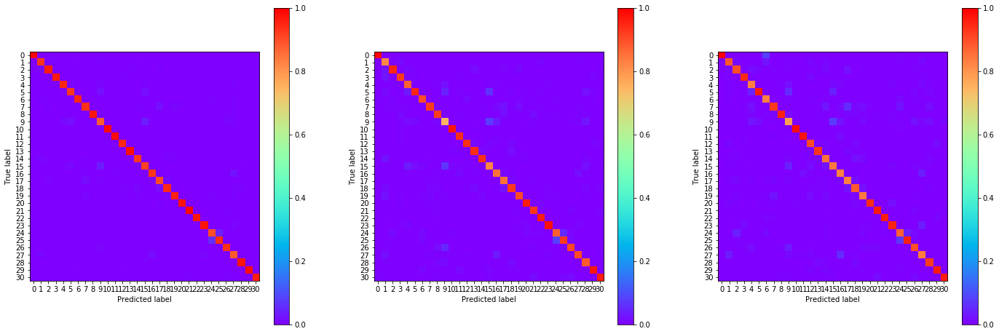

00:12:00.466904
#085 [Train: 0.171] [Test: 0.299] [Valid: 0.314]
#085 [Train: 0.950] [Test: 0.916] [Valid: 0.906]


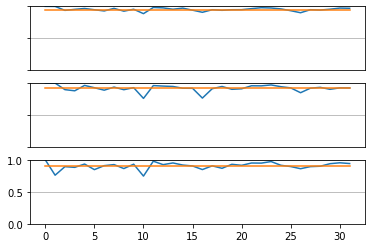

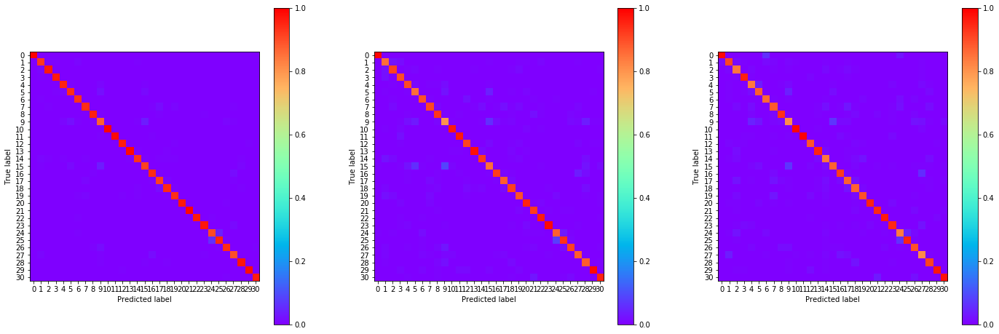

00:12:42.054055
#086 [Train: 0.169] [Test: 0.302] [Valid: 0.330]
#086 [Train: 0.950] [Test: 0.914] [Valid: 0.902]


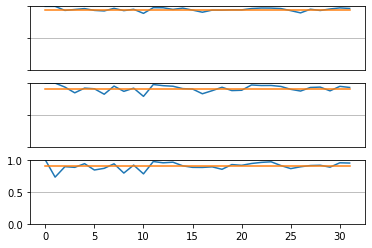

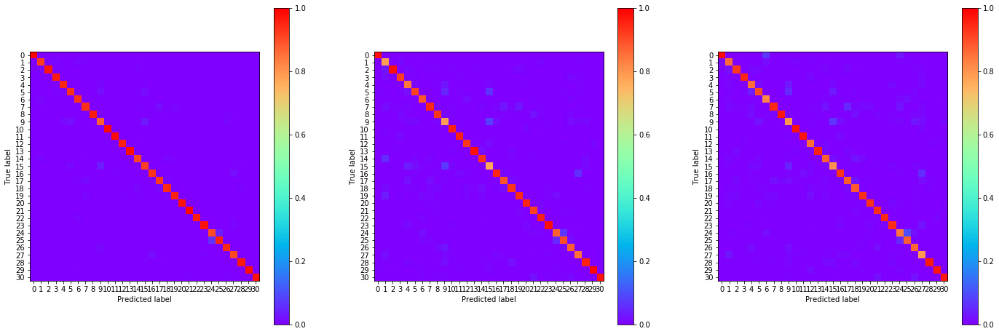

00:13:23.604954
#087 [Train: 0.167] [Test: 0.303] [Valid: 0.327]
#087 [Train: 0.951] [Test: 0.913] [Valid: 0.904]


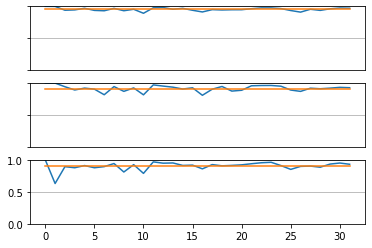

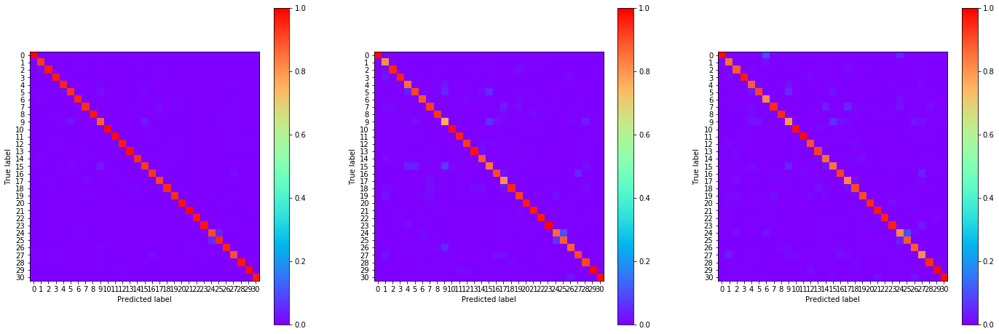

00:14:04.858717
#088 [Train: 0.165] [Test: 0.301] [Valid: 0.327]
#088 [Train: 0.950] [Test: 0.916] [Valid: 0.906]


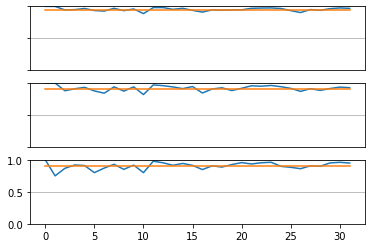

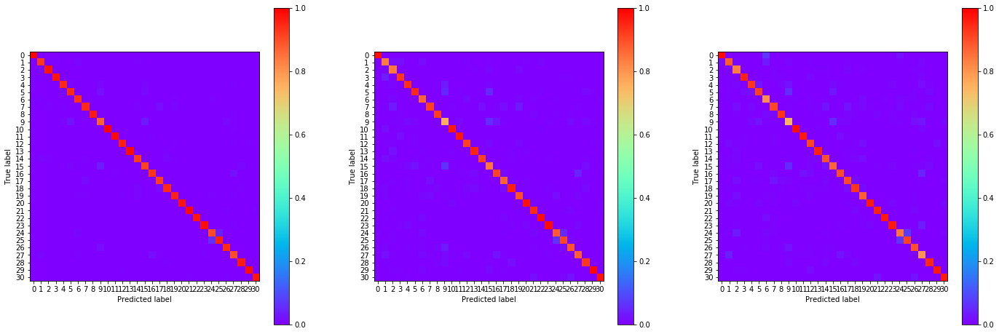

00:14:46.411755
#089 [Train: 0.162] [Test: 0.295] [Valid: 0.318]
#089 [Train: 0.951] [Test: 0.915] [Valid: 0.905]


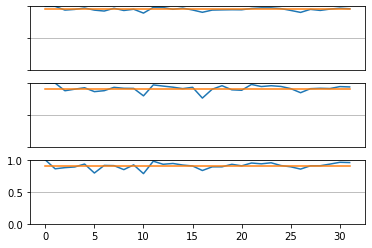

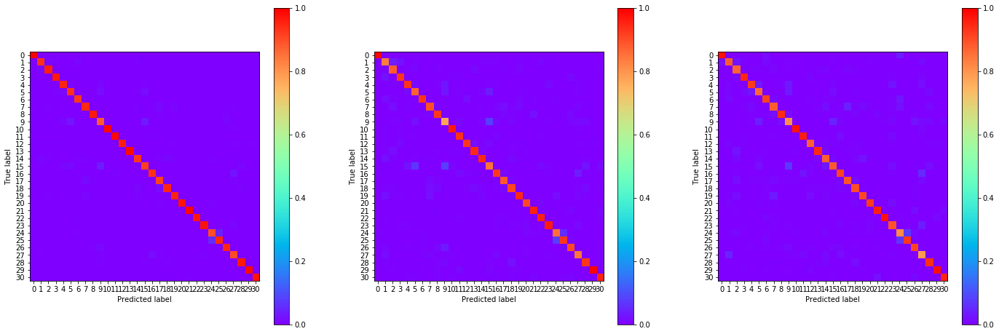

00:15:27.704301
#090 [Train: 0.158] [Test: 0.301] [Valid: 0.313]
#090 [Train: 0.953] [Test: 0.916] [Valid: 0.908]


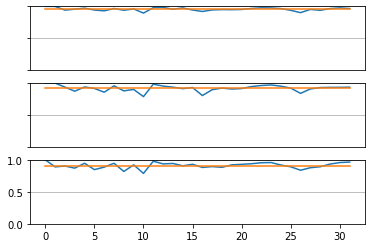

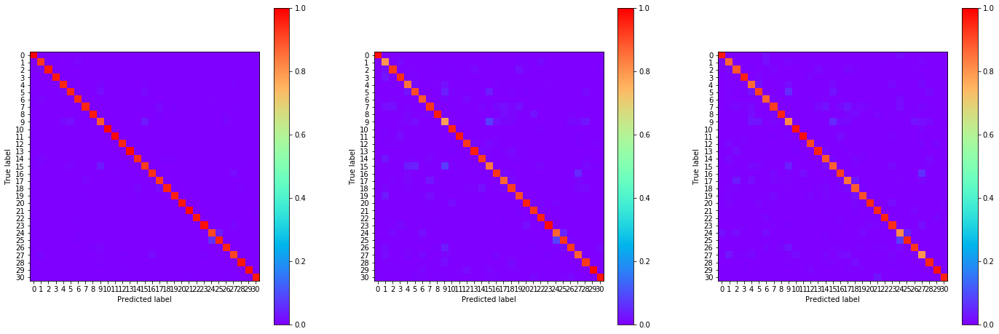

00:16:09.534169
#091 [Train: 0.155] [Test: 0.291] [Valid: 0.326]
#091 [Train: 0.954] [Test: 0.914] [Valid: 0.905]


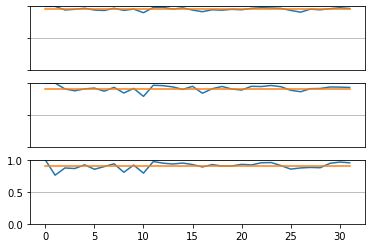

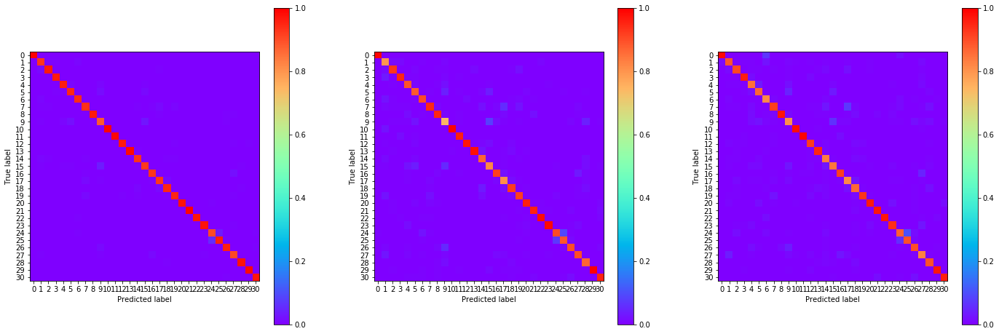

00:16:50.824319
#092 [Train: 0.158] [Test: 0.310] [Valid: 0.325]
#092 [Train: 0.953] [Test: 0.914] [Valid: 0.903]


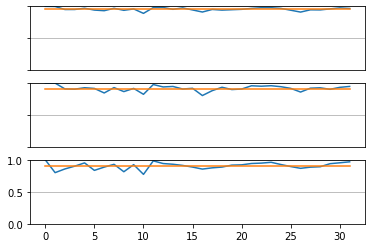

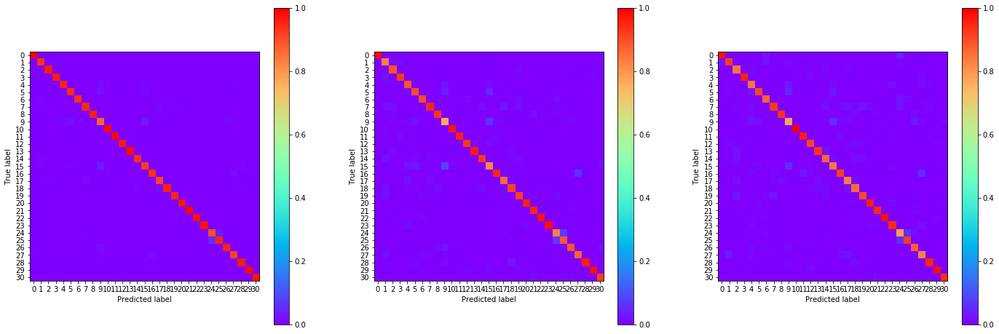

00:17:32.116601
#093 [Train: 0.157] [Test: 0.302] [Valid: 0.322]
#093 [Train: 0.953] [Test: 0.915] [Valid: 0.908]


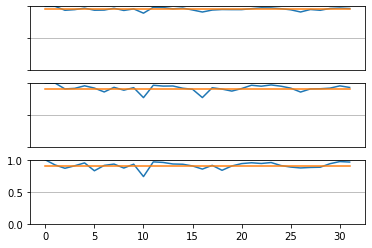

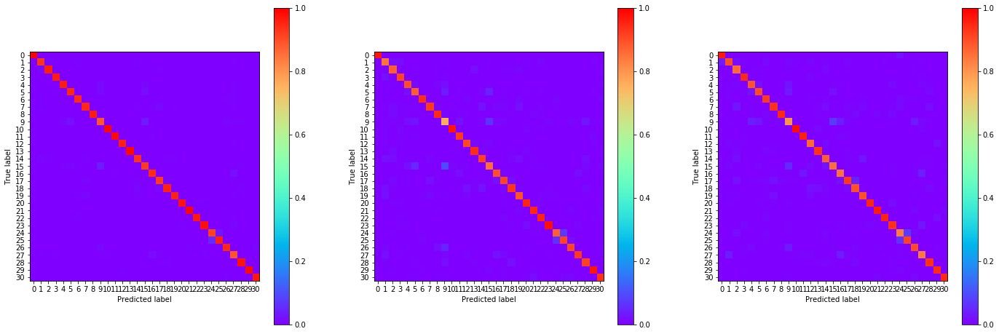

00:18:13.467474
#094 [Train: 0.148] [Test: 0.311] [Valid: 0.329]
#094 [Train: 0.956] [Test: 0.912] [Valid: 0.906]


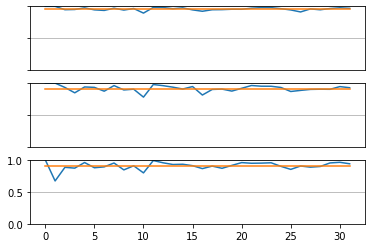

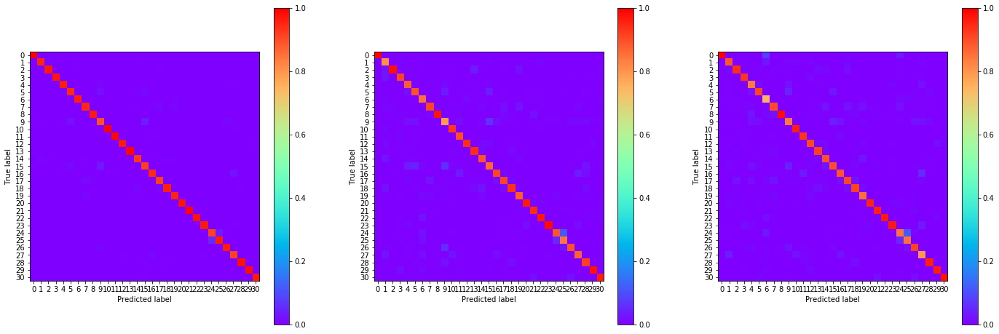

00:18:55.203458
#095 [Train: 0.145] [Test: 0.307] [Valid: 0.338]
#095 [Train: 0.957] [Test: 0.915] [Valid: 0.902]


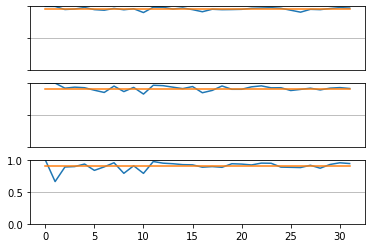

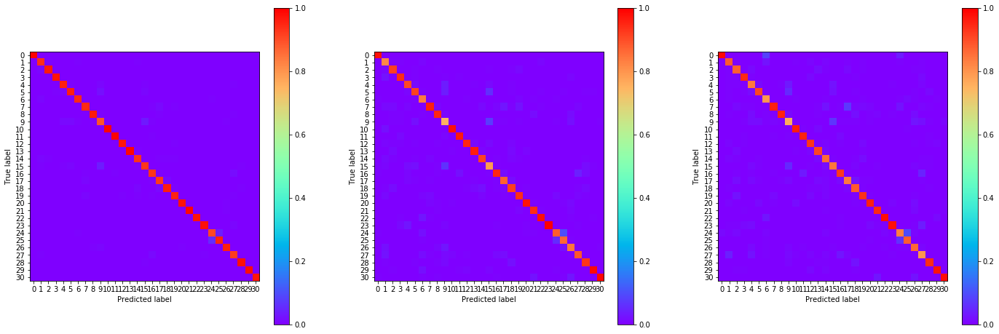

00:19:36.572651
#096 [Train: 0.148] [Test: 0.303] [Valid: 0.327]
#096 [Train: 0.956] [Test: 0.914] [Valid: 0.906]


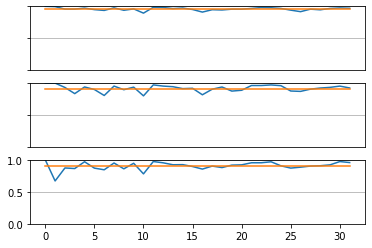

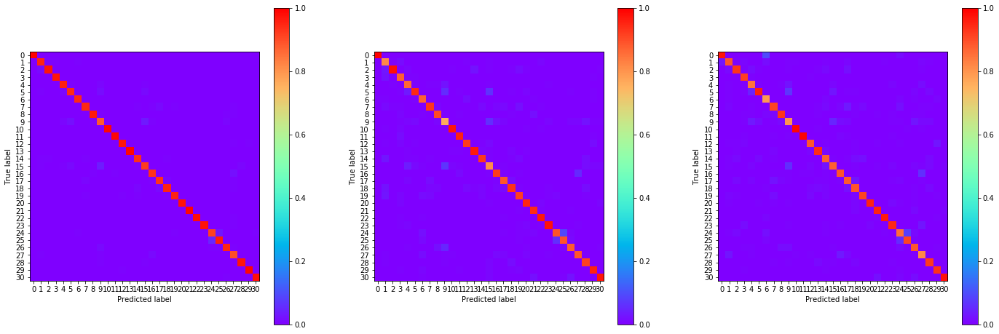

00:20:18.260717
#097 [Train: 0.145] [Test: 0.311] [Valid: 0.316]
#097 [Train: 0.957] [Test: 0.914] [Valid: 0.908]


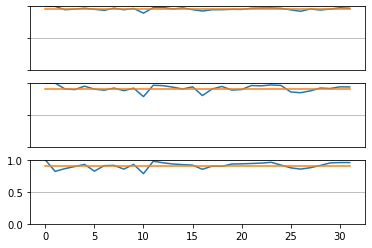

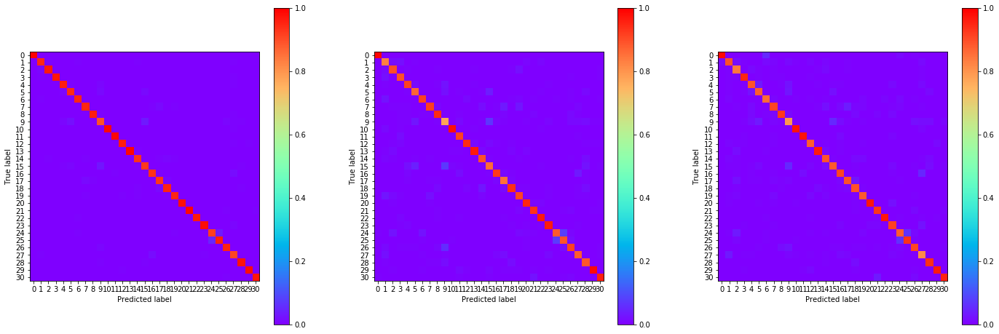

00:20:59.375440
#098 [Train: 0.144] [Test: 0.284] [Valid: 0.310]
#098 [Train: 0.957] [Test: 0.920] [Valid: 0.911]


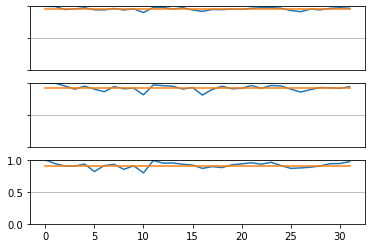

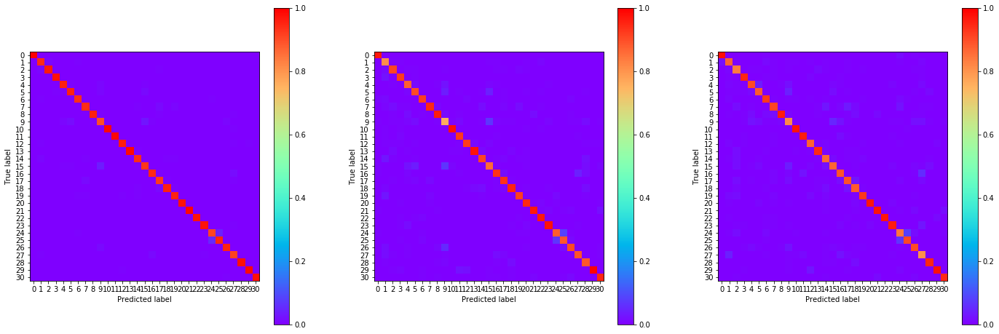

00:21:40.839190
#099 [Train: 0.138] [Test: 0.286] [Valid: 0.311]
#099 [Train: 0.958] [Test: 0.916] [Valid: 0.908]


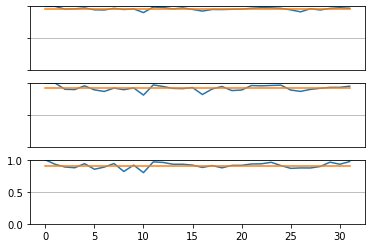

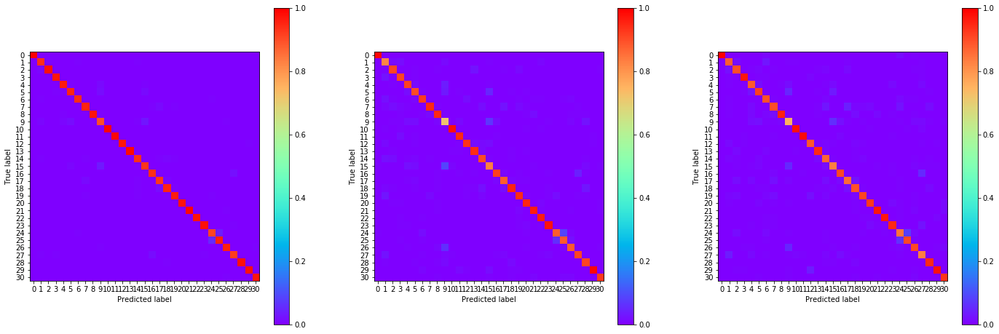

00:22:22.480484
#100 [Train: 0.137] [Test: 0.303] [Valid: 0.330]
#100 [Train: 0.960] [Test: 0.917] [Valid: 0.907]


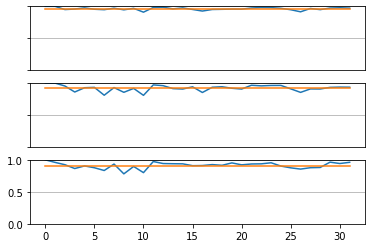

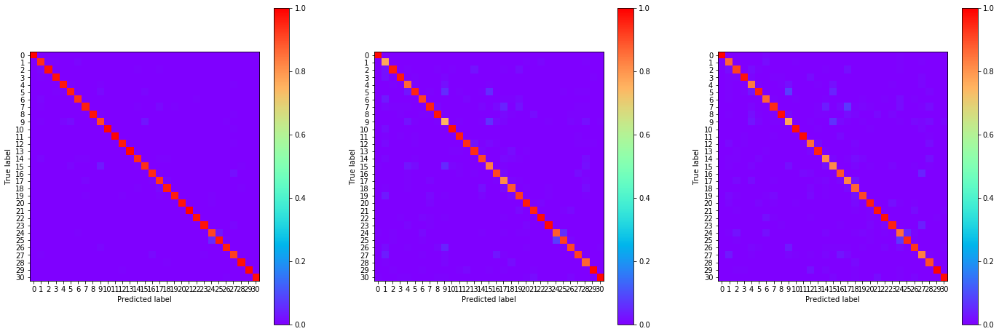

00:23:03.943042
#101 [Train: 0.136] [Test: 0.299] [Valid: 0.312]
#101 [Train: 0.960] [Test: 0.918] [Valid: 0.911]


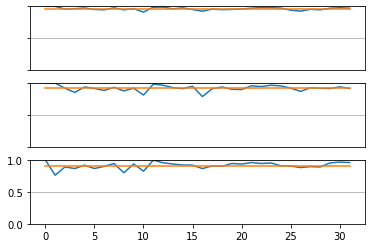

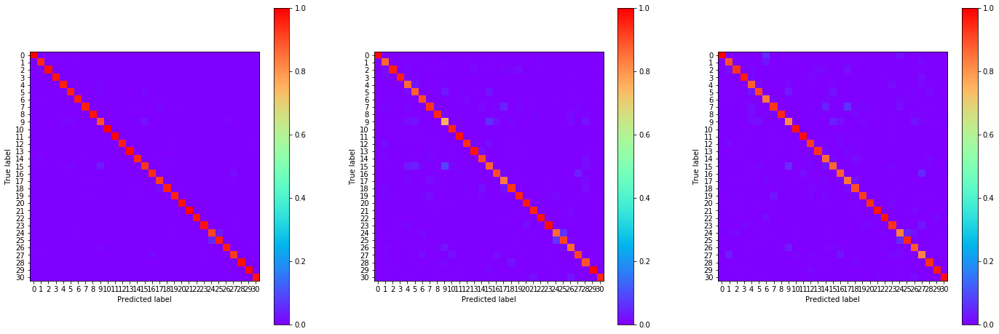

00:23:45.107179
#102 [Train: 0.136] [Test: 0.309] [Valid: 0.323]
#102 [Train: 0.959] [Test: 0.917] [Valid: 0.907]


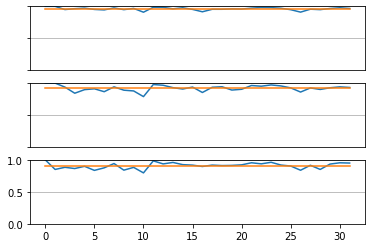

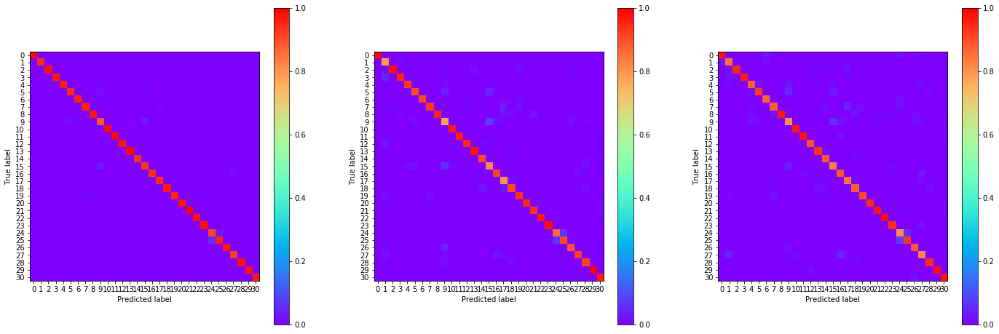

00:24:26.417494
#103 [Train: 0.131] [Test: 0.319] [Valid: 0.318]
#103 [Train: 0.961] [Test: 0.915] [Valid: 0.908]


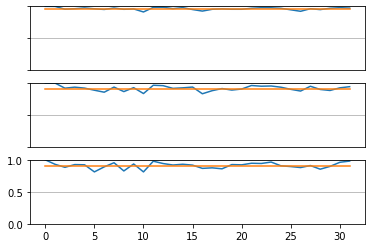

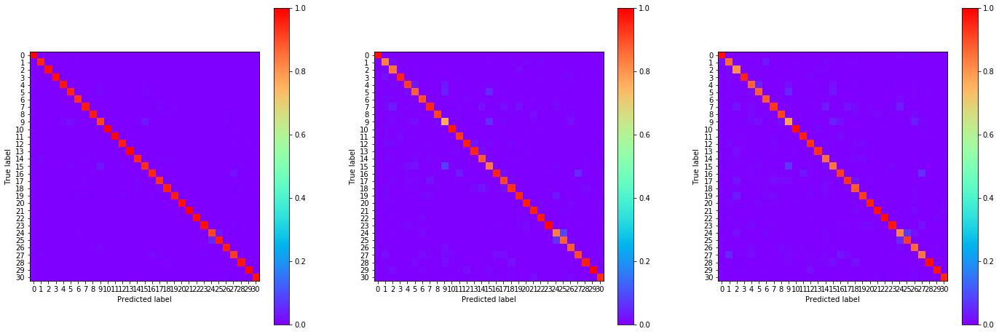

00:25:07.495225
#104 [Train: 0.133] [Test: 0.304] [Valid: 0.309]
#104 [Train: 0.961] [Test: 0.918] [Valid: 0.911]


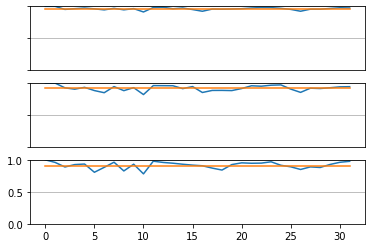

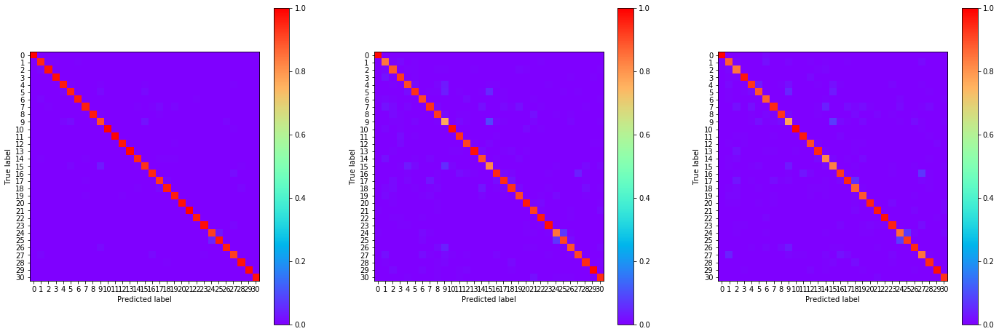

00:25:48.580281
#105 [Train: 0.129] [Test: 0.288] [Valid: 0.309]
#105 [Train: 0.962] [Test: 0.920] [Valid: 0.912]


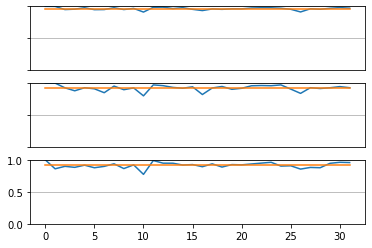

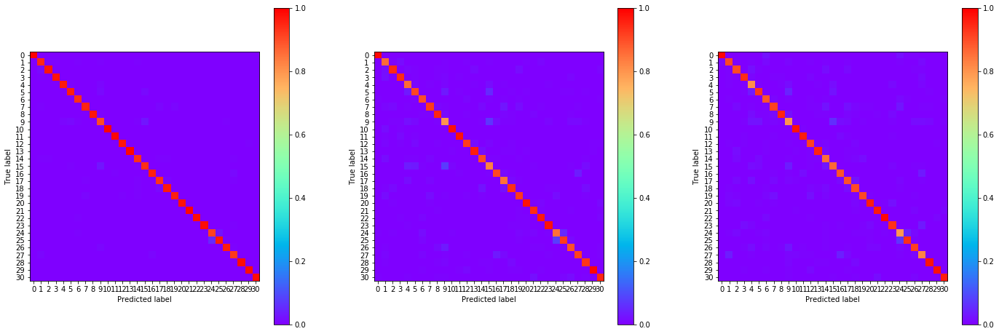

00:26:30.190744
#106 [Train: 0.127] [Test: 0.291] [Valid: 0.309]
#106 [Train: 0.963] [Test: 0.918] [Valid: 0.912]


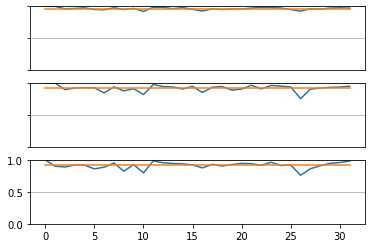

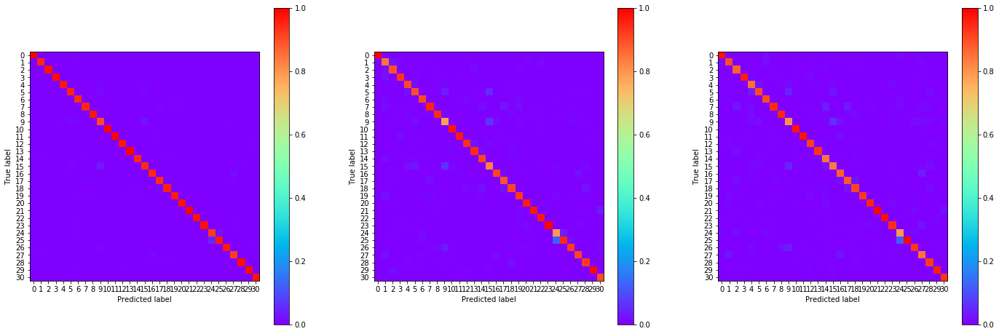

00:27:11.662967
#107 [Train: 0.126] [Test: 0.321] [Valid: 0.326]
#107 [Train: 0.962] [Test: 0.916] [Valid: 0.911]


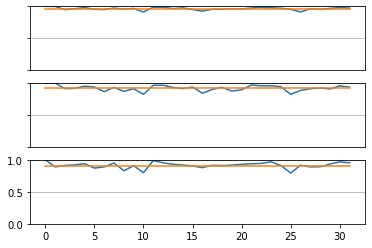

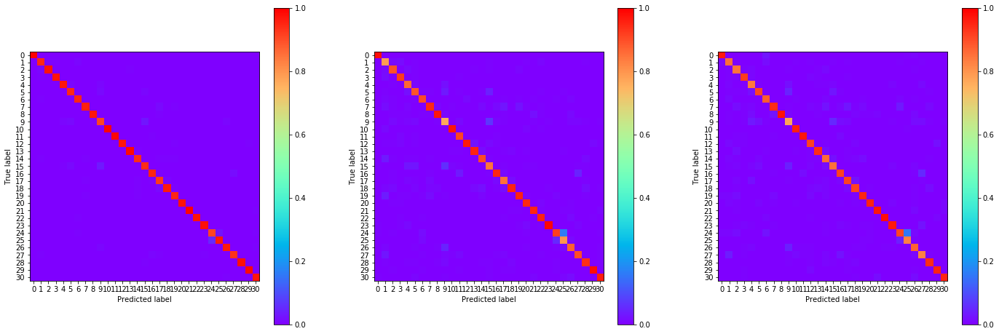

00:27:53.274893
#108 [Train: 0.124] [Test: 0.294] [Valid: 0.332]
#108 [Train: 0.964] [Test: 0.918] [Valid: 0.906]


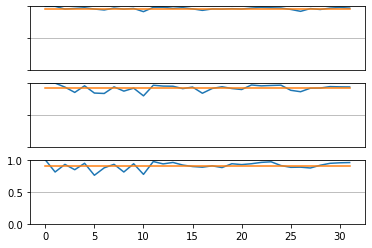

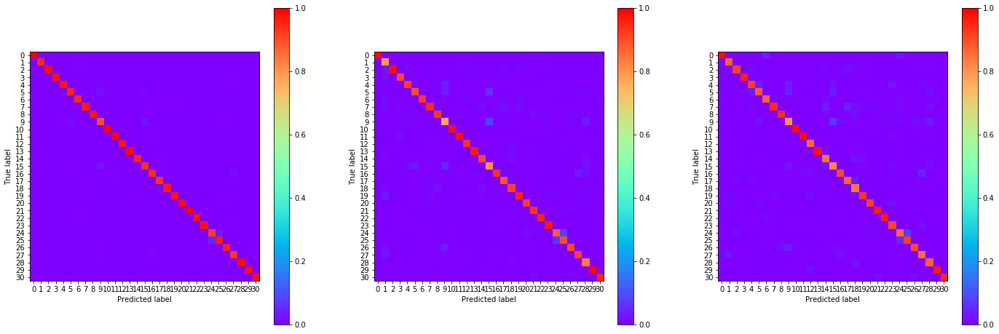

00:28:35.204448
#109 [Train: 0.121] [Test: 0.291] [Valid: 0.319]
#109 [Train: 0.964] [Test: 0.920] [Valid: 0.911]


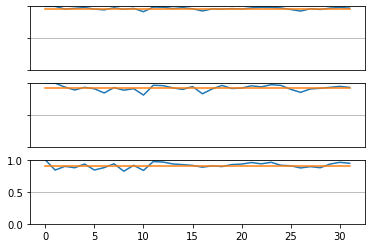

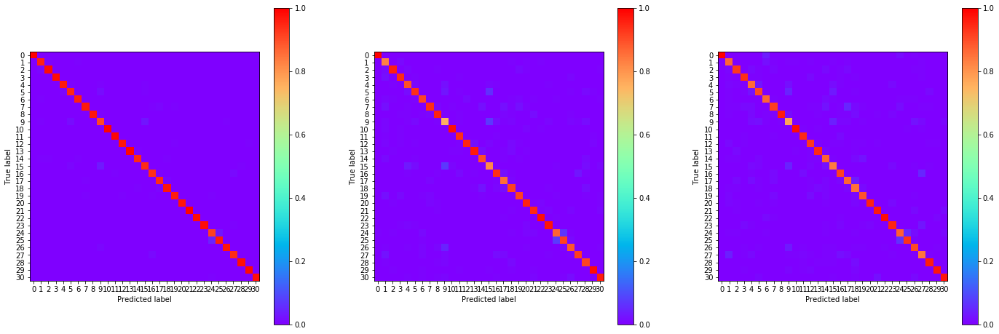

00:29:16.549548
#110 [Train: 0.118] [Test: 0.304] [Valid: 0.310]
#110 [Train: 0.965] [Test: 0.916] [Valid: 0.913]


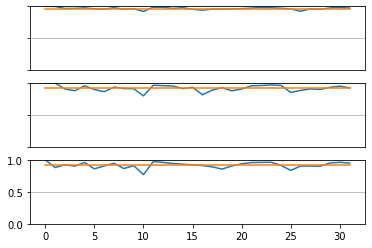

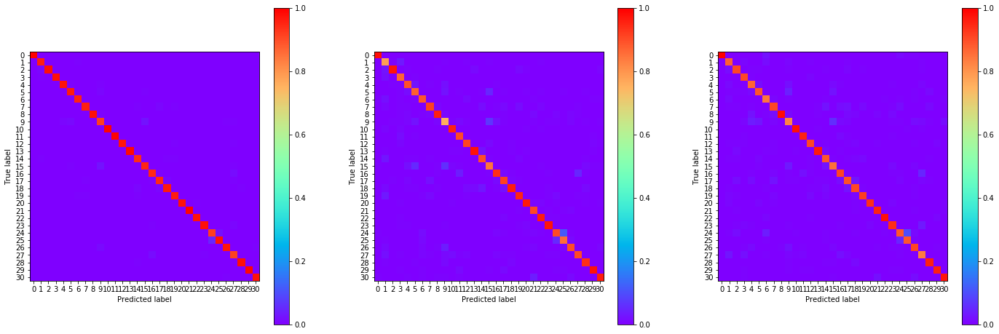

00:29:57.803330
#111 [Train: 0.121] [Test: 0.315] [Valid: 0.314]
#111 [Train: 0.964] [Test: 0.920] [Valid: 0.915]


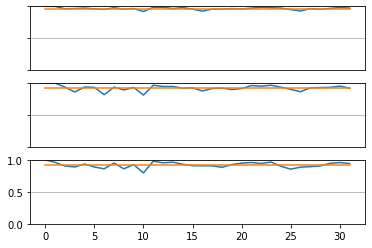

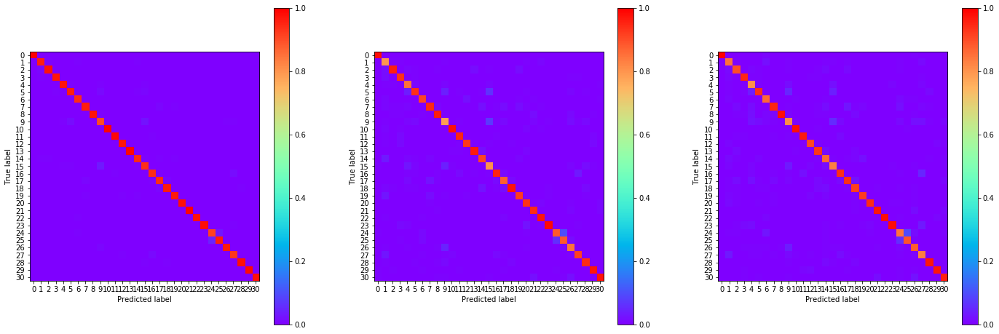

00:30:38.961521
#112 [Train: 0.116] [Test: 0.303] [Valid: 0.311]
#112 [Train: 0.966] [Test: 0.921] [Valid: 0.911]


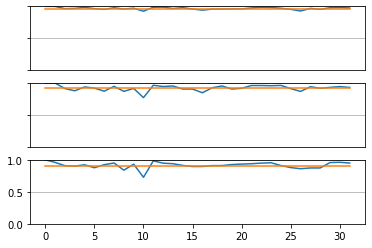

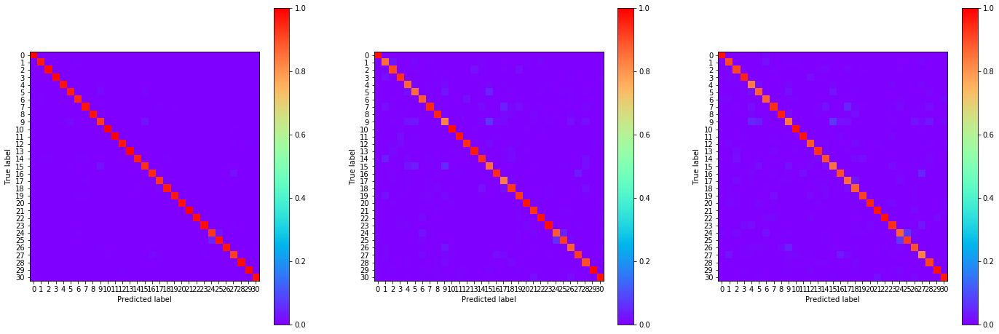

00:31:20.774929
#113 [Train: 0.115] [Test: 0.295] [Valid: 0.326]
#113 [Train: 0.966] [Test: 0.919] [Valid: 0.914]


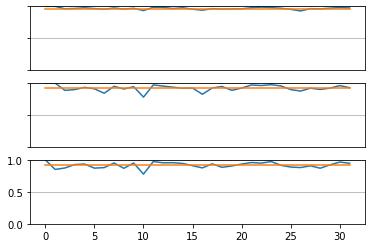

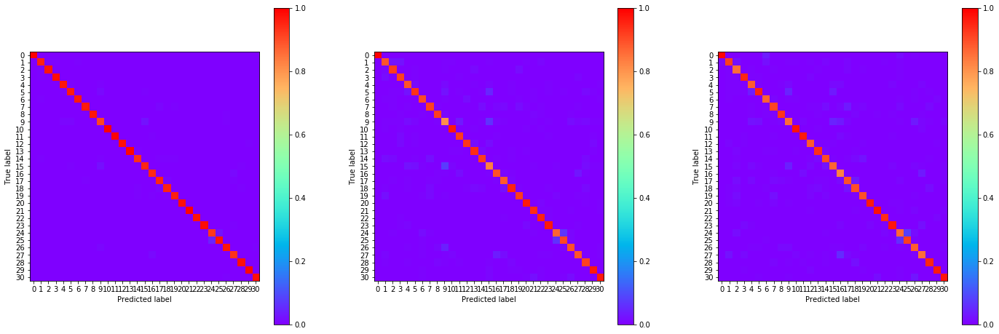

00:32:02.030108
#114 [Train: 0.115] [Test: 0.294] [Valid: 0.312]
#114 [Train: 0.966] [Test: 0.923] [Valid: 0.912]


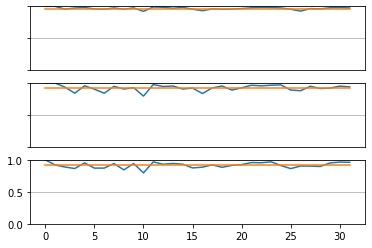

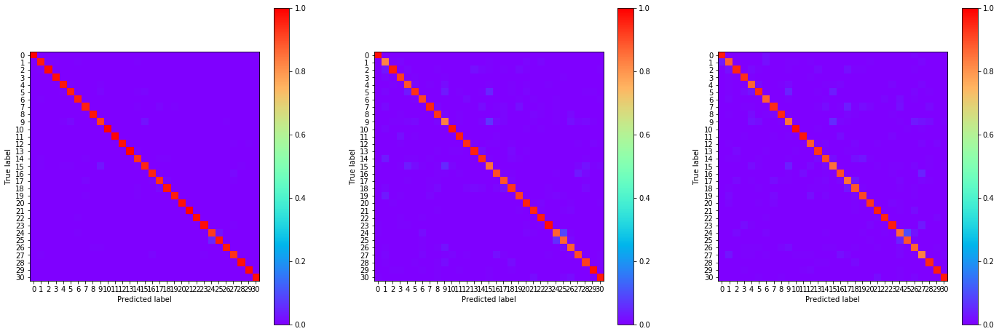

00:32:43.673679
#115 [Train: 0.113] [Test: 0.319] [Valid: 0.318]
#115 [Train: 0.967] [Test: 0.917] [Valid: 0.912]


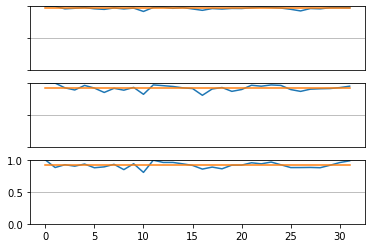

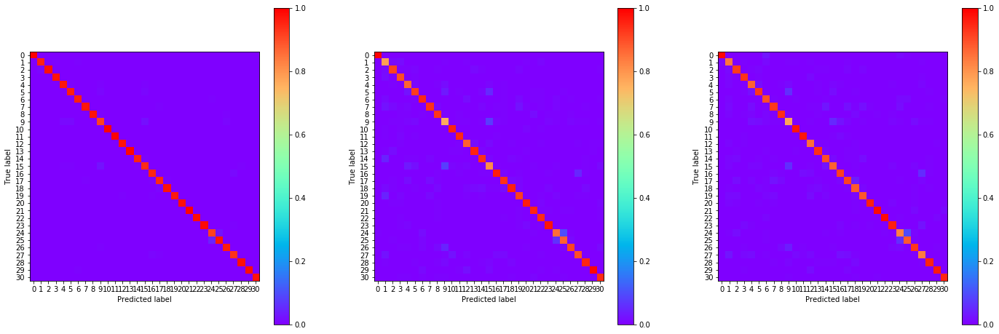

00:33:25.729536
#116 [Train: 0.112] [Test: 0.313] [Valid: 0.322]
#116 [Train: 0.967] [Test: 0.918] [Valid: 0.913]


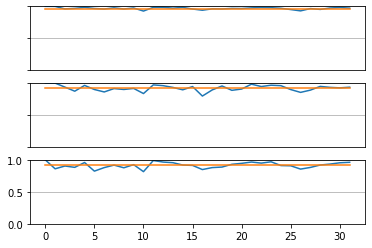

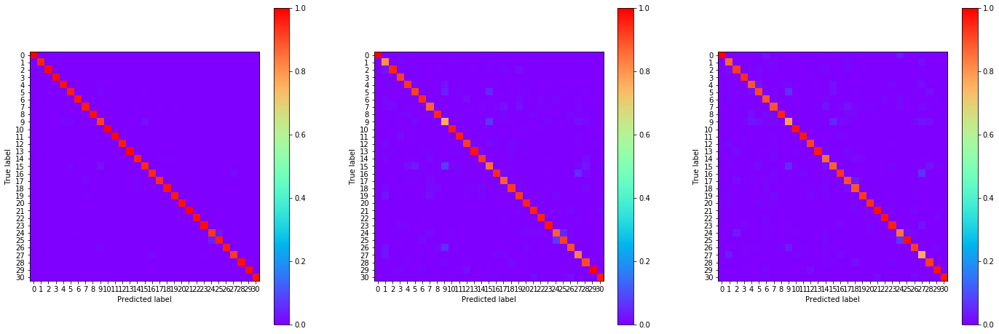

00:34:07.384317
#117 [Train: 0.109] [Test: 0.282] [Valid: 0.312]
#117 [Train: 0.969] [Test: 0.922] [Valid: 0.917]


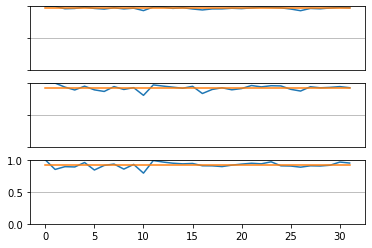

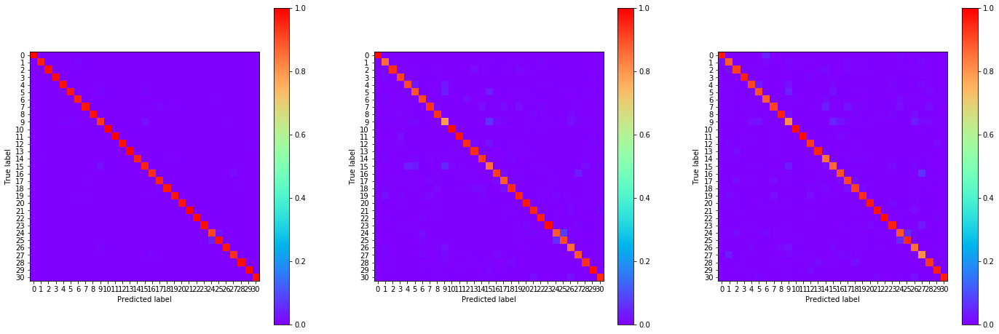

00:34:48.412631
#118 [Train: 0.107] [Test: 0.296] [Valid: 0.327]
#118 [Train: 0.969] [Test: 0.920] [Valid: 0.911]


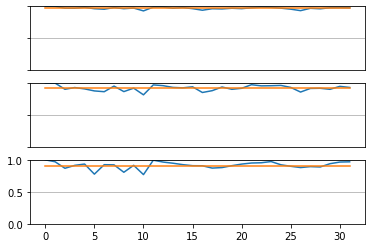

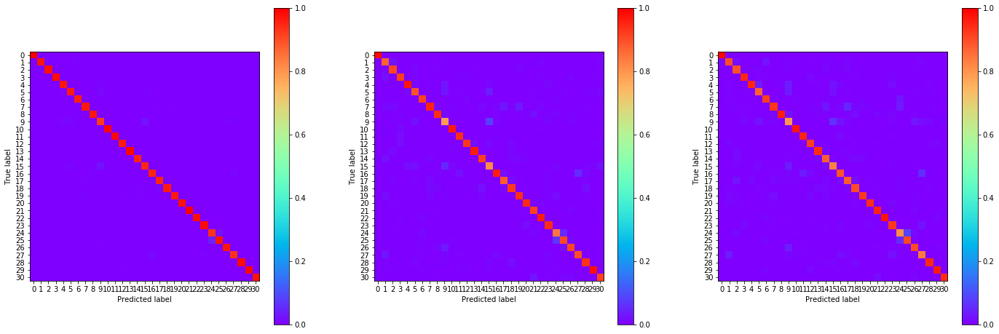

00:35:30.548953
#119 [Train: 0.111] [Test: 0.309] [Valid: 0.346]
#119 [Train: 0.967] [Test: 0.917] [Valid: 0.907]


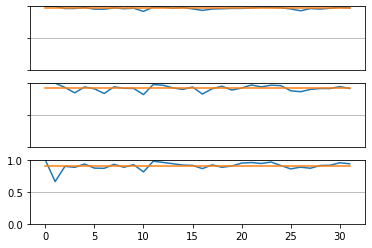

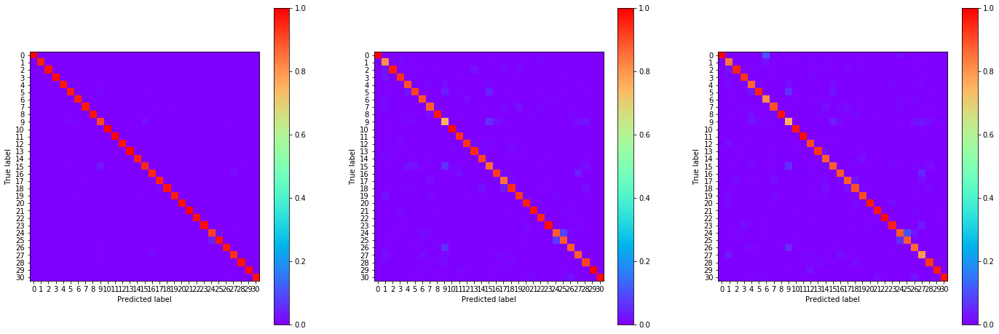

00:36:12.334842
#120 [Train: 0.106] [Test: 0.312] [Valid: 0.323]
#120 [Train: 0.969] [Test: 0.922] [Valid: 0.910]


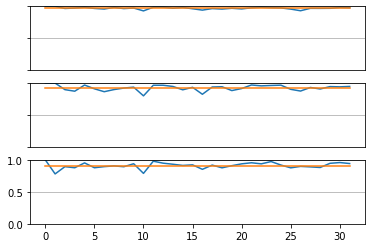

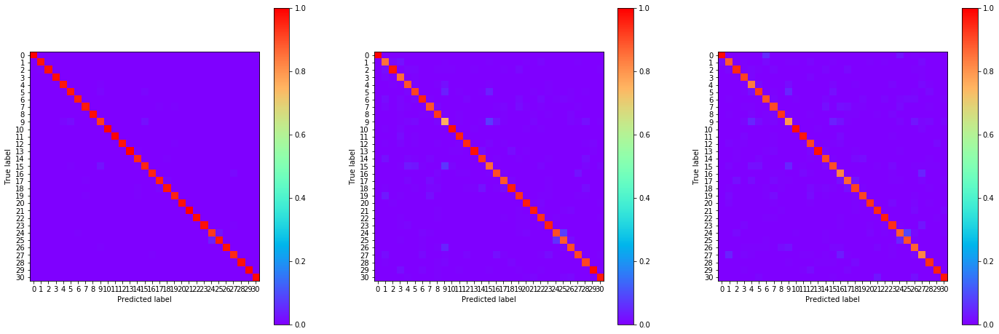

00:36:53.659691
#121 [Train: 0.104] [Test: 0.292] [Valid: 0.328]
#121 [Train: 0.970] [Test: 0.922] [Valid: 0.911]


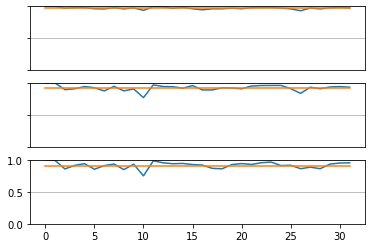

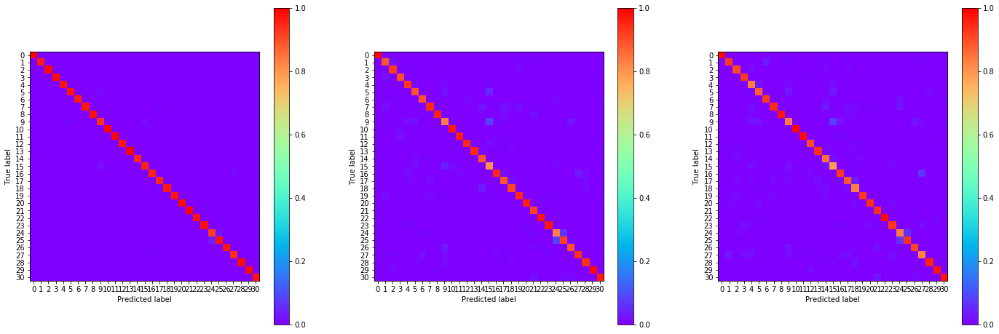

00:37:35.182205
#122 [Train: 0.103] [Test: 0.303] [Valid: 0.312]
#122 [Train: 0.970] [Test: 0.919] [Valid: 0.914]


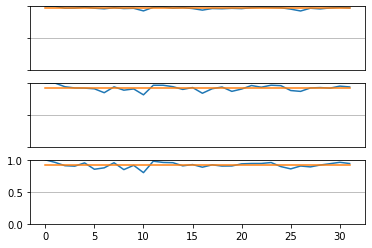

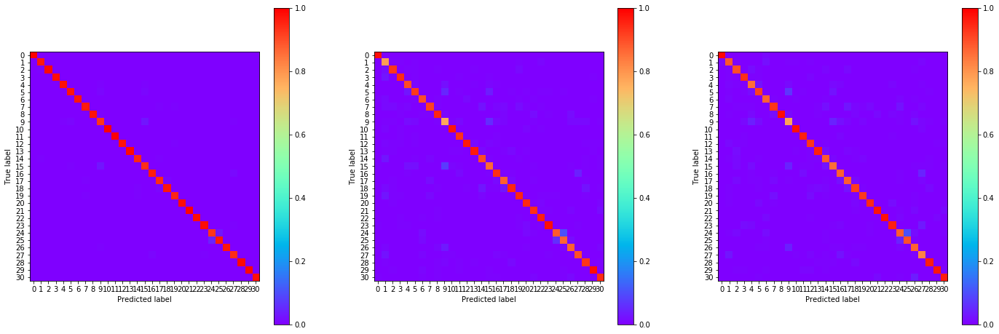

00:38:16.995973
#123 [Train: 0.100] [Test: 0.298] [Valid: 0.322]
#123 [Train: 0.970] [Test: 0.921] [Valid: 0.914]


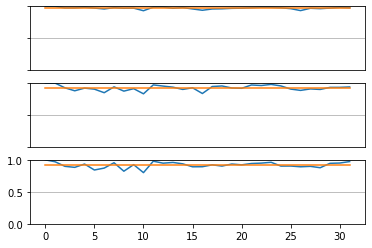

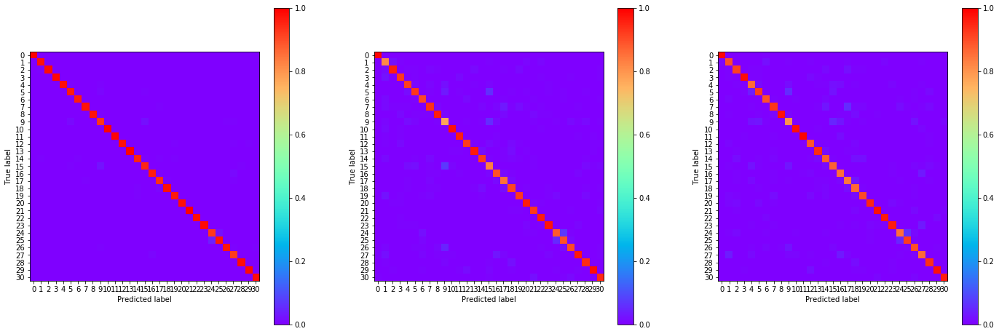

00:38:58.114575
#124 [Train: 0.101] [Test: 0.287] [Valid: 0.313]
#124 [Train: 0.970] [Test: 0.925] [Valid: 0.915]


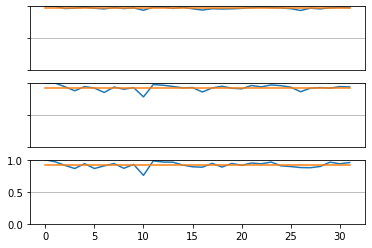

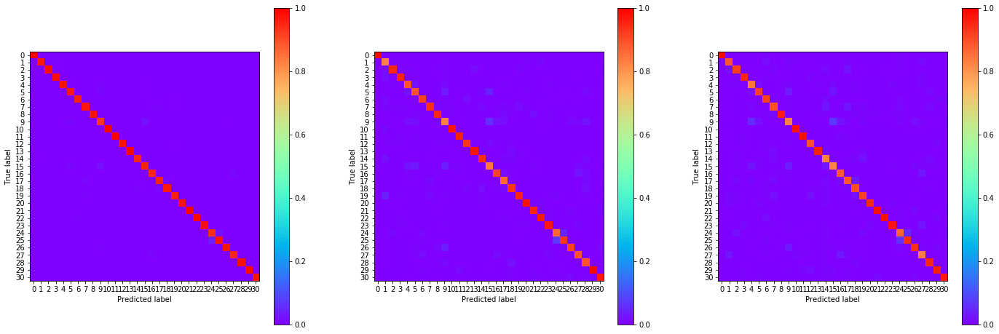

00:39:39.576025
#125 [Train: 0.098] [Test: 0.289] [Valid: 0.317]
#125 [Train: 0.971] [Test: 0.924] [Valid: 0.914]


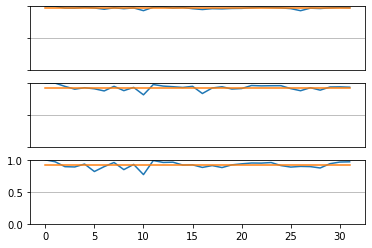

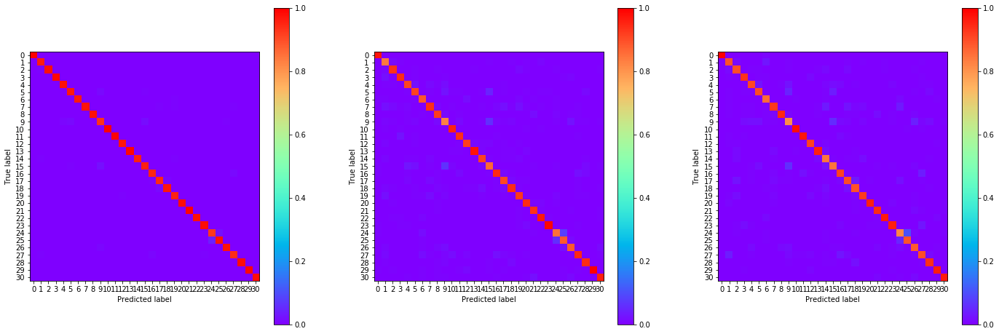

00:40:20.935471
#126 [Train: 0.094] [Test: 0.291] [Valid: 0.328]
#126 [Train: 0.972] [Test: 0.923] [Valid: 0.913]


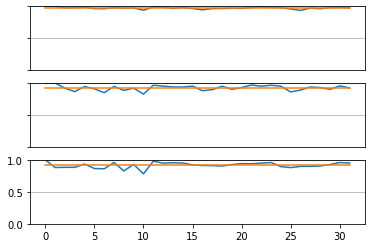

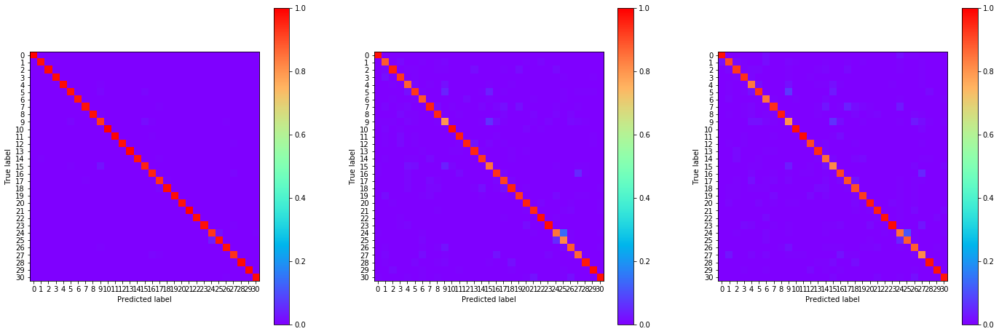

00:41:02.487969
#127 [Train: 0.096] [Test: 0.300] [Valid: 0.323]
#127 [Train: 0.973] [Test: 0.923] [Valid: 0.911]


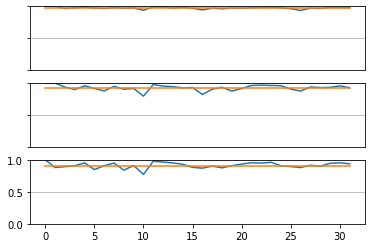

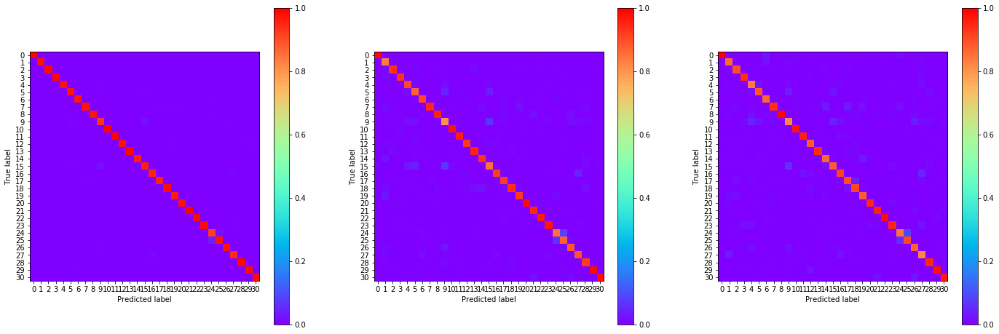

00:41:43.919584
#128 [Train: 0.095] [Test: 0.311] [Valid: 0.315]
#128 [Train: 0.973] [Test: 0.921] [Valid: 0.914]


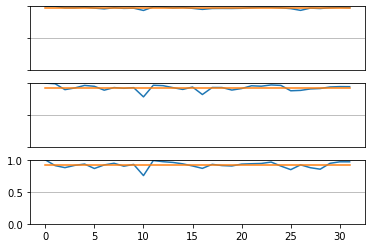

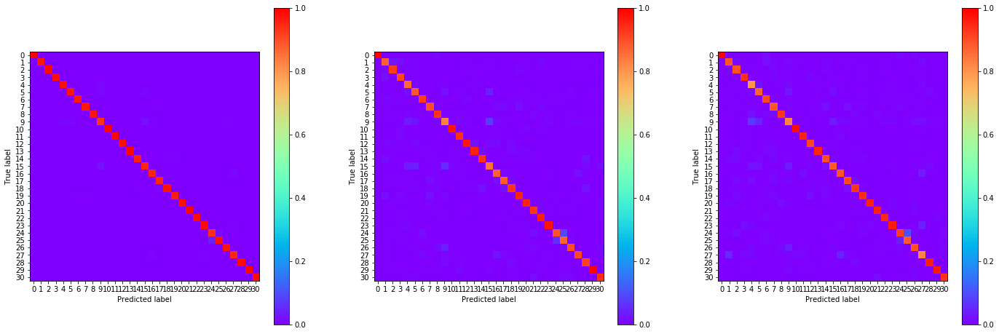

00:42:25.560171
#129 [Train: 0.095] [Test: 0.300] [Valid: 0.315]
#129 [Train: 0.972] [Test: 0.924] [Valid: 0.914]


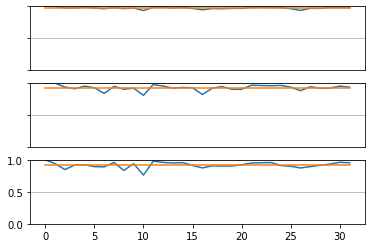

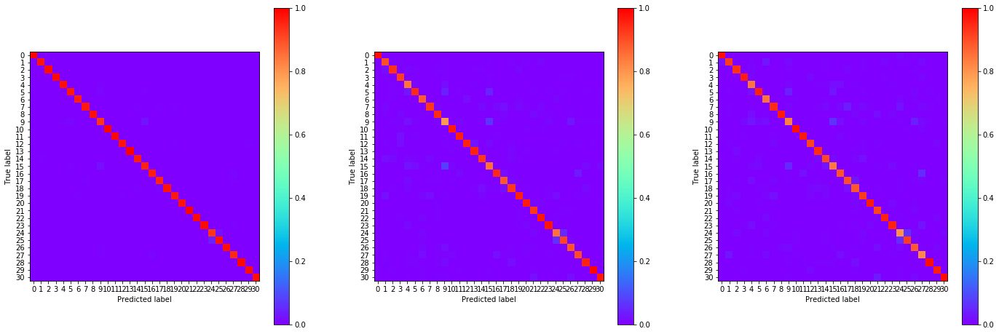

00:43:07.014175
#130 [Train: 0.091] [Test: 0.297] [Valid: 0.339]
#130 [Train: 0.974] [Test: 0.920] [Valid: 0.907]


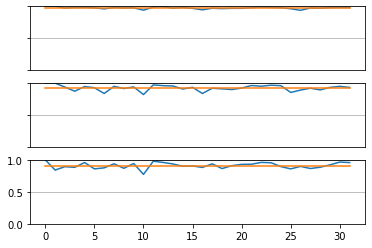

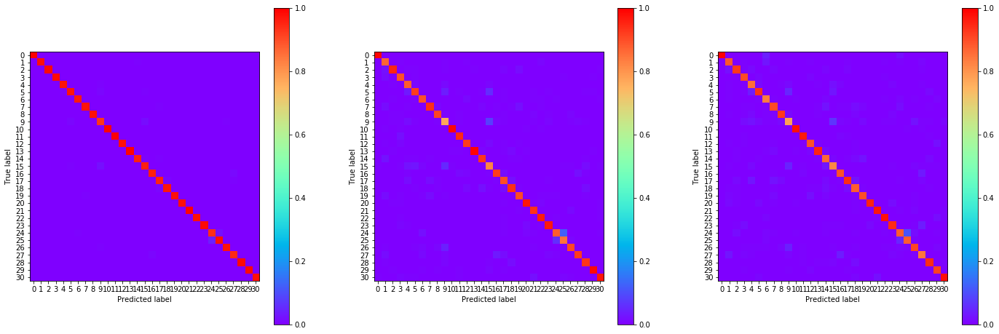

00:43:48.839936
#131 [Train: 0.090] [Test: 0.291] [Valid: 0.320]
#131 [Train: 0.974] [Test: 0.924] [Valid: 0.914]


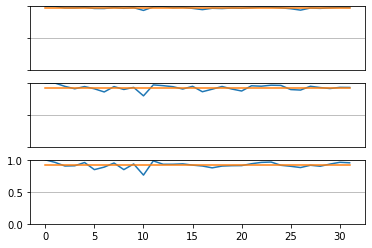

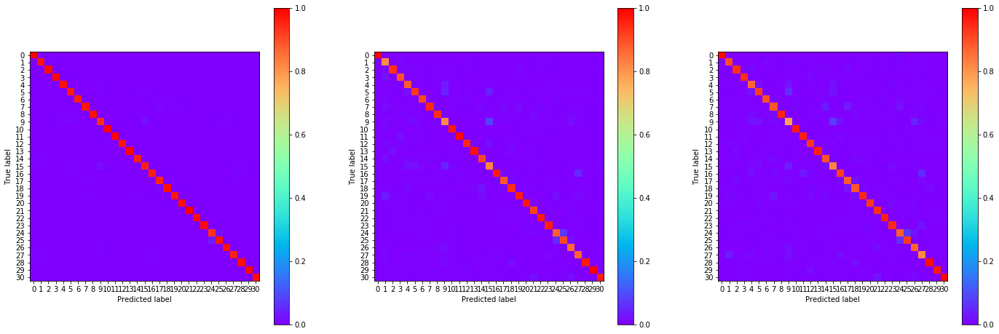

00:44:31.123402
#132 [Train: 0.088] [Test: 0.303] [Valid: 0.335]
#132 [Train: 0.974] [Test: 0.924] [Valid: 0.909]


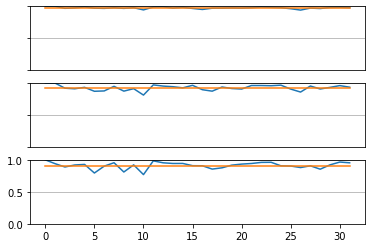

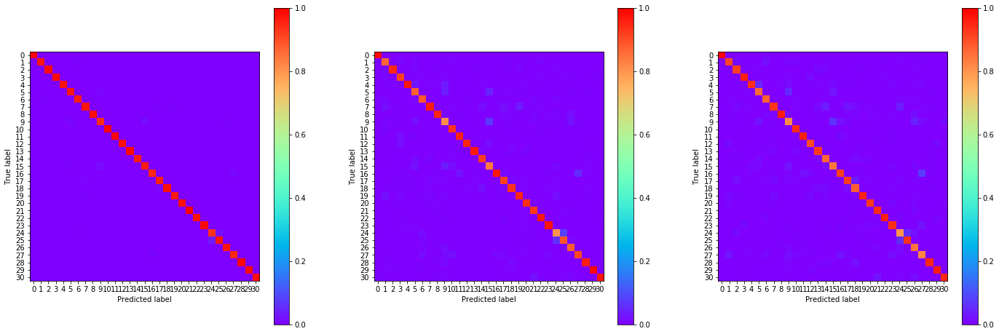

00:45:12.771291
#133 [Train: 0.087] [Test: 0.280] [Valid: 0.318]
#133 [Train: 0.975] [Test: 0.926] [Valid: 0.914]


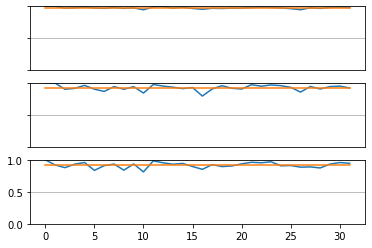

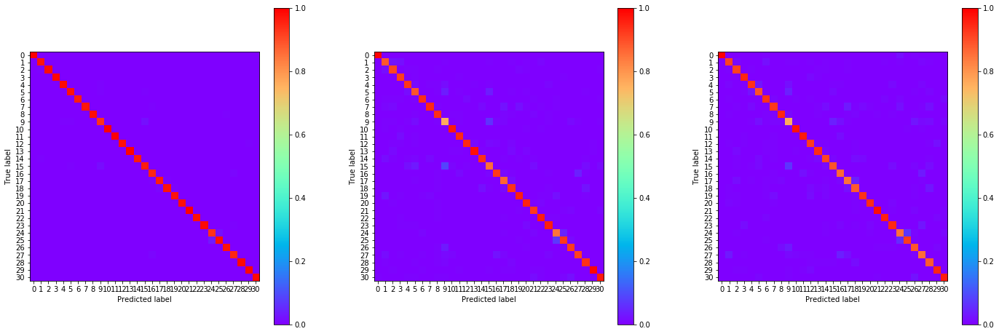

00:45:54.406732
#134 [Train: 0.086] [Test: 0.304] [Valid: 0.334]
#134 [Train: 0.975] [Test: 0.921] [Valid: 0.918]


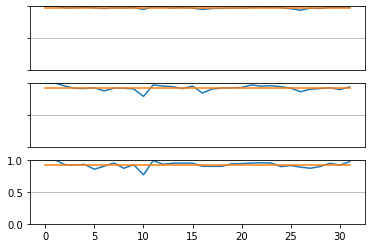

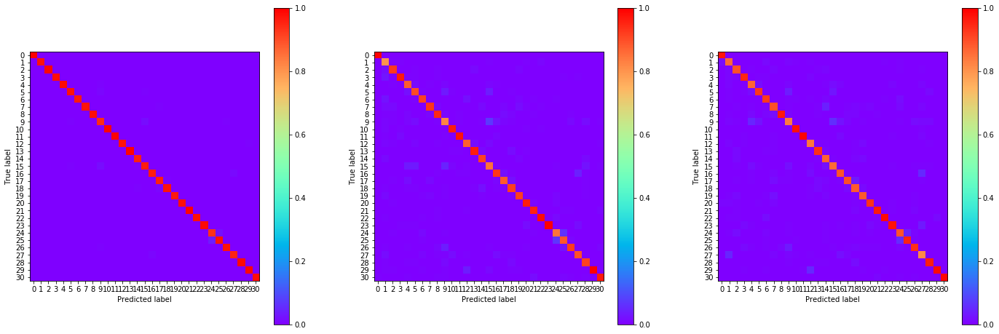

00:46:35.620272
#135 [Train: 0.082] [Test: 0.313] [Valid: 0.327]
#135 [Train: 0.976] [Test: 0.921] [Valid: 0.916]


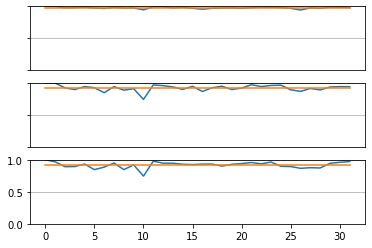

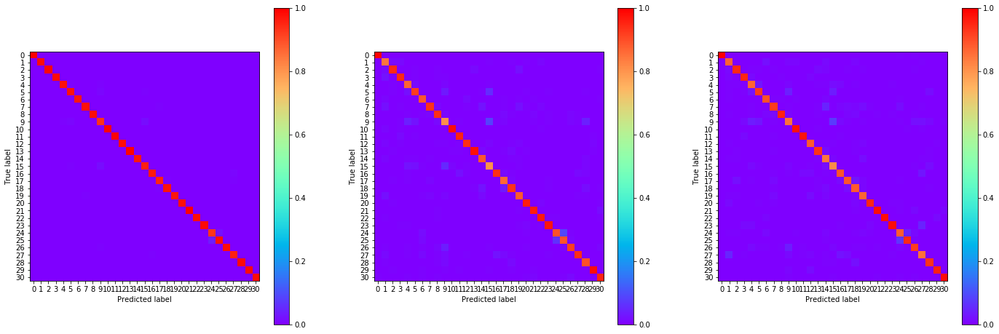

00:47:16.857508
#136 [Train: 0.085] [Test: 0.268] [Valid: 0.316]
#136 [Train: 0.975] [Test: 0.923] [Valid: 0.918]


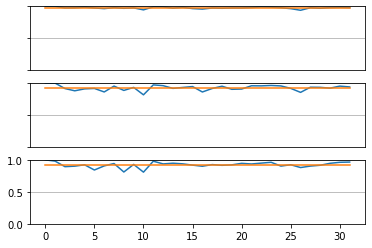

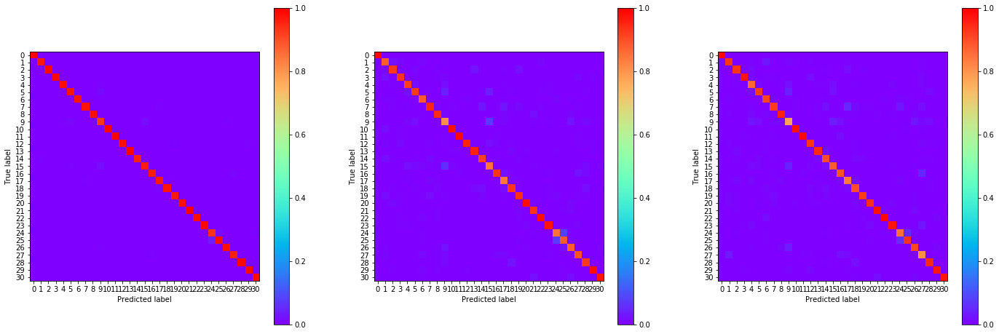

00:47:57.961907
#137 [Train: 0.083] [Test: 0.303] [Valid: 0.322]
#137 [Train: 0.976] [Test: 0.924] [Valid: 0.915]


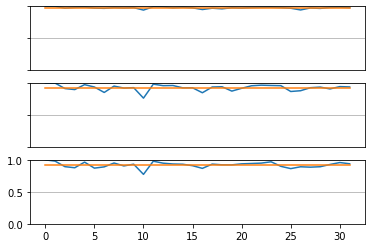

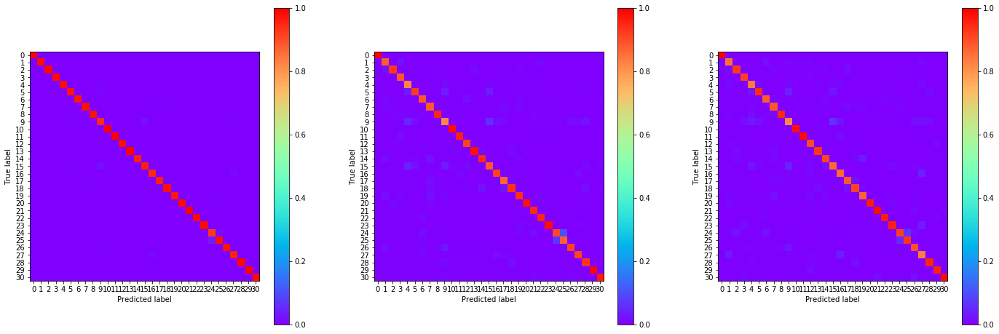

00:48:40.125886
#138 [Train: 0.083] [Test: 0.311] [Valid: 0.333]
#138 [Train: 0.975] [Test: 0.920] [Valid: 0.914]


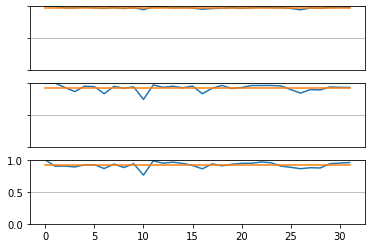

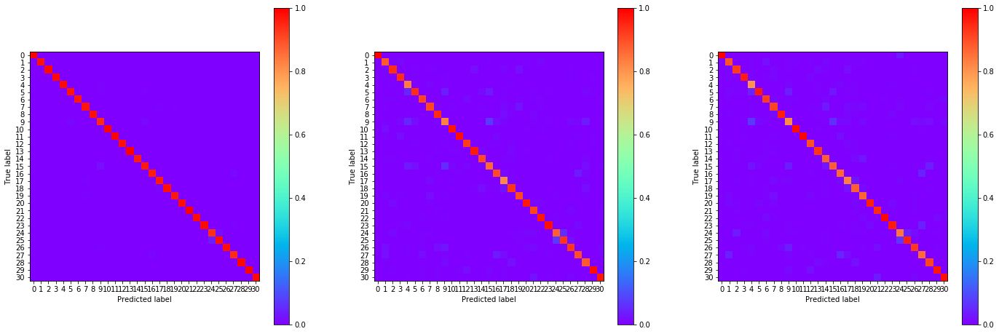

00:49:21.258493
#139 [Train: 0.082] [Test: 0.301] [Valid: 0.311]
#139 [Train: 0.976] [Test: 0.924] [Valid: 0.919]


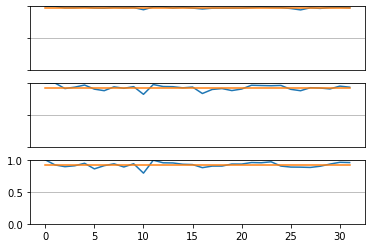

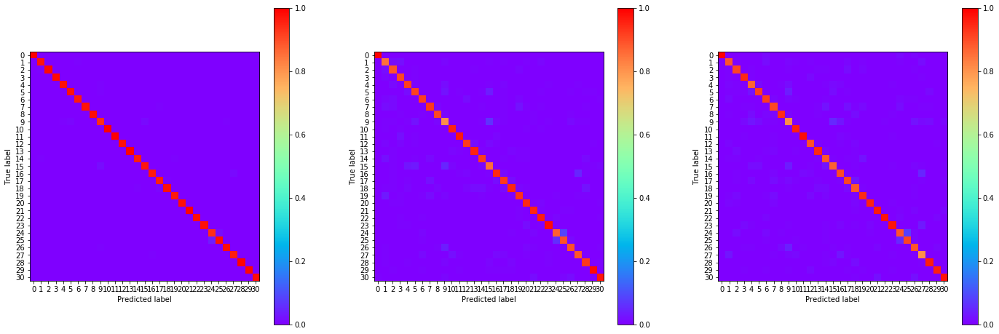

00:50:02.643536
#140 [Train: 0.080] [Test: 0.309] [Valid: 0.347]
#140 [Train: 0.977] [Test: 0.921] [Valid: 0.912]


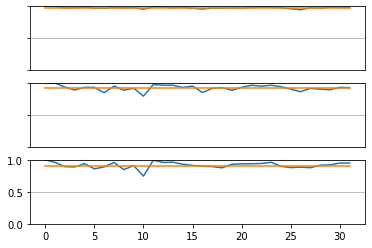

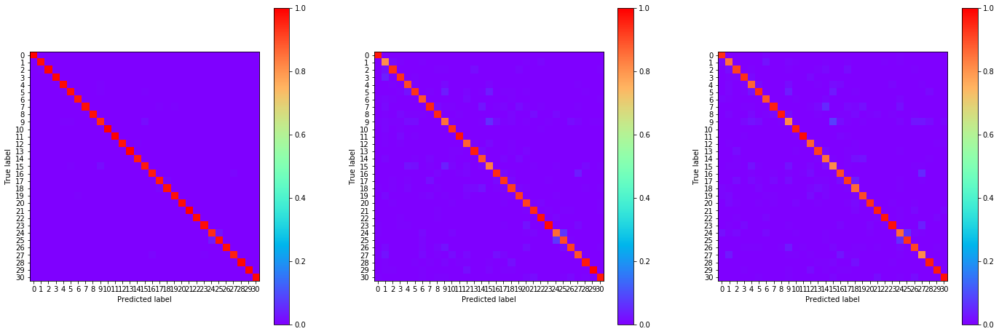

00:50:44.162696
#141 [Train: 0.082] [Test: 0.305] [Valid: 0.323]
#141 [Train: 0.976] [Test: 0.926] [Valid: 0.913]


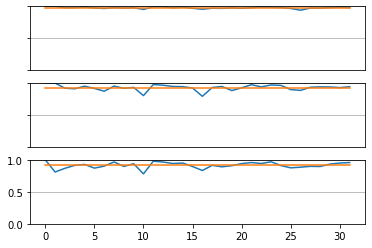

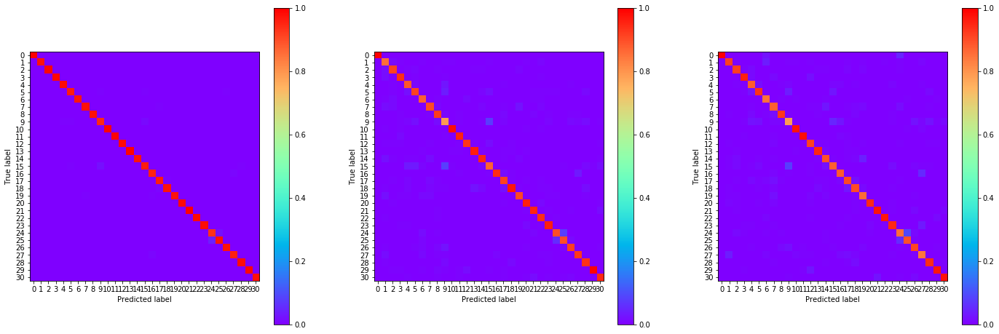

00:51:25.554667
#142 [Train: 0.078] [Test: 0.305] [Valid: 0.336]
#142 [Train: 0.977] [Test: 0.924] [Valid: 0.914]


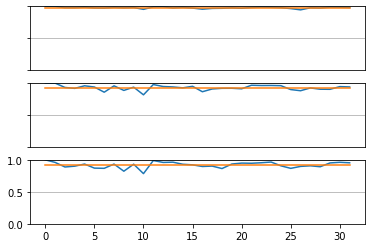

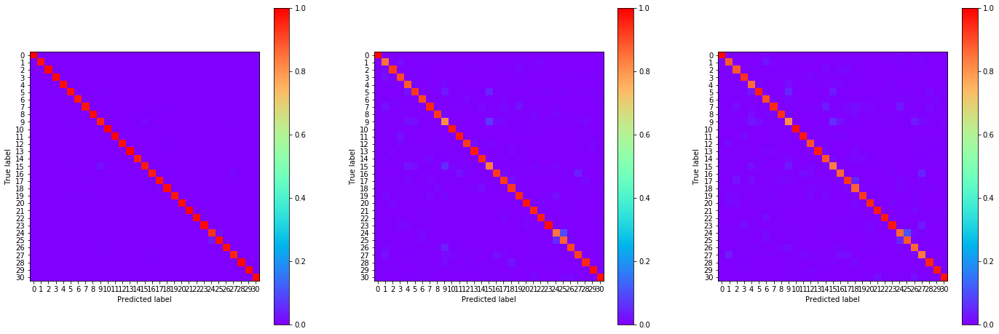

00:52:07.069381
#143 [Train: 0.078] [Test: 0.335] [Valid: 0.337]
#143 [Train: 0.977] [Test: 0.922] [Valid: 0.913]


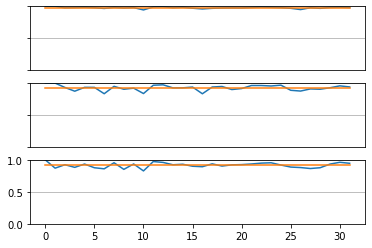

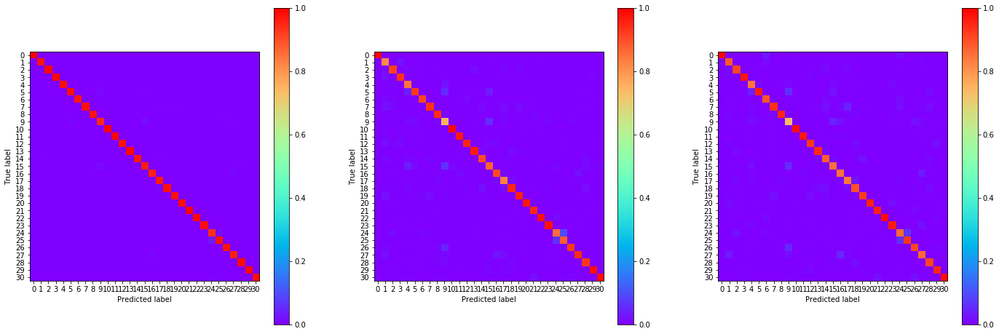

00:52:48.753143
#144 [Train: 0.080] [Test: 0.321] [Valid: 0.334]
#144 [Train: 0.976] [Test: 0.923] [Valid: 0.915]


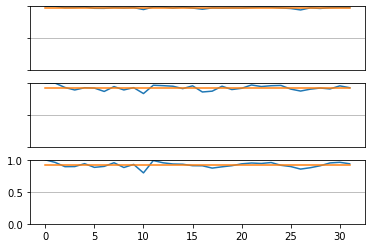

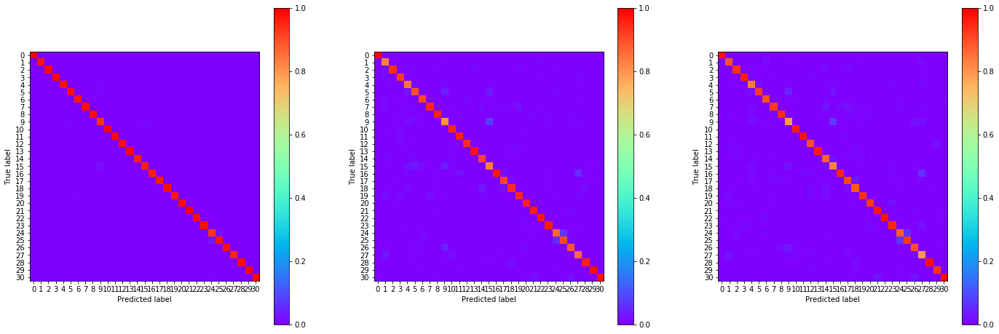

00:53:30.181282
#145 [Train: 0.075] [Test: 0.313] [Valid: 0.340]
#145 [Train: 0.978] [Test: 0.922] [Valid: 0.913]


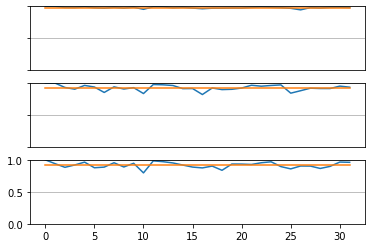

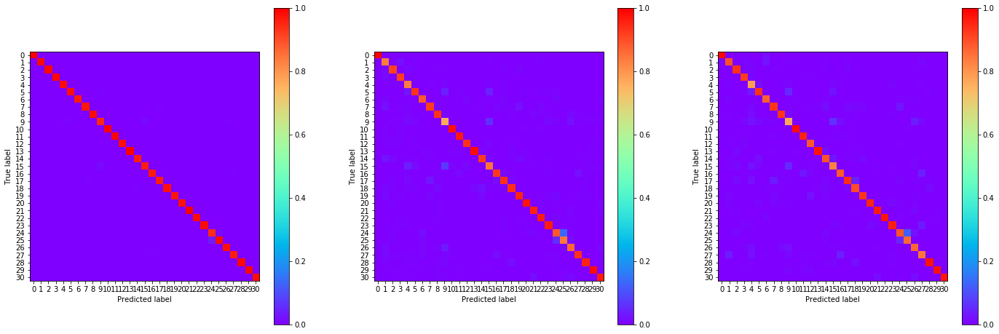

00:54:12.216730
#146 [Train: 0.072] [Test: 0.339] [Valid: 0.357]
#146 [Train: 0.980] [Test: 0.920] [Valid: 0.910]


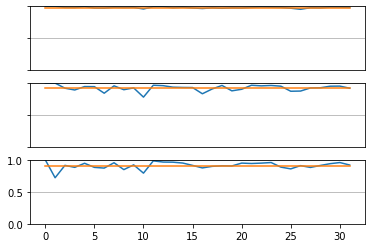

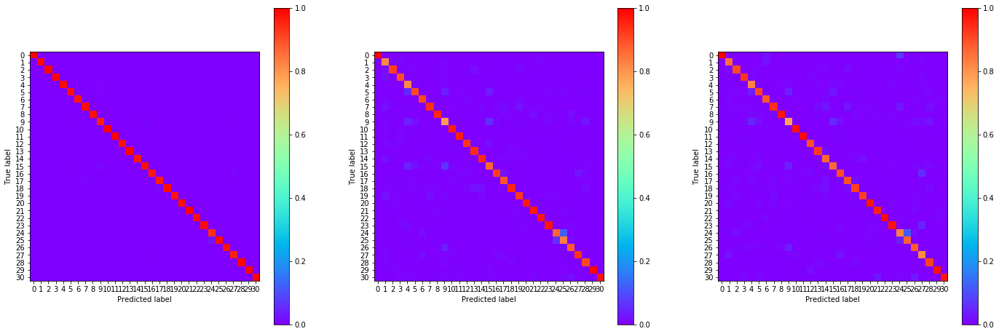

00:55:34.832409
#148 [Train: 0.073] [Test: 0.316] [Valid: 0.339]
#148 [Train: 0.979] [Test: 0.924] [Valid: 0.915]


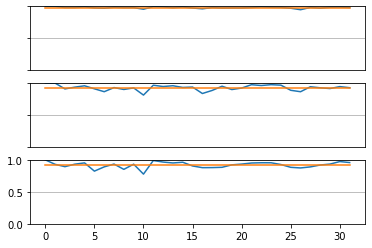

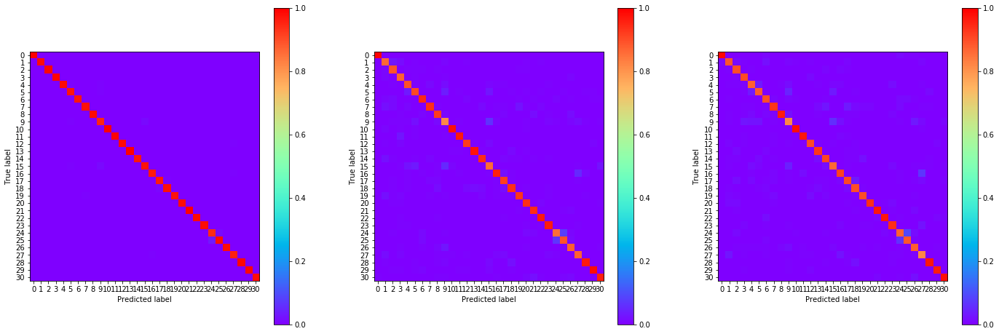

00:56:16.191780
#149 [Train: 0.073] [Test: 0.350] [Valid: 0.364]
#149 [Train: 0.978] [Test: 0.918] [Valid: 0.912]


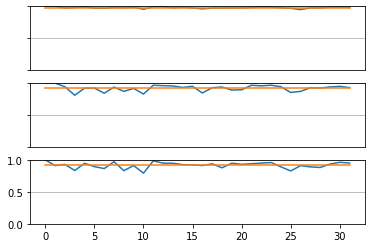

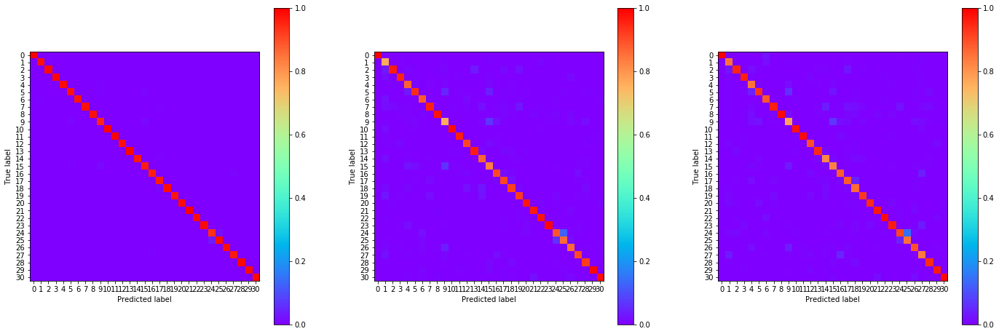

00:56:57.526075
#150 [Train: 0.073] [Test: 0.318] [Valid: 0.329]
#150 [Train: 0.978] [Test: 0.923] [Valid: 0.919]


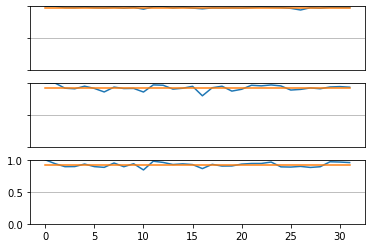

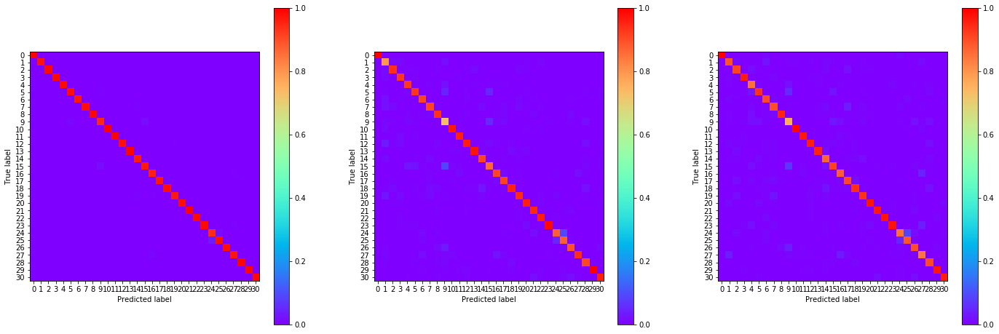

00:57:38.882324
#151 [Train: 0.070] [Test: 0.317] [Valid: 0.326]
#151 [Train: 0.980] [Test: 0.922] [Valid: 0.918]


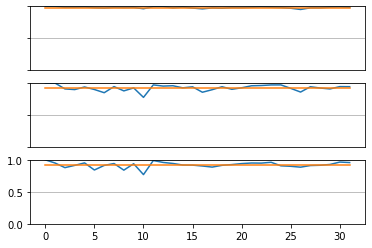

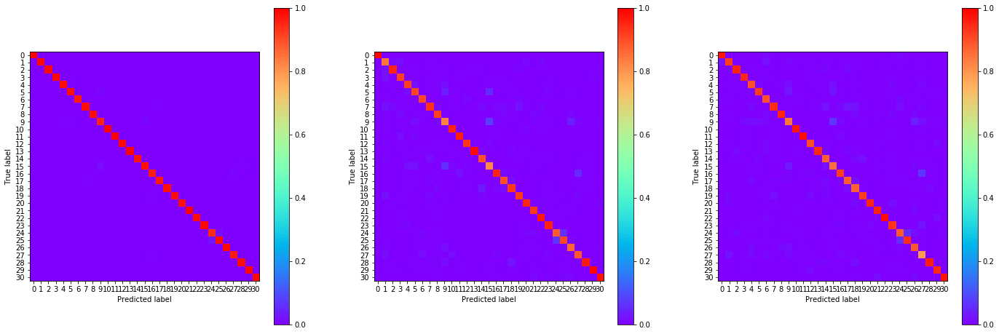

00:58:20.680014
#152 [Train: 0.072] [Test: 0.313] [Valid: 0.375]
#152 [Train: 0.979] [Test: 0.923] [Valid: 0.909]


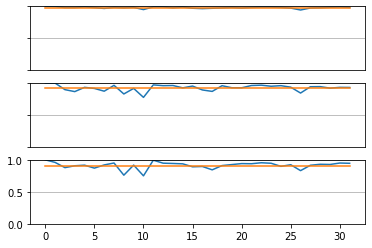

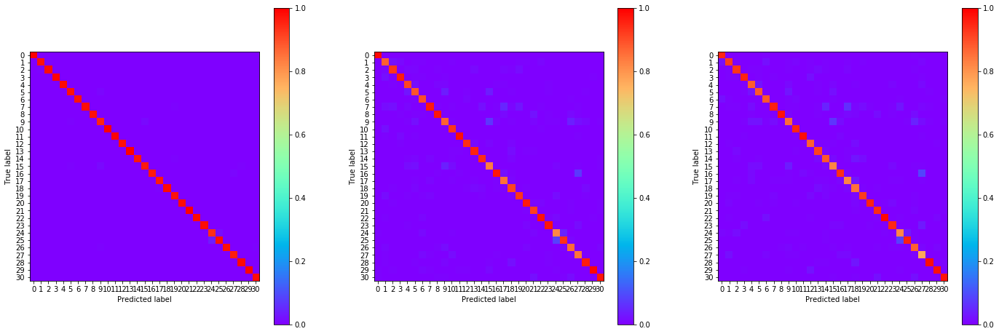

00:59:01.440517
#153 [Train: 0.072] [Test: 0.324] [Valid: 0.353]
#153 [Train: 0.978] [Test: 0.923] [Valid: 0.912]


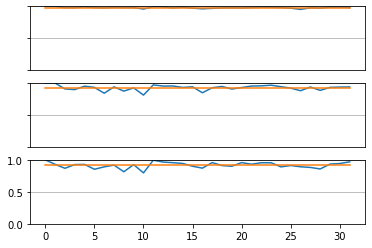

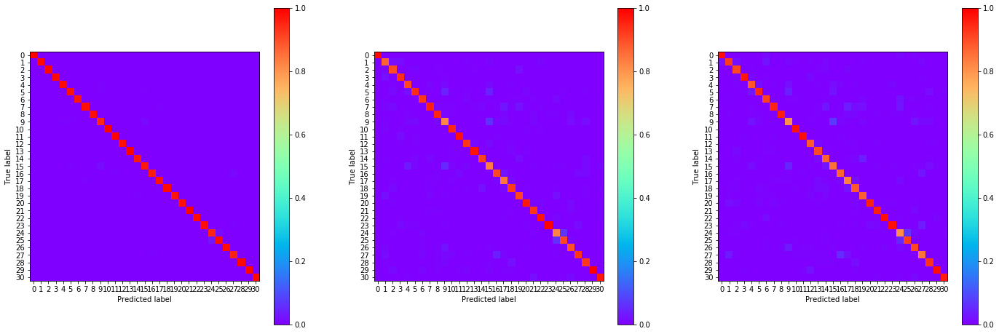

00:59:42.726987
#154 [Train: 0.073] [Test: 0.311] [Valid: 0.330]
#154 [Train: 0.978] [Test: 0.925] [Valid: 0.917]


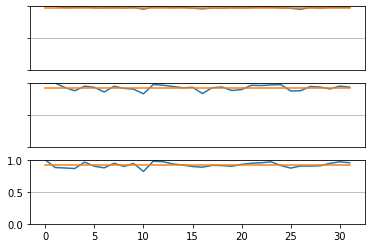

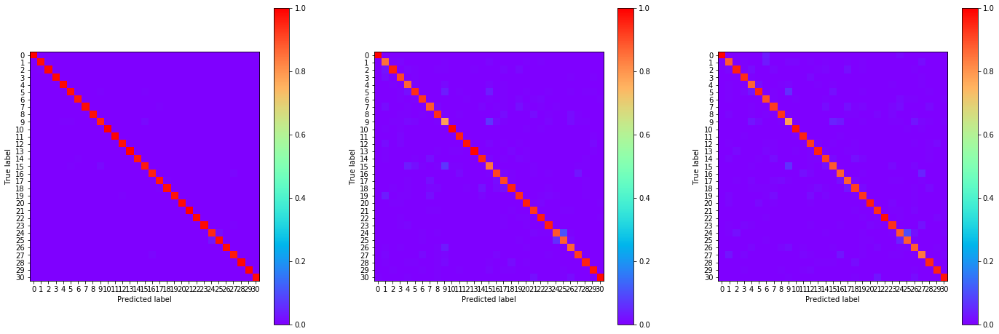

01:00:23.863873
#155 [Train: 0.067] [Test: 0.336] [Valid: 0.347]
#155 [Train: 0.981] [Test: 0.919] [Valid: 0.915]


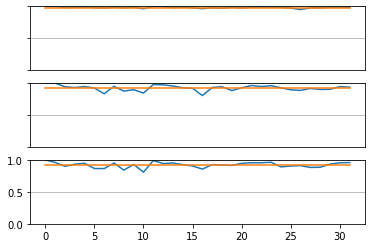

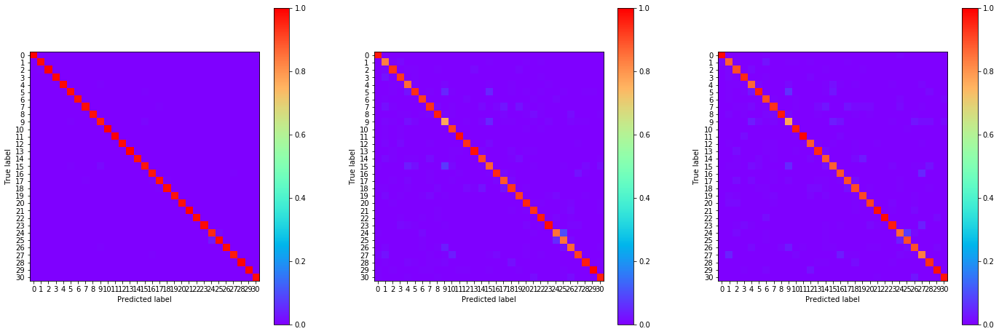

01:02:27.242215
#158 [Train: 0.065] [Test: 0.309] [Valid: 0.356]
#158 [Train: 0.981] [Test: 0.925] [Valid: 0.913]


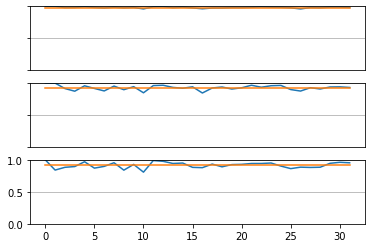

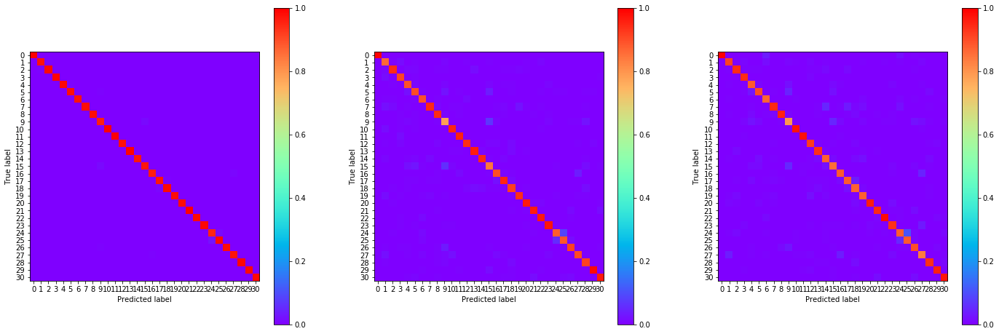

01:03:08.593763
#159 [Train: 0.066] [Test: 0.310] [Valid: 0.347]
#159 [Train: 0.980] [Test: 0.927] [Valid: 0.912]


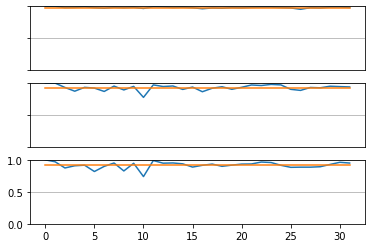

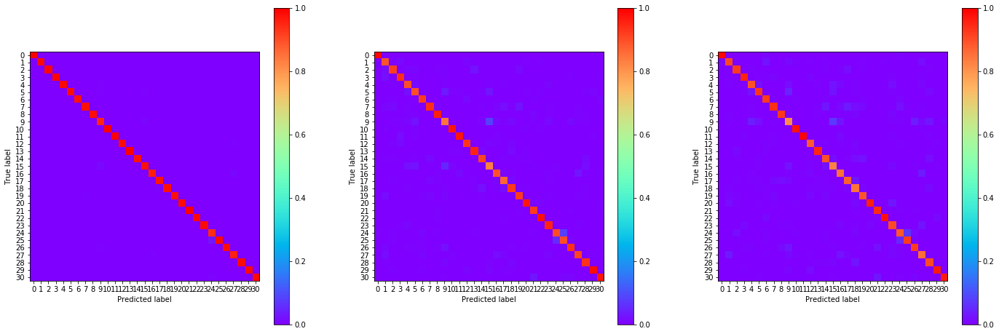

01:03:49.719529
#160 [Train: 0.066] [Test: 0.308] [Valid: 0.347]
#160 [Train: 0.981] [Test: 0.924] [Valid: 0.914]


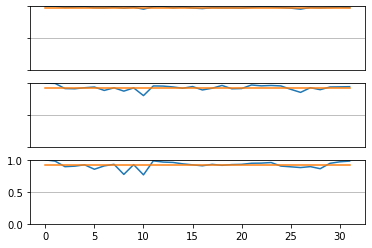

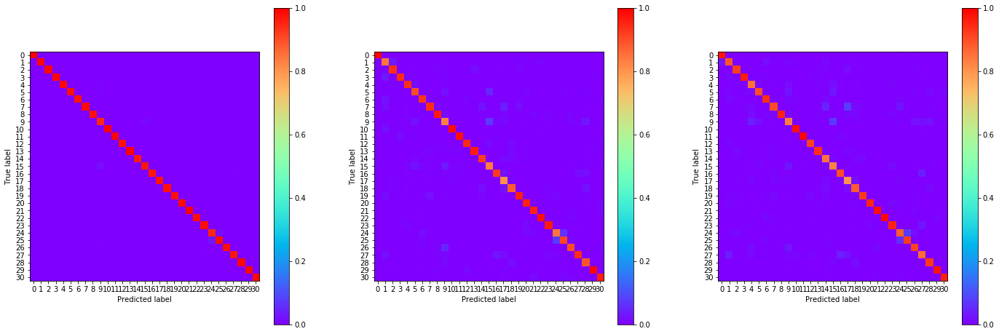

01:04:31.131661
#161 [Train: 0.062] [Test: 0.340] [Valid: 0.351]
#161 [Train: 0.982] [Test: 0.919] [Valid: 0.915]


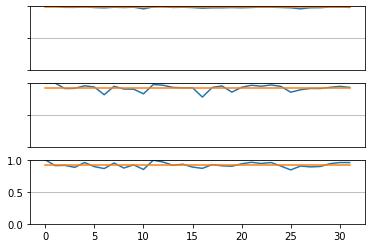

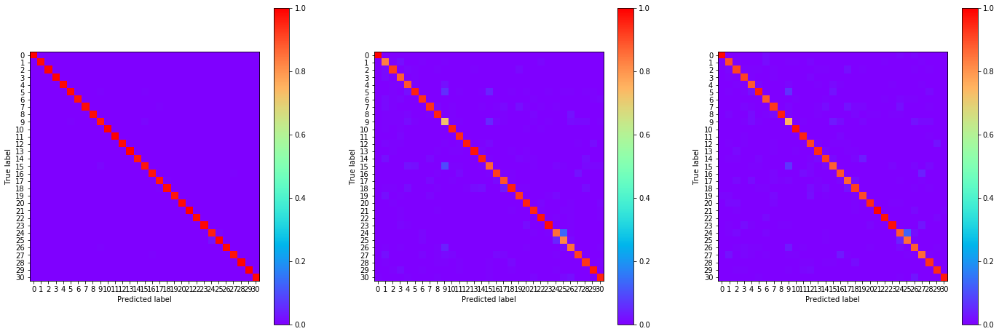

01:05:12.706804
#162 [Train: 0.063] [Test: 0.307] [Valid: 0.347]
#162 [Train: 0.981] [Test: 0.924] [Valid: 0.911]


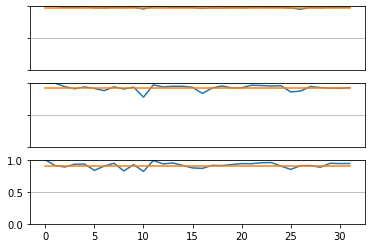

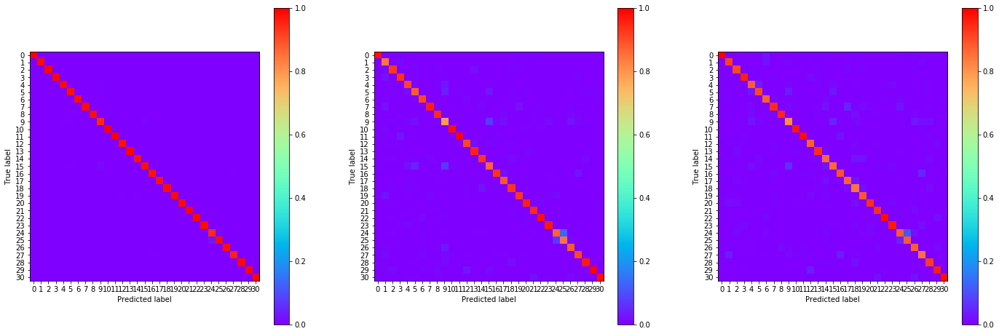

01:05:53.853414
#163 [Train: 0.065] [Test: 0.324] [Valid: 0.342]
#163 [Train: 0.981] [Test: 0.925] [Valid: 0.914]


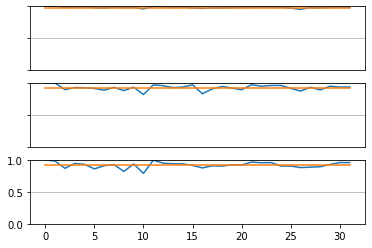

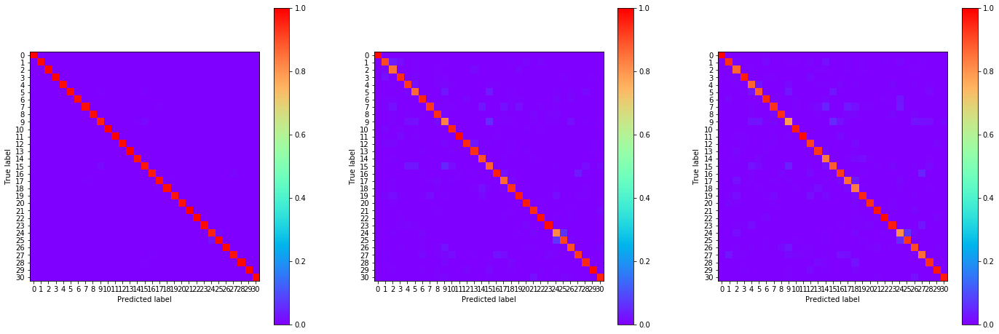

01:06:36.148226
#164 [Train: 0.060] [Test: 0.306] [Valid: 0.338]
#164 [Train: 0.983] [Test: 0.925] [Valid: 0.914]


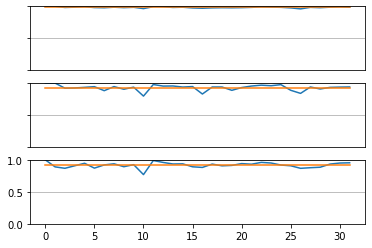

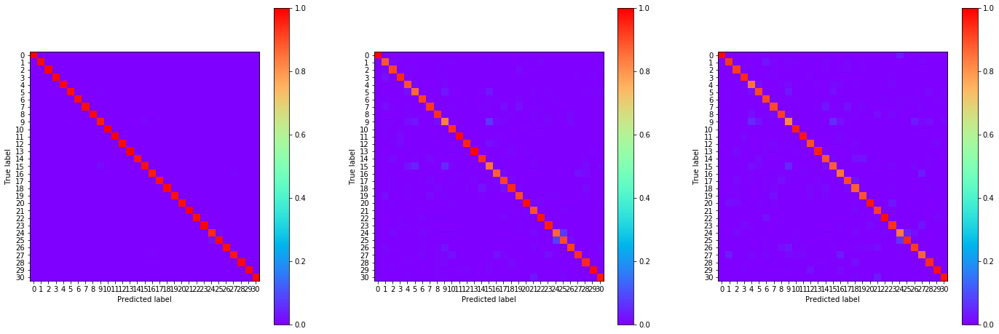

01:07:17.441410
#165 [Train: 0.061] [Test: 0.330] [Valid: 0.362]
#165 [Train: 0.982] [Test: 0.923] [Valid: 0.912]


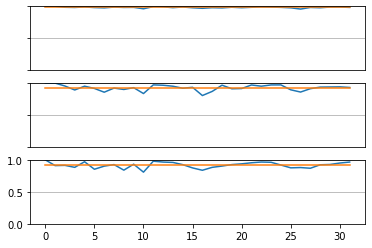

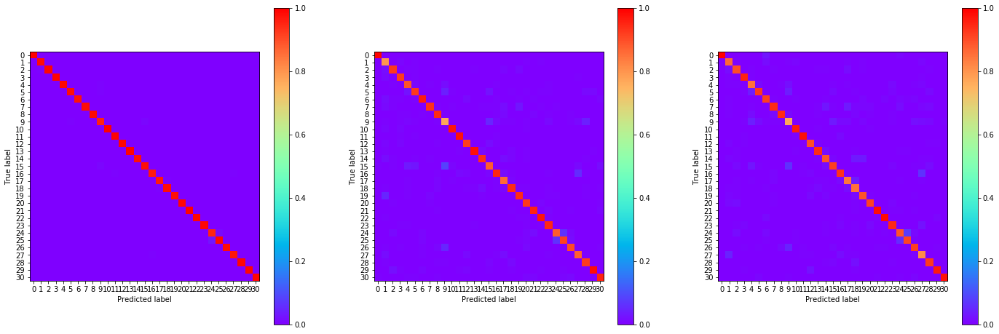

01:07:58.601744
#166 [Train: 0.060] [Test: 0.329] [Valid: 0.370]
#166 [Train: 0.983] [Test: 0.922] [Valid: 0.913]


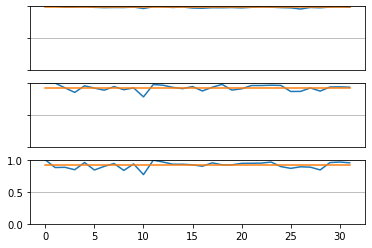

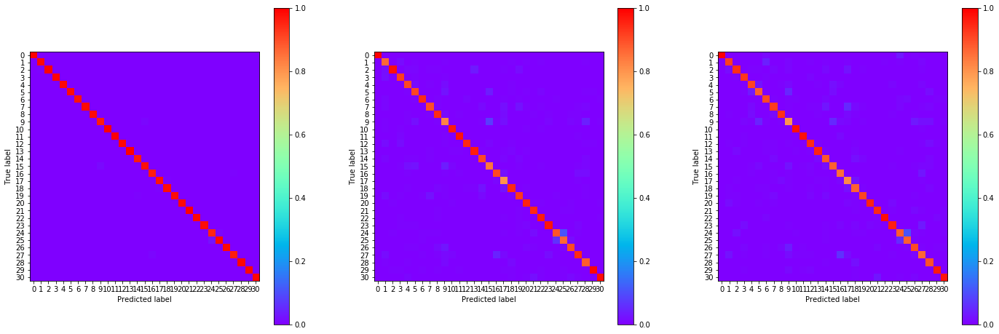

01:08:39.911400
#167 [Train: 0.058] [Test: 0.347] [Valid: 0.369]
#167 [Train: 0.983] [Test: 0.917] [Valid: 0.912]


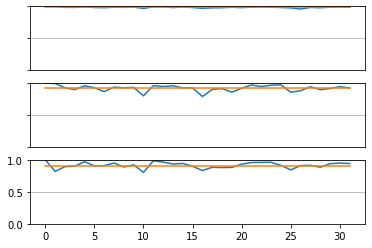

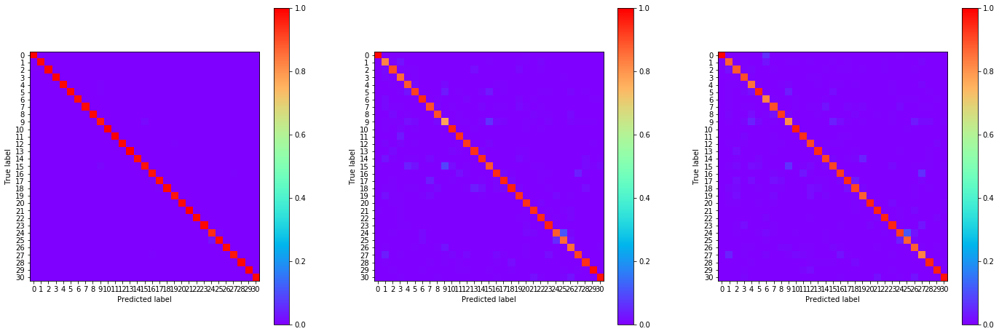

01:09:22.028271
#168 [Train: 0.056] [Test: 0.354] [Valid: 0.364]
#168 [Train: 0.984] [Test: 0.921] [Valid: 0.913]


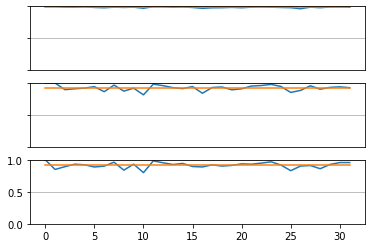

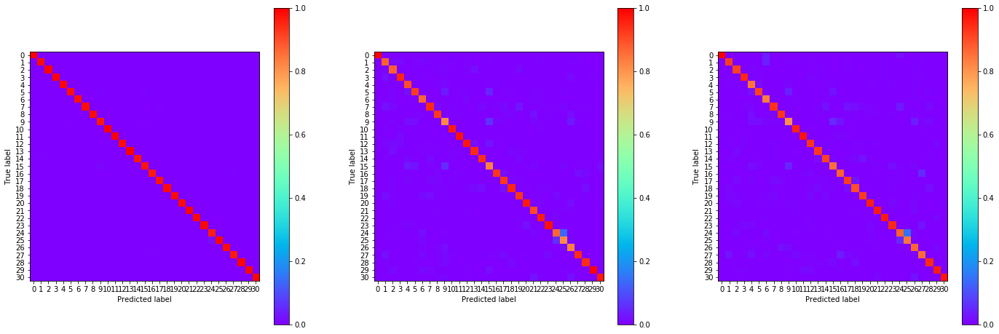

01:10:03.144153
#169 [Train: 0.056] [Test: 0.344] [Valid: 0.367]
#169 [Train: 0.984] [Test: 0.919] [Valid: 0.913]


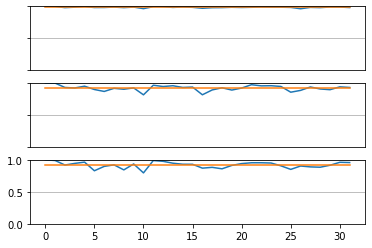

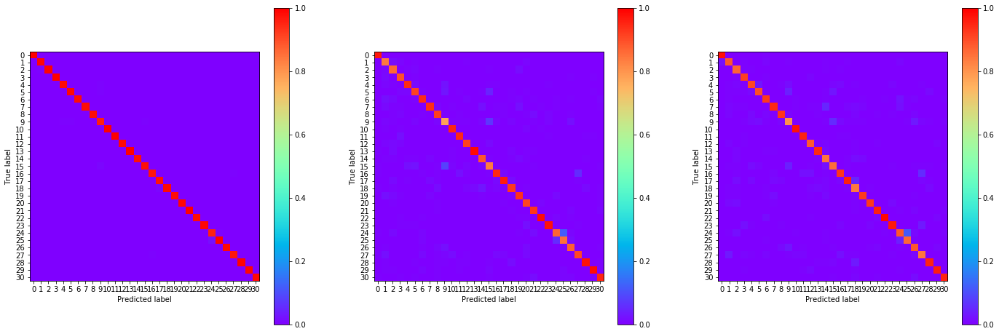

01:10:45.037798
#170 [Train: 0.057] [Test: 0.321] [Valid: 0.351]
#170 [Train: 0.983] [Test: 0.928] [Valid: 0.918]


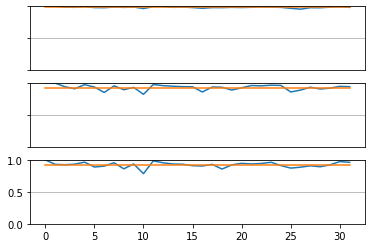

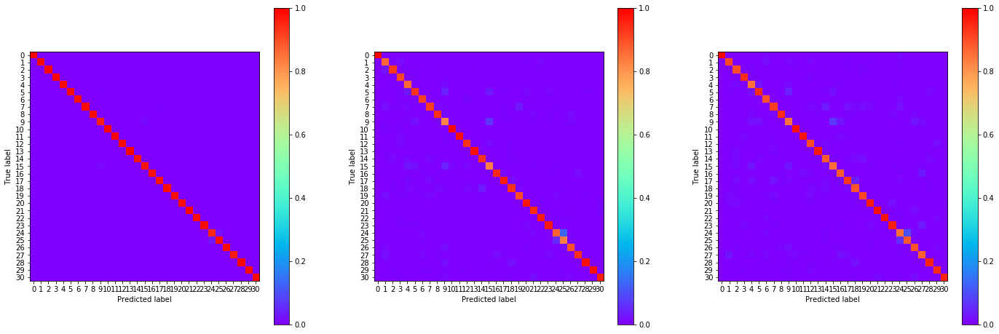

01:11:26.403750
#171 [Train: 0.053] [Test: 0.327] [Valid: 0.377]
#171 [Train: 0.985] [Test: 0.920] [Valid: 0.913]


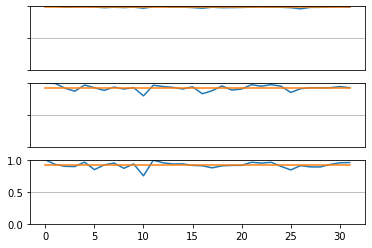

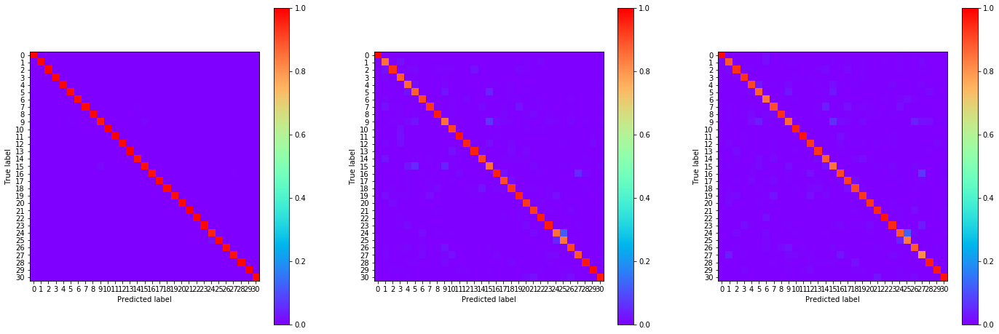

01:12:07.513025
#172 [Train: 0.053] [Test: 0.340] [Valid: 0.362]
#172 [Train: 0.985] [Test: 0.925] [Valid: 0.915]


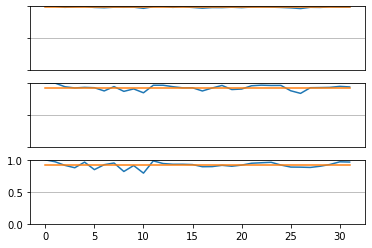

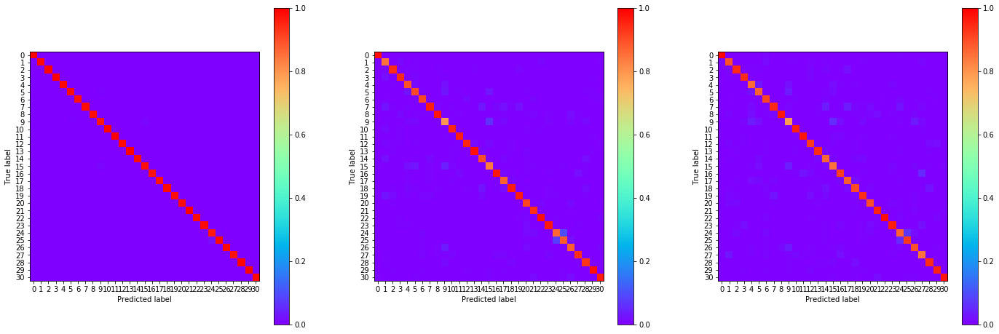

01:12:48.921556
#173 [Train: 0.054] [Test: 0.343] [Valid: 0.382]
#173 [Train: 0.984] [Test: 0.923] [Valid: 0.912]


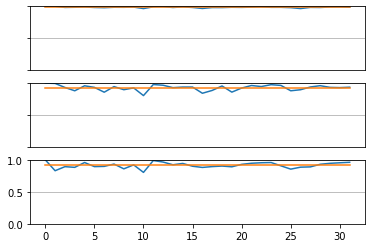

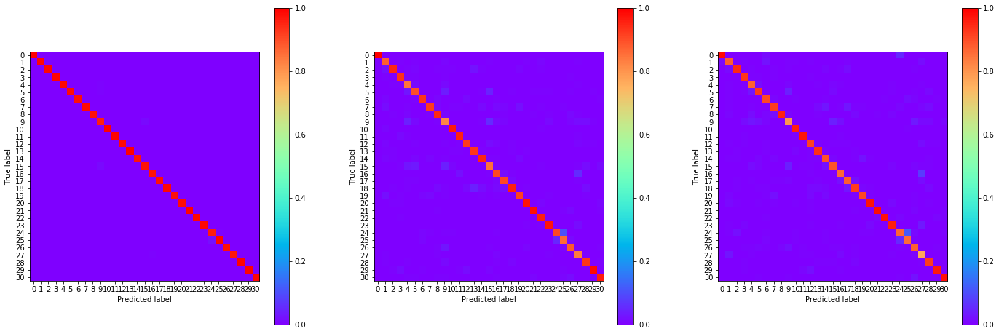

01:13:30.007318
#174 [Train: 0.058] [Test: 0.331] [Valid: 0.385]
#174 [Train: 0.983] [Test: 0.917] [Valid: 0.906]


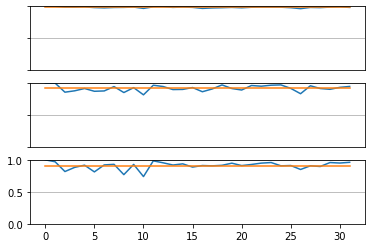

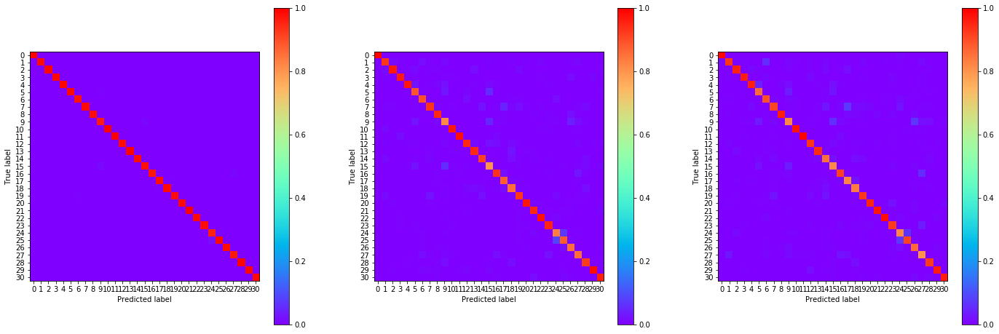

01:14:11.009668
#175 [Train: 0.056] [Test: 0.317] [Valid: 0.355]
#175 [Train: 0.984] [Test: 0.924] [Valid: 0.915]


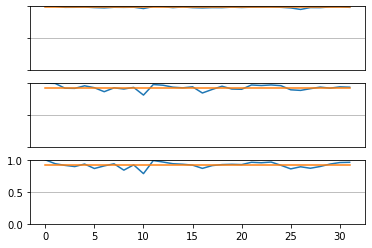

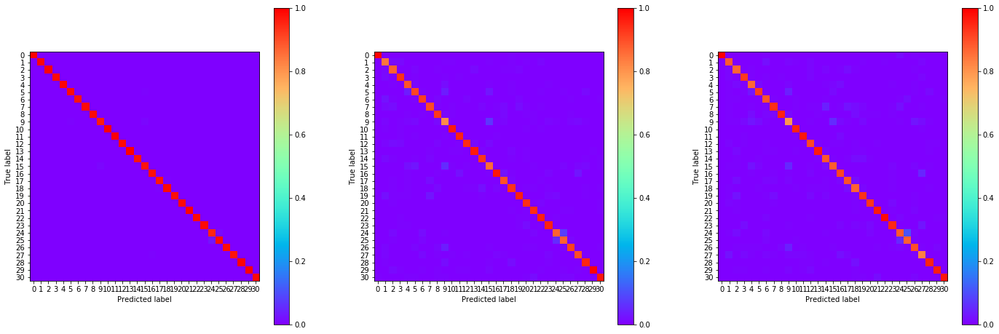

01:14:52.724392
#176 [Train: 0.051] [Test: 0.313] [Valid: 0.354]
#176 [Train: 0.986] [Test: 0.926] [Valid: 0.914]


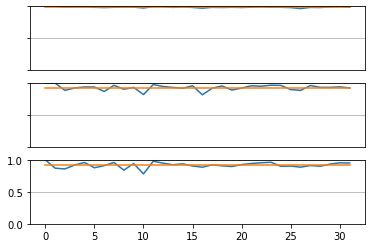

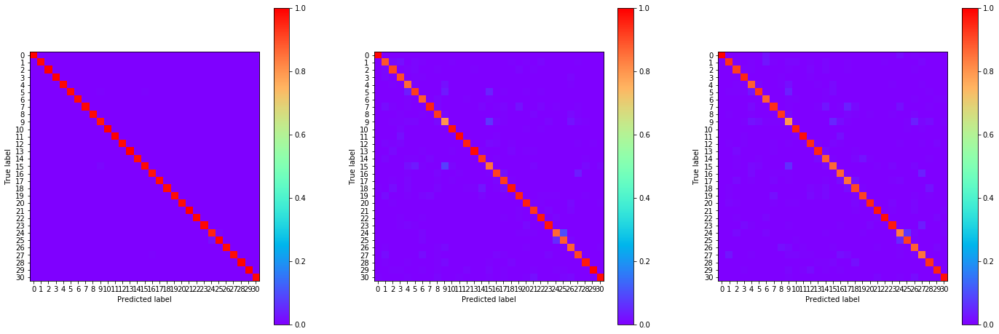

01:15:33.810532
#177 [Train: 0.053] [Test: 0.348] [Valid: 0.379]
#177 [Train: 0.985] [Test: 0.922] [Valid: 0.911]


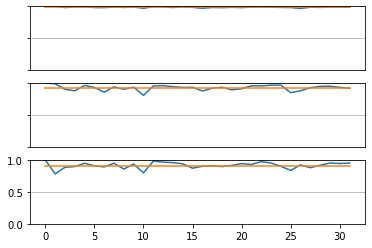

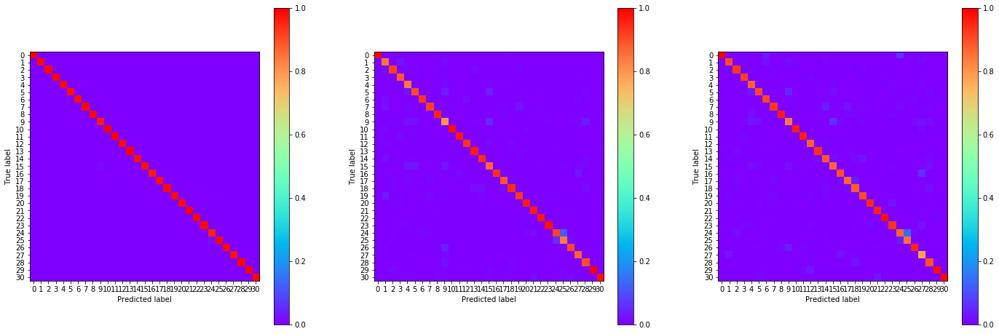

01:16:15.364223
#178 [Train: 0.051] [Test: 0.351] [Valid: 0.372]
#178 [Train: 0.985] [Test: 0.923] [Valid: 0.912]


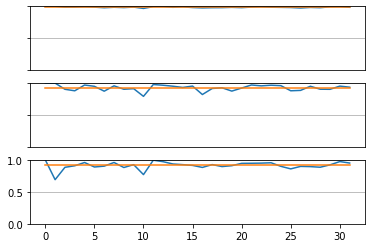

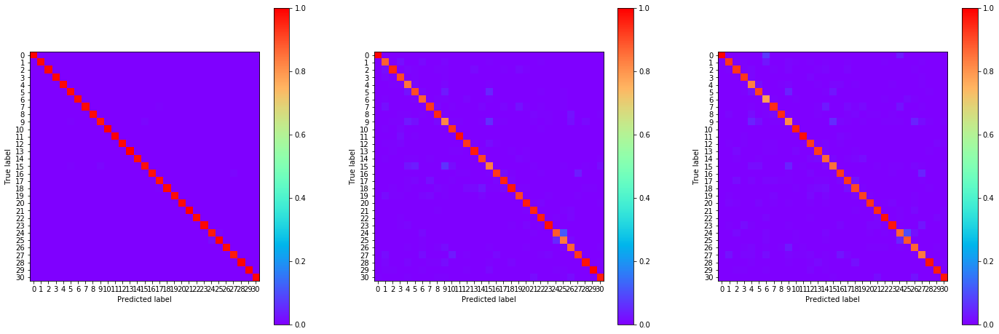

01:16:56.857208
#179 [Train: 0.051] [Test: 0.339] [Valid: 0.369]
#179 [Train: 0.985] [Test: 0.922] [Valid: 0.914]


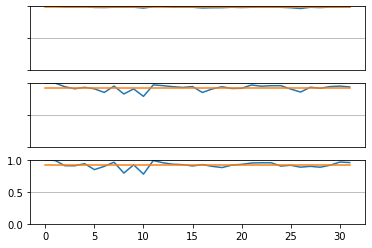

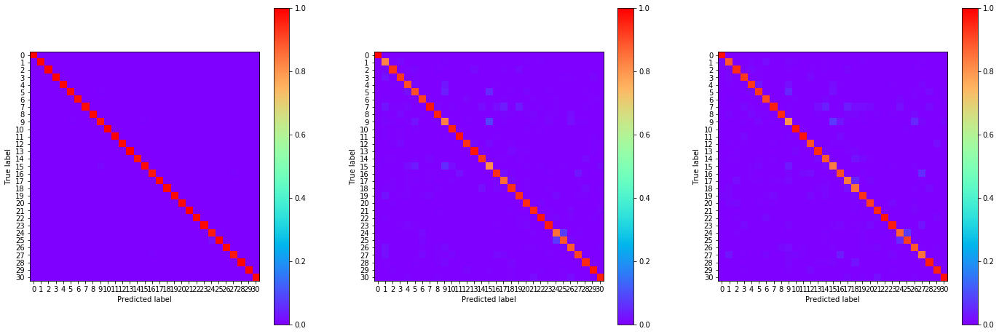

01:17:38.468378
#180 [Train: 0.049] [Test: 0.326] [Valid: 0.366]
#180 [Train: 0.986] [Test: 0.925] [Valid: 0.914]


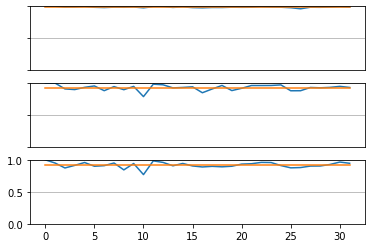

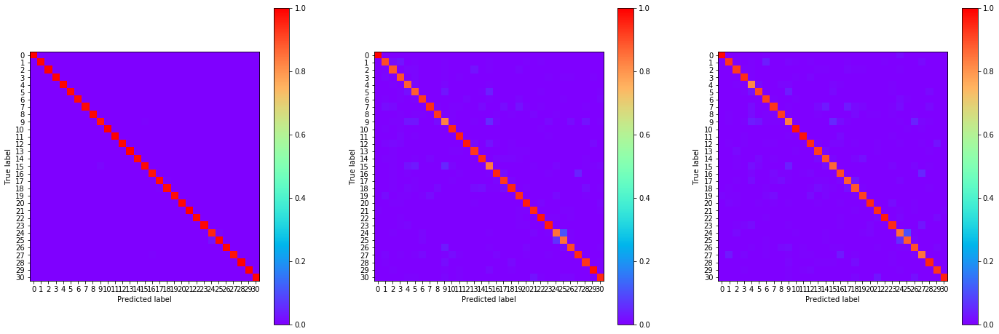

01:18:19.338672
#181 [Train: 0.053] [Test: 0.349] [Valid: 0.384]
#181 [Train: 0.985] [Test: 0.922] [Valid: 0.911]


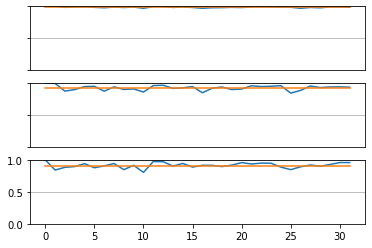

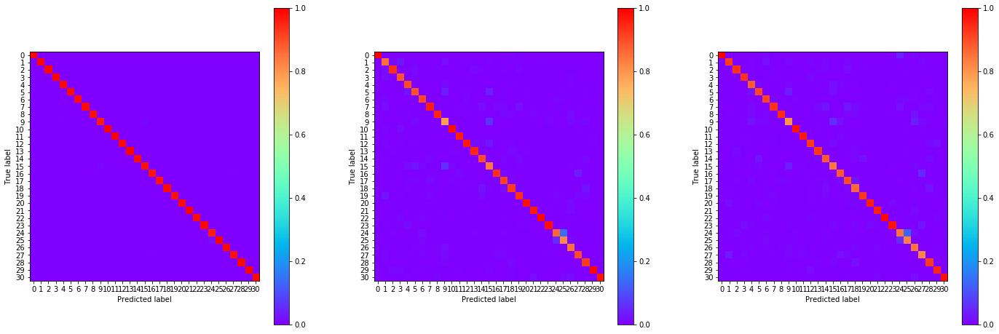

01:19:00.529978
#182 [Train: 0.050] [Test: 0.342] [Valid: 0.366]
#182 [Train: 0.985] [Test: 0.920] [Valid: 0.915]


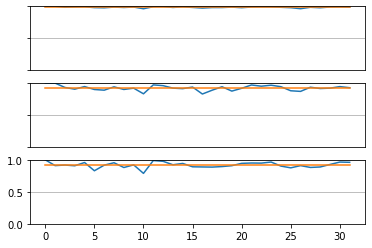

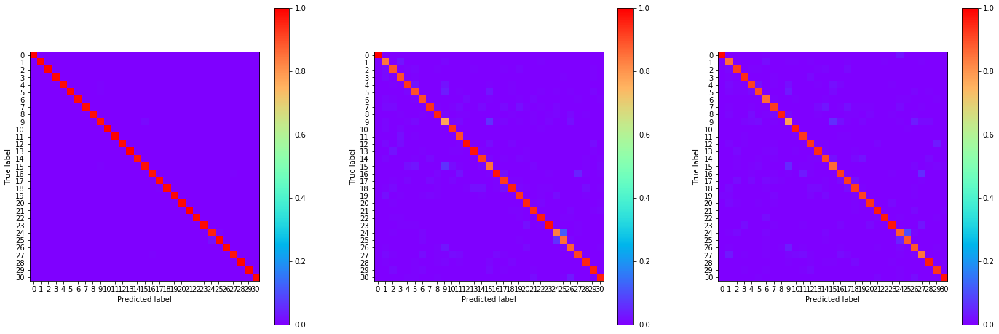

01:19:42.132803
#183 [Train: 0.052] [Test: 0.335] [Valid: 0.371]
#183 [Train: 0.985] [Test: 0.924] [Valid: 0.913]


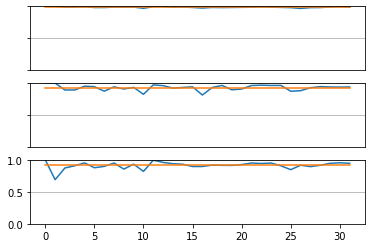

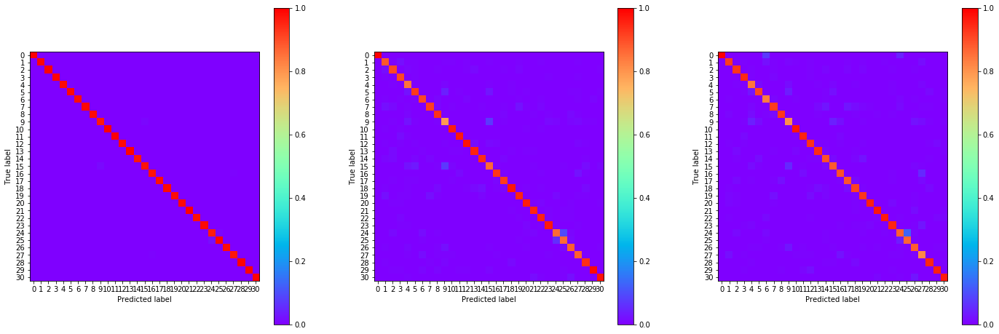

01:20:23.386822
#184 [Train: 0.048] [Test: 0.355] [Valid: 0.384]
#184 [Train: 0.986] [Test: 0.923] [Valid: 0.913]


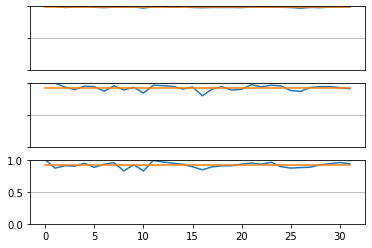

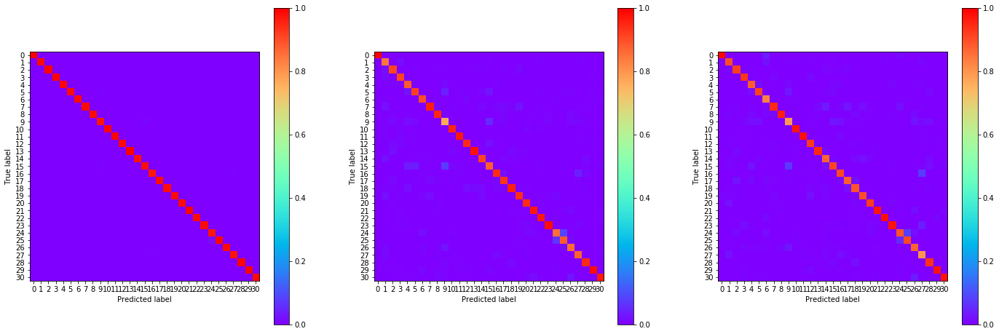

01:21:05.270293
#185 [Train: 0.047] [Test: 0.380] [Valid: 0.379]
#185 [Train: 0.986] [Test: 0.922] [Valid: 0.914]


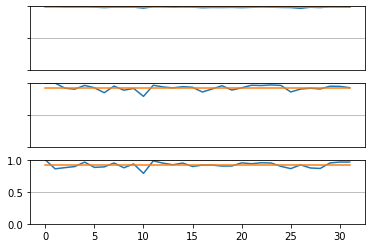

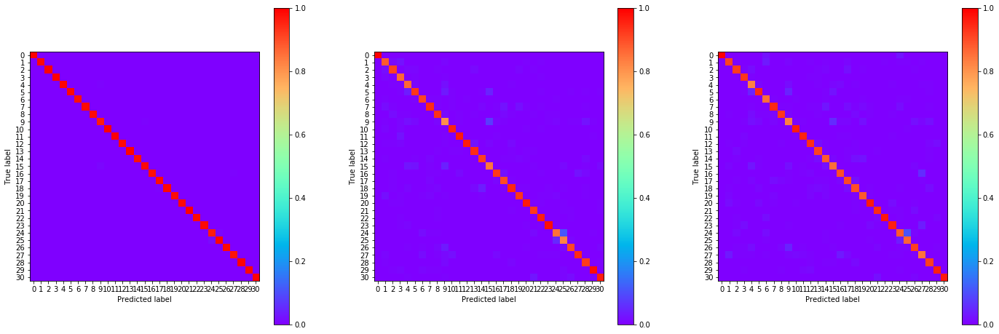

01:21:46.582337
#186 [Train: 0.048] [Test: 0.331] [Valid: 0.370]
#186 [Train: 0.986] [Test: 0.926] [Valid: 0.917]


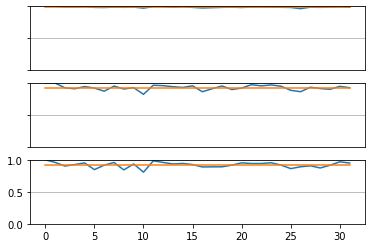

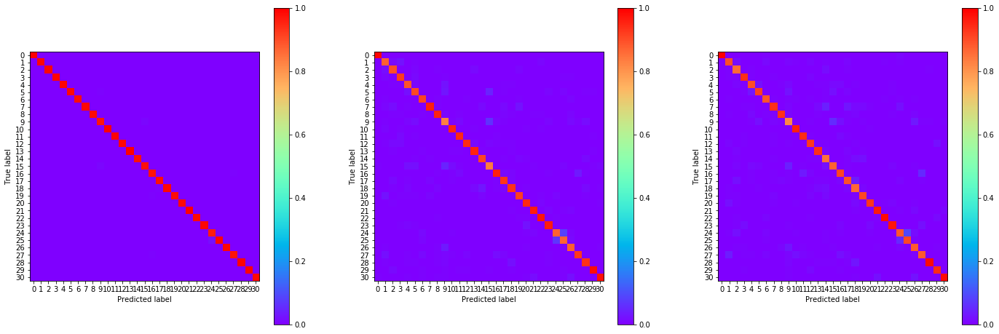

01:22:27.804490
#187 [Train: 0.048] [Test: 0.364] [Valid: 0.401]
#187 [Train: 0.986] [Test: 0.920] [Valid: 0.909]


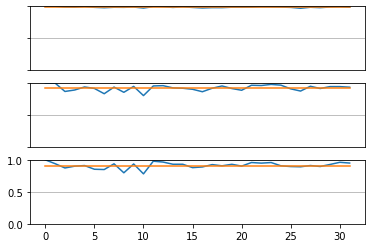

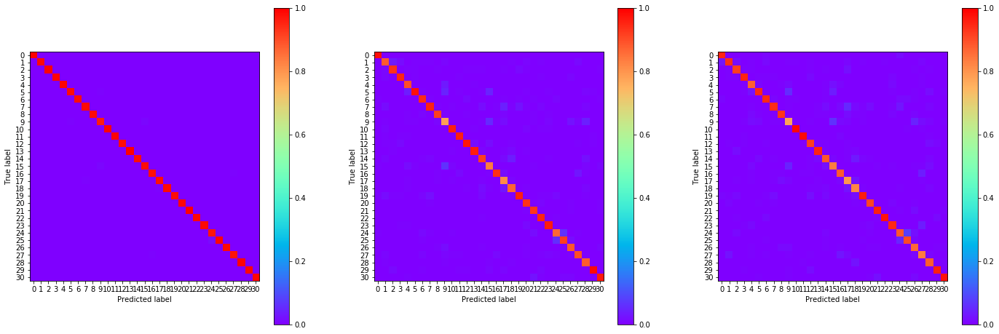

01:23:08.974136
#188 [Train: 0.052] [Test: 0.315] [Valid: 0.357]
#188 [Train: 0.984] [Test: 0.929] [Valid: 0.918]


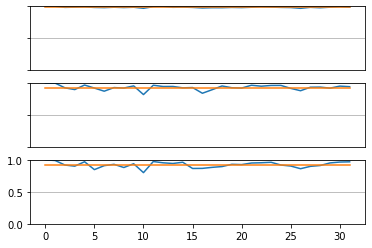

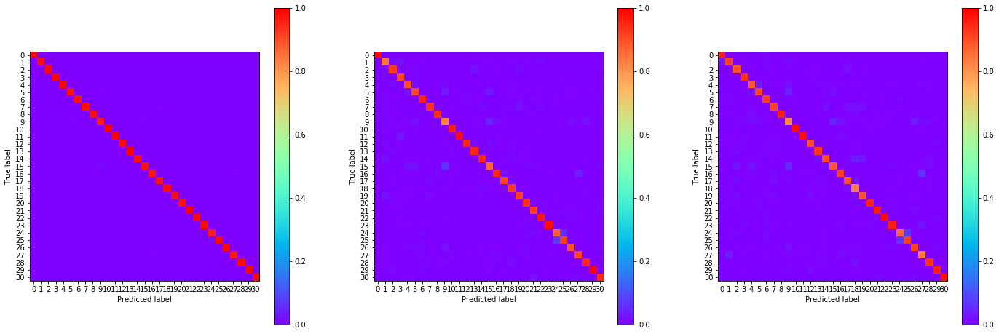

01:23:49.925661
#189 [Train: 0.047] [Test: 0.339] [Valid: 0.373]
#189 [Train: 0.987] [Test: 0.923] [Valid: 0.915]


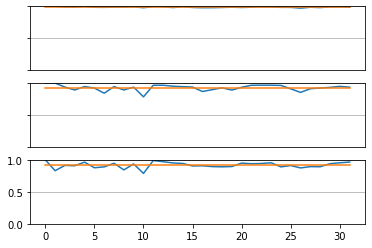

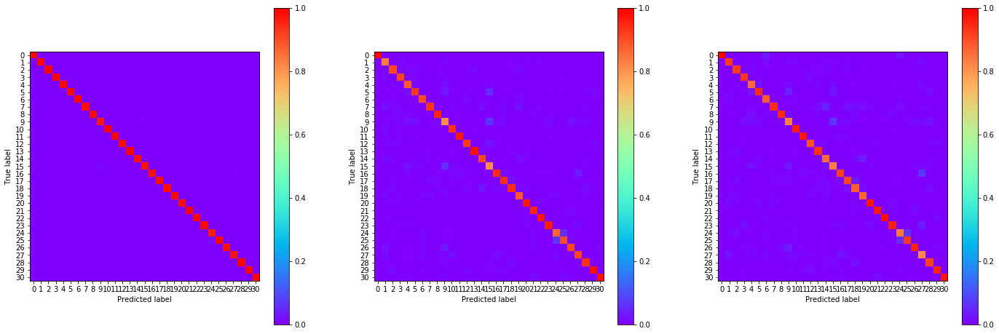

01:24:30.986597
#190 [Train: 0.042] [Test: 0.349] [Valid: 0.379]
#190 [Train: 0.988] [Test: 0.922] [Valid: 0.918]


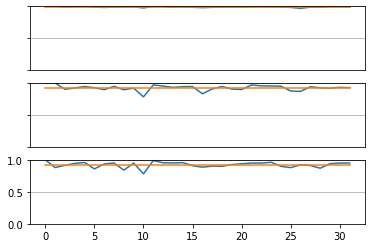

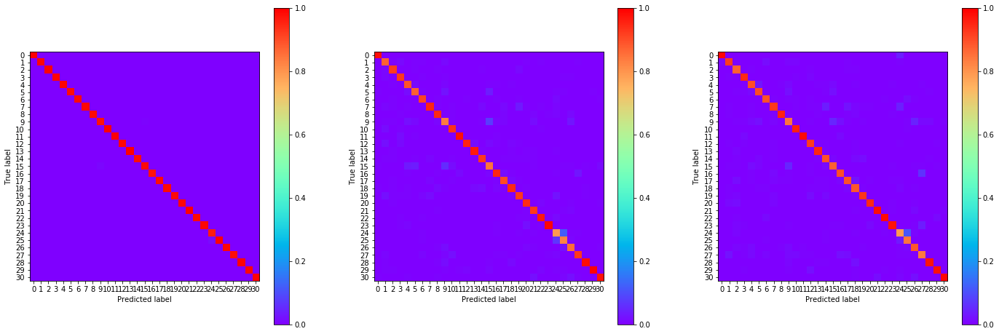

01:25:12.248986
#191 [Train: 0.044] [Test: 0.371] [Valid: 0.378]
#191 [Train: 0.987] [Test: 0.920] [Valid: 0.913]


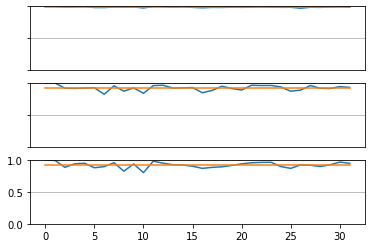

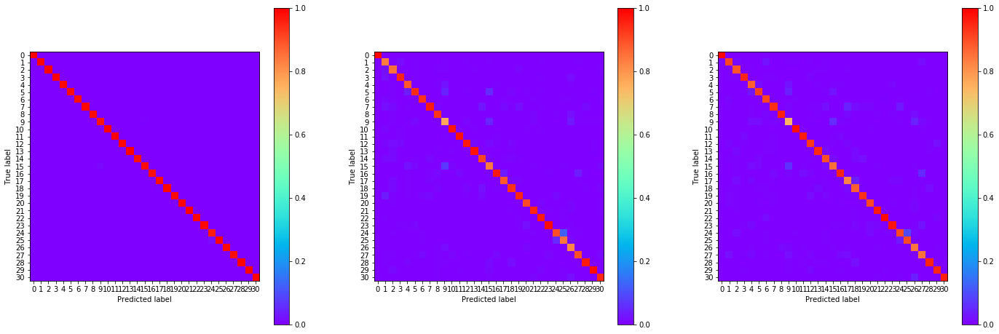

01:25:53.832134
#192 [Train: 0.048] [Test: 0.353] [Valid: 0.375]
#192 [Train: 0.986] [Test: 0.923] [Valid: 0.914]


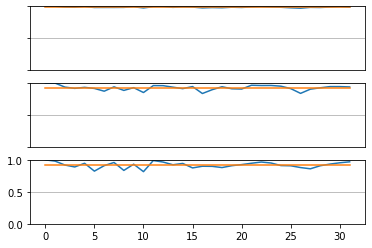

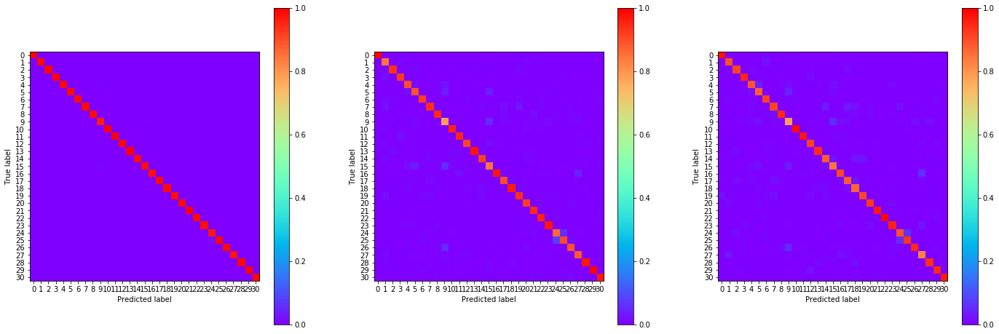

01:26:35.028119
#193 [Train: 0.043] [Test: 0.342] [Valid: 0.383]
#193 [Train: 0.988] [Test: 0.923] [Valid: 0.912]


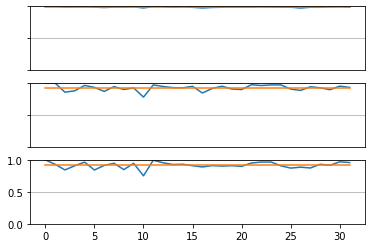

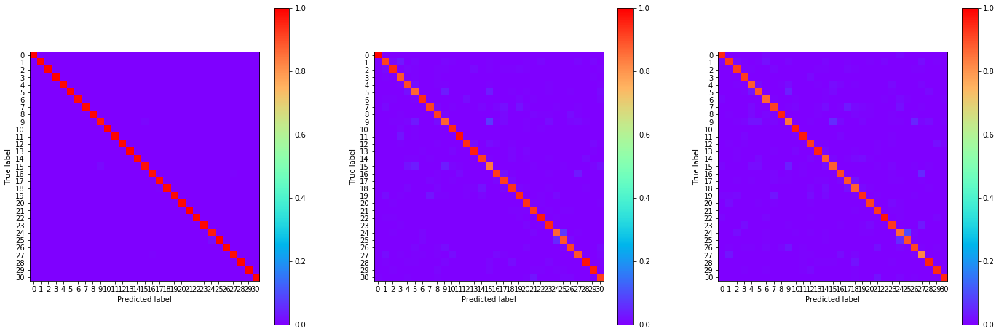

01:27:16.445125
#194 [Train: 0.043] [Test: 0.352] [Valid: 0.382]
#194 [Train: 0.987] [Test: 0.923] [Valid: 0.913]


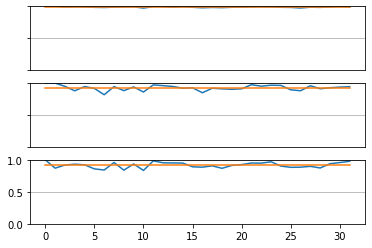

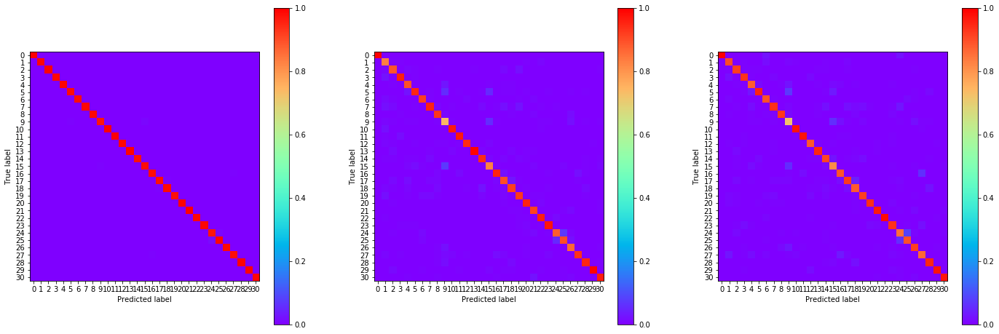

01:27:57.779317
#195 [Train: 0.044] [Test: 0.339] [Valid: 0.367]
#195 [Train: 0.988] [Test: 0.926] [Valid: 0.918]


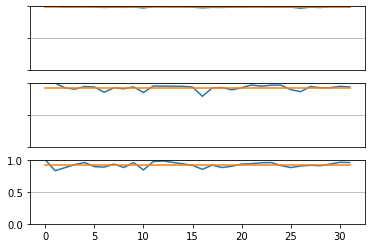

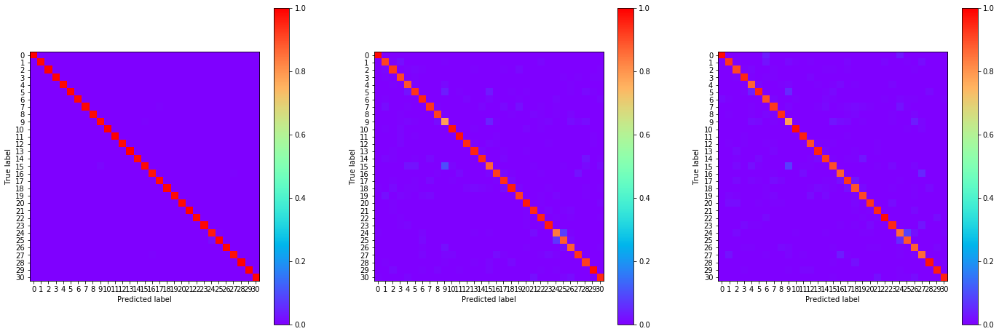

01:28:39.044952
#196 [Train: 0.046] [Test: 0.364] [Valid: 0.376]
#196 [Train: 0.987] [Test: 0.923] [Valid: 0.912]


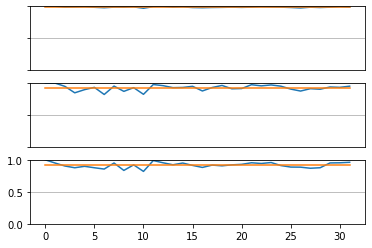

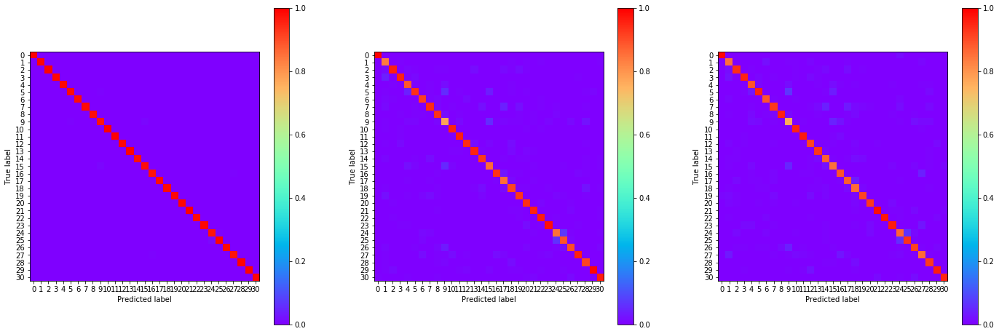

01:29:21.234333
#197 [Train: 0.039] [Test: 0.354] [Valid: 0.388]
#197 [Train: 0.989] [Test: 0.925] [Valid: 0.915]


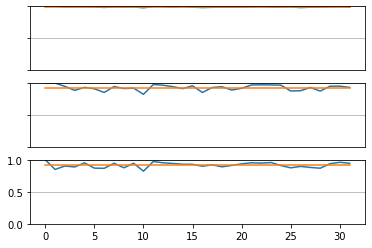

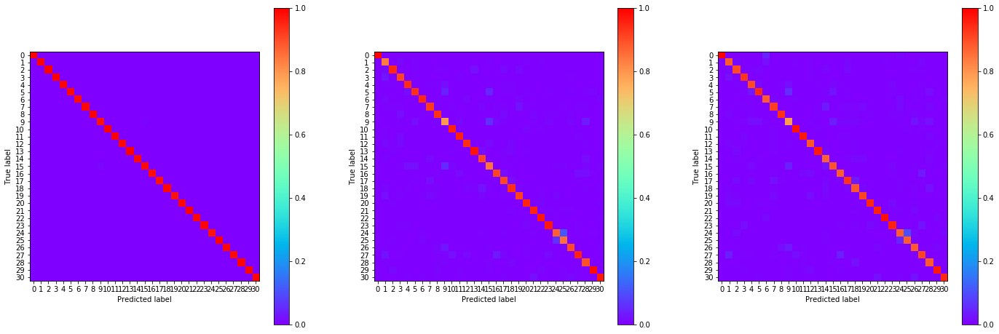

01:30:02.219722
#198 [Train: 0.040] [Test: 0.375] [Valid: 0.392]
#198 [Train: 0.989] [Test: 0.926] [Valid: 0.914]


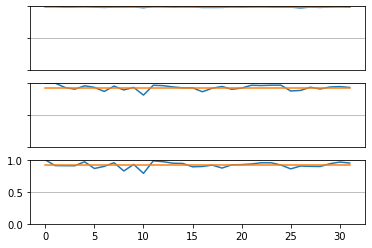

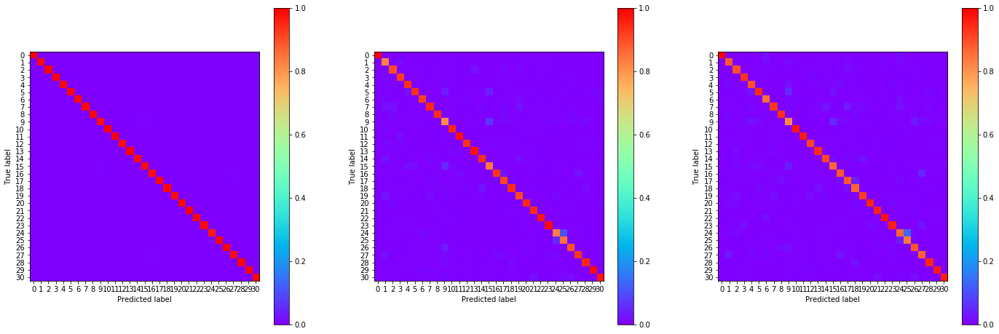

01:30:43.435234
#199 [Train: 0.041] [Test: 0.334] [Valid: 0.365]
#199 [Train: 0.988] [Test: 0.926] [Valid: 0.914]


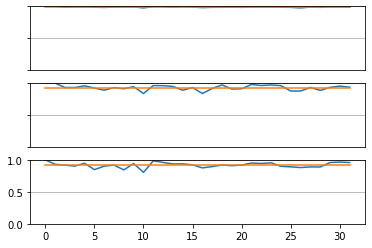

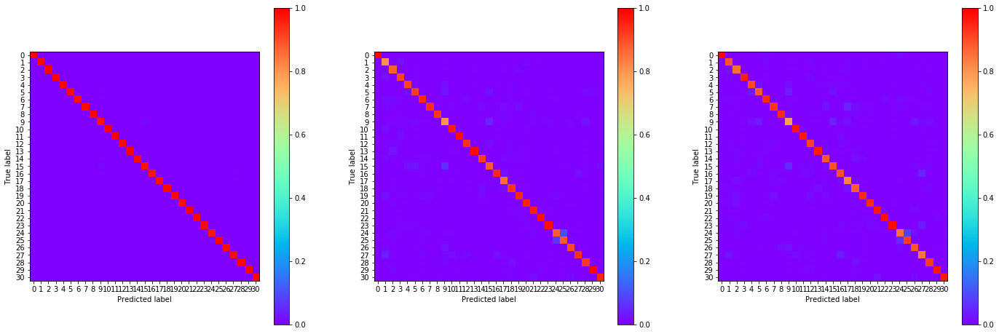

01:31:24.517638
#200 [Train: 0.042] [Test: 0.356] [Valid: 0.413]
#200 [Train: 0.988] [Test: 0.924] [Valid: 0.912]


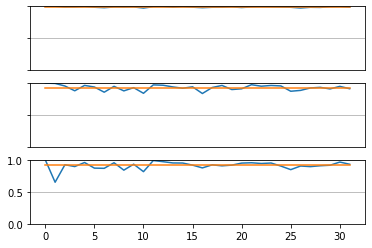

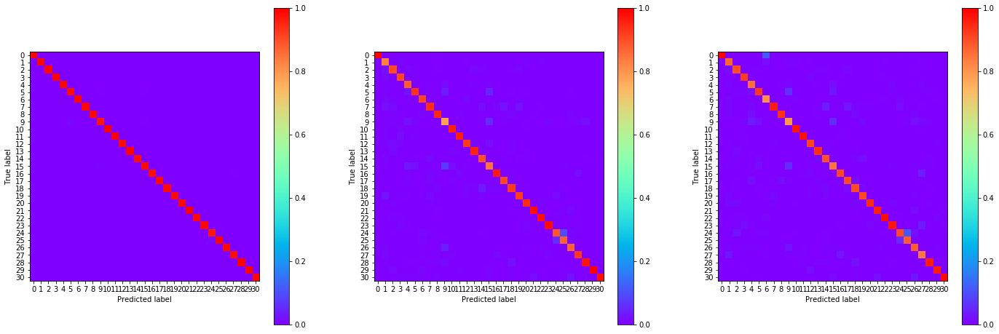

01:32:05.951399
#201 [Train: 0.039] [Test: 0.341] [Valid: 0.375]
#201 [Train: 0.989] [Test: 0.923] [Valid: 0.917]


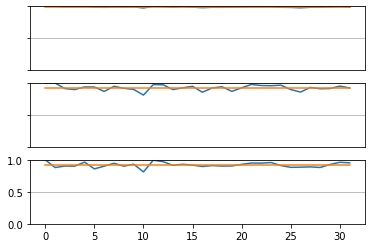

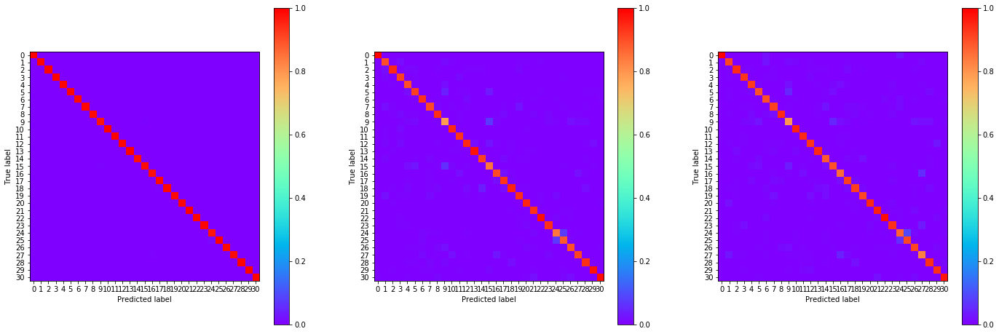

01:34:10.323844
#204 [Train: 0.039] [Test: 0.366] [Valid: 0.388]
#204 [Train: 0.989] [Test: 0.922] [Valid: 0.914]


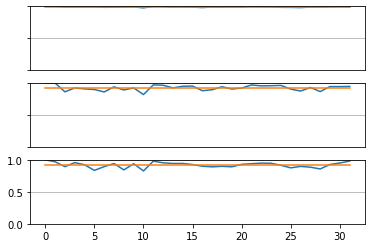

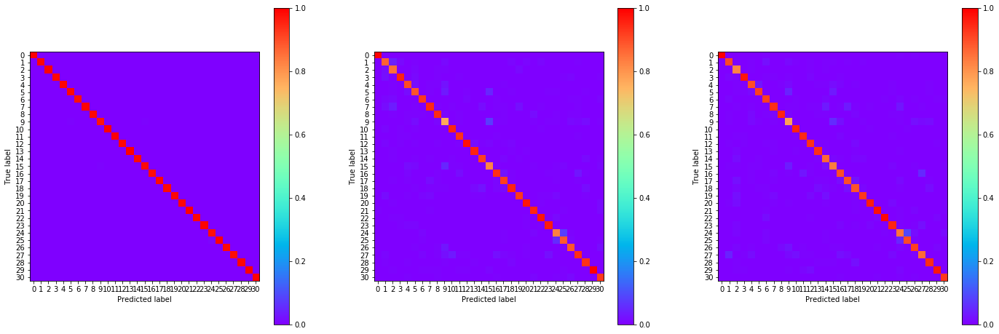

01:34:51.312799
#205 [Train: 0.040] [Test: 0.369] [Valid: 0.394]
#205 [Train: 0.988] [Test: 0.928] [Valid: 0.916]


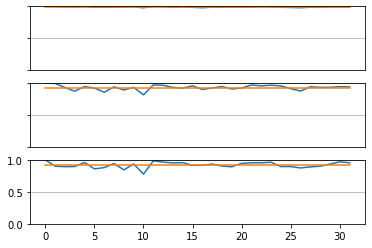

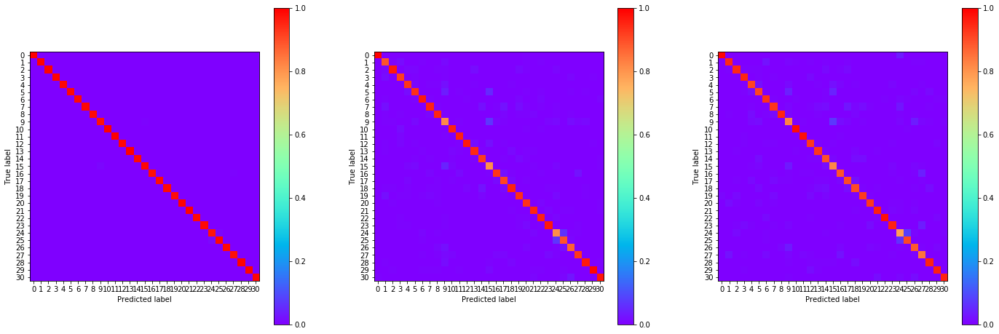

01:35:32.468997
#206 [Train: 0.039] [Test: 0.381] [Valid: 0.390]
#206 [Train: 0.989] [Test: 0.920] [Valid: 0.914]


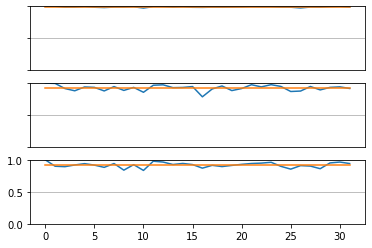

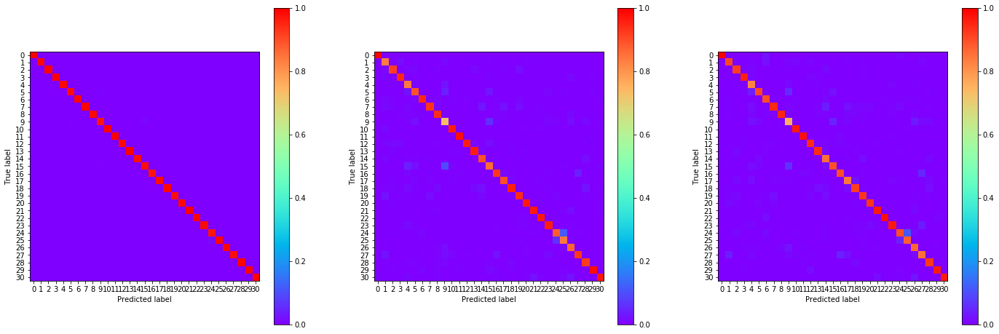

01:36:13.404276
#207 [Train: 0.036] [Test: 0.383] [Valid: 0.404]
#207 [Train: 0.990] [Test: 0.924] [Valid: 0.912]


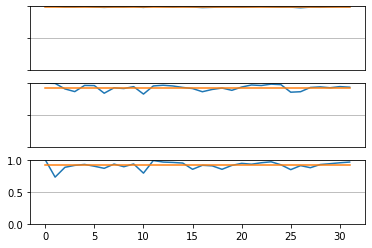

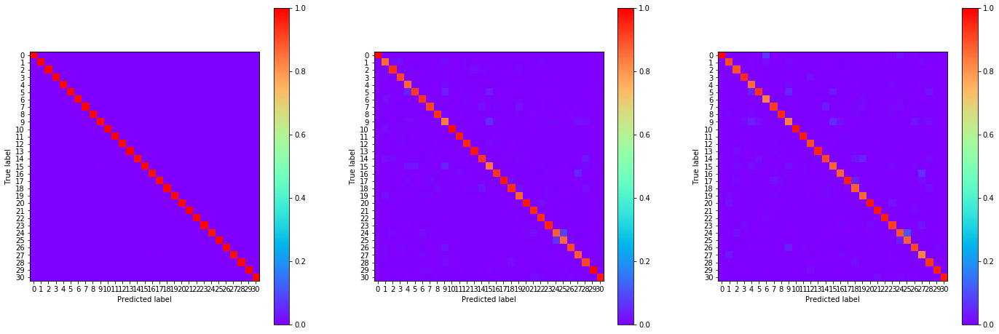

01:36:54.781924
#208 [Train: 0.035] [Test: 0.347] [Valid: 0.379]
#208 [Train: 0.990] [Test: 0.925] [Valid: 0.916]


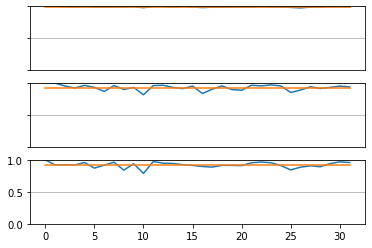

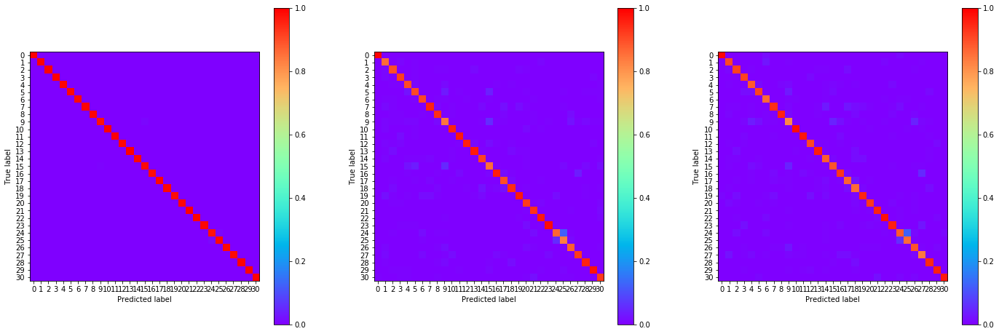

01:37:36.126085
#209 [Train: 0.034] [Test: 0.384] [Valid: 0.389]
#209 [Train: 0.991] [Test: 0.921] [Valid: 0.915]


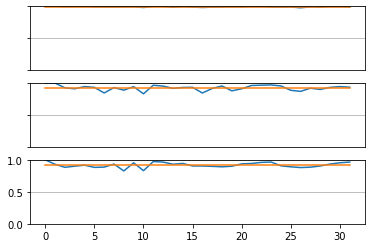

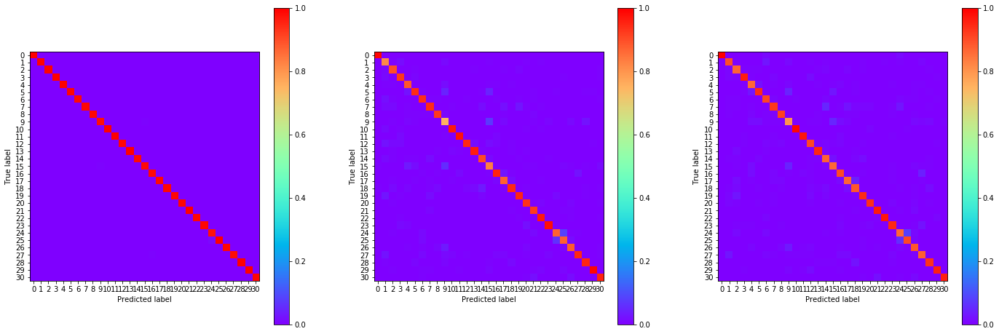

01:38:17.311549
#210 [Train: 0.045] [Test: 0.360] [Valid: 0.403]
#210 [Train: 0.987] [Test: 0.927] [Valid: 0.913]


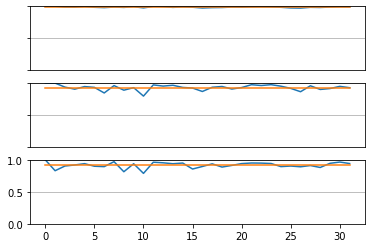

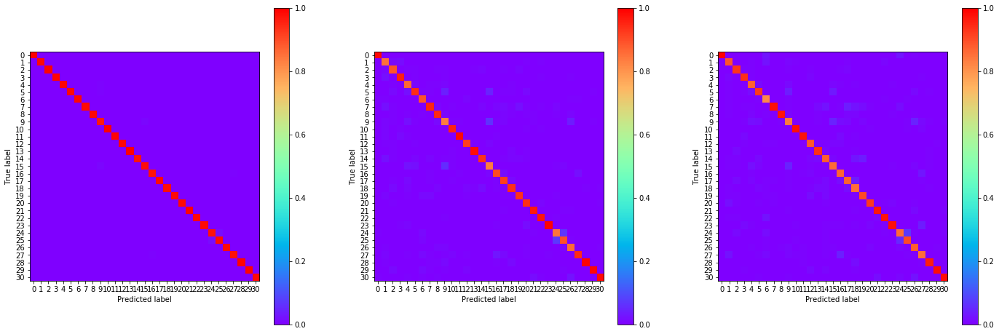

01:38:59.004155
#211 [Train: 0.039] [Test: 0.406] [Valid: 0.391]
#211 [Train: 0.989] [Test: 0.922] [Valid: 0.917]


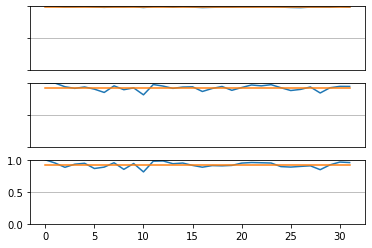

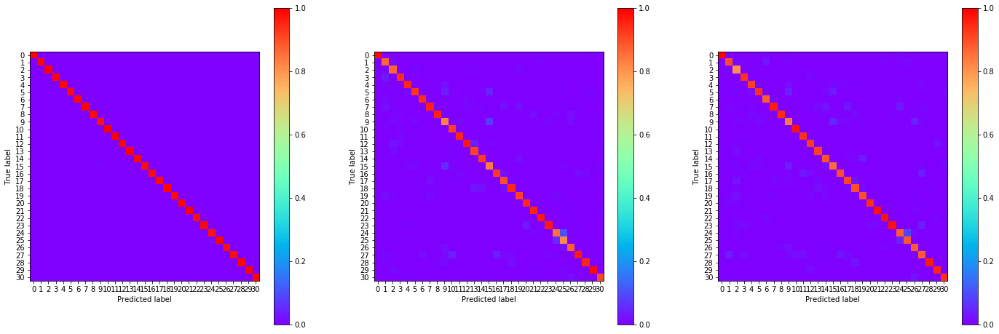

01:39:40.237401
#212 [Train: 0.037] [Test: 0.375] [Valid: 0.400]
#212 [Train: 0.989] [Test: 0.923] [Valid: 0.916]


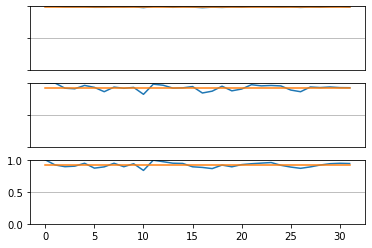

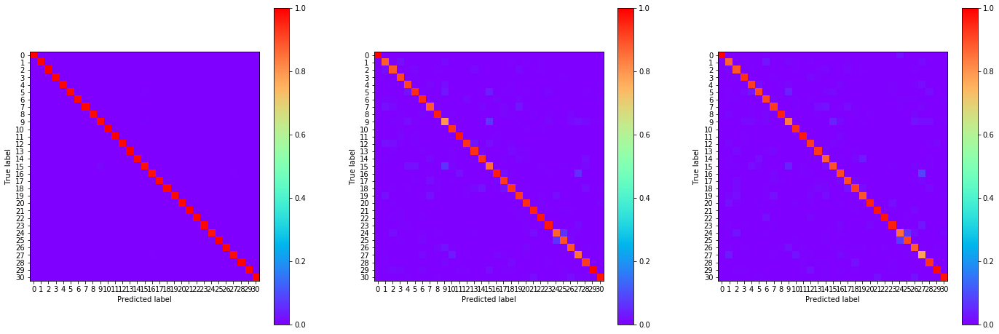

01:40:21.541325
#213 [Train: 0.032] [Test: 0.367] [Valid: 0.398]
#213 [Train: 0.991] [Test: 0.923] [Valid: 0.915]


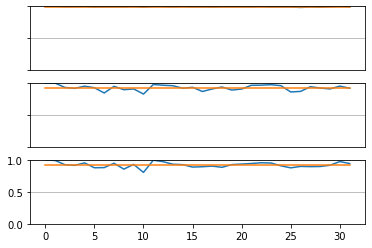

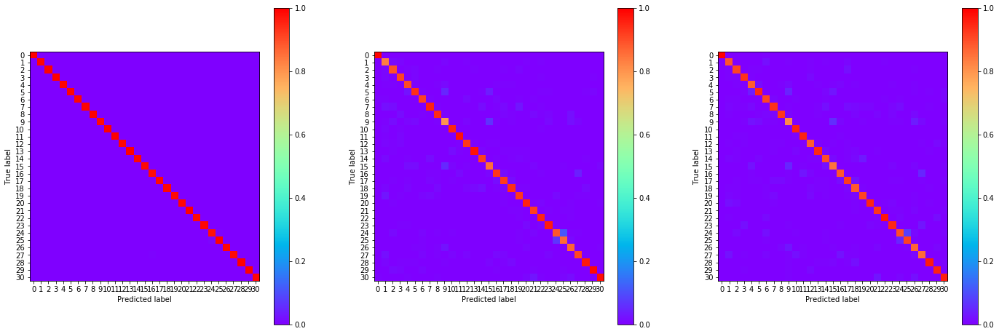

01:41:03.249480
#214 [Train: 0.035] [Test: 0.396] [Valid: 0.400]
#214 [Train: 0.990] [Test: 0.923] [Valid: 0.914]


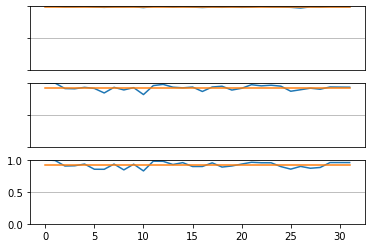

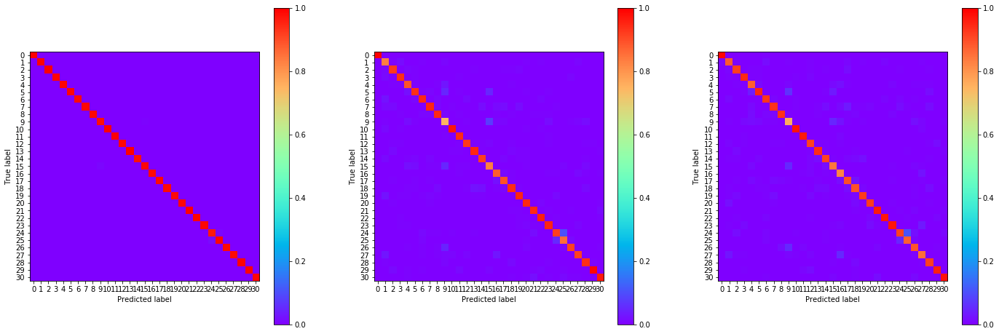

01:41:44.922377
#215 [Train: 0.040] [Test: 0.353] [Valid: 0.382]
#215 [Train: 0.988] [Test: 0.923] [Valid: 0.919]


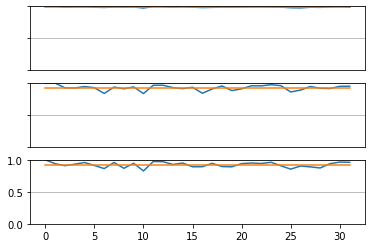

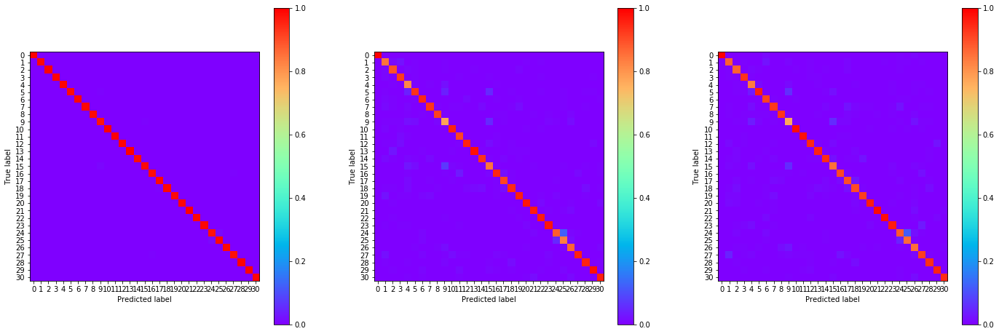

01:42:27.023290
#216 [Train: 0.036] [Test: 0.401] [Valid: 0.388]
#216 [Train: 0.989] [Test: 0.924] [Valid: 0.920]


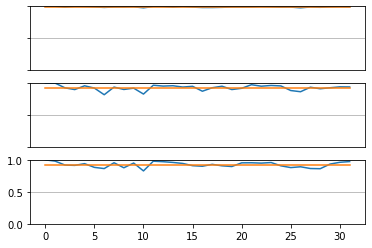

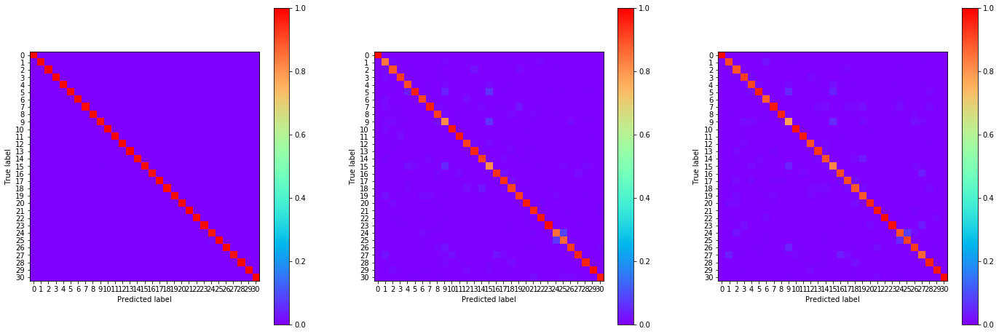

01:43:08.806077
#217 [Train: 0.033] [Test: 0.370] [Valid: 0.397]
#217 [Train: 0.991] [Test: 0.924] [Valid: 0.914]


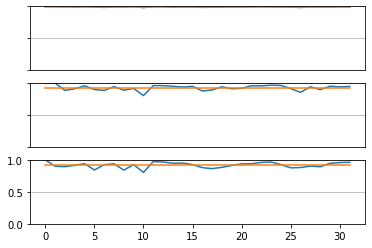

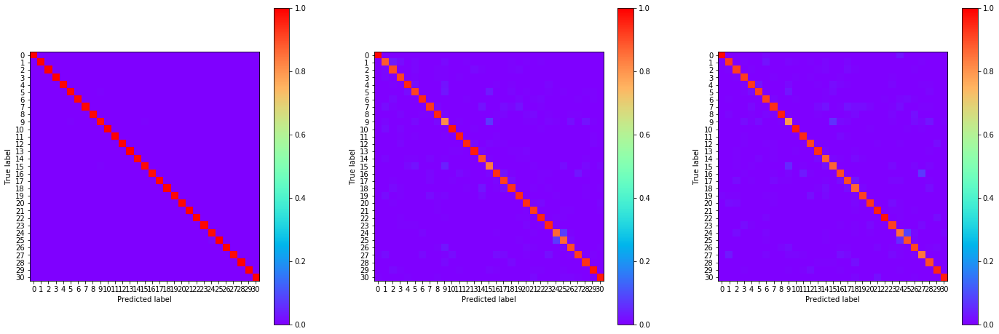

01:43:50.491450
#218 [Train: 0.036] [Test: 0.371] [Valid: 0.403]
#218 [Train: 0.990] [Test: 0.921] [Valid: 0.910]


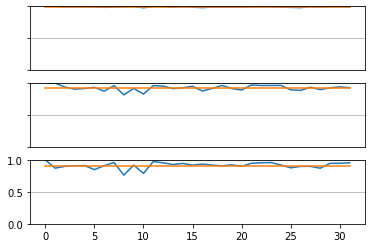

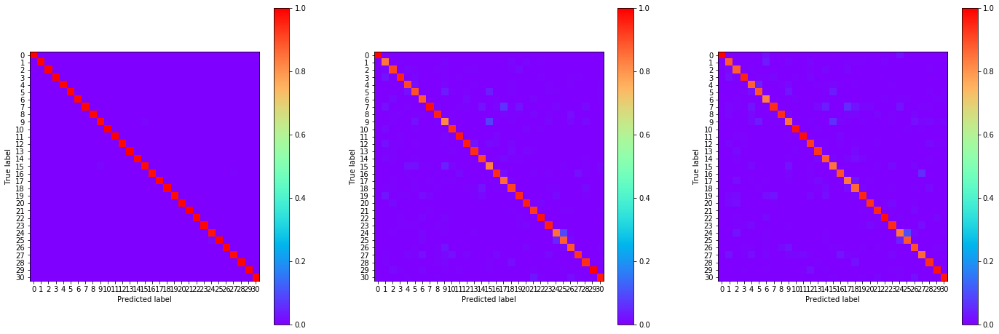

01:44:31.810333
#219 [Train: 0.034] [Test: 0.353] [Valid: 0.395]
#219 [Train: 0.991] [Test: 0.923] [Valid: 0.915]


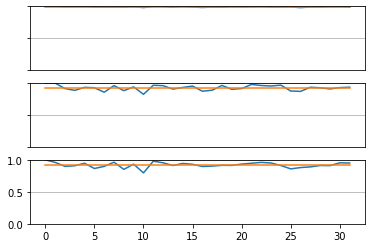

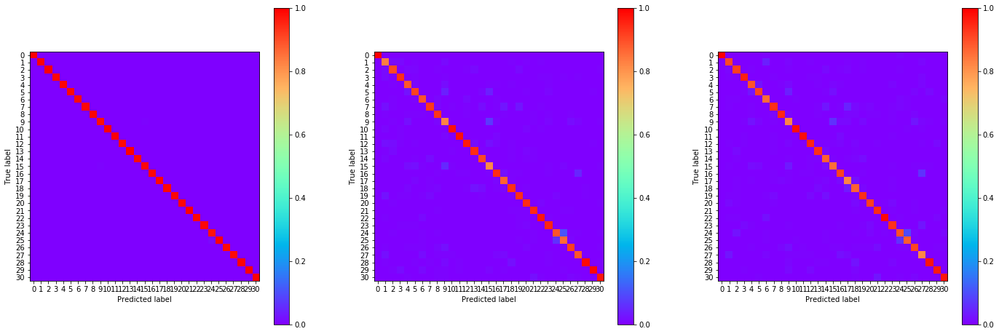

01:45:13.910401
#220 [Train: 0.032] [Test: 0.381] [Valid: 0.390]
#220 [Train: 0.991] [Test: 0.924] [Valid: 0.917]


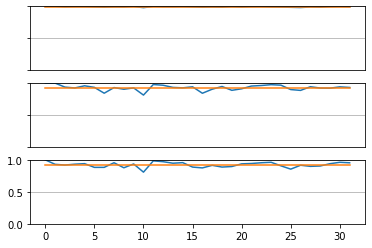

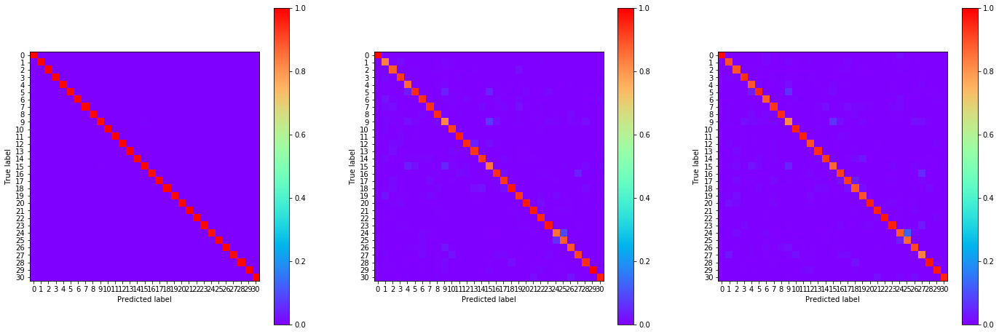

01:45:55.291381
#221 [Train: 0.031] [Test: 0.360] [Valid: 0.379]
#221 [Train: 0.991] [Test: 0.926] [Valid: 0.919]


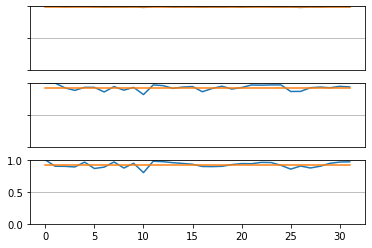

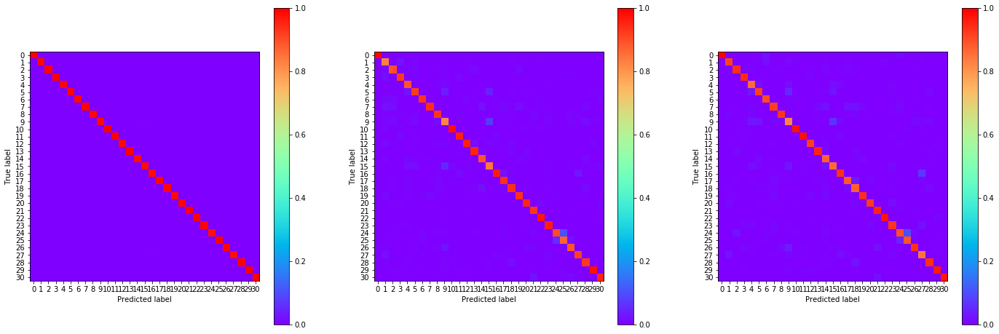

01:46:36.513466
#222 [Train: 0.031] [Test: 0.369] [Valid: 0.381]
#222 [Train: 0.991] [Test: 0.929] [Valid: 0.918]


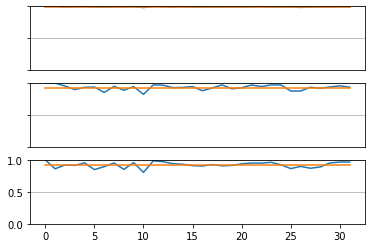

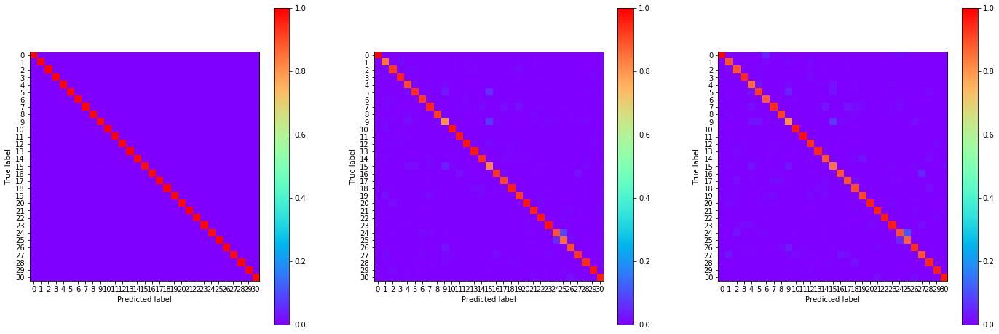

01:47:17.884848
#223 [Train: 0.031] [Test: 0.394] [Valid: 0.416]
#223 [Train: 0.991] [Test: 0.922] [Valid: 0.913]


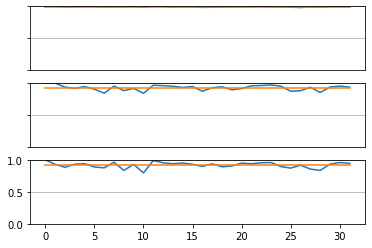

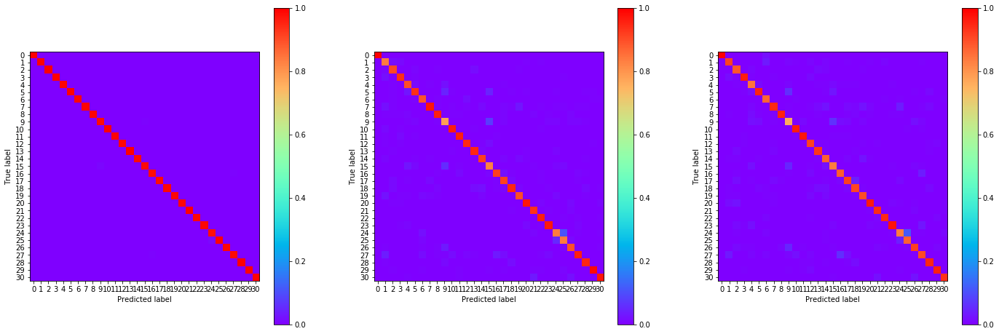

01:47:59.160207
#224 [Train: 0.030] [Test: 0.374] [Valid: 0.400]
#224 [Train: 0.992] [Test: 0.924] [Valid: 0.915]


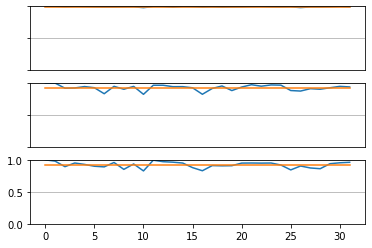

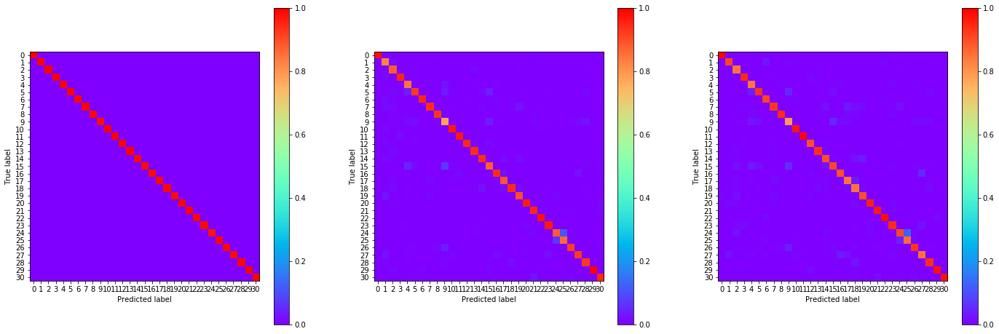

01:48:41.035106
#225 [Train: 0.032] [Test: 0.369] [Valid: 0.421]
#225 [Train: 0.991] [Test: 0.924] [Valid: 0.913]


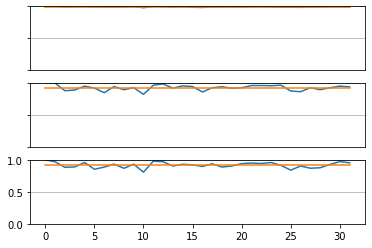

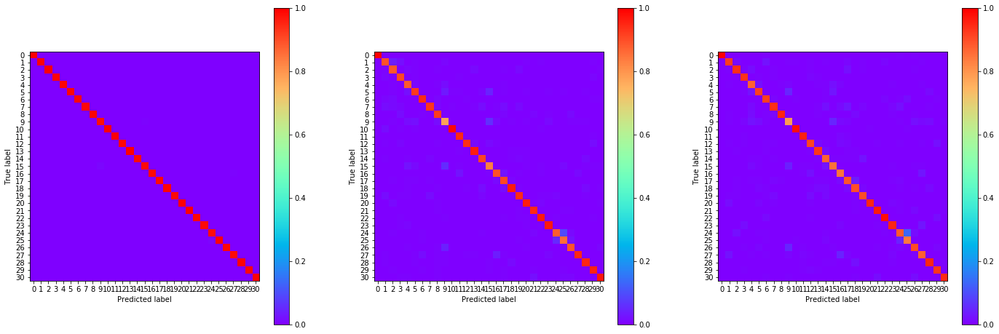

01:49:22.160524
#226 [Train: 0.031] [Test: 0.378] [Valid: 0.417]
#226 [Train: 0.991] [Test: 0.926] [Valid: 0.915]


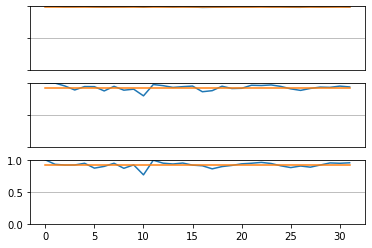

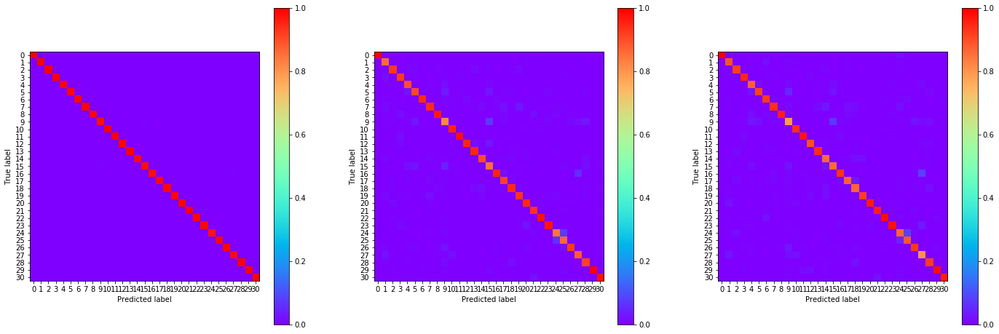

01:50:03.715413
#227 [Train: 0.029] [Test: 0.376] [Valid: 0.421]
#227 [Train: 0.992] [Test: 0.923] [Valid: 0.914]


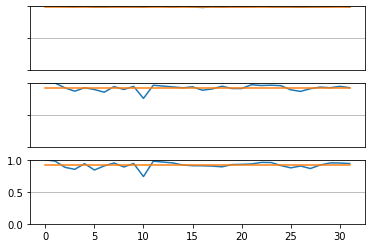

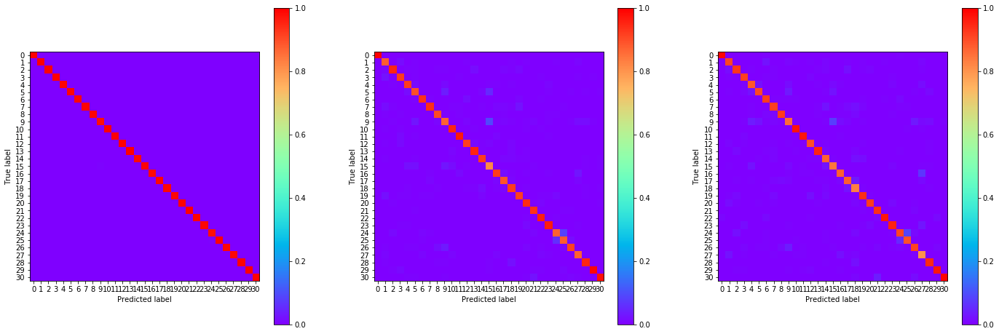

01:50:45.519666
#228 [Train: 0.030] [Test: 0.393] [Valid: 0.419]
#228 [Train: 0.992] [Test: 0.919] [Valid: 0.912]


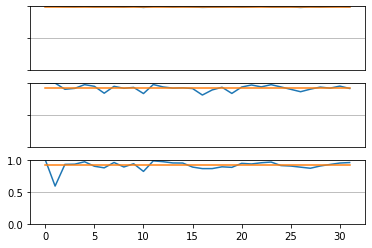

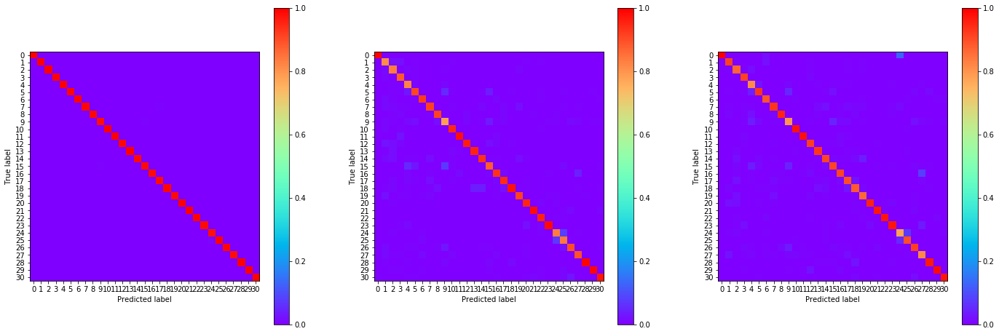

01:51:27.262145
#229 [Train: 0.034] [Test: 0.358] [Valid: 0.394]
#229 [Train: 0.990] [Test: 0.930] [Valid: 0.918]


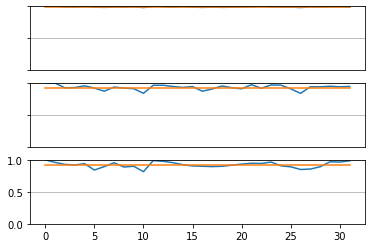

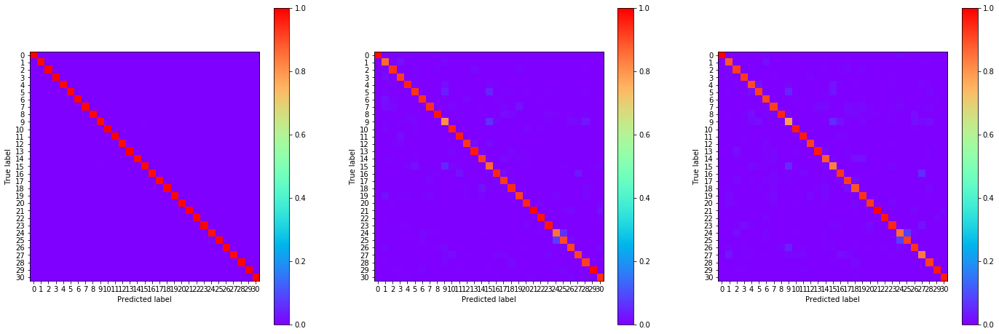

01:52:09.040866
#230 [Train: 0.035] [Test: 0.365] [Valid: 0.403]
#230 [Train: 0.990] [Test: 0.927] [Valid: 0.917]


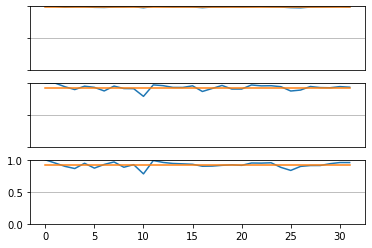

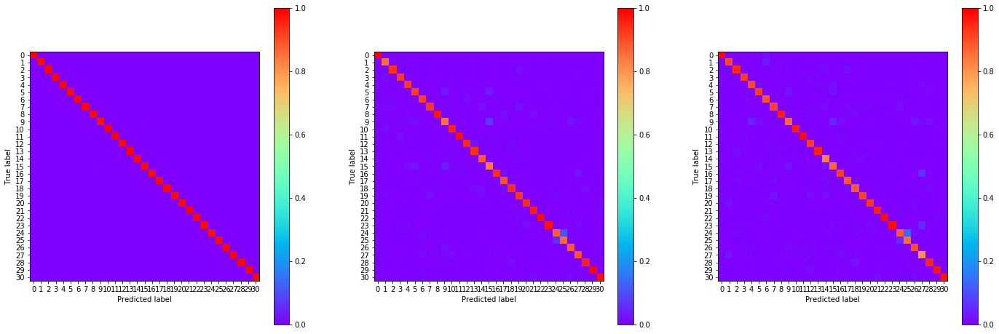

01:52:50.538098
#231 [Train: 0.030] [Test: 0.374] [Valid: 0.407]
#231 [Train: 0.992] [Test: 0.922] [Valid: 0.916]


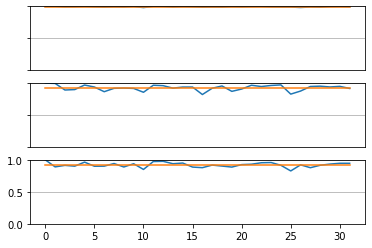

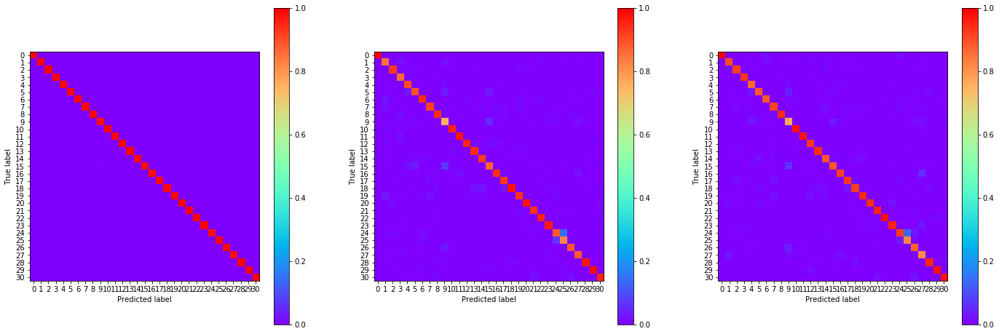

01:53:31.838316
#232 [Train: 0.029] [Test: 0.367] [Valid: 0.403]
#232 [Train: 0.992] [Test: 0.927] [Valid: 0.917]


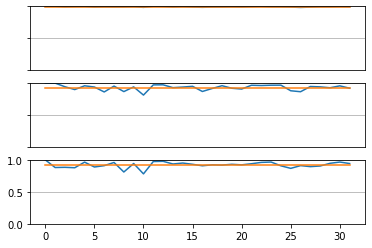

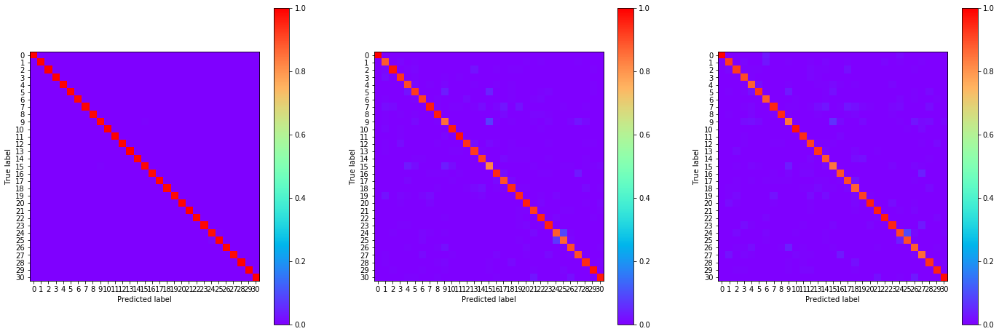

01:54:13.568259
#233 [Train: 0.027] [Test: 0.376] [Valid: 0.397]
#233 [Train: 0.993] [Test: 0.927] [Valid: 0.919]


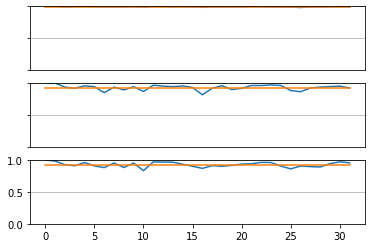

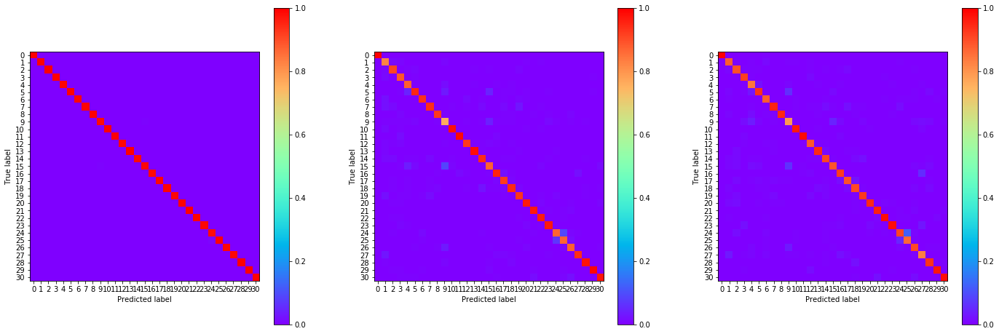

01:54:55.329372
#234 [Train: 0.030] [Test: 0.379] [Valid: 0.414]
#234 [Train: 0.991] [Test: 0.926] [Valid: 0.914]


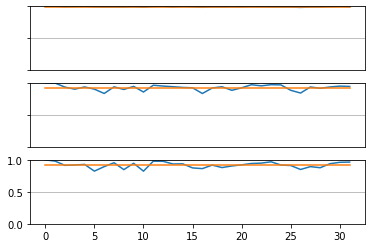

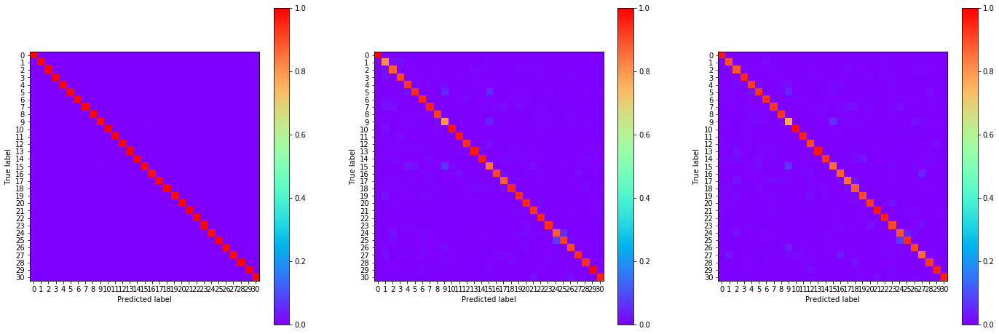

01:55:36.627498
#235 [Train: 0.030] [Test: 0.382] [Valid: 0.407]
#235 [Train: 0.992] [Test: 0.926] [Valid: 0.918]


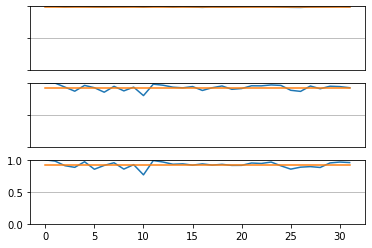

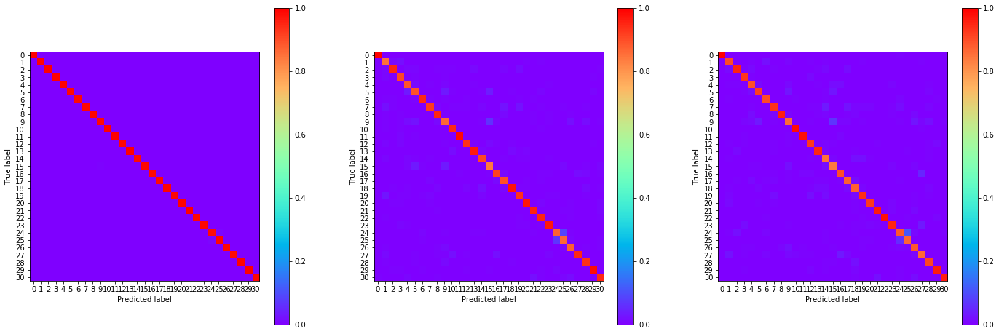

01:56:18.110173
#236 [Train: 0.027] [Test: 0.390] [Valid: 0.417]
#236 [Train: 0.992] [Test: 0.928] [Valid: 0.916]


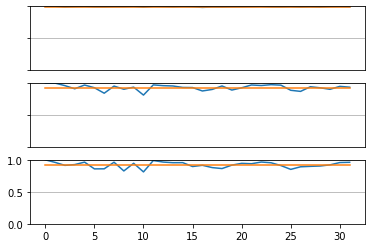

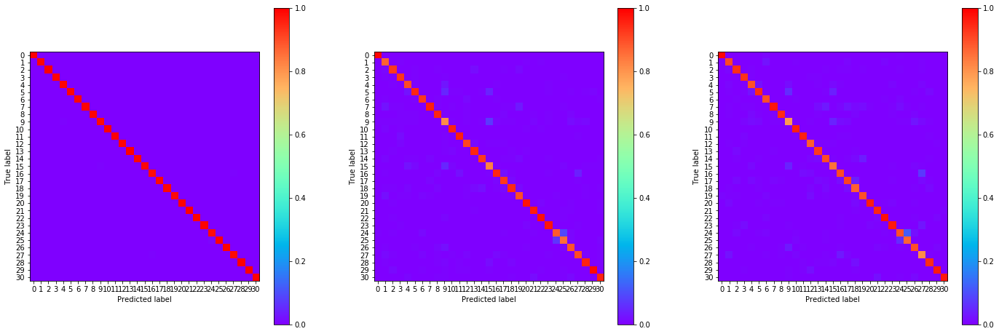

01:56:59.487502
#237 [Train: 0.026] [Test: 0.396] [Valid: 0.428]
#237 [Train: 0.993] [Test: 0.923] [Valid: 0.913]


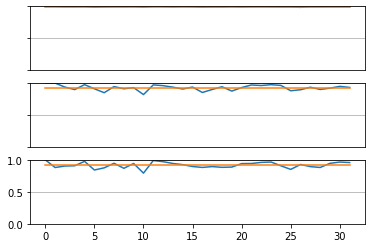

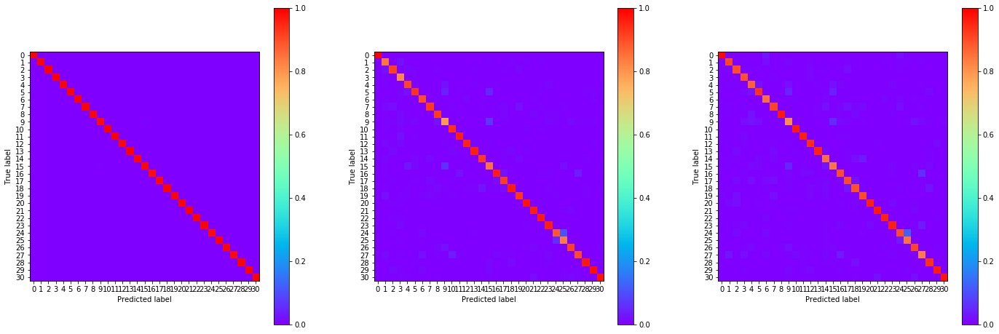

01:57:40.955453
#238 [Train: 0.026] [Test: 0.379] [Valid: 0.419]
#238 [Train: 0.992] [Test: 0.925] [Valid: 0.916]


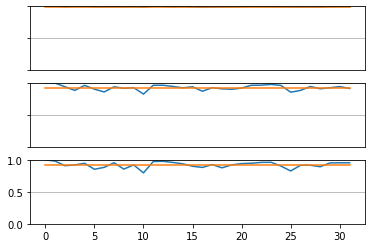

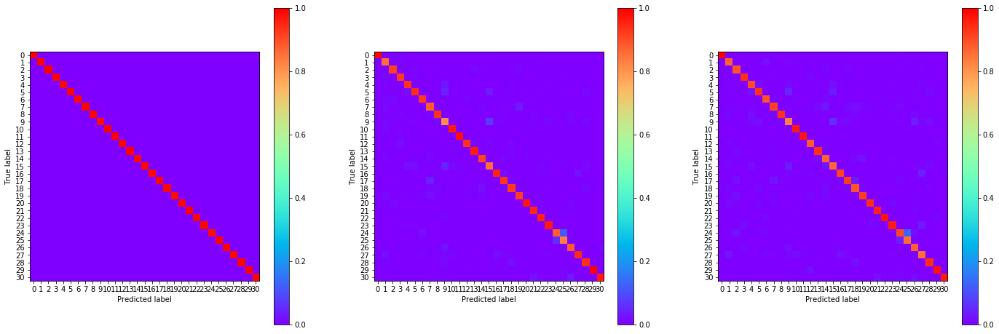

01:58:22.418492
#239 [Train: 0.026] [Test: 0.361] [Valid: 0.421]
#239 [Train: 0.993] [Test: 0.925] [Valid: 0.918]


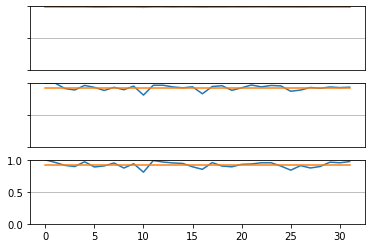

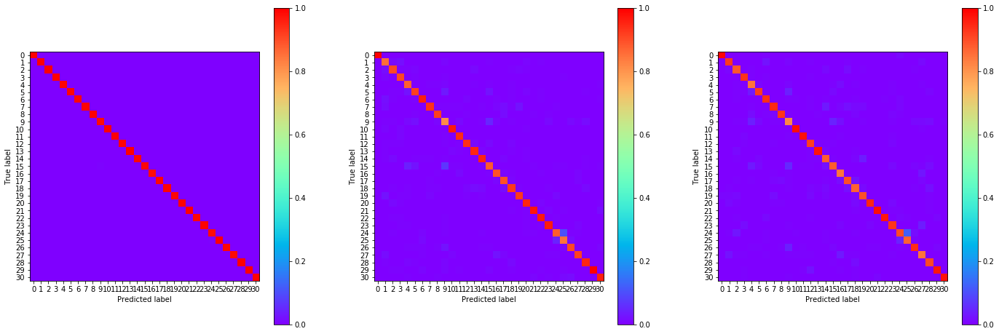

01:59:03.919059
#240 [Train: 0.029] [Test: 0.383] [Valid: 0.423]
#240 [Train: 0.991] [Test: 0.926] [Valid: 0.917]


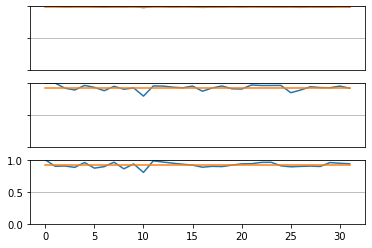

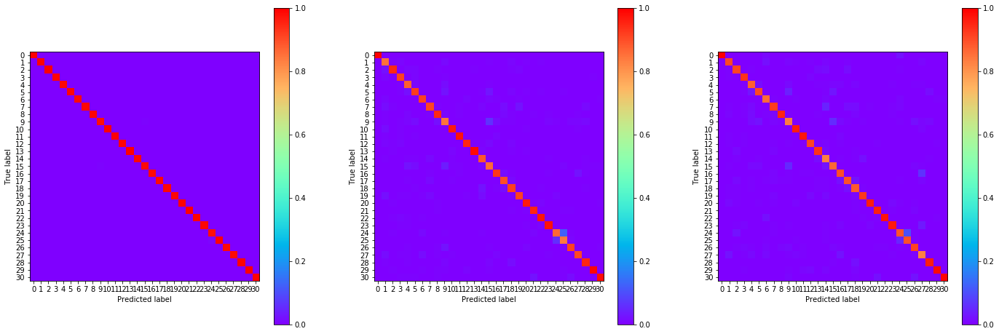

01:59:45.344376
#241 [Train: 0.027] [Test: 0.363] [Valid: 0.393]
#241 [Train: 0.992] [Test: 0.927] [Valid: 0.921]


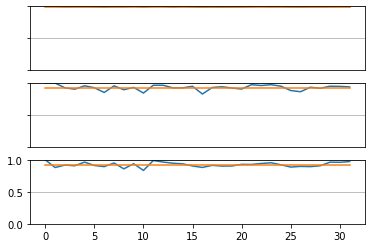

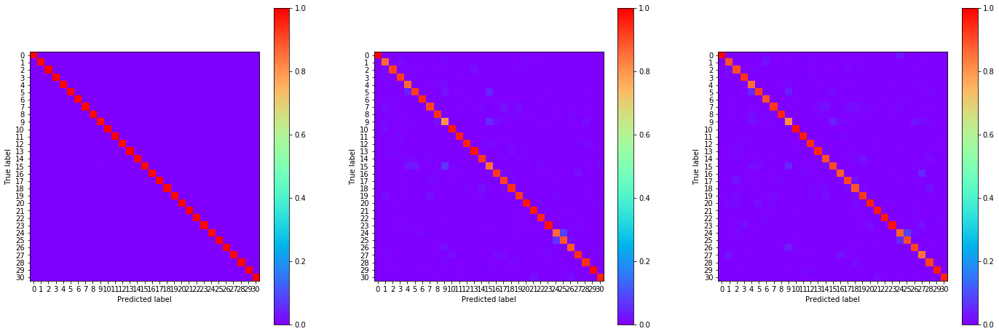

02:00:26.623327
#242 [Train: 0.027] [Test: 0.394] [Valid: 0.422]
#242 [Train: 0.993] [Test: 0.924] [Valid: 0.918]


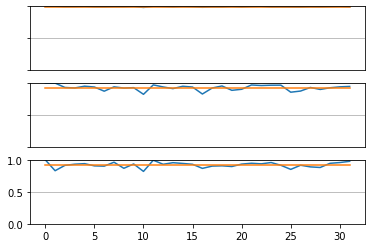

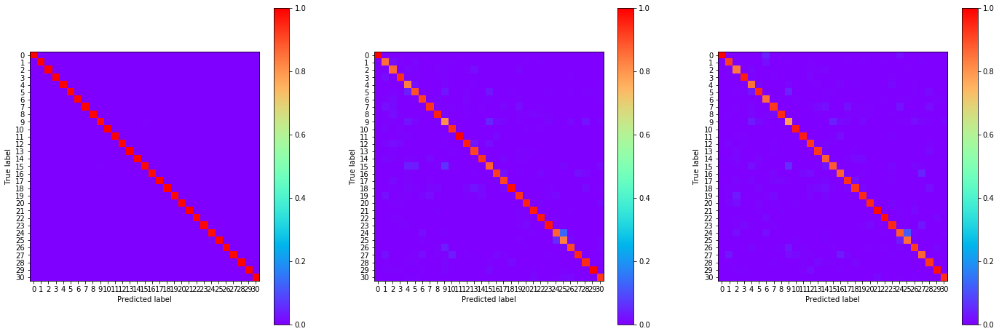

02:01:08.815575
#243 [Train: 0.024] [Test: 0.366] [Valid: 0.401]
#243 [Train: 0.993] [Test: 0.927] [Valid: 0.920]


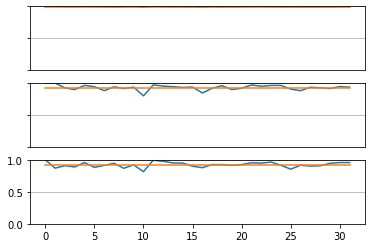

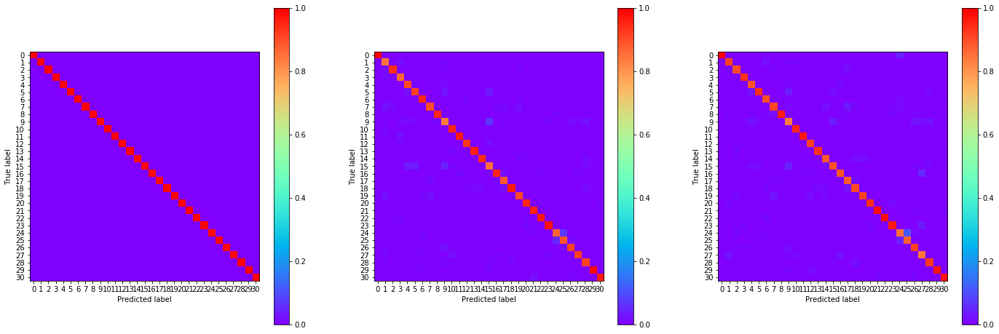

02:01:50.677807
#244 [Train: 0.022] [Test: 0.377] [Valid: 0.407]
#244 [Train: 0.994] [Test: 0.928] [Valid: 0.919]


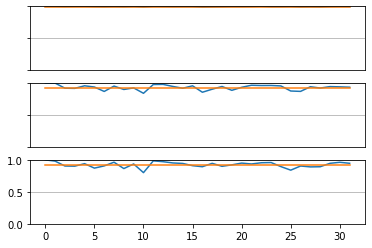

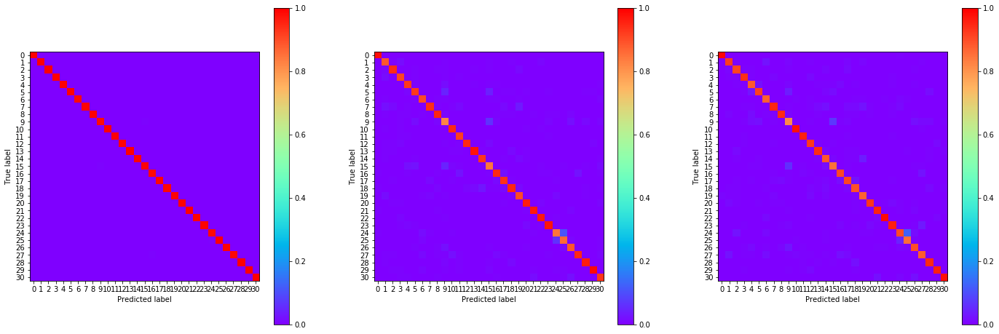

02:02:32.206232
#245 [Train: 0.023] [Test: 0.379] [Valid: 0.400]
#245 [Train: 0.994] [Test: 0.929] [Valid: 0.919]


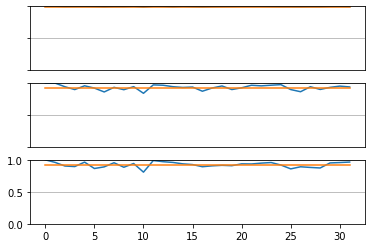

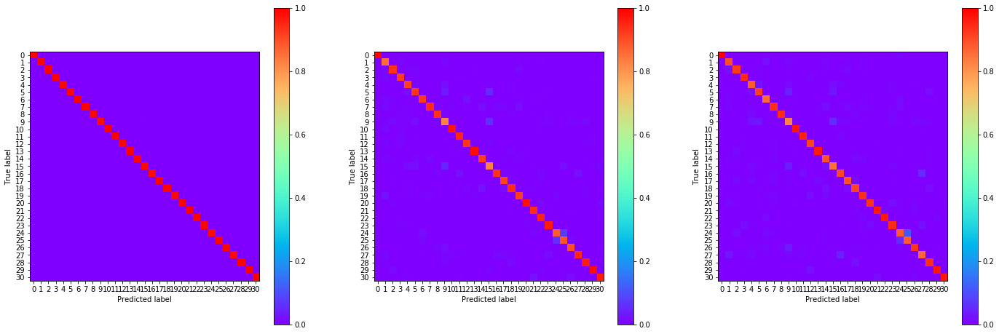

02:03:13.959567
#246 [Train: 0.021] [Test: 0.403] [Valid: 0.426]
#246 [Train: 0.994] [Test: 0.923] [Valid: 0.916]


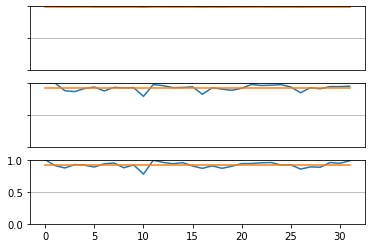

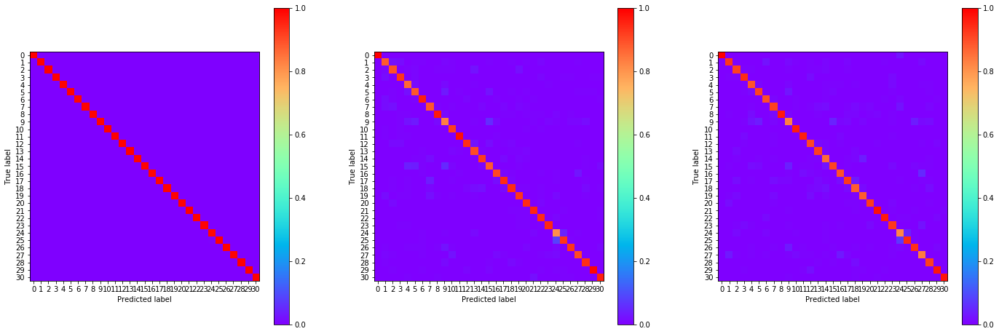

02:03:55.190678
#247 [Train: 0.026] [Test: 0.385] [Valid: 0.437]
#247 [Train: 0.993] [Test: 0.926] [Valid: 0.915]


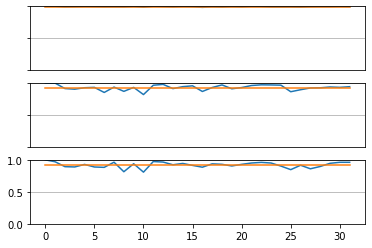

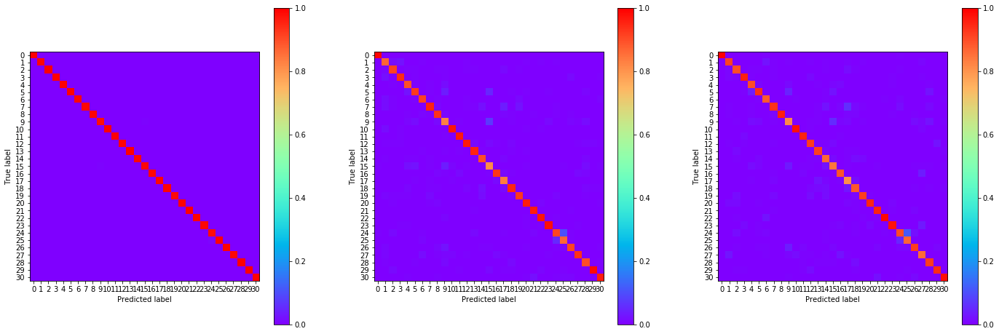

02:04:36.672796
#248 [Train: 0.026] [Test: 0.392] [Valid: 0.439]
#248 [Train: 0.992] [Test: 0.924] [Valid: 0.914]


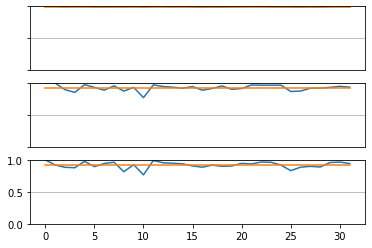

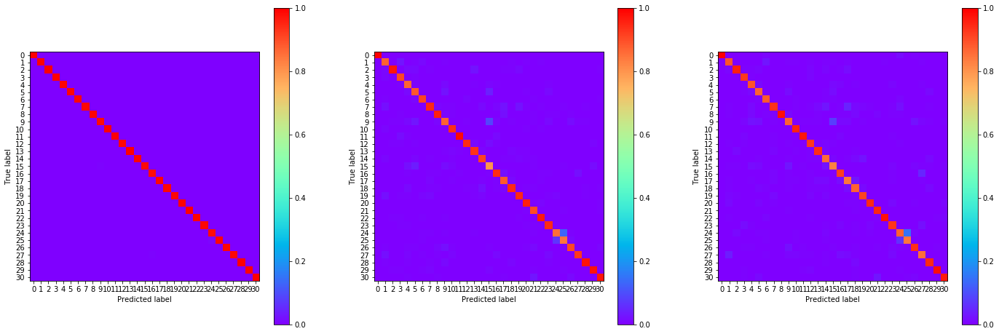

02:05:18.276134
#249 [Train: 0.027] [Test: 0.386] [Valid: 0.410]
#249 [Train: 0.992] [Test: 0.923] [Valid: 0.919]


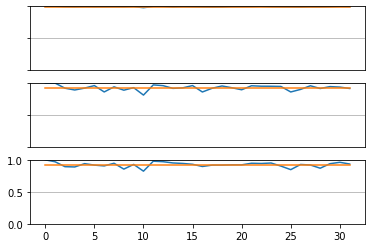

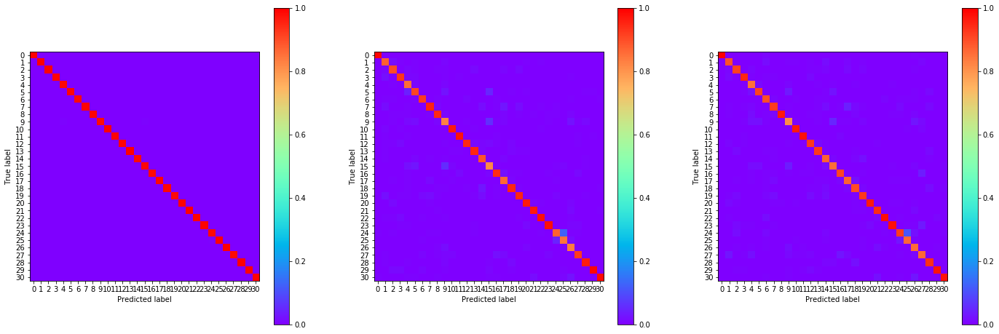

02:05:59.628083
#250 [Train: 0.023] [Test: 0.391] [Valid: 0.405]
#250 [Train: 0.993] [Test: 0.925] [Valid: 0.921]


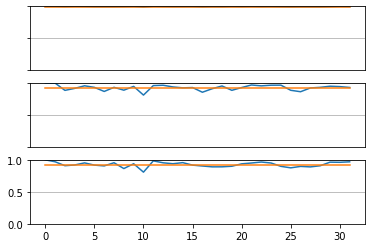

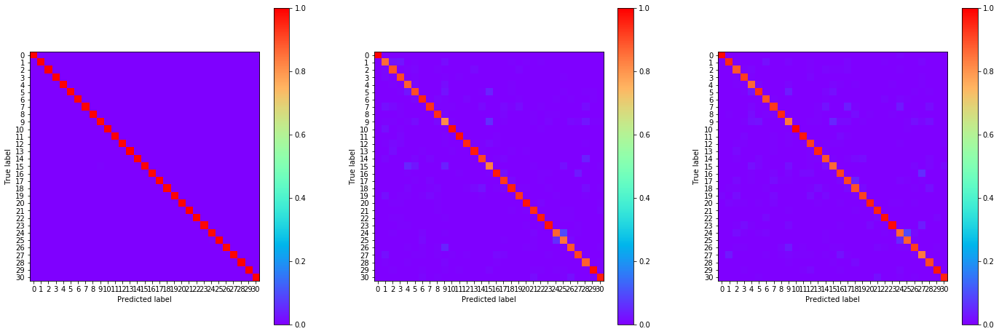

02:06:40.892263
#251 [Train: 0.025] [Test: 0.393] [Valid: 0.425]
#251 [Train: 0.993] [Test: 0.922] [Valid: 0.915]


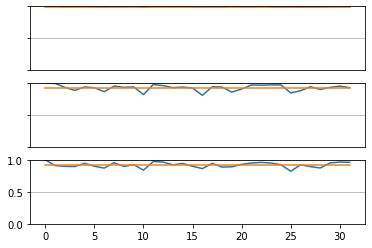

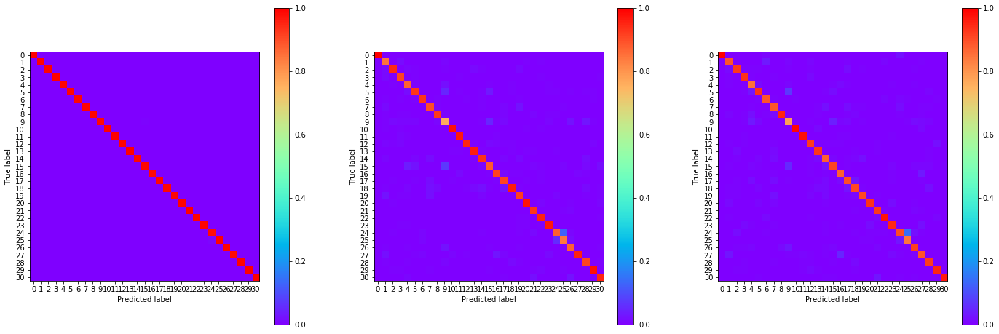

02:07:22.572624
#252 [Train: 0.025] [Test: 0.396] [Valid: 0.416]
#252 [Train: 0.993] [Test: 0.926] [Valid: 0.915]


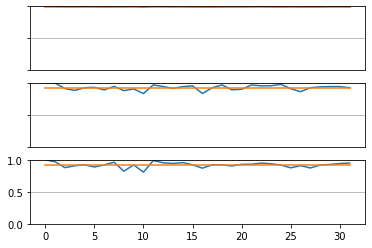

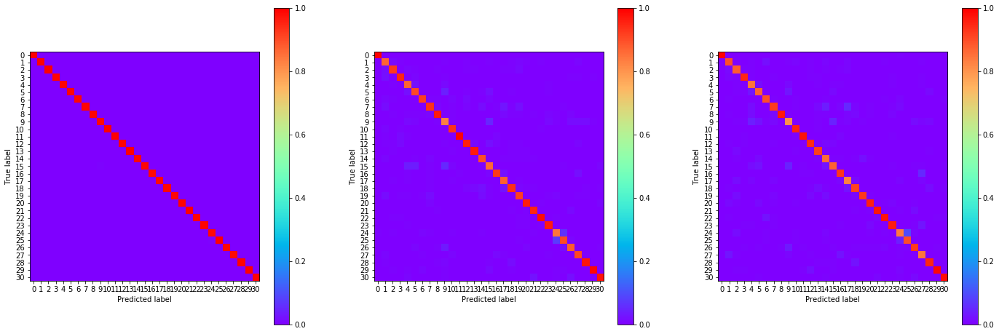

02:08:03.880508
#253 [Train: 0.024] [Test: 0.416] [Valid: 0.423]
#253 [Train: 0.993] [Test: 0.927] [Valid: 0.915]


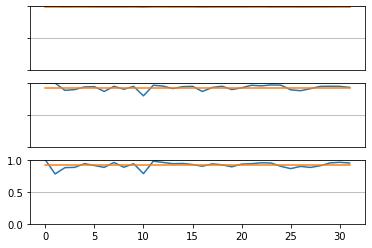

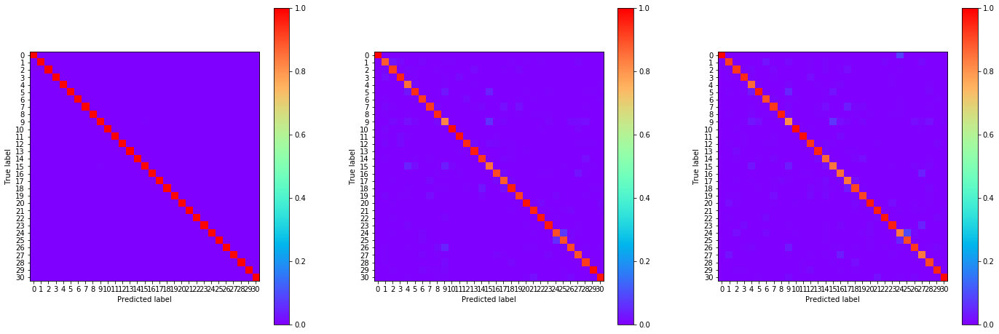

02:08:45.442072
#254 [Train: 0.022] [Test: 0.381] [Valid: 0.417]
#254 [Train: 0.994] [Test: 0.925] [Valid: 0.917]


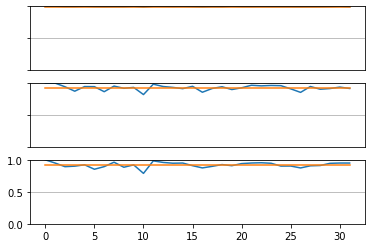

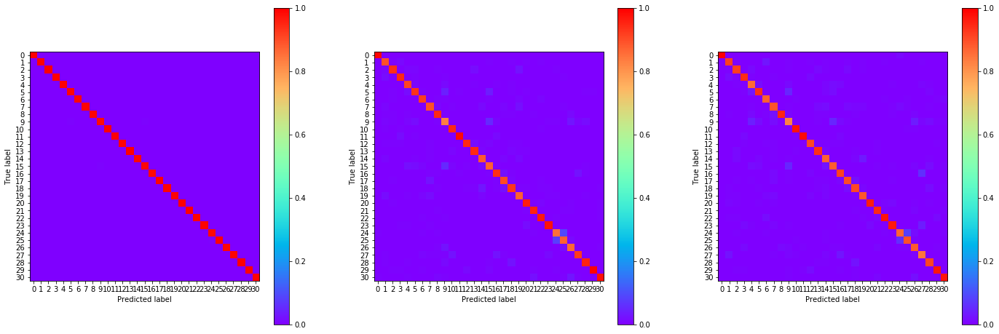

02:09:27.297580
#255 [Train: 0.025] [Test: 0.380] [Valid: 0.428]
#255 [Train: 0.992] [Test: 0.926] [Valid: 0.917]


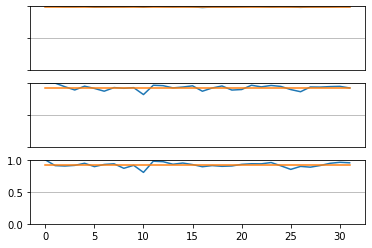

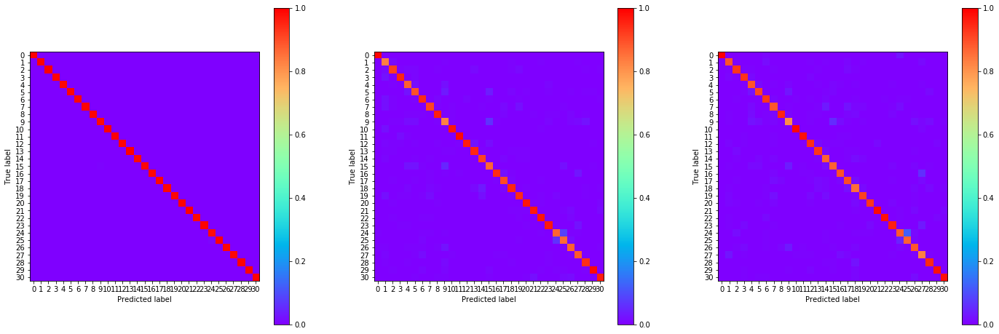

02:10:08.641624
#256 [Train: 0.022] [Test: 0.401] [Valid: 0.417]
#256 [Train: 0.994] [Test: 0.923] [Valid: 0.916]


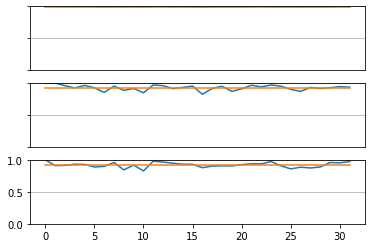

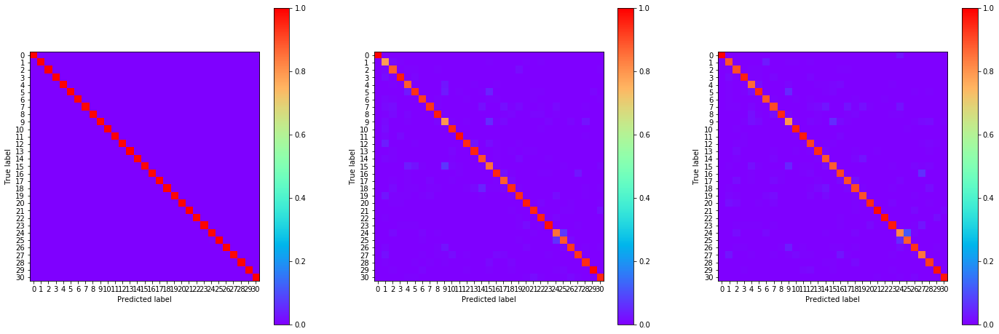

02:10:50.822879
#257 [Train: 0.024] [Test: 0.404] [Valid: 0.426]
#257 [Train: 0.993] [Test: 0.923] [Valid: 0.912]


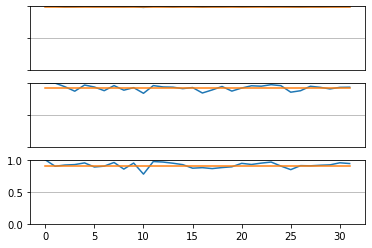

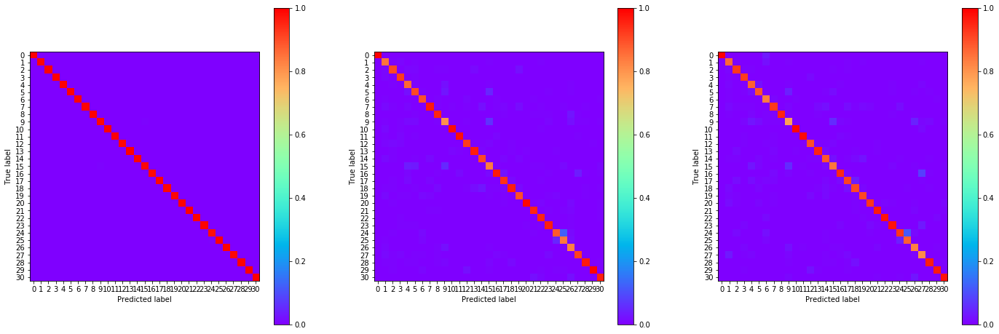

02:11:32.394298
#258 [Train: 0.023] [Test: 0.361] [Valid: 0.406]
#258 [Train: 0.993] [Test: 0.928] [Valid: 0.919]


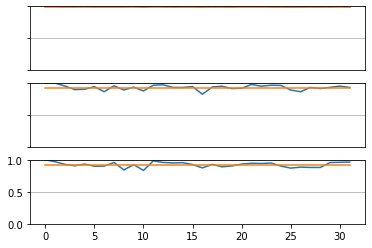

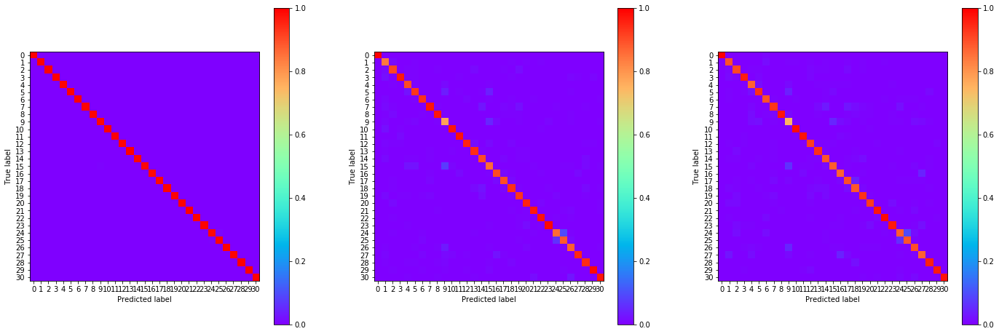

02:12:13.523029
#259 [Train: 0.021] [Test: 0.370] [Valid: 0.425]
#259 [Train: 0.994] [Test: 0.926] [Valid: 0.917]


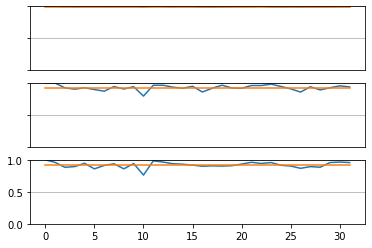

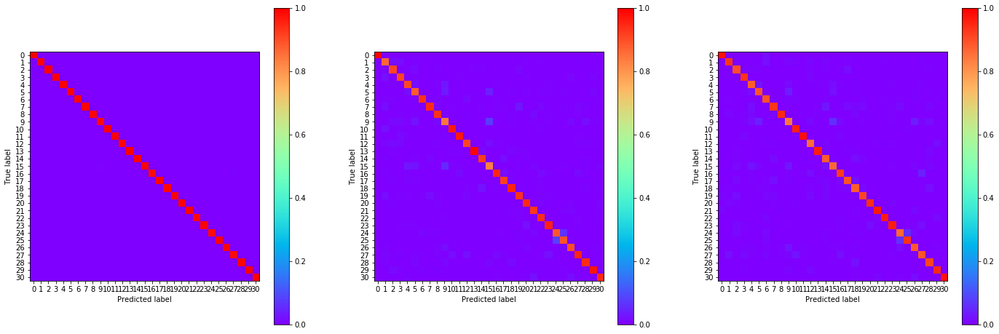

02:12:55.703820
#260 [Train: 0.022] [Test: 0.395] [Valid: 0.423]
#260 [Train: 0.994] [Test: 0.926] [Valid: 0.918]


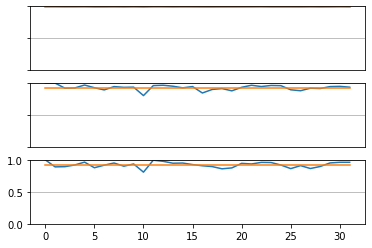

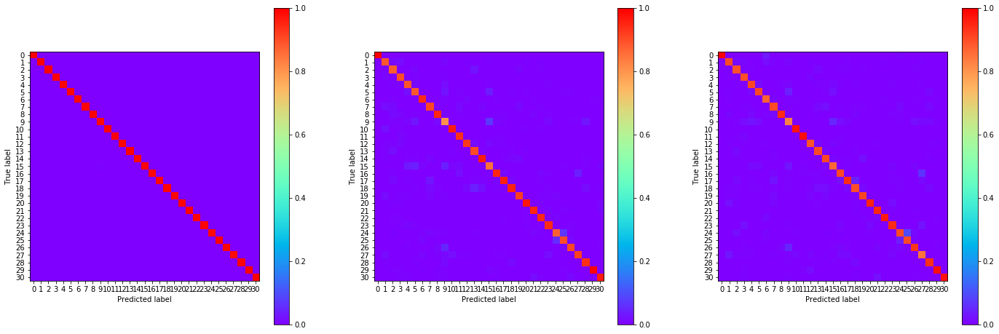

02:13:36.770202
#261 [Train: 0.021] [Test: 0.425] [Valid: 0.412]
#261 [Train: 0.994] [Test: 0.922] [Valid: 0.920]


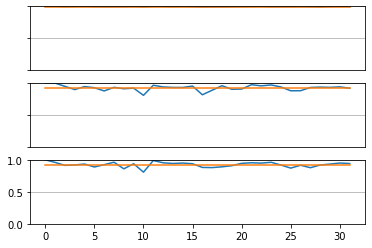

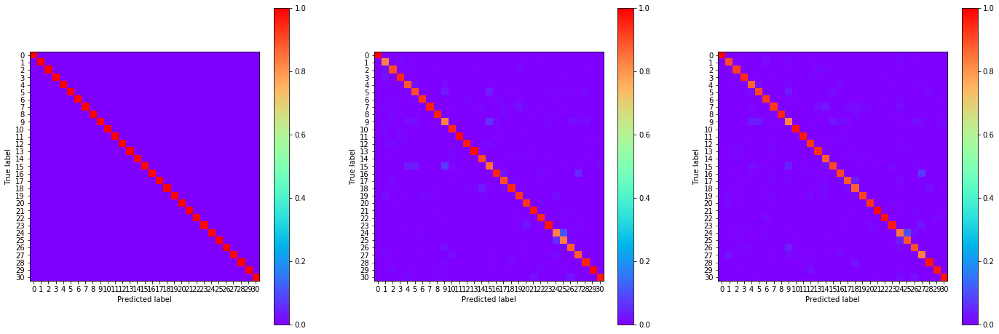

02:14:18.233506
#262 [Train: 0.023] [Test: 0.400] [Valid: 0.417]
#262 [Train: 0.993] [Test: 0.925] [Valid: 0.918]


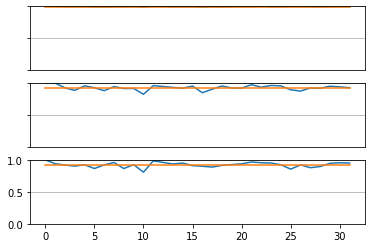

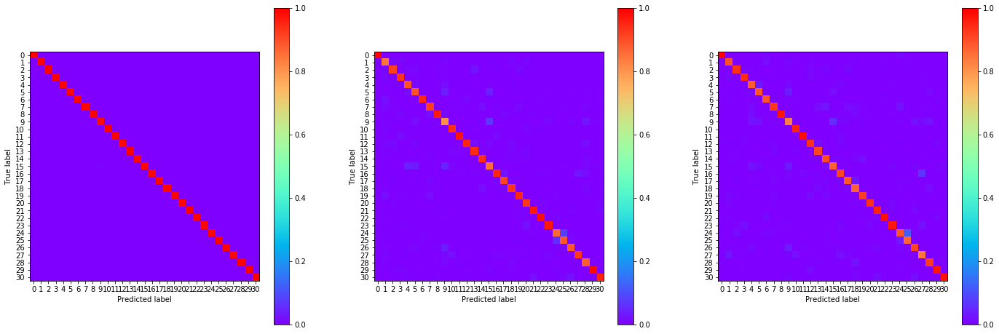

02:15:00.821571
#263 [Train: 0.021] [Test: 0.436] [Valid: 0.433]
#263 [Train: 0.994] [Test: 0.924] [Valid: 0.915]


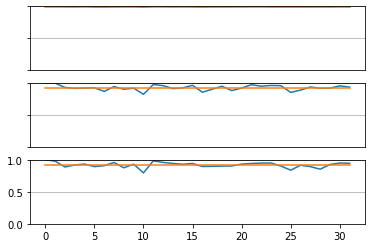

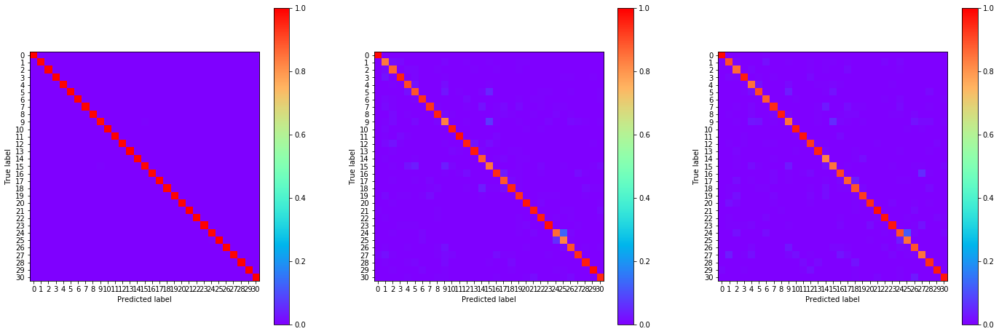

02:15:42.302259
#264 [Train: 0.021] [Test: 0.379] [Valid: 0.412]
#264 [Train: 0.994] [Test: 0.929] [Valid: 0.919]


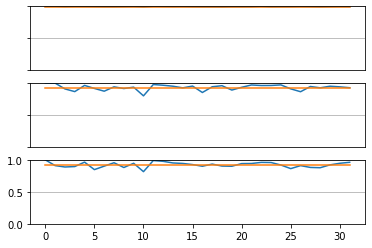

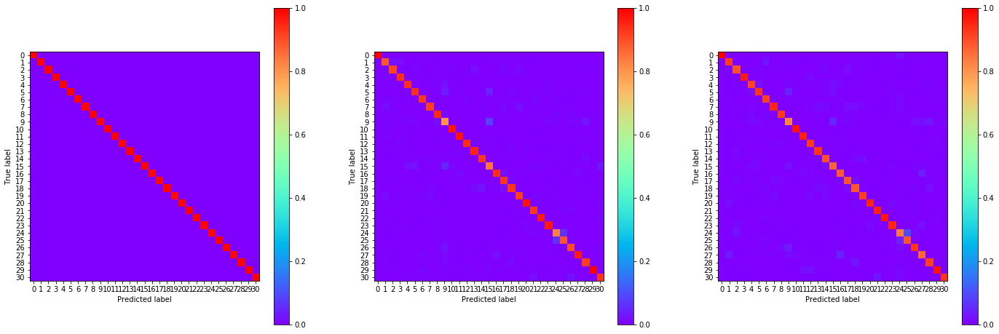

02:16:23.536330
#265 [Train: 0.019] [Test: 0.372] [Valid: 0.429]
#265 [Train: 0.995] [Test: 0.928] [Valid: 0.915]


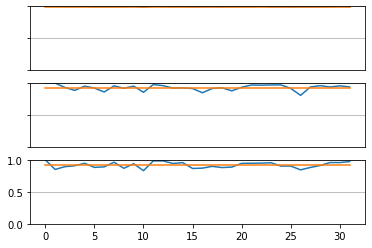

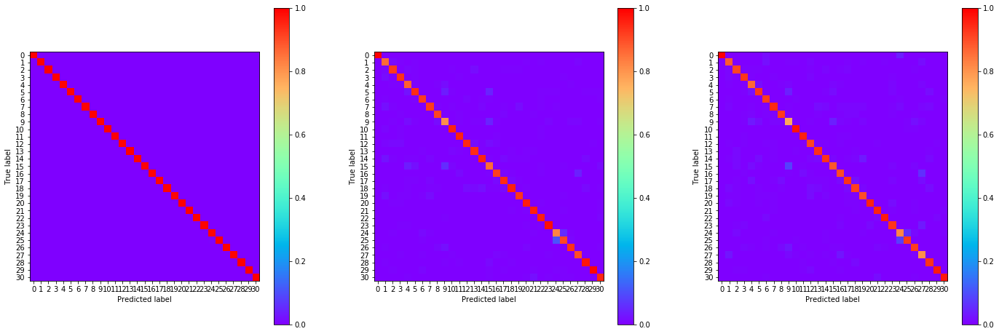

02:17:04.976280
#266 [Train: 0.022] [Test: 0.376] [Valid: 0.423]
#266 [Train: 0.994] [Test: 0.929] [Valid: 0.916]


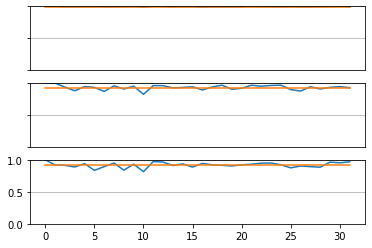

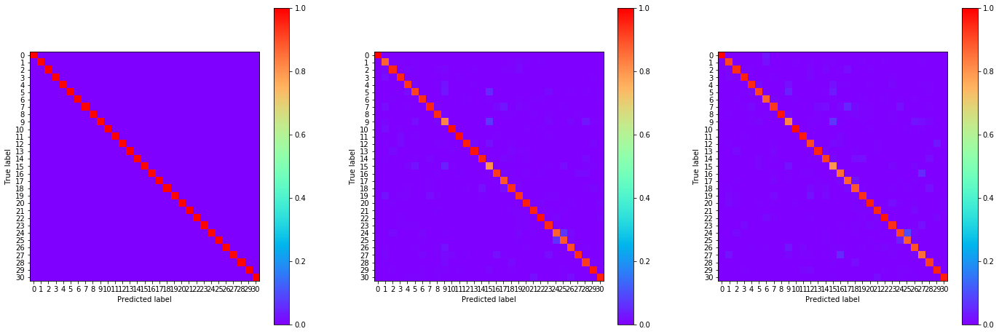

02:17:46.681980
#267 [Train: 0.020] [Test: 0.379] [Valid: 0.414]
#267 [Train: 0.995] [Test: 0.926] [Valid: 0.917]


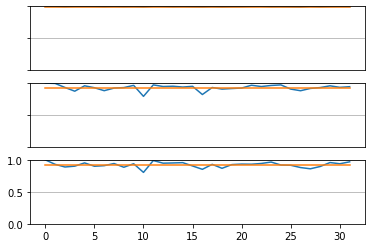

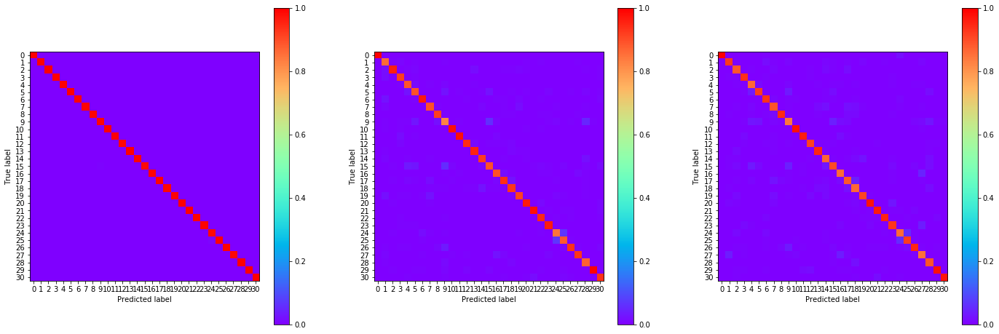

02:18:27.974703
#268 [Train: 0.023] [Test: 0.406] [Valid: 0.415]
#268 [Train: 0.994] [Test: 0.925] [Valid: 0.919]


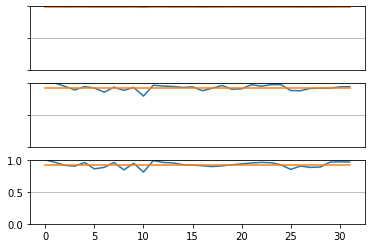

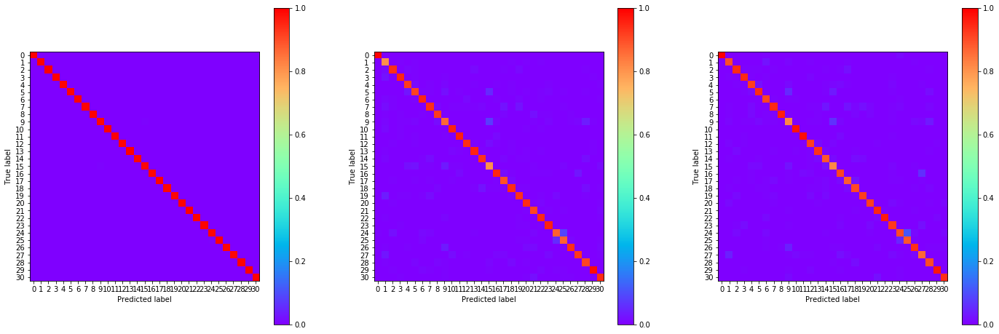

02:19:09.650971
#269 [Train: 0.019] [Test: 0.409] [Valid: 0.404]
#269 [Train: 0.995] [Test: 0.925] [Valid: 0.920]


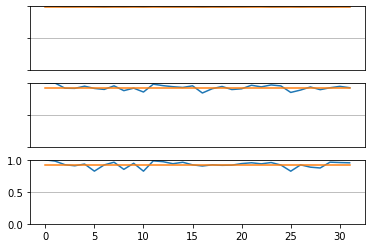

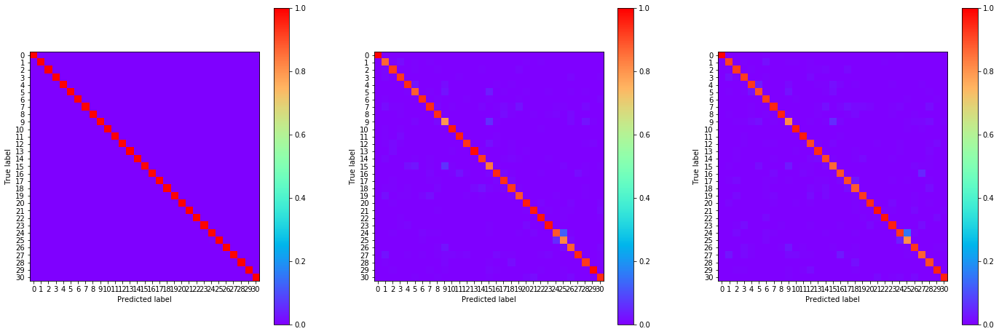

02:19:50.837442
#270 [Train: 0.019] [Test: 0.399] [Valid: 0.423]
#270 [Train: 0.995] [Test: 0.922] [Valid: 0.918]


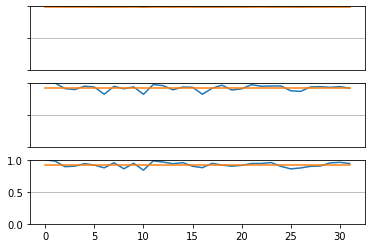

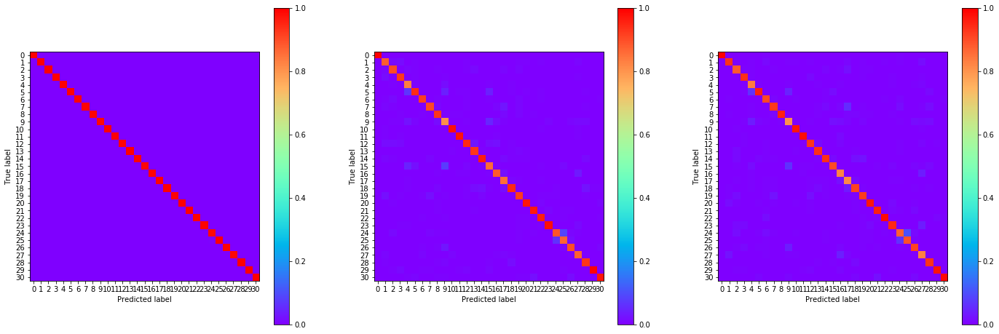

02:20:32.540436
#271 [Train: 0.023] [Test: 0.386] [Valid: 0.401]
#271 [Train: 0.993] [Test: 0.925] [Valid: 0.919]


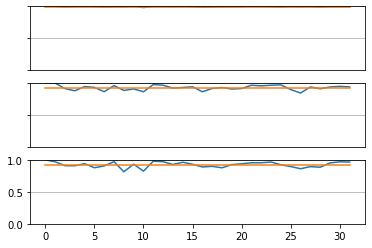

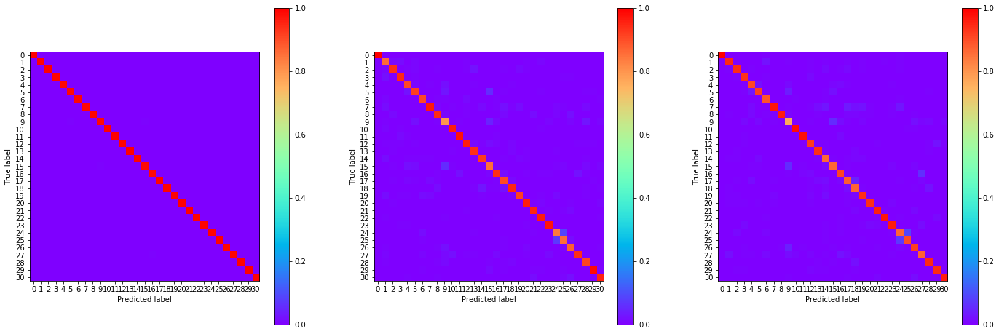

02:21:14.467295
#272 [Train: 0.021] [Test: 0.405] [Valid: 0.418]
#272 [Train: 0.994] [Test: 0.926] [Valid: 0.921]


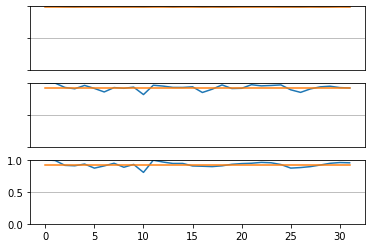

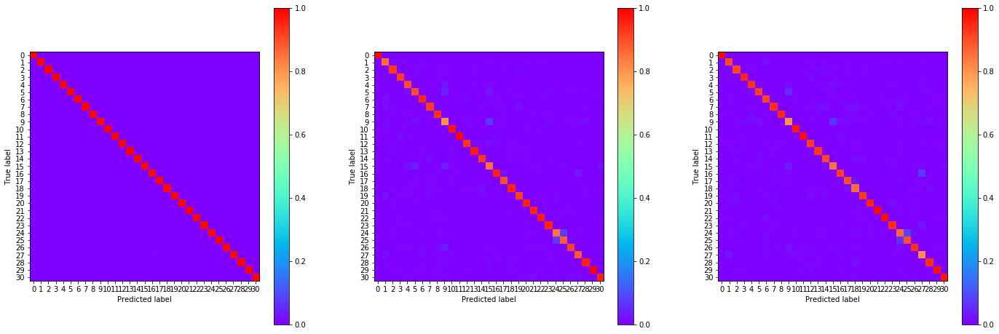

02:21:55.816217
#273 [Train: 0.018] [Test: 0.405] [Valid: 0.457]
#273 [Train: 0.995] [Test: 0.923] [Valid: 0.913]


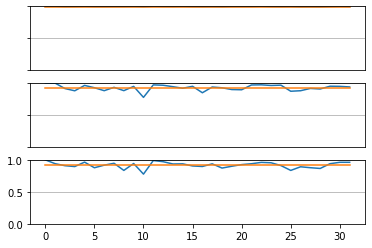

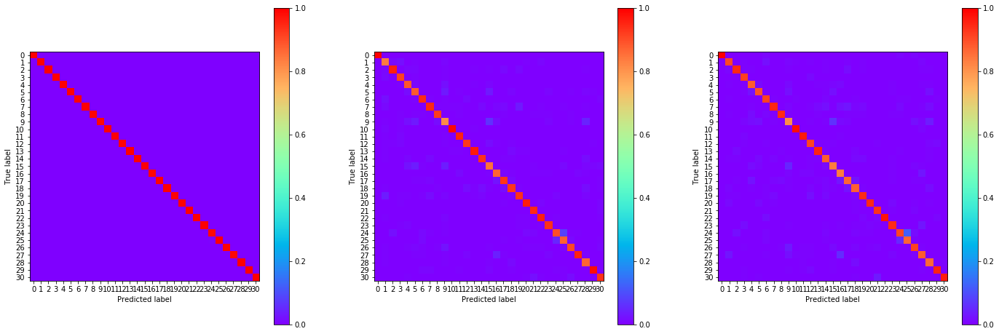

02:22:37.890233
#274 [Train: 0.023] [Test: 0.398] [Valid: 0.425]
#274 [Train: 0.993] [Test: 0.925] [Valid: 0.918]


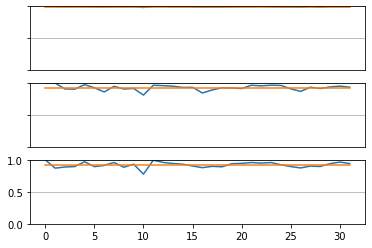

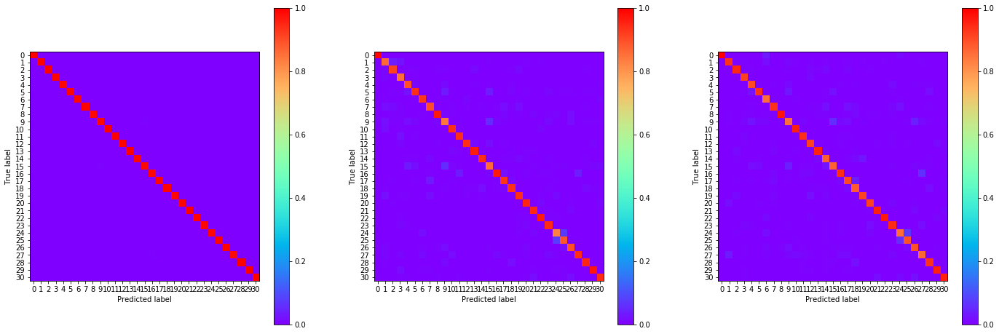

02:23:20.033184
#275 [Train: 0.019] [Test: 0.383] [Valid: 0.421]
#275 [Train: 0.995] [Test: 0.927] [Valid: 0.918]


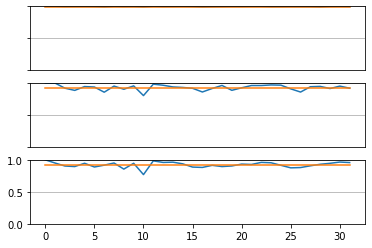

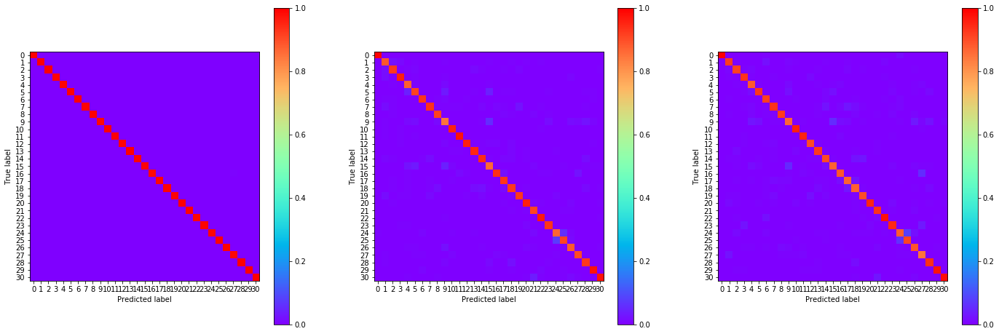

02:24:01.272765
#276 [Train: 0.020] [Test: 0.410] [Valid: 0.419]
#276 [Train: 0.994] [Test: 0.923] [Valid: 0.920]


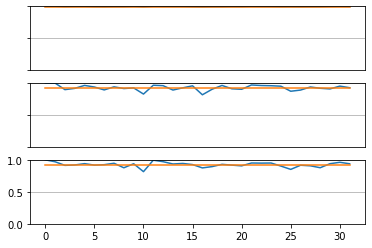

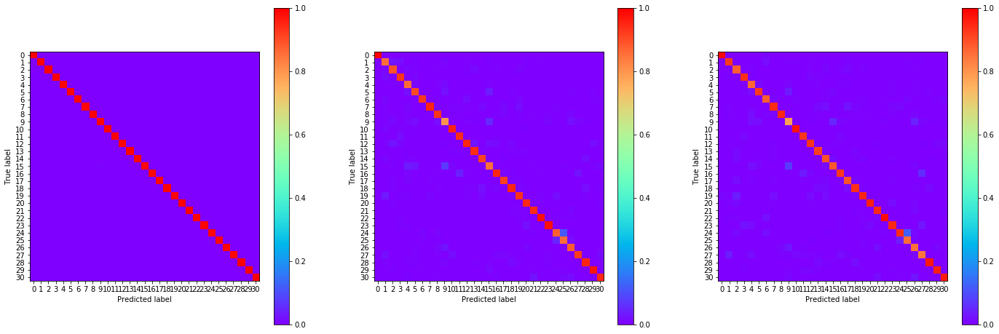

02:24:42.730038
#277 [Train: 0.018] [Test: 0.371] [Valid: 0.415]
#277 [Train: 0.995] [Test: 0.927] [Valid: 0.921]


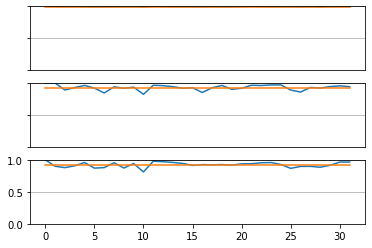

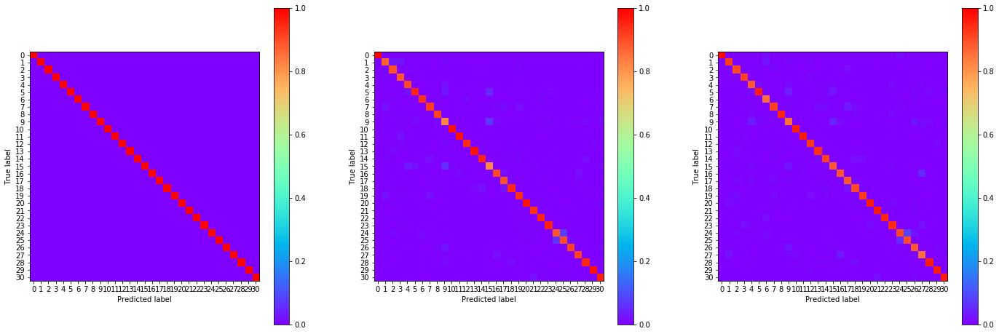

02:25:24.281880
#278 [Train: 0.019] [Test: 0.372] [Valid: 0.409]
#278 [Train: 0.995] [Test: 0.927] [Valid: 0.918]


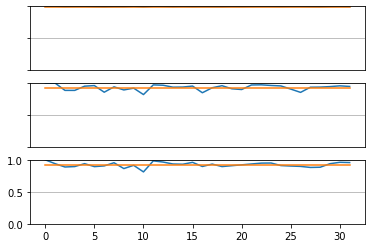

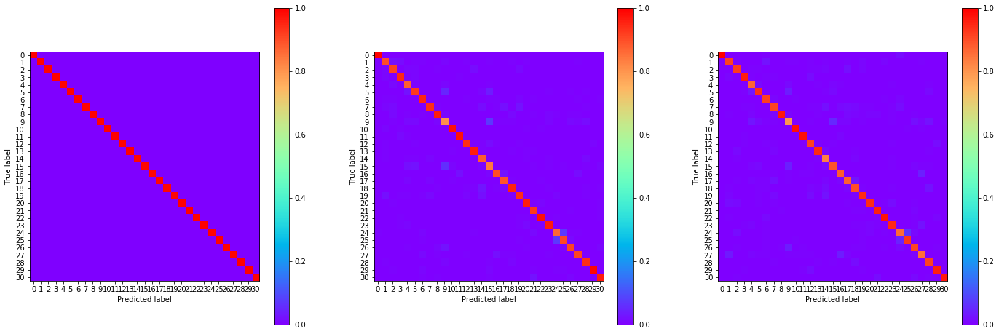

02:26:05.747714
#279 [Train: 0.016] [Test: 0.397] [Valid: 0.400]
#279 [Train: 0.996] [Test: 0.930] [Valid: 0.923]


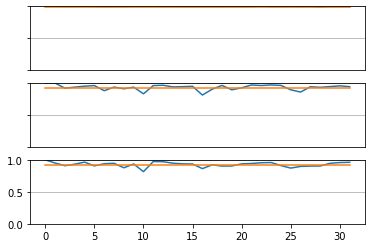

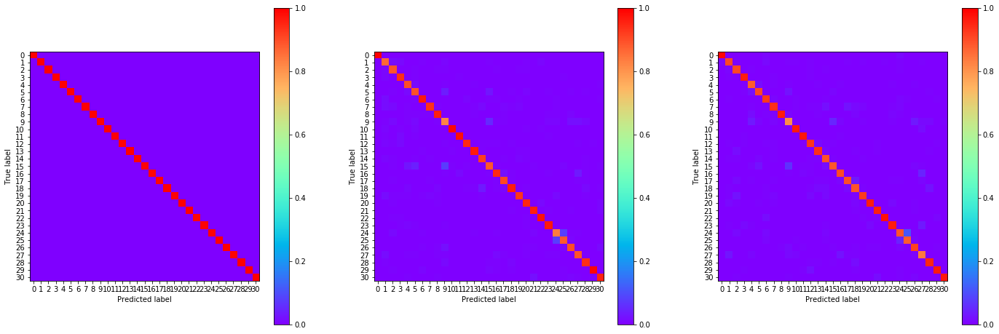

02:26:47.396400
#280 [Train: 0.018] [Test: 0.388] [Valid: 0.435]
#280 [Train: 0.995] [Test: 0.927] [Valid: 0.919]


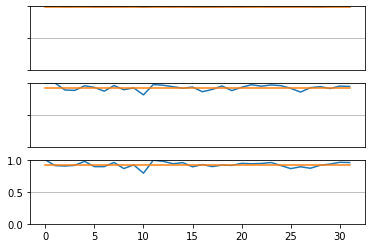

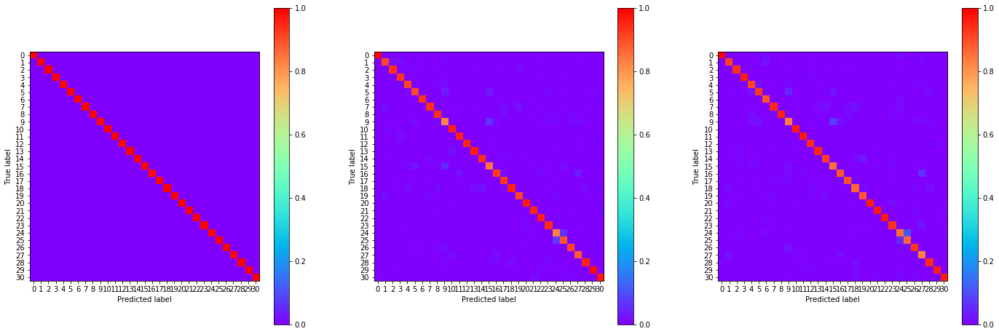

02:27:29.157598
#281 [Train: 0.017] [Test: 0.408] [Valid: 0.452]
#281 [Train: 0.995] [Test: 0.925] [Valid: 0.917]


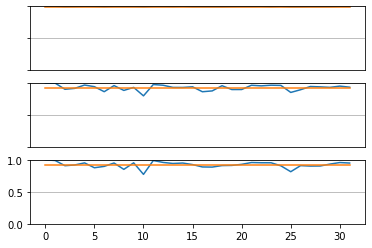

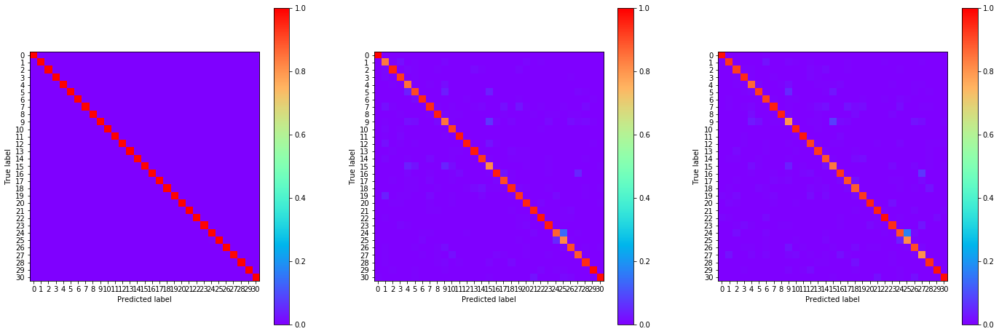

02:28:11.050829
#282 [Train: 0.019] [Test: 0.411] [Valid: 0.439]
#282 [Train: 0.995] [Test: 0.926] [Valid: 0.921]


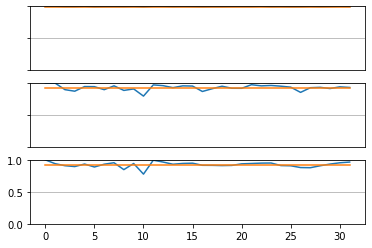

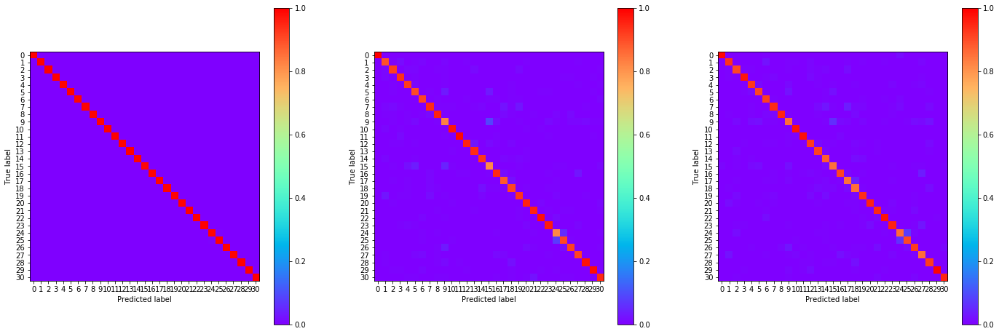

02:28:52.771095
#283 [Train: 0.023] [Test: 0.381] [Valid: 0.422]
#283 [Train: 0.993] [Test: 0.927] [Valid: 0.919]


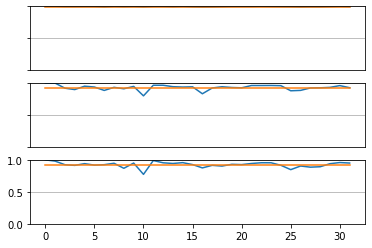

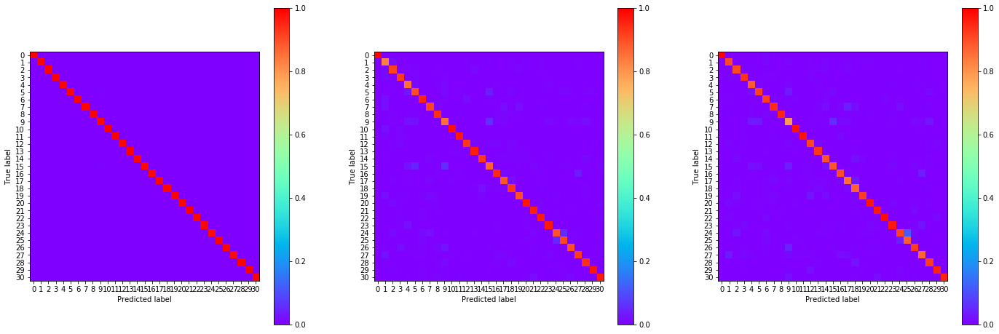

02:29:34.520059
#284 [Train: 0.019] [Test: 0.391] [Valid: 0.430]
#284 [Train: 0.994] [Test: 0.925] [Valid: 0.919]


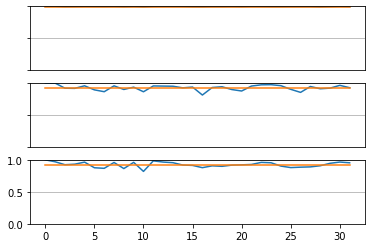

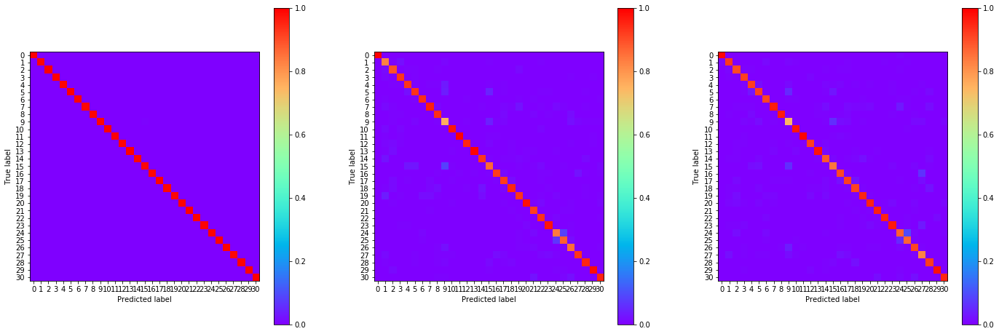

02:30:16.006020
#285 [Train: 0.016] [Test: 0.394] [Valid: 0.421]
#285 [Train: 0.995] [Test: 0.925] [Valid: 0.916]


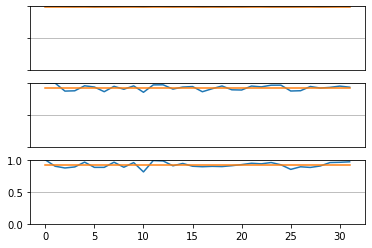

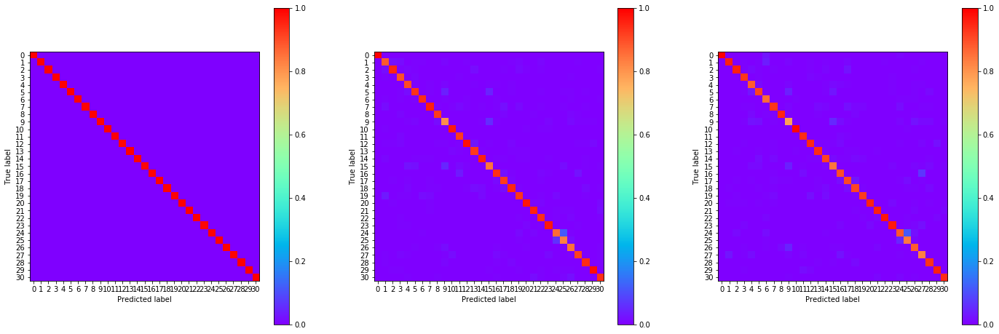

02:30:57.742022
#286 [Train: 0.015] [Test: 0.439] [Valid: 0.442]
#286 [Train: 0.996] [Test: 0.925] [Valid: 0.919]


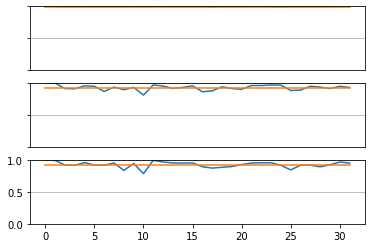

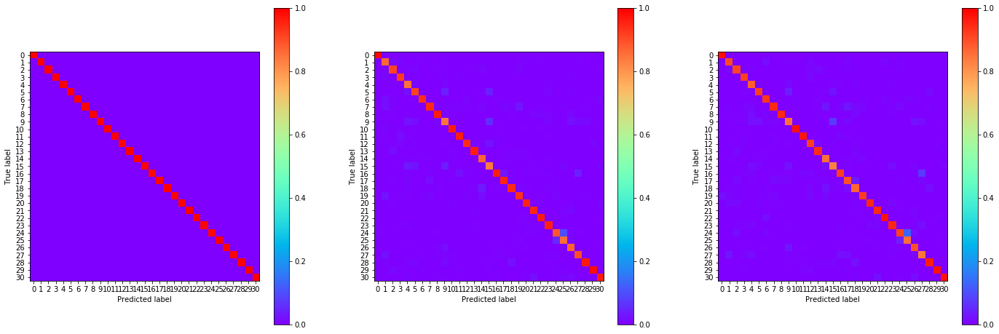

02:31:39.061606
#287 [Train: 0.015] [Test: 0.398] [Valid: 0.440]
#287 [Train: 0.996] [Test: 0.927] [Valid: 0.918]


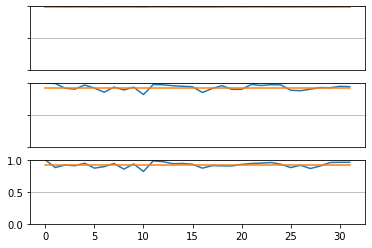

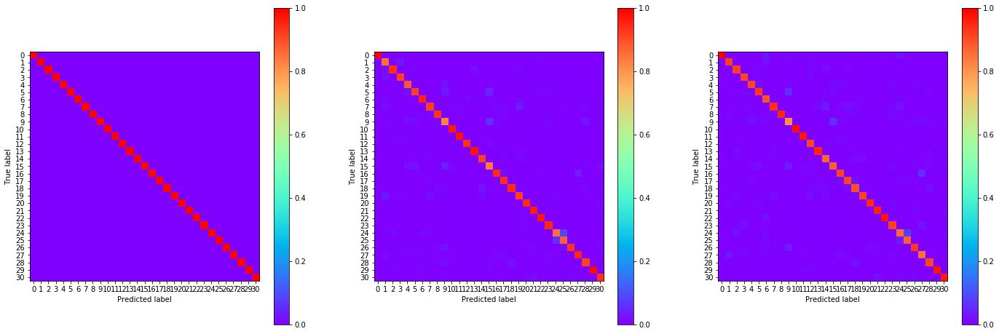

02:32:21.313478
#288 [Train: 0.012] [Test: 0.391] [Valid: 0.434]
#288 [Train: 0.997] [Test: 0.923] [Valid: 0.919]


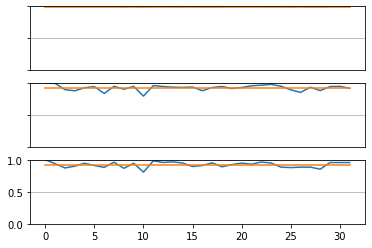

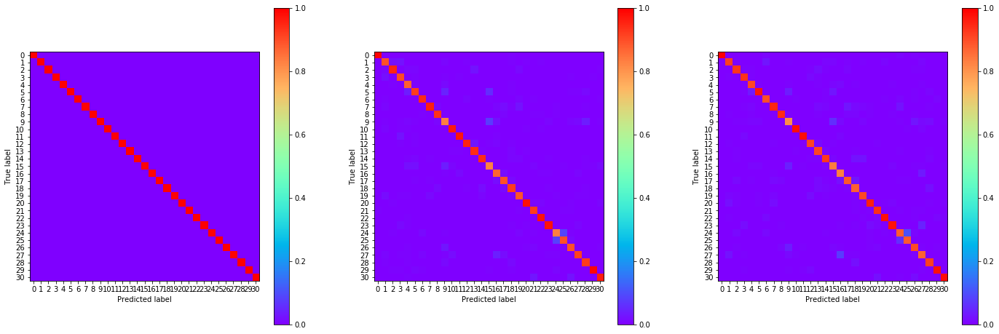

02:33:03.447863
#289 [Train: 0.013] [Test: 0.419] [Valid: 0.457]
#289 [Train: 0.997] [Test: 0.924] [Valid: 0.918]


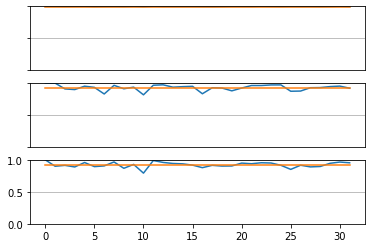

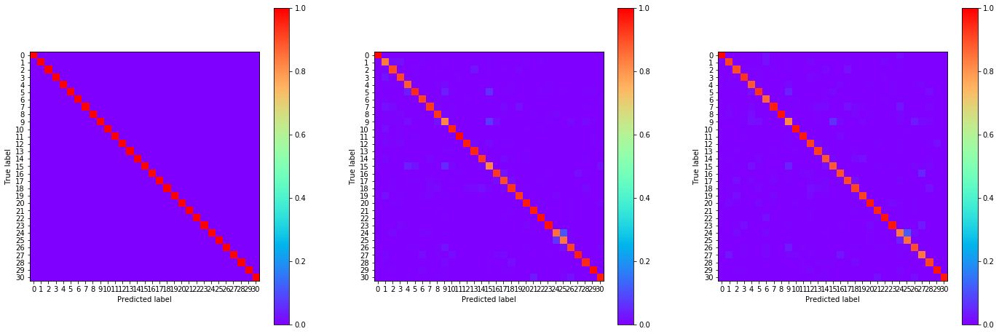

02:33:45.010356
#290 [Train: 0.016] [Test: 0.416] [Valid: 0.451]
#290 [Train: 0.995] [Test: 0.922] [Valid: 0.917]


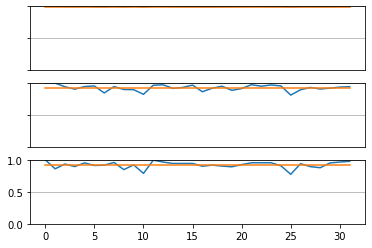

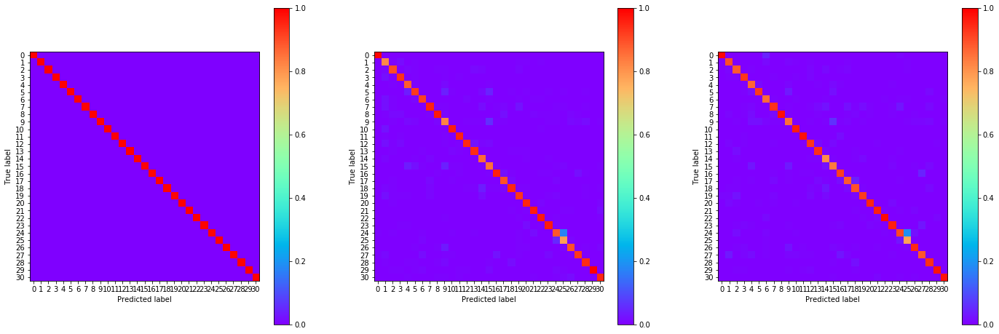

02:34:26.460417
#291 [Train: 0.015] [Test: 0.408] [Valid: 0.459]
#291 [Train: 0.996] [Test: 0.926] [Valid: 0.919]


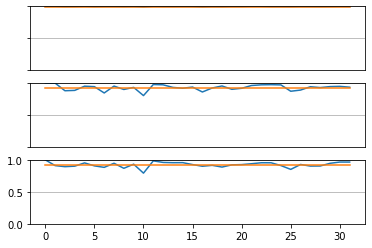

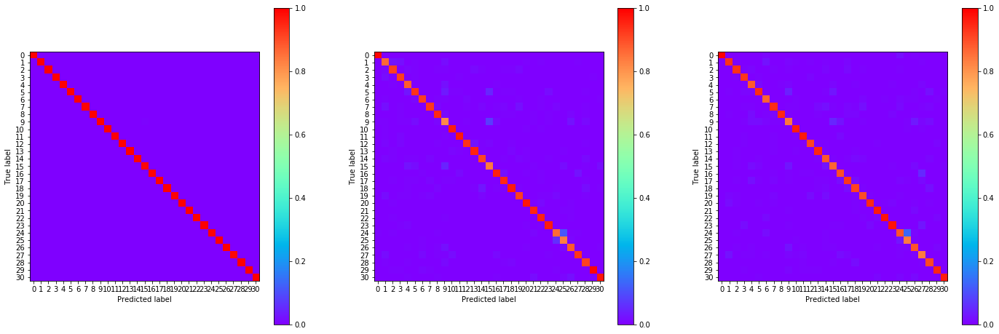

02:35:08.277513
#292 [Train: 0.015] [Test: 0.425] [Valid: 0.414]
#292 [Train: 0.996] [Test: 0.925] [Valid: 0.923]


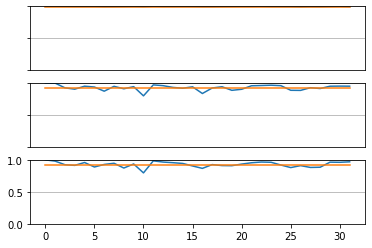

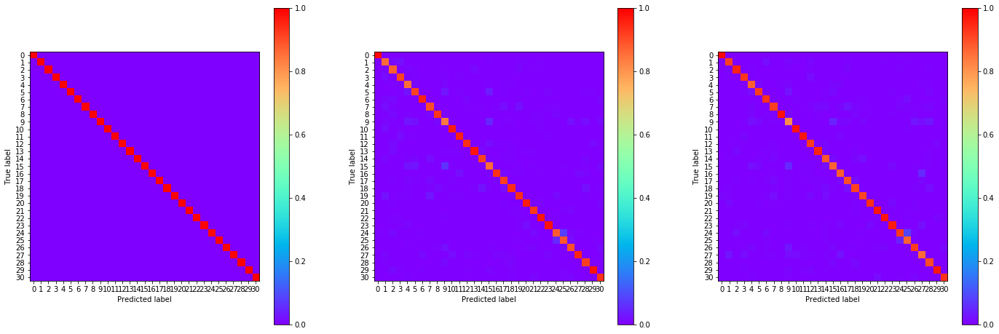

02:35:49.249082
#293 [Train: 0.016] [Test: 0.428] [Valid: 0.450]
#293 [Train: 0.995] [Test: 0.923] [Valid: 0.918]


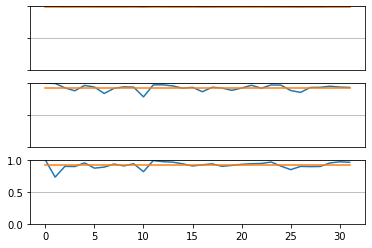

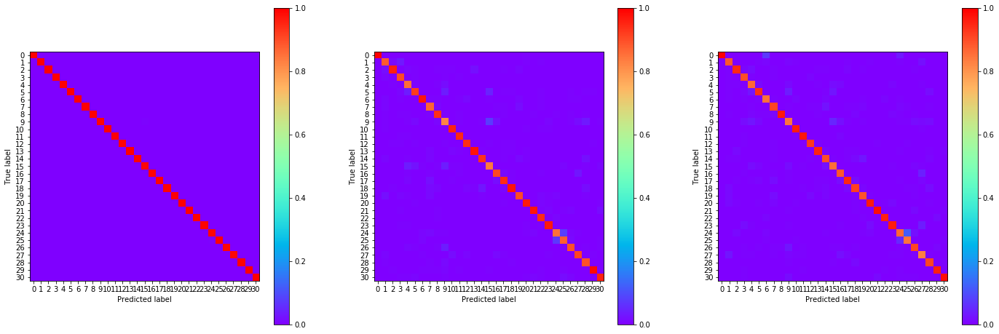

02:36:30.850161
#294 [Train: 0.019] [Test: 0.412] [Valid: 0.428]
#294 [Train: 0.994] [Test: 0.928] [Valid: 0.918]


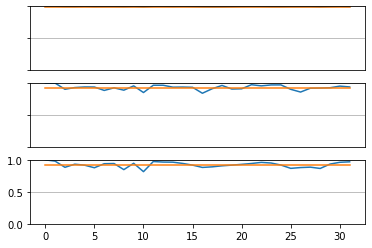

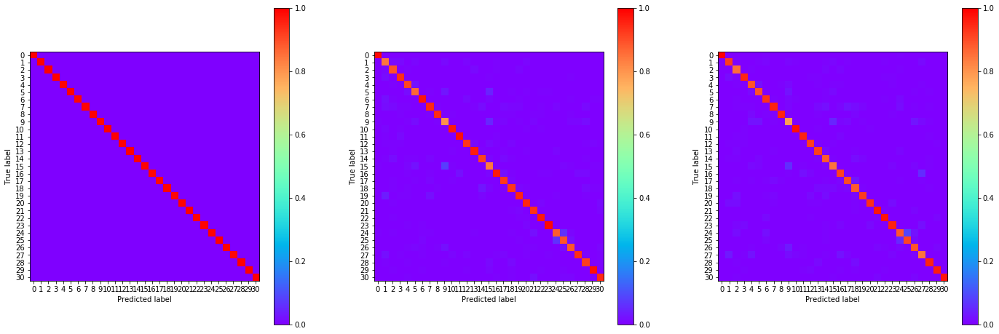

02:37:12.479924
#295 [Train: 0.016] [Test: 0.419] [Valid: 0.436]
#295 [Train: 0.995] [Test: 0.926] [Valid: 0.919]


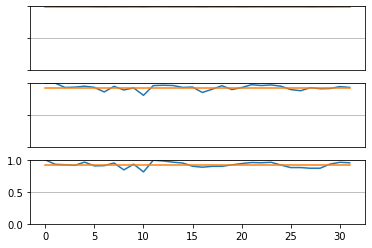

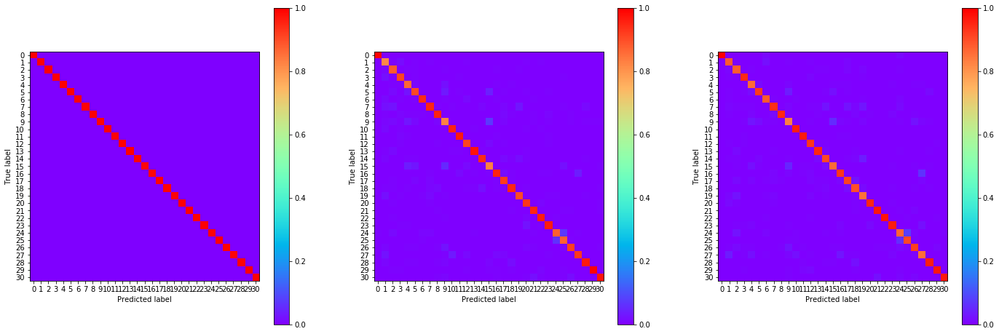

02:37:53.572975
#296 [Train: 0.011] [Test: 0.383] [Valid: 0.418]
#296 [Train: 0.997] [Test: 0.930] [Valid: 0.922]


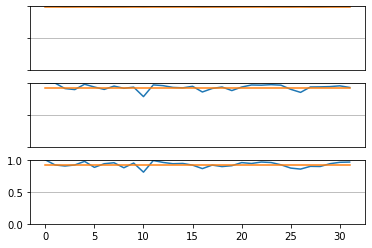

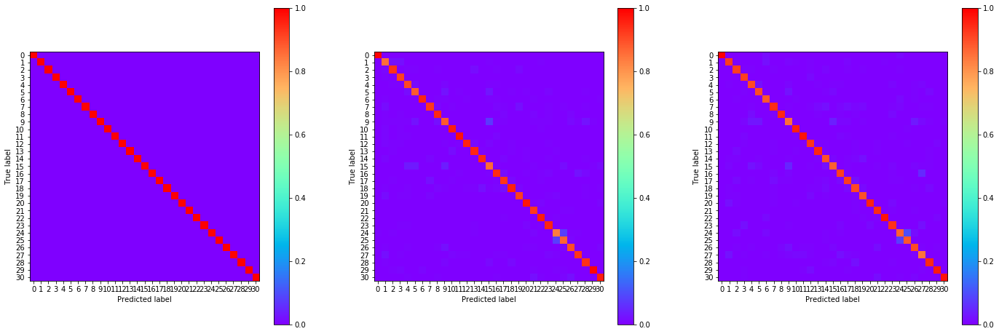

02:38:35.010729
#297 [Train: 0.015] [Test: 0.388] [Valid: 0.443]
#297 [Train: 0.996] [Test: 0.927] [Valid: 0.916]


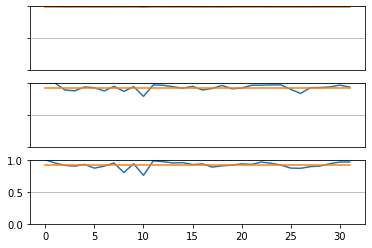

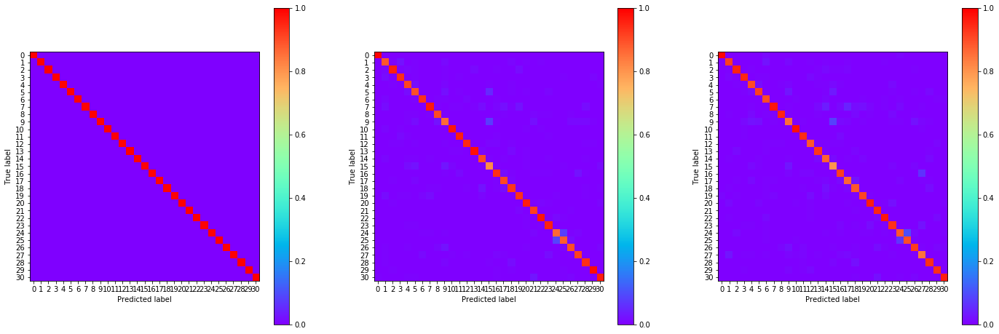

02:39:16.797151
#298 [Train: 0.013] [Test: 0.399] [Valid: 0.435]
#298 [Train: 0.997] [Test: 0.928] [Valid: 0.918]


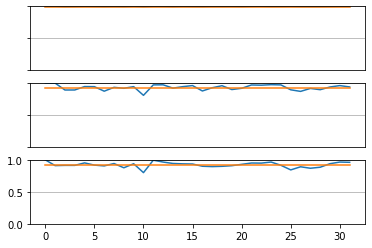

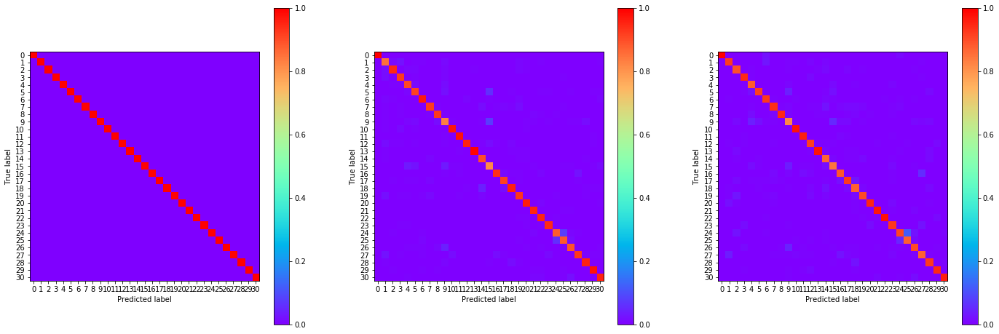

02:39:58.403803
#299 [Train: 0.012] [Test: 0.413] [Valid: 0.445]
#299 [Train: 0.997] [Test: 0.926] [Valid: 0.921]


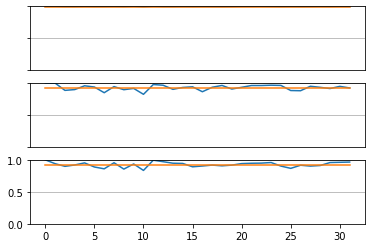

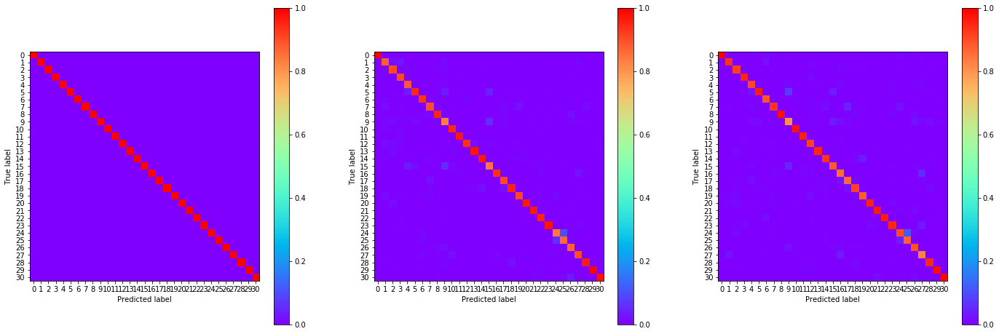

In [20]:
MAX_EPOCH = 300

writer = SummaryWriter(log_dir=run_name)

for epoch in range(MAX_EPOCH):
    training_loss_list = list()
    batch_generator = dataset_loader_training.batch_generator()
    model.train()
    
    correct_num = 0
    total_num = 0
    
#     result_matrix_train = np.zeros([31, 2])
    result_matrix_train = np.zeros([32, 2])
    result_matrix_train[0, :] = [1, 1]
    y_pred_train = list()
    y_true_train = list()

    for (batch, label) in batch_generator:
        optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
        loss.backward()
        training_loss_list.append(loss.item())
        optimizer.step()
        
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_train += list(label)
        y_pred_train += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_train[label, 0] += 1
            if result:
                result_matrix_train[label, 1] += 1
        
    acc_train = correct_num / total_num

    testing_loss_list = list()

    batch_generator = dataset_loader_testing.batch_generator()

    model.eval()
    
    correct_num = 0
    total_num = 0
    
#   result_matrix_test = np.zeros([31, 2])
    result_matrix_test = np.zeros([32, 2])
    result_matrix_test[0, :] = [1, 1]
    y_pred_test = list()
    y_true_test = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label).to(device))
#         loss.backward()
        testing_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_test += list(label)
        y_pred_test += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_test[label, 0] += 1
            if result:
                result_matrix_test[label, 1] += 1
        
    acc_test = correct_num / total_num

    validation_loss_list = list()

    batch_generator = dataset_loader_validation.batch_generator()
    
    correct_num = 0
    total_num = 0
    
#     result_matrix_eval = np.zeros([31, 2])
    result_matrix_eval = np.zeros([32, 2])
    result_matrix_eval[0, :] = [1, 1]
    y_pred_eval = list()
    y_true_eval = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
#         loss.backward()
        validation_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_eval += list(label)
        y_pred_eval += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_eval[label, 0] += 1
            if result:
                result_matrix_eval[label, 1] += 1
        
    acc_valid = correct_num / total_num
    
    training_loss_mean = np.mean(training_loss_list)
    testing_loss_mean = np.mean(testing_loss_list)
    validation_loss_mean = np.mean(validation_loss_list)
    
    print(datetime.datetime.now().time())
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, training_loss_mean, testing_loss_mean, validation_loss_mean))
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, acc_train, acc_test, acc_valid))
    
#     print(result_matrix_train)
#     print(result_matrix_test)
#     print(result_matrix_eval)
    
    fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True)
    axes[0].plot(result_matrix_train[:, 1] / result_matrix_train[:, 0])
    axes[0].plot(np.ones(len(result_matrix_train)) * acc_train)
    axes[0].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[0].set_ylim([0, 1])
    axes[0].yaxis.grid(True)
                 
    axes[1].plot(result_matrix_test[:, 1] / result_matrix_test[:, 0])
    axes[1].plot(np.ones(len(result_matrix_test)) * acc_test)
    axes[1].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[1].set_ylim([0, 1])
    axes[1].yaxis.grid(True)
                 
    axes[2].plot(result_matrix_eval[:, 1] / result_matrix_eval[:, 0])
    axes[2].plot(np.ones(len(result_matrix_eval)) * acc_valid)
    axes[2].set_ylim([0, 1])
    axes[2].yaxis.grid(True)
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))
    cm = confusion_matrix(y_true_train, y_pred_train, normalize='pred')
#     axes[0].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[0], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[0].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_test, y_pred_test, normalize='pred')
#     axes[1].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[1], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[1].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_eval, y_pred_eval, normalize='pred')
#     im = axes[2].imshow(cm)
#     plt.colorbar(im)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(32))
    disp.plot(include_values=False, ax=axes[2], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[2].get_images():
        im.set_clim(0, 1)
    
    plt.show()
    
    writer.add_scalar('Loss/Train', training_loss_mean, epoch)
    writer.add_scalar('Loss/Test', testing_loss_mean, epoch)
    writer.add_scalar('Loss/Valid', validation_loss_mean, epoch)
    writer.add_scalar('Acc/Train', acc_train, epoch)
    writer.add_scalar('Acc/Test', acc_test, epoch)
    writer.add_scalar('Acc/Valid', acc_valid, epoch)
    

In [21]:
# output = model(torch.cuda.FloatTensor(batch))

In [22]:
# output.shape

In [23]:
# torch.tensor(batch).unsqueeze_(1).shape

In [24]:
# input_tensor = torch.tensor(batch).to(device).float()
# input_tensor = input_tensor.transpose(1, 2)
# model(input_tensor).shape

In [25]:
# for batch, label_list in batch_generator:
#     print(batch.shape[0])
#     plt.figure(figsize=(5, 1))
#     plt.plot(label_list)
#     plt.show()
    
#     plt.figure(figsize=(6, 18))
# #     plt.imshow(batch[0], aspect='auto')
#     plt.imshow(batch[0])
#     plt.show()
    
#     break